In [1]:
%load_ext autoreload
%autoreload 2
import numpy as np
from matplotlib import pyplot as plt
import reg_helper as RHelper
import pandas as pd

https://towardsdatascience.com/an-introductory-example-of-bayesian-optimization-in-python-with-hyperopt-aae40fff4ff0

In [2]:
folder = 'data/'
X = np.load(folder+'X_all.npy')
y = np.load(folder+'y_all.npy').reshape(-1)

In [3]:
# Split entre train y val
X_train = X[:len(X)//2]
y_train = y[:len(y)//2]
X_val = X[len(X)//2:]
y_val = y[len(y)//2:]

In [4]:
from lightgbm import LGBMClassifier

In [6]:
from hyperopt import hp, tpe
from hyperopt.fmin import fmin
from hyperopt import Trials
import hyperopt

In [9]:
def objective(params):
    n_estimators = 2000
    clf = LGBMClassifier(
        n_estimators=n_estimators,
        **params
    )
    clf.fit(X_train, y_train, eval_set = [(X_val, y_val)], early_stopping_rounds=100)
    accuracy = np.array(clf.score(X_val, y_val))
    return -accuracy

In [10]:
space = {
    'max_depth': hp.choice('max_depth', list(np.arange(1, 31))),
    'learning_rate': hp.loguniform('learning_rate', -6, -1),
    'reg_lambda': hp.loguniform('reg_lambda', -8, -3),
    'min_child_samples': hp.choice('min_child_samples', list(np.arange(1, 20))),
    'min_child_weight': hp.loguniform('min_child_weight', -8, -1)    
}

tpe_trials = Trials()

best = fmin(fn=objective,
            space=space,
            trials = tpe_trials,
            verbose=1,
            algo=hyperopt.tpe.suggest,
            # algo=hyperopt.rand.suggest,
            return_argmin=False,
            max_evals=1000)

[1]	valid_0's binary_logloss: 0.716737                  
[2]	valid_0's binary_logloss: 0.715068                  
[3]	valid_0's binary_logloss: 0.713367                  
[4]	valid_0's binary_logloss: 0.71168                   
[5]	valid_0's binary_logloss: 0.710008                  
[6]	valid_0's binary_logloss: 0.708349                  
[7]	valid_0's binary_logloss: 0.706705                  
[8]	valid_0's binary_logloss: 0.705074                  
[9]	valid_0's binary_logloss: 0.703456                  
[10]	valid_0's binary_logloss: 0.701852                 
[11]	valid_0's binary_logloss: 0.700261                 
[12]	valid_0's binary_logloss: 0.698684                 
[13]	valid_0's binary_logloss: 0.697119                 
[14]	valid_0's binary_logloss: 0.695567                 
[15]	valid_0's binary_logloss: 0.694028                 
[16]	valid_0's binary_logloss: 0.692501                 
[17]	valid_0's binary_logloss: 0.690987                 
[18]	valid_0's binary_logloss: 

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[89]	valid_0's binary_logloss: 0.60928
[90]	valid_0's binary_logloss: 0.6084                   
[91]	valid_0's binary_logloss: 0.607578                 
[92]	valid_0's binary_logloss: 0.60671                  
[93]	valid_0's binary_logloss: 0.605899                 
[94]	valid_0's binary_logloss: 0.605044                 
[95]	valid_0's binary_logloss: 0.604244                 
[96]	valid_0's binary_logloss: 0.60345                  
[97]	valid_0's binary_logloss: 0.602612                 
[98]	valid_0's binary_logloss: 0.601768                 
[99]	valid_0's binary_logloss: 0.600941                 
[100]	valid_0's binary_logloss: 0.600168                
[101]	valid_0's binary_logloss: 0.599353                
[102]	valid_0's binary_logloss: 0.598526                
[103]	valid_0's binary_logloss: 0.597722                
[104]	valid_0's binary_logloss: 0.596909                
[105]	valid_0's binary_logloss: 0.596115                
[106]	valid_0's binary_logloss: 0.595311         

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[136]	valid_0's binary_logloss: 0.478967                                           
[137]	valid_0's binary_logloss: 0.479106                                           
[138]	valid_0's binary_logloss: 0.479397                                           
[139]	valid_0's binary_logloss: 0.47863                                            
[140]	valid_0's binary_logloss: 0.477856                                           
[141]	valid_0's binary_logloss: 0.477621                                           
[142]	valid_0's binary_logloss: 0.478164                                           
[143]	valid_0's binary_logloss: 0.478343                                           
[144]	valid_0's binary_logloss: 0.477954                                           
[145]	valid_0's binary_logloss: 0.477185                                           
[146]	valid_0's binary_logloss: 0.476444                                           
[147]	valid_0's binary_logloss: 0.474379                                    

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[108]	valid_0's binary_logloss: 0.708647                                           
[109]	valid_0's binary_logloss: 0.708643                                           
[110]	valid_0's binary_logloss: 0.708492                                           
[111]	valid_0's binary_logloss: 0.708489                                           
[112]	valid_0's binary_logloss: 0.708338                                           
[113]	valid_0's binary_logloss: 0.708335                                           
[114]	valid_0's binary_logloss: 0.708185                                           
[115]	valid_0's binary_logloss: 0.708183                                           
[116]	valid_0's binary_logloss: 0.708033                                           
[117]	valid_0's binary_logloss: 0.708032                                           
[118]	valid_0's binary_logloss: 0.707883                                           
[119]	valid_0's binary_logloss: 0.707883                                    

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[138]	valid_0's binary_logloss: 0.595694                                           
[139]	valid_0's binary_logloss: 0.595501                                           
[140]	valid_0's binary_logloss: 0.59587                                            
[141]	valid_0's binary_logloss: 0.596967                                           
[142]	valid_0's binary_logloss: 0.596995                                           
[143]	valid_0's binary_logloss: 0.596811                                           
[144]	valid_0's binary_logloss: 0.597911                                           
[145]	valid_0's binary_logloss: 0.597954                                           
[146]	valid_0's binary_logloss: 0.598261                                           
[147]	valid_0's binary_logloss: 0.599338                                           
[148]	valid_0's binary_logloss: 0.599155                                           
[149]	valid_0's binary_logloss: 0.598979                                    

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[79]	valid_0's binary_logloss: 0.743249                                            
[80]	valid_0's binary_logloss: 0.748721                                            
[81]	valid_0's binary_logloss: 0.761043                                            
[82]	valid_0's binary_logloss: 0.767333                                            
[83]	valid_0's binary_logloss: 0.774313                                            
[84]	valid_0's binary_logloss: 0.779331                                            
[85]	valid_0's binary_logloss: 0.78647                                             
[86]	valid_0's binary_logloss: 0.79176                                             
[87]	valid_0's binary_logloss: 0.796754                                            
[88]	valid_0's binary_logloss: 0.803934                                            
[89]	valid_0's binary_logloss: 0.811178                                            
[90]	valid_0's binary_logloss: 0.818956                                     

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[99]	valid_0's binary_logloss: 0.500623                                            
[100]	valid_0's binary_logloss: 0.499644                                           
[101]	valid_0's binary_logloss: 0.498695                                           
[102]	valid_0's binary_logloss: 0.497776                                           
[103]	valid_0's binary_logloss: 0.497173                                           
[104]	valid_0's binary_logloss: 0.496824                                           
[105]	valid_0's binary_logloss: 0.496254                                           
[106]	valid_0's binary_logloss: 0.496172                                           
[107]	valid_0's binary_logloss: 0.495863                                           
[108]	valid_0's binary_logloss: 0.495893                                           
[109]	valid_0's binary_logloss: 0.495372                                           
[110]	valid_0's binary_logloss: 0.495425                                    

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[86]	valid_0's binary_logloss: 0.601195                                            
[87]	valid_0's binary_logloss: 0.60251                                             
[88]	valid_0's binary_logloss: 0.606327                                            
[89]	valid_0's binary_logloss: 0.607983                                            
[90]	valid_0's binary_logloss: 0.608385                                            
[91]	valid_0's binary_logloss: 0.613127                                            
[92]	valid_0's binary_logloss: 0.613685                                            
[93]	valid_0's binary_logloss: 0.616681                                            
[94]	valid_0's binary_logloss: 0.620036                                            
[95]	valid_0's binary_logloss: 0.625223                                            
[96]	valid_0's binary_logloss: 0.627775                                            
[97]	valid_0's binary_logloss: 0.631682                                     

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[153]	valid_0's binary_logloss: 0.712997
[154]	valid_0's binary_logloss: 0.712997                                           
[155]	valid_0's binary_logloss: 0.712998                                           
[156]	valid_0's binary_logloss: 0.712998                                           
[157]	valid_0's binary_logloss: 0.712999                                           
[158]	valid_0's binary_logloss: 0.713                                              
[159]	valid_0's binary_logloss: 0.713001                                           
[160]	valid_0's binary_logloss: 0.713002                                           
[161]	valid_0's binary_logloss: 0.713003                                           
[162]	valid_0's binary_logloss: 0.713005                                           
[163]	valid_0's binary_logloss: 0.713007                                           
[164]	valid_0's binary_logloss: 0.713008                                           
[165]	valid_0's binary_logloss: 0.7

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[98]	valid_0's binary_logloss: 0.671612                                            
[99]	valid_0's binary_logloss: 0.671406                                            
[100]	valid_0's binary_logloss: 0.670355                                           
[101]	valid_0's binary_logloss: 0.670612                                           
[102]	valid_0's binary_logloss: 0.670188                                           
[103]	valid_0's binary_logloss: 0.669989                                           
[104]	valid_0's binary_logloss: 0.668957                                           
[105]	valid_0's binary_logloss: 0.668611                                           
[106]	valid_0's binary_logloss: 0.668753                                           
[107]	valid_0's binary_logloss: 0.668561                                           
[108]	valid_0's binary_logloss: 0.667552                                           
[109]	valid_0's binary_logloss: 0.667148                                    

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[116]	valid_0's binary_logloss: 0.465745                                           
[117]	valid_0's binary_logloss: 0.464919                                           
[118]	valid_0's binary_logloss: 0.466167                                           
[119]	valid_0's binary_logloss: 0.465833                                           
[120]	valid_0's binary_logloss: 0.465319                                           
[121]	valid_0's binary_logloss: 0.464571                                           
[122]	valid_0's binary_logloss: 0.464922                                           
[123]	valid_0's binary_logloss: 0.465092                                           
[124]	valid_0's binary_logloss: 0.464579                                           
[125]	valid_0's binary_logloss: 0.46535                                            
[126]	valid_0's binary_logloss: 0.464847                                           
[127]	valid_0's binary_logloss: 0.4647                                      

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[111]	valid_0's binary_logloss: 0.520837
[112]	valid_0's binary_logloss: 0.520236                                            
[113]	valid_0's binary_logloss: 0.519994                                            
[114]	valid_0's binary_logloss: 0.51879                                             
[115]	valid_0's binary_logloss: 0.518662                                            
[116]	valid_0's binary_logloss: 0.517511                                            
[117]	valid_0's binary_logloss: 0.514672                                            
[118]	valid_0's binary_logloss: 0.514168                                            
[119]	valid_0's binary_logloss: 0.511473                                            
[120]	valid_0's binary_logloss: 0.510349                                            
[121]	valid_0's binary_logloss: 0.507794                                            
[122]	valid_0's binary_logloss: 0.506745                                            
[123]	valid_0's binary_l

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[110]	valid_0's binary_logloss: 0.63426                                             
[111]	valid_0's binary_logloss: 0.633148                                            
[112]	valid_0's binary_logloss: 0.631248                                            
[113]	valid_0's binary_logloss: 0.630527                                            
[114]	valid_0's binary_logloss: 0.63477                                             
[115]	valid_0's binary_logloss: 0.635644                                            
[116]	valid_0's binary_logloss: 0.635468                                            
[117]	valid_0's binary_logloss: 0.634814                                            
[118]	valid_0's binary_logloss: 0.63899                                             
[119]	valid_0's binary_logloss: 0.638879                                            
[120]	valid_0's binary_logloss: 0.637016                                            
[121]	valid_0's binary_logloss: 0.638902                         

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[98]	valid_0's binary_logloss: 0.628556                                             
[99]	valid_0's binary_logloss: 0.627888                                             
[100]	valid_0's binary_logloss: 0.627183                                            
[101]	valid_0's binary_logloss: 0.626522                                            
[102]	valid_0's binary_logloss: 0.625864                                            
[103]	valid_0's binary_logloss: 0.625169                                            
[104]	valid_0's binary_logloss: 0.624517                                            
[105]	valid_0's binary_logloss: 0.623829                                            
[106]	valid_0's binary_logloss: 0.623184                                            
[107]	valid_0's binary_logloss: 0.622502                                            
[108]	valid_0's binary_logloss: 0.621864                                            
[109]	valid_0's binary_logloss: 0.621189                         

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[138]	valid_0's binary_logloss: 0.609857                                            
[139]	valid_0's binary_logloss: 0.610525                                            
[140]	valid_0's binary_logloss: 0.611243                                            
[141]	valid_0's binary_logloss: 0.611892                                            
[142]	valid_0's binary_logloss: 0.611424                                            
[143]	valid_0's binary_logloss: 0.612062                                            
[144]	valid_0's binary_logloss: 0.611603                                            
[145]	valid_0's binary_logloss: 0.612232                                            
[146]	valid_0's binary_logloss: 0.612969                                            
[147]	valid_0's binary_logloss: 0.61358                                             
[148]	valid_0's binary_logloss: 0.613089                                            
[149]	valid_0's binary_logloss: 0.613692                         

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[95]	valid_0's binary_logloss: 0.512793                                             
[96]	valid_0's binary_logloss: 0.513614                                             
[97]	valid_0's binary_logloss: 0.514438                                             
[98]	valid_0's binary_logloss: 0.512899                                             
[99]	valid_0's binary_logloss: 0.515735                                             
[100]	valid_0's binary_logloss: 0.516665                                            
[101]	valid_0's binary_logloss: 0.521083                                            
[102]	valid_0's binary_logloss: 0.521236                                            
[103]	valid_0's binary_logloss: 0.522035                                            
[104]	valid_0's binary_logloss: 0.52645                                             
[105]	valid_0's binary_logloss: 0.525673                                            
[106]	valid_0's binary_logloss: 0.526918                         

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[106]	valid_0's binary_logloss: 0.771591                                            
[107]	valid_0's binary_logloss: 0.772512                                            
[108]	valid_0's binary_logloss: 0.776206                                            
[109]	valid_0's binary_logloss: 0.780386                                            
[110]	valid_0's binary_logloss: 0.783709                                            
[111]	valid_0's binary_logloss: 0.78533                                             
[112]	valid_0's binary_logloss: 0.789948                                            
[113]	valid_0's binary_logloss: 0.793445                                            
[114]	valid_0's binary_logloss: 0.794346                                            
[115]	valid_0's binary_logloss: 0.802548                                            
[116]	valid_0's binary_logloss: 0.802852                                            
[117]	valid_0's binary_logloss: 0.806476                         

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[140]	valid_0's binary_logloss: 0.627559                                            
[141]	valid_0's binary_logloss: 0.627565                                            
[142]	valid_0's binary_logloss: 0.627279                                            
[143]	valid_0's binary_logloss: 0.62672                                             
[144]	valid_0's binary_logloss: 0.626731                                            
[145]	valid_0's binary_logloss: 0.626452                                            
[146]	valid_0's binary_logloss: 0.62591                                             
[147]	valid_0's binary_logloss: 0.625926                                            
[148]	valid_0's binary_logloss: 0.625653                                            
[149]	valid_0's binary_logloss: 0.62539                                             
[150]	valid_0's binary_logloss: 0.624868                                            
[151]	valid_0's binary_logloss: 0.624888                         

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[109]	valid_0's binary_logloss: 0.707319                                            
[110]	valid_0's binary_logloss: 0.70817                                             
[111]	valid_0's binary_logloss: 0.710266                                            
[112]	valid_0's binary_logloss: 0.711093                                            
[113]	valid_0's binary_logloss: 0.715524                                            
[114]	valid_0's binary_logloss: 0.712665                                            
[115]	valid_0's binary_logloss: 0.71212                                             
[116]	valid_0's binary_logloss: 0.712095                                            
[117]	valid_0's binary_logloss: 0.712905                                            
[118]	valid_0's binary_logloss: 0.717504                                            
[1]	valid_0's binary_logloss: 0.716919                                              
[2]	valid_0's binary_logloss: 0.715477                           

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[118]	valid_0's binary_logloss: 0.644457                                            
[119]	valid_0's binary_logloss: 0.643719                                            
[120]	valid_0's binary_logloss: 0.643666                                            
[121]	valid_0's binary_logloss: 0.643722                                            
[122]	valid_0's binary_logloss: 0.643001                                            
[123]	valid_0's binary_logloss: 0.643069                                            
[124]	valid_0's binary_logloss: 0.642354                                            
[125]	valid_0's binary_logloss: 0.642415                                            
[126]	valid_0's binary_logloss: 0.642481                                            
[127]	valid_0's binary_logloss: 0.641777                                            
[128]	valid_0's binary_logloss: 0.641853                                            
[129]	valid_0's binary_logloss: 0.64116                          

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[144]	valid_0's binary_logloss: 0.69472
[145]	valid_0's binary_logloss: 0.694754                                            
[146]	valid_0's binary_logloss: 0.694601                                            
[147]	valid_0's binary_logloss: 0.694521                                            
[148]	valid_0's binary_logloss: 0.694558                                            
[149]	valid_0's binary_logloss: 0.694406                                            
[150]	valid_0's binary_logloss: 0.694329                                            
[151]	valid_0's binary_logloss: 0.69418                                             
[152]	valid_0's binary_logloss: 0.694218                                            
[1]	valid_0's binary_logloss: 0.634751                                              
[2]	valid_0's binary_logloss: 0.582415                                              
[3]	valid_0's binary_logloss: 0.552657                                              
[4]	valid_0's binary_logl

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[101]	valid_0's binary_logloss: 0.85202                                             
[102]	valid_0's binary_logloss: 0.851634                                            
[103]	valid_0's binary_logloss: 0.857387                                            
[104]	valid_0's binary_logloss: 0.861271                                            
[105]	valid_0's binary_logloss: 0.859166                                            
[106]	valid_0's binary_logloss: 0.868253                                            
[107]	valid_0's binary_logloss: 0.873441                                            
[108]	valid_0's binary_logloss: 0.873715                                            
[109]	valid_0's binary_logloss: 0.875021                                            
[110]	valid_0's binary_logloss: 0.885318                                            
[111]	valid_0's binary_logloss: 0.889858                                            
[112]	valid_0's binary_logloss: 0.901633                         

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[99]	valid_0's binary_logloss: 0.526409
[100]	valid_0's binary_logloss: 0.525571                                            
[101]	valid_0's binary_logloss: 0.524735                                            
[102]	valid_0's binary_logloss: 0.523918                                            
[103]	valid_0's binary_logloss: 0.523097                                            
[104]	valid_0's binary_logloss: 0.522292                                            
[105]	valid_0's binary_logloss: 0.521502                                            
[106]	valid_0's binary_logloss: 0.520728                                            
[107]	valid_0's binary_logloss: 0.519981                                            
[108]	valid_0's binary_logloss: 0.519235                                            
[109]	valid_0's binary_logloss: 0.518516                                            
[110]	valid_0's binary_logloss: 0.517798                                            
[111]	valid_0's binary_lo

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[58]	valid_0's binary_logloss: 0.842869                                             
[59]	valid_0's binary_logloss: 0.846676                                             
[60]	valid_0's binary_logloss: 0.850772                                             
[61]	valid_0's binary_logloss: 0.854611                                             
[62]	valid_0's binary_logloss: 0.858715                                             
[63]	valid_0's binary_logloss: 0.862582                                             
[64]	valid_0's binary_logloss: 0.869681                                             
[65]	valid_0's binary_logloss: 0.87265                                              
[66]	valid_0's binary_logloss: 0.875791                                             
[67]	valid_0's binary_logloss: 0.878799                                             
[68]	valid_0's binary_logloss: 0.879097                                             
[69]	valid_0's binary_logloss: 0.882028                          

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[118]	valid_0's binary_logloss: 0.610377                                            
[119]	valid_0's binary_logloss: 0.60973                                             
[120]	valid_0's binary_logloss: 0.609589                                            
[121]	valid_0's binary_logloss: 0.608965                                            
[122]	valid_0's binary_logloss: 0.607674                                            
[123]	valid_0's binary_logloss: 0.606705                                            
[124]	valid_0's binary_logloss: 0.606596                                            
[125]	valid_0's binary_logloss: 0.606502                                            
[126]	valid_0's binary_logloss: 0.605933                                            
[127]	valid_0's binary_logloss: 0.604682                                            
[128]	valid_0's binary_logloss: 0.603457                                            
[129]	valid_0's binary_logloss: 0.602272                         

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[107]	valid_0's binary_logloss: 0.640277                                            
[108]	valid_0's binary_logloss: 0.639615                                            
[109]	valid_0's binary_logloss: 0.638961                                            
[110]	valid_0's binary_logloss: 0.638315                                            
[111]	valid_0's binary_logloss: 0.637677                                            
[112]	valid_0's binary_logloss: 0.637048                                            
[113]	valid_0's binary_logloss: 0.636426                                            
[114]	valid_0's binary_logloss: 0.635812                                            
[115]	valid_0's binary_logloss: 0.635205                                            
[116]	valid_0's binary_logloss: 0.634606                                            
[117]	valid_0's binary_logloss: 0.634015                                            
[118]	valid_0's binary_logloss: 0.63343                          

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[122]	valid_0's binary_logloss: 0.6557                                              
[123]	valid_0's binary_logloss: 0.655785                                            
[124]	valid_0's binary_logloss: 0.655235                                            
[125]	valid_0's binary_logloss: 0.655193                                            
[126]	valid_0's binary_logloss: 0.65465                                             
[127]	valid_0's binary_logloss: 0.654118                                            
[128]	valid_0's binary_logloss: 0.654078                                            
[129]	valid_0's binary_logloss: 0.653554                                            
[130]	valid_0's binary_logloss: 0.653518                                            
[131]	valid_0's binary_logloss: 0.653001                                            
[132]	valid_0's binary_logloss: 0.652493                                            
[133]	valid_0's binary_logloss: 0.652396                         

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[136]	valid_0's binary_logloss: 0.635581
[137]	valid_0's binary_logloss: 0.634907                                            
[138]	valid_0's binary_logloss: 0.63515                                             
[139]	valid_0's binary_logloss: 0.634574                                            
[140]	valid_0's binary_logloss: 0.634833                                            
[141]	valid_0's binary_logloss: 0.634167                                            
[142]	valid_0's binary_logloss: 0.634426                                            
[143]	valid_0's binary_logloss: 0.634541                                            
[144]	valid_0's binary_logloss: 0.633881                                            
[145]	valid_0's binary_logloss: 0.633317                                            
[146]	valid_0's binary_logloss: 0.633569                                            
[147]	valid_0's binary_logloss: 0.633823                                            
[148]	valid_0's binary_l

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[123]	valid_0's binary_logloss: 0.656436                                            
[124]	valid_0's binary_logloss: 0.657025                                            
[125]	valid_0's binary_logloss: 0.656727                                            
[126]	valid_0's binary_logloss: 0.65561                                             
[127]	valid_0's binary_logloss: 0.656197                                            
[128]	valid_0's binary_logloss: 0.655678                                            
[129]	valid_0's binary_logloss: 0.656647                                            
[130]	valid_0's binary_logloss: 0.65636                                             
[131]	valid_0's binary_logloss: 0.655868                                            
[132]	valid_0's binary_logloss: 0.656468                                            
[133]	valid_0's binary_logloss: 0.656188                                            
[134]	valid_0's binary_logloss: 0.65513                          

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[97]	valid_0's binary_logloss: 0.653017                                             
[98]	valid_0's binary_logloss: 0.654322                                             
[99]	valid_0's binary_logloss: 0.656579                                             
[100]	valid_0's binary_logloss: 0.66567                                             
[101]	valid_0's binary_logloss: 0.670628                                            
[102]	valid_0's binary_logloss: 0.669713                                            
[103]	valid_0's binary_logloss: 0.667982                                            
[104]	valid_0's binary_logloss: 0.669712                                            
[105]	valid_0's binary_logloss: 0.674668                                            
[106]	valid_0's binary_logloss: 0.673937                                            
[107]	valid_0's binary_logloss: 0.681735                                            
[108]	valid_0's binary_logloss: 0.685107                         

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[104]	valid_0's binary_logloss: 0.466814                                            
[105]	valid_0's binary_logloss: 0.466836                                            
[106]	valid_0's binary_logloss: 0.466915                                            
[107]	valid_0's binary_logloss: 0.465792                                            
[108]	valid_0's binary_logloss: 0.465934                                            
[109]	valid_0's binary_logloss: 0.464869                                            
[110]	valid_0's binary_logloss: 0.464019                                            
[111]	valid_0's binary_logloss: 0.464182                                            
[112]	valid_0's binary_logloss: 0.463643                                            
[113]	valid_0's binary_logloss: 0.462856                                            
[114]	valid_0's binary_logloss: 0.463035                                            
[115]	valid_0's binary_logloss: 0.462224                         

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[89]	valid_0's binary_logloss: 0.941008                                             
[90]	valid_0's binary_logloss: 0.941217                                             
[91]	valid_0's binary_logloss: 0.940452                                             
[92]	valid_0's binary_logloss: 0.942995                                             
[93]	valid_0's binary_logloss: 0.941938                                             
[94]	valid_0's binary_logloss: 0.94586                                              
[95]	valid_0's binary_logloss: 0.945284                                             
[96]	valid_0's binary_logloss: 0.950377                                             
[97]	valid_0's binary_logloss: 0.95253                                              
[98]	valid_0's binary_logloss: 0.956829                                             
[99]	valid_0's binary_logloss: 0.955907                                             
[100]	valid_0's binary_logloss: 0.955824                         

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[80]	valid_0's binary_logloss: 0.83819                                              
[81]	valid_0's binary_logloss: 0.840418                                             
[82]	valid_0's binary_logloss: 0.841128                                             
[83]	valid_0's binary_logloss: 0.84261                                              
[84]	valid_0's binary_logloss: 0.843581                                             
[85]	valid_0's binary_logloss: 0.844402                                             
[86]	valid_0's binary_logloss: 0.843434                                             
[87]	valid_0's binary_logloss: 0.847867                                             
[88]	valid_0's binary_logloss: 0.847844                                             
[89]	valid_0's binary_logloss: 0.847933                                             
[90]	valid_0's binary_logloss: 0.848127                                             
[91]	valid_0's binary_logloss: 0.85229                           

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[91]	valid_0's binary_logloss: 1.09872                                              
[92]	valid_0's binary_logloss: 1.10057                                              
[93]	valid_0's binary_logloss: 1.09943                                              
[94]	valid_0's binary_logloss: 1.1055                                               
[95]	valid_0's binary_logloss: 1.10633                                              
[96]	valid_0's binary_logloss: 1.10863                                              
[97]	valid_0's binary_logloss: 1.11007                                              
[98]	valid_0's binary_logloss: 1.11057                                              
[99]	valid_0's binary_logloss: 1.11023                                              
[100]	valid_0's binary_logloss: 1.11089                                             
[101]	valid_0's binary_logloss: 1.10904                                             
[102]	valid_0's binary_logloss: 1.10966                          

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[12]	valid_0's binary_logloss: 0.465752                                             
[13]	valid_0's binary_logloss: 0.477163                                             
[14]	valid_0's binary_logloss: 0.478932                                             
[15]	valid_0's binary_logloss: 0.494957                                             
[16]	valid_0's binary_logloss: 0.48987                                              
[17]	valid_0's binary_logloss: 0.496153                                             
[18]	valid_0's binary_logloss: 0.502241                                             
[19]	valid_0's binary_logloss: 0.504225                                             
[20]	valid_0's binary_logloss: 0.512969                                             
[21]	valid_0's binary_logloss: 0.521677                                             
[22]	valid_0's binary_logloss: 0.530742                                             
[23]	valid_0's binary_logloss: 0.542397                          

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[90]	valid_0's binary_logloss: 0.584672
[91]	valid_0's binary_logloss: 0.585121                                             
[92]	valid_0's binary_logloss: 0.586529                                             
[93]	valid_0's binary_logloss: 0.586533                                             
[94]	valid_0's binary_logloss: 0.587921                                             
[95]	valid_0's binary_logloss: 0.587884                                             
[96]	valid_0's binary_logloss: 0.586305                                             
[97]	valid_0's binary_logloss: 0.587337                                             
[98]	valid_0's binary_logloss: 0.589708                                             
[99]	valid_0's binary_logloss: 0.589924                                             
[100]	valid_0's binary_logloss: 0.59223                                             
[101]	valid_0's binary_logloss: 0.592401                                            
[102]	valid_0's binary_lo

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[100]	valid_0's binary_logloss: 0.896739                                            
[101]	valid_0's binary_logloss: 0.898105                                            
[102]	valid_0's binary_logloss: 0.898616                                            
[103]	valid_0's binary_logloss: 0.900239                                            
[104]	valid_0's binary_logloss: 0.900165                                            
[105]	valid_0's binary_logloss: 0.899995                                            
[1]	valid_0's binary_logloss: 0.714647                                              
[2]	valid_0's binary_logloss: 0.713432                                              
[3]	valid_0's binary_logloss: 0.712994                                              
[4]	valid_0's binary_logloss: 0.713007                                              
[5]	valid_0's binary_logloss: 0.71331                                               
[6]	valid_0's binary_logloss: 0.713773                           

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[17]	valid_0's binary_logloss: 0.701883                                             
[18]	valid_0's binary_logloss: 0.719203                                             
[19]	valid_0's binary_logloss: 0.738432                                             
[20]	valid_0's binary_logloss: 0.757104                                             
[21]	valid_0's binary_logloss: 0.777427                                             
[22]	valid_0's binary_logloss: 0.796849                                             
[23]	valid_0's binary_logloss: 0.817702                                             
[24]	valid_0's binary_logloss: 0.837634                                             
[25]	valid_0's binary_logloss: 0.858798                                             
[26]	valid_0's binary_logloss: 0.879039                                             
[27]	valid_0's binary_logloss: 0.898738                                             
[28]	valid_0's binary_logloss: 0.916916                          

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[117]	valid_0's binary_logloss: 0.682641                                            
[118]	valid_0's binary_logloss: 0.684618                                            
[119]	valid_0's binary_logloss: 0.686181                                            
[120]	valid_0's binary_logloss: 0.684769                                            
[121]	valid_0's binary_logloss: 0.683665                                            
[1]	valid_0's binary_logloss: 0.702927                                              
[2]	valid_0's binary_logloss: 0.693518                                              
[3]	valid_0's binary_logloss: 0.690986                                              
[4]	valid_0's binary_logloss: 0.687863                                              
[5]	valid_0's binary_logloss: 0.675932                                              
[6]	valid_0's binary_logloss: 0.664724                                              
[7]	valid_0's binary_logloss: 0.665098                           

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[121]	valid_0's binary_logloss: 0.647243
[122]	valid_0's binary_logloss: 0.651835                                            
[123]	valid_0's binary_logloss: 0.647982                                            
[124]	valid_0's binary_logloss: 0.647926                                            
[125]	valid_0's binary_logloss: 0.64381                                             
[126]	valid_0's binary_logloss: 0.643786                                            
[127]	valid_0's binary_logloss: 0.64831                                             
[128]	valid_0's binary_logloss: 0.645616                                            
[129]	valid_0's binary_logloss: 0.645472                                            
[130]	valid_0's binary_logloss: 0.646127                                            
[131]	valid_0's binary_logloss: 0.64499                                             
[132]	valid_0's binary_logloss: 0.647242                                            
[133]	valid_0's binary_l

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[127]	valid_0's binary_logloss: 0.655658                                            
[128]	valid_0's binary_logloss: 0.65627                                             
[129]	valid_0's binary_logloss: 0.656007                                            
[130]	valid_0's binary_logloss: 0.655506                                            
[131]	valid_0's binary_logloss: 0.65612                                             
[132]	valid_0's binary_logloss: 0.655864                                            
[133]	valid_0's binary_logloss: 0.655392                                            
[134]	valid_0's binary_logloss: 0.65637                                             
[135]	valid_0's binary_logloss: 0.656118                                            
[136]	valid_0's binary_logloss: 0.655671                                            
[137]	valid_0's binary_logloss: 0.655543                                            
[138]	valid_0's binary_logloss: 0.654799                         

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[90]	valid_0's binary_logloss: 0.616769                                             
[91]	valid_0's binary_logloss: 0.61773                                              
[92]	valid_0's binary_logloss: 0.621316                                             
[93]	valid_0's binary_logloss: 0.624586                                             
[94]	valid_0's binary_logloss: 0.630768                                             
[95]	valid_0's binary_logloss: 0.632465                                             
[96]	valid_0's binary_logloss: 0.638724                                             
[97]	valid_0's binary_logloss: 0.643037                                             
[98]	valid_0's binary_logloss: 0.643005                                             
[99]	valid_0's binary_logloss: 0.648252                                             
[100]	valid_0's binary_logloss: 0.652946                                            
[101]	valid_0's binary_logloss: 0.654668                         

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[118]	valid_0's binary_logloss: 0.658286                                            
[119]	valid_0's binary_logloss: 0.657896                                            
[120]	valid_0's binary_logloss: 0.657417                                            
[121]	valid_0's binary_logloss: 0.660039                                            
[122]	valid_0's binary_logloss: 0.66054                                             
[123]	valid_0's binary_logloss: 0.661451                                            
[124]	valid_0's binary_logloss: 0.662309                                            
[125]	valid_0's binary_logloss: 0.661921                                            
[126]	valid_0's binary_logloss: 0.66127                                             
[127]	valid_0's binary_logloss: 0.660892                                            
[128]	valid_0's binary_logloss: 0.661266                                            
[129]	valid_0's binary_logloss: 0.662271                         

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[132]	valid_0's binary_logloss: 0.70405
[133]	valid_0's binary_logloss: 0.704073                                            
[134]	valid_0's binary_logloss: 0.703898                                            
[135]	valid_0's binary_logloss: 0.703921                                            
[136]	valid_0's binary_logloss: 0.703747                                            
[137]	valid_0's binary_logloss: 0.703772                                            
[138]	valid_0's binary_logloss: 0.703598                                            
[139]	valid_0's binary_logloss: 0.703624                                            
[140]	valid_0's binary_logloss: 0.703451                                            
[141]	valid_0's binary_logloss: 0.703478                                            
[142]	valid_0's binary_logloss: 0.703306                                            
[143]	valid_0's binary_logloss: 0.703334                                            
[144]	valid_0's binary_lo

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[110]	valid_0's binary_logloss: 0.651984                                            
[111]	valid_0's binary_logloss: 0.653733                                            
[112]	valid_0's binary_logloss: 0.656979                                            
[113]	valid_0's binary_logloss: 0.655316                                            
[114]	valid_0's binary_logloss: 0.658002                                            
[115]	valid_0's binary_logloss: 0.658702                                            
[116]	valid_0's binary_logloss: 0.664016                                            
[117]	valid_0's binary_logloss: 0.666539                                            
[118]	valid_0's binary_logloss: 0.667241                                            
[119]	valid_0's binary_logloss: 0.667753                                            
[120]	valid_0's binary_logloss: 0.672193                                            
[121]	valid_0's binary_logloss: 0.677367                         

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[125]	valid_0's binary_logloss: 0.573313                                            
[126]	valid_0's binary_logloss: 0.573995                                            
[127]	valid_0's binary_logloss: 0.574507                                            
[128]	valid_0's binary_logloss: 0.574182                                            
[129]	valid_0's binary_logloss: 0.57375                                             
[130]	valid_0's binary_logloss: 0.574266                                            
[131]	valid_0's binary_logloss: 0.574787                                            
[132]	valid_0's binary_logloss: 0.574475                                            
[133]	valid_0's binary_logloss: 0.574051                                            
[134]	valid_0's binary_logloss: 0.574575                                            
[135]	valid_0's binary_logloss: 0.575105                                            
[136]	valid_0's binary_logloss: 0.574804                         

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[119]	valid_0's binary_logloss: 0.584301                                            
[120]	valid_0's binary_logloss: 0.584836                                            
[121]	valid_0's binary_logloss: 0.583362                                            
[122]	valid_0's binary_logloss: 0.58422                                             
[123]	valid_0's binary_logloss: 0.583784                                            
[124]	valid_0's binary_logloss: 0.584649                                            
[125]	valid_0's binary_logloss: 0.58444                                             
[126]	valid_0's binary_logloss: 0.584176                                            
[127]	valid_0's binary_logloss: 0.585038                                            
[128]	valid_0's binary_logloss: 0.585024                                            
[129]	valid_0's binary_logloss: 0.585886                                            
[130]	valid_0's binary_logloss: 0.585642                         

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[115]	valid_0's binary_logloss: 0.630784
[116]	valid_0's binary_logloss: 0.631858                                            
[117]	valid_0's binary_logloss: 0.634212                                            
[118]	valid_0's binary_logloss: 0.634823                                            
[119]	valid_0's binary_logloss: 0.635406                                            
[120]	valid_0's binary_logloss: 0.636279                                            
[121]	valid_0's binary_logloss: 0.637739                                            
[122]	valid_0's binary_logloss: 0.636685                                            
[123]	valid_0's binary_logloss: 0.639102                                            
[124]	valid_0's binary_logloss: 0.640018                                            
[125]	valid_0's binary_logloss: 0.640913                                            
[126]	valid_0's binary_logloss: 0.64171                                             
[127]	valid_0's binary_l

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[130]	valid_0's binary_logloss: 0.630901                                            
[131]	valid_0's binary_logloss: 0.631114                                            
[132]	valid_0's binary_logloss: 0.631386                                            
[133]	valid_0's binary_logloss: 0.63013                                             
[134]	valid_0's binary_logloss: 0.630028                                            
[135]	valid_0's binary_logloss: 0.630311                                            
[136]	valid_0's binary_logloss: 0.630523                                            
[137]	valid_0's binary_logloss: 0.629317                                            
[138]	valid_0's binary_logloss: 0.629252                                            
[139]	valid_0's binary_logloss: 0.629475                                            
[140]	valid_0's binary_logloss: 0.628051                                            
[141]	valid_0's binary_logloss: 0.626827                         

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[83]	valid_0's binary_logloss: 0.629515                                             
[84]	valid_0's binary_logloss: 0.628704                                             
[85]	valid_0's binary_logloss: 0.627862                                             
[86]	valid_0's binary_logloss: 0.627061                                             
[87]	valid_0's binary_logloss: 0.626229                                             
[88]	valid_0's binary_logloss: 0.625437                                             
[89]	valid_0's binary_logloss: 0.624615                                             
[90]	valid_0's binary_logloss: 0.623832                                             
[91]	valid_0's binary_logloss: 0.62302                                              
[92]	valid_0's binary_logloss: 0.622246                                             
[93]	valid_0's binary_logloss: 0.621443                                             
[94]	valid_0's binary_logloss: 0.620678                          

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[140]	valid_0's binary_logloss: 0.706686                                            
[141]	valid_0's binary_logloss: 0.706691                                            
[142]	valid_0's binary_logloss: 0.706553                                            
[143]	valid_0's binary_logloss: 0.706559                                            
[144]	valid_0's binary_logloss: 0.706421                                            
[145]	valid_0's binary_logloss: 0.706428                                            
[146]	valid_0's binary_logloss: 0.706291                                            
[147]	valid_0's binary_logloss: 0.706298                                            
[148]	valid_0's binary_logloss: 0.706161                                            
[149]	valid_0's binary_logloss: 0.706169                                            
[150]	valid_0's binary_logloss: 0.706033                                            
[151]	valid_0's binary_logloss: 0.706041                         

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[64]	valid_0's binary_logloss: 0.640844                                             
[65]	valid_0's binary_logloss: 0.639925                                             
[66]	valid_0's binary_logloss: 0.638952                                             
[67]	valid_0's binary_logloss: 0.638045                                             
[68]	valid_0's binary_logloss: 0.637084                                             
[69]	valid_0's binary_logloss: 0.636188                                             
[70]	valid_0's binary_logloss: 0.635239                                             
[71]	valid_0's binary_logloss: 0.634354                                             
[72]	valid_0's binary_logloss: 0.633417                                             
[73]	valid_0's binary_logloss: 0.632543                                             
[74]	valid_0's binary_logloss: 0.631617                                             
[75]	valid_0's binary_logloss: 0.630754                          

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[120]	valid_0's binary_logloss: 0.695906
[121]	valid_0's binary_logloss: 0.695795                                            
[122]	valid_0's binary_logloss: 0.695686                                            
[123]	valid_0's binary_logloss: 0.695578                                            
[124]	valid_0's binary_logloss: 0.695471                                            
[125]	valid_0's binary_logloss: 0.695365                                            
[126]	valid_0's binary_logloss: 0.695259                                            
[127]	valid_0's binary_logloss: 0.695155                                            
[128]	valid_0's binary_logloss: 0.695052                                            
[129]	valid_0's binary_logloss: 0.694949                                            
[130]	valid_0's binary_logloss: 0.694848                                            
[131]	valid_0's binary_logloss: 0.694747                                            
[132]	valid_0's binary_l

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[85]	valid_0's binary_logloss: 0.532943                                             
[86]	valid_0's binary_logloss: 0.532362                                             
[87]	valid_0's binary_logloss: 0.531913                                             
[88]	valid_0's binary_logloss: 0.531147                                             
[89]	valid_0's binary_logloss: 0.530459                                             
[90]	valid_0's binary_logloss: 0.529802                                             
[91]	valid_0's binary_logloss: 0.529684                                             
[92]	valid_0's binary_logloss: 0.529068                                             
[93]	valid_0's binary_logloss: 0.528978                                             
[94]	valid_0's binary_logloss: 0.528401                                             
[95]	valid_0's binary_logloss: 0.528339                                             
[96]	valid_0's binary_logloss: 0.528299                          

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[196]	valid_0's binary_logloss: 0.713001                                            
[197]	valid_0's binary_logloss: 0.713                                               
[198]	valid_0's binary_logloss: 0.713                                               
[199]	valid_0's binary_logloss: 0.713                                               
[200]	valid_0's binary_logloss: 0.712999                                            
[201]	valid_0's binary_logloss: 0.712999                                            
[202]	valid_0's binary_logloss: 0.712999                                            
[203]	valid_0's binary_logloss: 0.713                                               
[204]	valid_0's binary_logloss: 0.713                                               
[205]	valid_0's binary_logloss: 0.713                                               
[206]	valid_0's binary_logloss: 0.713                                               
[207]	valid_0's binary_logloss: 0.713001                         

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[106]	valid_0's binary_logloss: 0.671199
[107]	valid_0's binary_logloss: 0.670575                                            
[108]	valid_0's binary_logloss: 0.670593                                            
[109]	valid_0's binary_logloss: 0.670056                                            
[110]	valid_0's binary_logloss: 0.669443                                            
[111]	valid_0's binary_logloss: 0.669358                                            
[112]	valid_0's binary_logloss: 0.668831                                            
[113]	valid_0's binary_logloss: 0.66823                                             
[114]	valid_0's binary_logloss: 0.668151                                            
[115]	valid_0's binary_logloss: 0.667634                                            
[116]	valid_0's binary_logloss: 0.667659                                            
[117]	valid_0's binary_logloss: 0.66715                                             
[118]	valid_0's binary_l

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[98]	valid_0's binary_logloss: 0.541206                                             
[99]	valid_0's binary_logloss: 0.540244                                             
[100]	valid_0's binary_logloss: 0.539428                                            
[101]	valid_0's binary_logloss: 0.538506                                            
[102]	valid_0's binary_logloss: 0.537605                                            
[103]	valid_0's binary_logloss: 0.536723                                            
[104]	valid_0's binary_logloss: 0.535982                                            
[105]	valid_0's binary_logloss: 0.535138                                            
[106]	valid_0's binary_logloss: 0.534313                                            
[107]	valid_0's binary_logloss: 0.533507                                            
[108]	valid_0's binary_logloss: 0.53272                                             
[109]	valid_0's binary_logloss: 0.532067                         

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[94]	valid_0's binary_logloss: 0.532735                                             
[95]	valid_0's binary_logloss: 0.532664                                             
[96]	valid_0's binary_logloss: 0.531861                                             
[97]	valid_0's binary_logloss: 0.530666                                             
[98]	valid_0's binary_logloss: 0.528254                                             
[99]	valid_0's binary_logloss: 0.527195                                             
[100]	valid_0's binary_logloss: 0.526469                                            
[101]	valid_0's binary_logloss: 0.525911                                            
[102]	valid_0's binary_logloss: 0.523683                                            
[103]	valid_0's binary_logloss: 0.523204                                            
[104]	valid_0's binary_logloss: 0.523201                                            
[105]	valid_0's binary_logloss: 0.522542                         

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[113]	valid_0's binary_logloss: 0.474593                                            
[114]	valid_0's binary_logloss: 0.475306                                            
[115]	valid_0's binary_logloss: 0.475593                                            
[116]	valid_0's binary_logloss: 0.476487                                            
[117]	valid_0's binary_logloss: 0.47733                                             
[118]	valid_0's binary_logloss: 0.478249                                            
[119]	valid_0's binary_logloss: 0.47947                                             
[120]	valid_0's binary_logloss: 0.481015                                            
[121]	valid_0's binary_logloss: 0.482613                                            
[122]	valid_0's binary_logloss: 0.48425                                             
[123]	valid_0's binary_logloss: 0.485923                                            
[124]	valid_0's binary_logloss: 0.485059                         

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[133]	valid_0's binary_logloss: 0.583612                                            
[134]	valid_0's binary_logloss: 0.583194                                            
[135]	valid_0's binary_logloss: 0.583953                                            
[136]	valid_0's binary_logloss: 0.583743                                            
[137]	valid_0's binary_logloss: 0.583504                                            
[138]	valid_0's binary_logloss: 0.584263                                            
[139]	valid_0's binary_logloss: 0.584251                                            
[140]	valid_0's binary_logloss: 0.585011                                            
[141]	valid_0's binary_logloss: 0.583847                                            
[142]	valid_0's binary_logloss: 0.583469                                            
[143]	valid_0's binary_logloss: 0.584235                                            
[144]	valid_0's binary_logloss: 0.584486                         

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[130]	valid_0's binary_logloss: 0.642601                                            
[131]	valid_0's binary_logloss: 0.642665                                            
[132]	valid_0's binary_logloss: 0.641976                                            
[133]	valid_0's binary_logloss: 0.64205                                             
[134]	valid_0's binary_logloss: 0.641536                                            
[135]	valid_0's binary_logloss: 0.640869                                            
[136]	valid_0's binary_logloss: 0.640371                                            
[137]	valid_0's binary_logloss: 0.640447                                            
[138]	valid_0's binary_logloss: 0.639967                                            
[139]	valid_0's binary_logloss: 0.639314                                            
[140]	valid_0's binary_logloss: 0.638912                                            
[141]	valid_0's binary_logloss: 0.638996                         

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[56]	valid_0's binary_logloss: 1.44381                                              
[57]	valid_0's binary_logloss: 1.46499                                              
[58]	valid_0's binary_logloss: 1.48513                                              
[59]	valid_0's binary_logloss: 1.50605                                              
[60]	valid_0's binary_logloss: 1.52596                                              
[61]	valid_0's binary_logloss: 1.54652                                              
[62]	valid_0's binary_logloss: 1.56607                                              
[63]	valid_0's binary_logloss: 1.58542                                              
[64]	valid_0's binary_logloss: 1.60461                                              
[65]	valid_0's binary_logloss: 1.6236                                               
[66]	valid_0's binary_logloss: 1.6396                                               
[67]	valid_0's binary_logloss: 1.65665                           

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[150]	valid_0's binary_logloss: 0.695215
[151]	valid_0's binary_logloss: 0.695509                                            
[152]	valid_0's binary_logloss: 0.695159                                            
[153]	valid_0's binary_logloss: 0.695166                                            
[154]	valid_0's binary_logloss: 0.695157                                            
[155]	valid_0's binary_logloss: 0.694824                                            
[156]	valid_0's binary_logloss: 0.69512                                             
[157]	valid_0's binary_logloss: 0.695127                                            
[158]	valid_0's binary_logloss: 0.695125                                            
[159]	valid_0's binary_logloss: 0.695133                                            
[160]	valid_0's binary_logloss: 0.694812                                            
[161]	valid_0's binary_logloss: 0.695109                                            
[162]	valid_0's binary_l

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[92]	valid_0's binary_logloss: 0.467368                                             
[93]	valid_0's binary_logloss: 0.467248                                             
[94]	valid_0's binary_logloss: 0.466718                                             
[95]	valid_0's binary_logloss: 0.467144                                             
[96]	valid_0's binary_logloss: 0.466451                                             
[97]	valid_0's binary_logloss: 0.466988                                             
[98]	valid_0's binary_logloss: 0.467439                                             
[99]	valid_0's binary_logloss: 0.466668                                             
[100]	valid_0's binary_logloss: 0.466077                                            
[101]	valid_0's binary_logloss: 0.466079                                            
[102]	valid_0's binary_logloss: 0.466188                                            
[103]	valid_0's binary_logloss: 0.465206                         

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[92]	valid_0's binary_logloss: 1.25368
[93]	valid_0's binary_logloss: 1.25251                                              
[94]	valid_0's binary_logloss: 1.25748                                              
[95]	valid_0's binary_logloss: 1.26165                                              
[96]	valid_0's binary_logloss: 1.26884                                              
[97]	valid_0's binary_logloss: 1.27229                                              
[98]	valid_0's binary_logloss: 1.27665                                              
[99]	valid_0's binary_logloss: 1.2799                                               
[100]	valid_0's binary_logloss: 1.28388                                             
[101]	valid_0's binary_logloss: 1.28611                                             
[102]	valid_0's binary_logloss: 1.29101                                             
[103]	valid_0's binary_logloss: 1.29295                                             
[104]	valid_0's binary_log

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[5]	valid_0's binary_logloss: 0.519684                                              
[6]	valid_0's binary_logloss: 0.503248                                              
[7]	valid_0's binary_logloss: 0.542565                                              
[8]	valid_0's binary_logloss: 0.577061                                              
[9]	valid_0's binary_logloss: 0.61005                                               
[10]	valid_0's binary_logloss: 0.62421                                              
[11]	valid_0's binary_logloss: 0.674922                                             
[12]	valid_0's binary_logloss: 0.722952                                             
[13]	valid_0's binary_logloss: 0.774668                                             
[14]	valid_0's binary_logloss: 0.821683                                             
[15]	valid_0's binary_logloss: 0.865071                                             
[16]	valid_0's binary_logloss: 0.903813                          

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[98]	valid_0's binary_logloss: 0.988062                                             
[99]	valid_0's binary_logloss: 0.991883                                             
[100]	valid_0's binary_logloss: 0.991195                                            
[101]	valid_0's binary_logloss: 0.994258                                            
[102]	valid_0's binary_logloss: 0.996946                                            
[103]	valid_0's binary_logloss: 0.997096                                            
[104]	valid_0's binary_logloss: 1.0008                                              
[105]	valid_0's binary_logloss: 1.00008                                             
[106]	valid_0's binary_logloss: 1.00402                                             
[107]	valid_0's binary_logloss: 1.00486                                             
[108]	valid_0's binary_logloss: 1.00378                                             
[109]	valid_0's binary_logloss: 1.00513                          

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[10]	valid_0's binary_logloss: 0.552343                                             
[11]	valid_0's binary_logloss: 0.550447                                             
[12]	valid_0's binary_logloss: 0.553568                                             
[13]	valid_0's binary_logloss: 0.562475                                             
[14]	valid_0's binary_logloss: 0.562531                                             
[15]	valid_0's binary_logloss: 0.560242                                             
[16]	valid_0's binary_logloss: 0.560148                                             
[17]	valid_0's binary_logloss: 0.569517                                             
[18]	valid_0's binary_logloss: 0.578255                                             
[19]	valid_0's binary_logloss: 0.581422                                             
[20]	valid_0's binary_logloss: 0.590017                                             
[21]	valid_0's binary_logloss: 0.583653                          

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[128]	valid_0's binary_logloss: 0.712925                                            
[129]	valid_0's binary_logloss: 0.712809                                            
[130]	valid_0's binary_logloss: 0.715966                                            
[131]	valid_0's binary_logloss: 0.716387                                            
[132]	valid_0's binary_logloss: 0.716799                                            
[133]	valid_0's binary_logloss: 0.716999                                            
[134]	valid_0's binary_logloss: 0.719926                                            
[135]	valid_0's binary_logloss: 0.719715                                            
[136]	valid_0's binary_logloss: 0.720146                                            
[1]	valid_0's binary_logloss: 0.709449                                              
[2]	valid_0's binary_logloss: 0.702702                                              
[3]	valid_0's binary_logloss: 0.697699                           

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[160]	valid_0's binary_logloss: 0.629588
[161]	valid_0's binary_logloss: 0.629465                                            
[162]	valid_0's binary_logloss: 0.629345                                            
[163]	valid_0's binary_logloss: 0.629758                                            
[164]	valid_0's binary_logloss: 0.631306                                            
[165]	valid_0's binary_logloss: 0.631479                                            
[166]	valid_0's binary_logloss: 0.6318                                              
[167]	valid_0's binary_logloss: 0.631675                                            
[168]	valid_0's binary_logloss: 0.631628                                            
[169]	valid_0's binary_logloss: 0.633186                                            
[170]	valid_0's binary_logloss: 0.633049                                            
[171]	valid_0's binary_logloss: 0.633581                                            
[172]	valid_0's binary_l

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[122]	valid_0's binary_logloss: 0.675941                                            
[123]	valid_0's binary_logloss: 0.675664                                            
[124]	valid_0's binary_logloss: 0.675141                                            
[125]	valid_0's binary_logloss: 0.674867                                            
[126]	valid_0's binary_logloss: 0.674595                                            
[127]	valid_0's binary_logloss: 0.674397                                            
[128]	valid_0's binary_logloss: 0.674127                                            
[129]	valid_0's binary_logloss: 0.673932                                            
[130]	valid_0's binary_logloss: 0.673665                                            
[131]	valid_0's binary_logloss: 0.673473                                            
[132]	valid_0's binary_logloss: 0.673209                                            
[133]	valid_0's binary_logloss: 0.672696                         

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[95]	valid_0's binary_logloss: 0.521421                                             
[96]	valid_0's binary_logloss: 0.522412                                             
[97]	valid_0's binary_logloss: 0.522886                                             
[98]	valid_0's binary_logloss: 0.521957                                             
[99]	valid_0's binary_logloss: 0.522481                                             
[100]	valid_0's binary_logloss: 0.521091                                            
[101]	valid_0's binary_logloss: 0.519798                                            
[102]	valid_0's binary_logloss: 0.523678                                            
[103]	valid_0's binary_logloss: 0.52341                                             
[104]	valid_0's binary_logloss: 0.524877                                            
[105]	valid_0's binary_logloss: 0.525622                                            
[106]	valid_0's binary_logloss: 0.526462                         

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[89]	valid_0's binary_logloss: 0.503056                                             
[90]	valid_0's binary_logloss: 0.503227                                             
[91]	valid_0's binary_logloss: 0.504618                                             
[92]	valid_0's binary_logloss: 0.50429                                              
[93]	valid_0's binary_logloss: 0.506575                                             
[94]	valid_0's binary_logloss: 0.512743                                             
[95]	valid_0's binary_logloss: 0.513826                                             
[96]	valid_0's binary_logloss: 0.516011                                             
[97]	valid_0's binary_logloss: 0.517932                                             
[98]	valid_0's binary_logloss: 0.519273                                             
[99]	valid_0's binary_logloss: 0.520408                                             
[100]	valid_0's binary_logloss: 0.523694                         

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[111]	valid_0's binary_logloss: 0.470296
[112]	valid_0's binary_logloss: 0.470931                                            
[113]	valid_0's binary_logloss: 0.470385                                            
[114]	valid_0's binary_logloss: 0.469438                                            
[115]	valid_0's binary_logloss: 0.468672                                            
[116]	valid_0's binary_logloss: 0.467292                                            
[117]	valid_0's binary_logloss: 0.467648                                            
[118]	valid_0's binary_logloss: 0.467628                                            
[119]	valid_0's binary_logloss: 0.467476                                            
[120]	valid_0's binary_logloss: 0.466995                                            
[121]	valid_0's binary_logloss: 0.467387                                            
[122]	valid_0's binary_logloss: 0.467027                                            
[123]	valid_0's binary_l

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[90]	valid_0's binary_logloss: 0.523979
[91]	valid_0's binary_logloss: 0.524367                                             
[92]	valid_0's binary_logloss: 0.52495                                              
[93]	valid_0's binary_logloss: 0.525421                                             
[94]	valid_0's binary_logloss: 0.523779                                             
[95]	valid_0's binary_logloss: 0.524473                                             
[96]	valid_0's binary_logloss: 0.52506                                              
[97]	valid_0's binary_logloss: 0.523688                                             
[98]	valid_0's binary_logloss: 0.524469                                             
[99]	valid_0's binary_logloss: 0.523035                                             
[100]	valid_0's binary_logloss: 0.523842                                            
[101]	valid_0's binary_logloss: 0.522585                                            
[102]	valid_0's binary_lo

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[129]	valid_0's binary_logloss: 0.649585                                            
[130]	valid_0's binary_logloss: 0.649709                                            
[131]	valid_0's binary_logloss: 0.651659                                            
[132]	valid_0's binary_logloss: 0.652916                                            
[133]	valid_0's binary_logloss: 0.653935                                            
[134]	valid_0's binary_logloss: 0.656018                                            
[135]	valid_0's binary_logloss: 0.655585                                            
[136]	valid_0's binary_logloss: 0.656623                                            
[137]	valid_0's binary_logloss: 0.656189                                            
[138]	valid_0's binary_logloss: 0.657187                                            
[139]	valid_0's binary_logloss: 0.656757                                            
[140]	valid_0's binary_logloss: 0.656742                         

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[141]	valid_0's binary_logloss: 0.659239                                            
[142]	valid_0's binary_logloss: 0.659254                                            
[143]	valid_0's binary_logloss: 0.658764                                            
[144]	valid_0's binary_logloss: 0.659262                                            
[145]	valid_0's binary_logloss: 0.659283                                            
[146]	valid_0's binary_logloss: 0.658817                                            
[147]	valid_0's binary_logloss: 0.658848                                            
[148]	valid_0's binary_logloss: 0.658076                                            
[149]	valid_0's binary_logloss: 0.657655                                            
[150]	valid_0's binary_logloss: 0.657692                                            
[151]	valid_0's binary_logloss: 0.658376                                            
[152]	valid_0's binary_logloss: 0.657286                         

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[91]	valid_0's binary_logloss: 0.541363                                             
[92]	valid_0's binary_logloss: 0.540569                                             
[93]	valid_0's binary_logloss: 0.540066                                             
[94]	valid_0's binary_logloss: 0.53966                                              
[95]	valid_0's binary_logloss: 0.539184                                             
[96]	valid_0's binary_logloss: 0.538722                                             
[97]	valid_0's binary_logloss: 0.538273                                             
[98]	valid_0's binary_logloss: 0.536861                                             
[99]	valid_0's binary_logloss: 0.535479                                             
[100]	valid_0's binary_logloss: 0.535219                                            
[101]	valid_0's binary_logloss: 0.534972                                            
[102]	valid_0's binary_logloss: 0.533701                         

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[75]	valid_0's binary_logloss: 1.50528                                              
[76]	valid_0's binary_logloss: 1.50381                                              
[77]	valid_0's binary_logloss: 1.50466                                              
[78]	valid_0's binary_logloss: 1.50786                                              
[79]	valid_0's binary_logloss: 1.51403                                              
[80]	valid_0's binary_logloss: 1.51673                                              
[81]	valid_0's binary_logloss: 1.51665                                              
[82]	valid_0's binary_logloss: 1.52424                                              
[83]	valid_0's binary_logloss: 1.52878                                              
[84]	valid_0's binary_logloss: 1.53392                                              
[85]	valid_0's binary_logloss: 1.53477                                              
[86]	valid_0's binary_logloss: 1.53974                           

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[141]	valid_0's binary_logloss: 0.712995                                            
[142]	valid_0's binary_logloss: 0.712994                                            
[143]	valid_0's binary_logloss: 0.712993                                            
[144]	valid_0's binary_logloss: 0.712993                                            
[145]	valid_0's binary_logloss: 0.712992                                            
[146]	valid_0's binary_logloss: 0.712993                                            
[147]	valid_0's binary_logloss: 0.712992                                            
[148]	valid_0's binary_logloss: 0.712993                                            
[149]	valid_0's binary_logloss: 0.712993                                            
[150]	valid_0's binary_logloss: 0.712994                                            
[151]	valid_0's binary_logloss: 0.712995                                            
[152]	valid_0's binary_logloss: 0.712996                         

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[106]	valid_0's binary_logloss: 0.633863
[107]	valid_0's binary_logloss: 0.633863                                            
[108]	valid_0's binary_logloss: 0.633869                                            
[109]	valid_0's binary_logloss: 0.633278                                            
[110]	valid_0's binary_logloss: 0.632078                                            
[111]	valid_0's binary_logloss: 0.632091                                            
[112]	valid_0's binary_logloss: 0.630917                                            
[113]	valid_0's binary_logloss: 0.630935                                            
[114]	valid_0's binary_logloss: 0.630373                                            
[115]	valid_0's binary_logloss: 0.629229                                            
[116]	valid_0's binary_logloss: 0.629253                                            
[117]	valid_0's binary_logloss: 0.629282                                            
[118]	valid_0's binary_l

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[96]	valid_0's binary_logloss: 0.472487                                             
[97]	valid_0's binary_logloss: 0.472255                                             
[98]	valid_0's binary_logloss: 0.471681                                             
[99]	valid_0's binary_logloss: 0.471907                                             
[100]	valid_0's binary_logloss: 0.471943                                            
[101]	valid_0's binary_logloss: 0.472012                                            
[102]	valid_0's binary_logloss: 0.472113                                            
[103]	valid_0's binary_logloss: 0.472245                                            
[104]	valid_0's binary_logloss: 0.473279                                            
[105]	valid_0's binary_logloss: 0.474782                                            
[106]	valid_0's binary_logloss: 0.475719                                            
[107]	valid_0's binary_logloss: 0.477234                         

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[100]	valid_0's binary_logloss: 1.67237
[101]	valid_0's binary_logloss: 1.67065                                             
[102]	valid_0's binary_logloss: 1.67089                                             
[1]	valid_0's binary_logloss: 0.710805                                              
[2]	valid_0's binary_logloss: 0.700746                                              
[3]	valid_0's binary_logloss: 0.698153                                              
[4]	valid_0's binary_logloss: 0.691021                                              
[5]	valid_0's binary_logloss: 0.693908                                              
[6]	valid_0's binary_logloss: 0.691346                                              
[7]	valid_0's binary_logloss: 0.675522                                              
[8]	valid_0's binary_logloss: 0.670382                                              
[9]	valid_0's binary_logloss: 0.672083                                              
[10]	valid_0's binary_log

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[125]	valid_0's binary_logloss: 0.552645
[126]	valid_0's binary_logloss: 0.552554                                            
[127]	valid_0's binary_logloss: 0.552842                                            
[128]	valid_0's binary_logloss: 0.552316                                            
[129]	valid_0's binary_logloss: 0.5549                                              
[130]	valid_0's binary_logloss: 0.554759                                            
[131]	valid_0's binary_logloss: 0.555056                                            
[132]	valid_0's binary_logloss: 0.55457                                             
[133]	valid_0's binary_logloss: 0.554876                                            
[134]	valid_0's binary_logloss: 0.554429                                            
[135]	valid_0's binary_logloss: 0.557089                                            
[136]	valid_0's binary_logloss: 0.555567                                            
[137]	valid_0's binary_l

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[74]	valid_0's binary_logloss: 0.771272                                             
[75]	valid_0's binary_logloss: 0.775386                                             
[76]	valid_0's binary_logloss: 0.782539                                             
[77]	valid_0's binary_logloss: 0.787818                                             
[78]	valid_0's binary_logloss: 0.796139                                             
[79]	valid_0's binary_logloss: 0.803663                                             
[80]	valid_0's binary_logloss: 0.808311                                             
[81]	valid_0's binary_logloss: 0.810534                                             
[82]	valid_0's binary_logloss: 0.812626                                             
[83]	valid_0's binary_logloss: 0.815576                                             
[84]	valid_0's binary_logloss: 0.818664                                             
[85]	valid_0's binary_logloss: 0.821746                          

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[136]	valid_0's binary_logloss: 0.585445                                            
[137]	valid_0's binary_logloss: 0.586197                                            
[138]	valid_0's binary_logloss: 0.58491                                             
[139]	valid_0's binary_logloss: 0.584478                                            
[140]	valid_0's binary_logloss: 0.585237                                            
[141]	valid_0's binary_logloss: 0.585493                                            
[142]	valid_0's binary_logloss: 0.585255                                            
[143]	valid_0's binary_logloss: 0.584632                                            
[144]	valid_0's binary_logloss: 0.584629                                            
[145]	valid_0's binary_logloss: 0.585387                                            
[146]	valid_0's binary_logloss: 0.585289                                            
[147]	valid_0's binary_logloss: 0.585302                         

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[140]	valid_0's binary_logloss: 0.70287                                             
[141]	valid_0's binary_logloss: 0.70269                                             
[142]	valid_0's binary_logloss: 0.702724                                            
[143]	valid_0's binary_logloss: 0.702544                                            
[144]	valid_0's binary_logloss: 0.702579                                            
[145]	valid_0's binary_logloss: 0.7024                                              
[146]	valid_0's binary_logloss: 0.702223                                            
[147]	valid_0's binary_logloss: 0.702259                                            
[148]	valid_0's binary_logloss: 0.702083                                            
[149]	valid_0's binary_logloss: 0.702119                                            
[150]	valid_0's binary_logloss: 0.701944                                            
[151]	valid_0's binary_logloss: 0.701982                         

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[126]	valid_0's binary_logloss: 0.696298                                            
[127]	valid_0's binary_logloss: 0.696193                                            
[128]	valid_0's binary_logloss: 0.696089                                            
[129]	valid_0's binary_logloss: 0.695985                                            
[130]	valid_0's binary_logloss: 0.695883                                            
[131]	valid_0's binary_logloss: 0.695781                                            
[132]	valid_0's binary_logloss: 0.69568                                             
[133]	valid_0's binary_logloss: 0.69558                                             
[134]	valid_0's binary_logloss: 0.695481                                            
[135]	valid_0's binary_logloss: 0.695383                                            
[136]	valid_0's binary_logloss: 0.695285                                            
[137]	valid_0's binary_logloss: 0.695188                         

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[156]	valid_0's binary_logloss: 0.662828                                            
[157]	valid_0's binary_logloss: 0.662402                                            
[158]	valid_0's binary_logloss: 0.662323                                            
[159]	valid_0's binary_logloss: 0.661902                                            
[160]	valid_0's binary_logloss: 0.661494                                            
[161]	valid_0's binary_logloss: 0.661417                                            
[162]	valid_0's binary_logloss: 0.661013                                            
[163]	valid_0's binary_logloss: 0.660938                                            
[164]	valid_0's binary_logloss: 0.660528                                            
[165]	valid_0's binary_logloss: 0.660454                                            
[166]	valid_0's binary_logloss: 0.660048                                            
[167]	valid_0's binary_logloss: 0.659657                         

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[141]	valid_0's binary_logloss: 0.618923                                            
[142]	valid_0's binary_logloss: 0.61865                                             
[143]	valid_0's binary_logloss: 0.619794                                            
[144]	valid_0's binary_logloss: 0.619821                                            
[145]	valid_0's binary_logloss: 0.621317                                            
[146]	valid_0's binary_logloss: 0.621127                                            
[147]	valid_0's binary_logloss: 0.621191                                            
[148]	valid_0's binary_logloss: 0.622651                                            
[149]	valid_0's binary_logloss: 0.622754                                            
[150]	valid_0's binary_logloss: 0.62258                                             
[151]	valid_0's binary_logloss: 0.622984                                            
[152]	valid_0's binary_logloss: 0.623078                         

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[151]	valid_0's binary_logloss: 0.615603
[152]	valid_0's binary_logloss: 0.615199                                            
[153]	valid_0's binary_logloss: 0.614268                                            
[154]	valid_0's binary_logloss: 0.614806                                            
[1]	valid_0's binary_logloss: 0.716913                                              
[2]	valid_0's binary_logloss: 0.71542                                               
[3]	valid_0's binary_logloss: 0.713939                                              
[4]	valid_0's binary_logloss: 0.712471                                              
[5]	valid_0's binary_logloss: 0.711015                                              
[6]	valid_0's binary_logloss: 0.709571                                              
[7]	valid_0's binary_logloss: 0.708139                                              
[8]	valid_0's binary_logloss: 0.706719                                              
[9]	valid_0's binary_log

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[138]	valid_0's binary_logloss: 0.578233
[139]	valid_0's binary_logloss: 0.577505                                            
[140]	valid_0's binary_logloss: 0.576929                                            
[141]	valid_0's binary_logloss: 0.576198                                            
[142]	valid_0's binary_logloss: 0.575577                                            
[143]	valid_0's binary_logloss: 0.574971                                            
[144]	valid_0's binary_logloss: 0.574358                                            
[145]	valid_0's binary_logloss: 0.573656                                            
[146]	valid_0's binary_logloss: 0.573059                                            
[147]	valid_0's binary_logloss: 0.572459                                            
[148]	valid_0's binary_logloss: 0.571909                                            
[149]	valid_0's binary_logloss: 0.571256                                            
[150]	valid_0's binary_l

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[135]	valid_0's binary_logloss: 0.519502                                            
[136]	valid_0's binary_logloss: 0.518612                                            
[137]	valid_0's binary_logloss: 0.519475                                            
[138]	valid_0's binary_logloss: 0.518634                                            
[139]	valid_0's binary_logloss: 0.519505                                            
[140]	valid_0's binary_logloss: 0.518711                                            
[141]	valid_0's binary_logloss: 0.519589                                            
[142]	valid_0's binary_logloss: 0.518837                                            
[143]	valid_0's binary_logloss: 0.519499                                            
[144]	valid_0's binary_logloss: 0.520199                                            
[145]	valid_0's binary_logloss: 0.520932                                            
[146]	valid_0's binary_logloss: 0.520248                         

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[7]	valid_0's binary_logloss: 0.580943                                              
[8]	valid_0's binary_logloss: 0.569767                                              
[9]	valid_0's binary_logloss: 0.556308                                              
[10]	valid_0's binary_logloss: 0.546913                                             
[11]	valid_0's binary_logloss: 0.536403                                             
[12]	valid_0's binary_logloss: 0.528975                                             
[13]	valid_0's binary_logloss: 0.520351                                             
[14]	valid_0's binary_logloss: 0.513239                                             
[15]	valid_0's binary_logloss: 0.507423                                             
[16]	valid_0's binary_logloss: 0.500884                                             
[17]	valid_0's binary_logloss: 0.497812                                             
[18]	valid_0's binary_logloss: 0.492792                          

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[87]	valid_0's binary_logloss: 0.585379                                             
[88]	valid_0's binary_logloss: 0.588578                                             
[89]	valid_0's binary_logloss: 0.591564                                             
[90]	valid_0's binary_logloss: 0.596806                                             
[91]	valid_0's binary_logloss: 0.599891                                             
[92]	valid_0's binary_logloss: 0.604489                                             
[93]	valid_0's binary_logloss: 0.607667                                             
[94]	valid_0's binary_logloss: 0.609681                                             
[95]	valid_0's binary_logloss: 0.615128                                             
[96]	valid_0's binary_logloss: 0.615835                                             
[97]	valid_0's binary_logloss: 0.621341                                             
[98]	valid_0's binary_logloss: 0.622121                          

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[135]	valid_0's binary_logloss: 0.670862                                            
[136]	valid_0's binary_logloss: 0.671072                                            
[137]	valid_0's binary_logloss: 0.671312                                            
[138]	valid_0's binary_logloss: 0.673328                                            
[139]	valid_0's binary_logloss: 0.673347                                            
[140]	valid_0's binary_logloss: 0.673813                                            
[141]	valid_0's binary_logloss: 0.673966                                            
[142]	valid_0's binary_logloss: 0.674426                                            
[143]	valid_0's binary_logloss: 0.674243                                            
[144]	valid_0's binary_logloss: 0.674477                                            
[145]	valid_0's binary_logloss: 0.674411                                            
[146]	valid_0's binary_logloss: 0.674863                         

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[133]	valid_0's binary_logloss: 0.632522                                             
[134]	valid_0's binary_logloss: 0.633486                                             
[135]	valid_0's binary_logloss: 0.632916                                             
[136]	valid_0's binary_logloss: 0.633869                                             
[137]	valid_0's binary_logloss: 0.633382                                             
[138]	valid_0's binary_logloss: 0.633476                                             
[139]	valid_0's binary_logloss: 0.63489                                              
[140]	valid_0's binary_logloss: 0.635768                                             
[141]	valid_0's binary_logloss: 0.636373                                             
[142]	valid_0's binary_logloss: 0.637207                                             
[143]	valid_0's binary_logloss: 0.639365                                             
[144]	valid_0's binary_logloss: 0.638926              

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[91]	valid_0's binary_logloss: 0.538229
[92]	valid_0's binary_logloss: 0.538014                                              
[93]	valid_0's binary_logloss: 0.53727                                               
[94]	valid_0's binary_logloss: 0.536644                                              
[95]	valid_0's binary_logloss: 0.536251                                              
[96]	valid_0's binary_logloss: 0.535578                                              
[97]	valid_0's binary_logloss: 0.534931                                              
[98]	valid_0's binary_logloss: 0.534793                                              
[99]	valid_0's binary_logloss: 0.534676                                              
[100]	valid_0's binary_logloss: 0.53404                                              
[101]	valid_0's binary_logloss: 0.533949                                             
[102]	valid_0's binary_logloss: 0.533413                                             
[103]	valid_0'

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[31]	valid_0's binary_logloss: 0.522312                                              
[32]	valid_0's binary_logloss: 0.515738                                              
[33]	valid_0's binary_logloss: 0.512159                                              
[34]	valid_0's binary_logloss: 0.510896                                              
[35]	valid_0's binary_logloss: 0.507521                                              
[36]	valid_0's binary_logloss: 0.507067                                              
[37]	valid_0's binary_logloss: 0.503305                                              
[38]	valid_0's binary_logloss: 0.498559                                              
[39]	valid_0's binary_logloss: 0.499994                                              
[40]	valid_0's binary_logloss: 0.495831                                              
[41]	valid_0's binary_logloss: 0.49208                                               
[42]	valid_0's binary_logloss: 0.489473               

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[66]	valid_0's binary_logloss: 0.5161
[67]	valid_0's binary_logloss: 0.516648                                              
[68]	valid_0's binary_logloss: 0.517747                                              
[69]	valid_0's binary_logloss: 0.519641                                              
[70]	valid_0's binary_logloss: 0.520848                                              
[71]	valid_0's binary_logloss: 0.522855                                              
[72]	valid_0's binary_logloss: 0.52374                                               
[73]	valid_0's binary_logloss: 0.524707                                              
[74]	valid_0's binary_logloss: 0.526941                                              
[75]	valid_0's binary_logloss: 0.527807                                              
[76]	valid_0's binary_logloss: 0.528365                                              
[77]	valid_0's binary_logloss: 0.529009                                              
[78]	valid_0's b

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[121]	valid_0's binary_logloss: 0.586597                                             
[122]	valid_0's binary_logloss: 0.586125                                             
[123]	valid_0's binary_logloss: 0.587638                                             
[124]	valid_0's binary_logloss: 0.5894                                               
[125]	valid_0's binary_logloss: 0.589367                                             
[126]	valid_0's binary_logloss: 0.591607                                             
[127]	valid_0's binary_logloss: 0.59115                                              
[128]	valid_0's binary_logloss: 0.593434                                             
[129]	valid_0's binary_logloss: 0.593436                                             
[130]	valid_0's binary_logloss: 0.59571                                              
[131]	valid_0's binary_logloss: 0.595517                                             
[132]	valid_0's binary_logloss: 0.595142              

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[1]	valid_0's binary_logloss: 0.707772                                               
[2]	valid_0's binary_logloss: 0.698531                                               
[3]	valid_0's binary_logloss: 0.690515                                               
[4]	valid_0's binary_logloss: 0.683572                                               
[5]	valid_0's binary_logloss: 0.677571                                               
[6]	valid_0's binary_logloss: 0.672403                                               
[7]	valid_0's binary_logloss: 0.670161                                               
[8]	valid_0's binary_logloss: 0.662161                                               
[9]	valid_0's binary_logloss: 0.660874                                               
[10]	valid_0's binary_logloss: 0.65753                                               
[11]	valid_0's binary_logloss: 0.657322                                              
[12]	valid_0's binary_logloss: 0.651309               

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[106]	valid_0's binary_logloss: 0.511774                                             
[107]	valid_0's binary_logloss: 0.513785                                             
[108]	valid_0's binary_logloss: 0.5147                                               
[109]	valid_0's binary_logloss: 0.516386                                             
[110]	valid_0's binary_logloss: 0.515638                                             
[111]	valid_0's binary_logloss: 0.517552                                             
[112]	valid_0's binary_logloss: 0.518564                                             
[113]	valid_0's binary_logloss: 0.518203                                             
[114]	valid_0's binary_logloss: 0.520654                                             
[115]	valid_0's binary_logloss: 0.521685                                             
[116]	valid_0's binary_logloss: 0.524161                                             
[117]	valid_0's binary_logloss: 0.524476              

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[118]	valid_0's binary_logloss: 0.672321                                             
[119]	valid_0's binary_logloss: 0.672204                                             
[120]	valid_0's binary_logloss: 0.671606                                             
[121]	valid_0's binary_logloss: 0.671491                                             
[122]	valid_0's binary_logloss: 0.6709                                               
[123]	valid_0's binary_logloss: 0.670787                                             
[124]	valid_0's binary_logloss: 0.670202                                             
[125]	valid_0's binary_logloss: 0.670091                                             
[126]	valid_0's binary_logloss: 0.669984                                             
[127]	valid_0's binary_logloss: 0.669402                                             
[128]	valid_0's binary_logloss: 0.669297                                             
[129]	valid_0's binary_logloss: 0.668722              

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[71]	valid_0's binary_logloss: 1.76421                                               
[72]	valid_0's binary_logloss: 1.76607                                               
[73]	valid_0's binary_logloss: 1.76763                                               
[74]	valid_0's binary_logloss: 1.76762                                               
[75]	valid_0's binary_logloss: 1.76766                                               
[76]	valid_0's binary_logloss: 1.77228                                               
[77]	valid_0's binary_logloss: 1.77358                                               
[78]	valid_0's binary_logloss: 1.77442                                               
[79]	valid_0's binary_logloss: 1.77706                                               
[80]	valid_0's binary_logloss: 1.77715                                               
[81]	valid_0's binary_logloss: 1.77889                                               
[82]	valid_0's binary_logloss: 1.78161                

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[75]	valid_0's binary_logloss: 0.875343                                              
[76]	valid_0's binary_logloss: 0.880655                                              
[77]	valid_0's binary_logloss: 0.885559                                              
[78]	valid_0's binary_logloss: 0.892653                                              
[79]	valid_0's binary_logloss: 0.899653                                              
[80]	valid_0's binary_logloss: 0.906623                                              
[81]	valid_0's binary_logloss: 0.911962                                              
[82]	valid_0's binary_logloss: 0.918724                                              
[83]	valid_0's binary_logloss: 0.925388                                              
[84]	valid_0's binary_logloss: 0.92831                                               
[85]	valid_0's binary_logloss: 0.932872                                              
[86]	valid_0's binary_logloss: 0.939396               

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[138]	valid_0's binary_logloss: 0.695215                                             
[139]	valid_0's binary_logloss: 0.694847                                             
[140]	valid_0's binary_logloss: 0.695103                                             
[141]	valid_0's binary_logloss: 0.695098                                             
[142]	valid_0's binary_logloss: 0.695356                                             
[143]	valid_0's binary_logloss: 0.694992                                             
[144]	valid_0's binary_logloss: 0.695251                                             
[145]	valid_0's binary_logloss: 0.695248                                             
[146]	valid_0's binary_logloss: 0.695509                                             
[147]	valid_0's binary_logloss: 0.695508                                             
[148]	valid_0's binary_logloss: 0.69577                                              
[149]	valid_0's binary_logloss: 0.695406              

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[125]	valid_0's binary_logloss: 0.603791                                             
[126]	valid_0's binary_logloss: 0.60444                                              
[127]	valid_0's binary_logloss: 0.605125                                             
[128]	valid_0's binary_logloss: 0.605761                                             
[129]	valid_0's binary_logloss: 0.605685                                             
[130]	valid_0's binary_logloss: 0.606402                                             
[131]	valid_0's binary_logloss: 0.606215                                             
[132]	valid_0's binary_logloss: 0.607409                                             
[133]	valid_0's binary_logloss: 0.608037                                             
[134]	valid_0's binary_logloss: 0.60873                                              
[135]	valid_0's binary_logloss: 0.608555                                             
[136]	valid_0's binary_logloss: 0.60918               

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[135]	valid_0's binary_logloss: 0.697193
[136]	valid_0's binary_logloss: 0.69714                                              
[137]	valid_0's binary_logloss: 0.696778                                             
[138]	valid_0's binary_logloss: 0.696729                                             
[139]	valid_0's binary_logloss: 0.696685                                             
[140]	valid_0's binary_logloss: 0.696385                                             
[141]	valid_0's binary_logloss: 0.696345                                             
[142]	valid_0's binary_logloss: 0.695992                                             
[143]	valid_0's binary_logloss: 0.695955                                             
[144]	valid_0's binary_logloss: 0.695748                                             
[145]	valid_0's binary_logloss: 0.695716                                             
[146]	valid_0's binary_logloss: 0.695159                                             
[147]	valid_0

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[142]	valid_0's binary_logloss: 0.624568                                             
[143]	valid_0's binary_logloss: 0.62427                                              
[144]	valid_0's binary_logloss: 0.623985                                             
[145]	valid_0's binary_logloss: 0.62338                                              
[146]	valid_0's binary_logloss: 0.623501                                             
[147]	valid_0's binary_logloss: 0.622919                                             
[148]	valid_0's binary_logloss: 0.623186                                             
[149]	valid_0's binary_logloss: 0.623352                                             
[150]	valid_0's binary_logloss: 0.622716                                             
[151]	valid_0's binary_logloss: 0.62214                                              
[152]	valid_0's binary_logloss: 0.622309                                             
[153]	valid_0's binary_logloss: 0.621697              

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[116]	valid_0's binary_logloss: 0.603185                                             
[117]	valid_0's binary_logloss: 0.603453                                             
[118]	valid_0's binary_logloss: 0.602766                                             
[119]	valid_0's binary_logloss: 0.603092                                             
[120]	valid_0's binary_logloss: 0.605605                                             
[121]	valid_0's binary_logloss: 0.603714                                             
[122]	valid_0's binary_logloss: 0.603315                                             
[123]	valid_0's binary_logloss: 0.605064                                             
[124]	valid_0's binary_logloss: 0.604081                                             
[125]	valid_0's binary_logloss: 0.60419                                              
[126]	valid_0's binary_logloss: 0.605938                                             
[127]	valid_0's binary_logloss: 0.604812              

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[141]	valid_0's binary_logloss: 0.642575                                             
[142]	valid_0's binary_logloss: 0.642724                                             
[143]	valid_0's binary_logloss: 0.642231                                             
[144]	valid_0's binary_logloss: 0.642275                                             
[145]	valid_0's binary_logloss: 0.641769                                             
[146]	valid_0's binary_logloss: 0.641924                                             
[147]	valid_0's binary_logloss: 0.641777                                             
[148]	valid_0's binary_logloss: 0.641293                                             
[149]	valid_0's binary_logloss: 0.640795                                             
[150]	valid_0's binary_logloss: 0.640847                                             
[151]	valid_0's binary_logloss: 0.641009                                             
[152]	valid_0's binary_logloss: 0.640442              

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[169]	valid_0's binary_logloss: 0.509711                                             
[170]	valid_0's binary_logloss: 0.509728                                             
[171]	valid_0's binary_logloss: 0.508905                                             
[172]	valid_0's binary_logloss: 0.50894                                              
[173]	valid_0's binary_logloss: 0.508714                                             
[174]	valid_0's binary_logloss: 0.508932                                             
[175]	valid_0's binary_logloss: 0.511325                                             
[176]	valid_0's binary_logloss: 0.509442                                             
[177]	valid_0's binary_logloss: 0.509451                                             
[178]	valid_0's binary_logloss: 0.510591                                             
[179]	valid_0's binary_logloss: 0.510406                                             
[180]	valid_0's binary_logloss: 0.510419              

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[80]	valid_0's binary_logloss: 0.741179                                              
[81]	valid_0's binary_logloss: 0.748017                                              
[82]	valid_0's binary_logloss: 0.74919                                               
[83]	valid_0's binary_logloss: 0.753785                                              
[84]	valid_0's binary_logloss: 0.75498                                               
[85]	valid_0's binary_logloss: 0.756019                                              
[86]	valid_0's binary_logloss: 0.761062                                              
[87]	valid_0's binary_logloss: 0.755538                                              
[88]	valid_0's binary_logloss: 0.756756                                              
[89]	valid_0's binary_logloss: 0.765359                                              
[90]	valid_0's binary_logloss: 0.769434                                              
[91]	valid_0's binary_logloss: 0.769654               

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[95]	valid_0's binary_logloss: 0.606119
[96]	valid_0's binary_logloss: 0.605273                                              
[97]	valid_0's binary_logloss: 0.604466                                              
[98]	valid_0's binary_logloss: 0.603632                                              
[99]	valid_0's binary_logloss: 0.602837                                              
[100]	valid_0's binary_logloss: 0.602013                                             
[101]	valid_0's binary_logloss: 0.601229                                             
[102]	valid_0's binary_logloss: 0.600417                                             
[103]	valid_0's binary_logloss: 0.599644                                             
[104]	valid_0's binary_logloss: 0.598843                                             
[105]	valid_0's binary_logloss: 0.59808                                              
[106]	valid_0's binary_logloss: 0.597291                                             
[107]	valid_0'

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[86]	valid_0's binary_logloss: 0.488957                                              
[87]	valid_0's binary_logloss: 0.489517                                              
[88]	valid_0's binary_logloss: 0.490839                                              
[89]	valid_0's binary_logloss: 0.49157                                               
[90]	valid_0's binary_logloss: 0.490703                                              
[91]	valid_0's binary_logloss: 0.492006                                              
[92]	valid_0's binary_logloss: 0.492834                                              
[93]	valid_0's binary_logloss: 0.492995                                              
[94]	valid_0's binary_logloss: 0.492339                                              
[95]	valid_0's binary_logloss: 0.4956                                                
[96]	valid_0's binary_logloss: 0.498341                                              
[97]	valid_0's binary_logloss: 0.49823                

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[5]	valid_0's binary_logloss: 0.706298                                               
[6]	valid_0's binary_logloss: 0.703902                                               
[7]	valid_0's binary_logloss: 0.701587                                               
[8]	valid_0's binary_logloss: 0.699267                                               
[9]	valid_0's binary_logloss: 0.697008                                               
[10]	valid_0's binary_logloss: 0.694743                                              
[11]	valid_0's binary_logloss: 0.692555                                              
[12]	valid_0's binary_logloss: 0.690328                                              
[13]	valid_0's binary_logloss: 0.688192                                              
[14]	valid_0's binary_logloss: 0.686018                                              
[15]	valid_0's binary_logloss: 0.683921                                              
[16]	valid_0's binary_logloss: 0.681811               

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[136]	valid_0's binary_logloss: 0.679462                                             
[137]	valid_0's binary_logloss: 0.678993                                             
[138]	valid_0's binary_logloss: 0.678303                                             
[139]	valid_0's binary_logloss: 0.677595                                             
[140]	valid_0's binary_logloss: 0.677858                                             
[141]	valid_0's binary_logloss: 0.677207                                             
[142]	valid_0's binary_logloss: 0.677468                                             
[143]	valid_0's binary_logloss: 0.677008                                             
[144]	valid_0's binary_logloss: 0.676371                                             
[145]	valid_0's binary_logloss: 0.676638                                             
[146]	valid_0's binary_logloss: 0.676194                                             
[147]	valid_0's binary_logloss: 0.675571              

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[84]	valid_0's binary_logloss: 0.600626                                              
[85]	valid_0's binary_logloss: 0.599635                                              
[86]	valid_0's binary_logloss: 0.598718                                              
[87]	valid_0's binary_logloss: 0.597742                                              
[88]	valid_0's binary_logloss: 0.596841                                              
[89]	valid_0's binary_logloss: 0.595881                                              
[90]	valid_0's binary_logloss: 0.594995                                              
[91]	valid_0's binary_logloss: 0.594051                                              
[92]	valid_0's binary_logloss: 0.593181                                              
[93]	valid_0's binary_logloss: 0.592251                                              
[94]	valid_0's binary_logloss: 0.591396                                              
[95]	valid_0's binary_logloss: 0.59059                

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[13]	valid_0's binary_logloss: 0.509679                                              
[14]	valid_0's binary_logloss: 0.502581                                              
[15]	valid_0's binary_logloss: 0.496954                                              
[16]	valid_0's binary_logloss: 0.491616                                              
[17]	valid_0's binary_logloss: 0.480781                                              
[18]	valid_0's binary_logloss: 0.475057                                              
[19]	valid_0's binary_logloss: 0.479572                                              
[20]	valid_0's binary_logloss: 0.4738                                                
[21]	valid_0's binary_logloss: 0.478495                                              
[22]	valid_0's binary_logloss: 0.47527                                               
[23]	valid_0's binary_logloss: 0.478363                                              
[24]	valid_0's binary_logloss: 0.476813               

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[131]	valid_0's binary_logloss: 0.580469                                             
[132]	valid_0's binary_logloss: 0.579688                                             
[133]	valid_0's binary_logloss: 0.580414                                             
[134]	valid_0's binary_logloss: 0.580715                                             
[135]	valid_0's binary_logloss: 0.581064                                             
[136]	valid_0's binary_logloss: 0.581034                                             
[137]	valid_0's binary_logloss: 0.580291                                             
[138]	valid_0's binary_logloss: 0.580682                                             
[139]	valid_0's binary_logloss: 0.580018                                             
[140]	valid_0's binary_logloss: 0.580458                                             
[141]	valid_0's binary_logloss: 0.579866                                             
[142]	valid_0's binary_logloss: 0.580544              

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[118]	valid_0's binary_logloss: 0.552585                                             
[119]	valid_0's binary_logloss: 0.552496                                             
[120]	valid_0's binary_logloss: 0.558561                                             
[121]	valid_0's binary_logloss: 0.557706                                             
[122]	valid_0's binary_logloss: 0.560655                                             
[123]	valid_0's binary_logloss: 0.559997                                             
[124]	valid_0's binary_logloss: 0.564475                                             
[125]	valid_0's binary_logloss: 0.563389                                             
[126]	valid_0's binary_logloss: 0.571072                                             
[127]	valid_0's binary_logloss: 0.570839                                             
[128]	valid_0's binary_logloss: 0.571907                                             
[129]	valid_0's binary_logloss: 0.571973              

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[98]	valid_0's binary_logloss: 0.504164
[99]	valid_0's binary_logloss: 0.503404                                              
[100]	valid_0's binary_logloss: 0.502569                                             
[101]	valid_0's binary_logloss: 0.501762                                             
[102]	valid_0's binary_logloss: 0.50113                                              
[103]	valid_0's binary_logloss: 0.500428                                             
[104]	valid_0's binary_logloss: 0.500051                                             
[105]	valid_0's binary_logloss: 0.499287                                             
[106]	valid_0's binary_logloss: 0.498635                                             
[107]	valid_0's binary_logloss: 0.497966                                             
[108]	valid_0's binary_logloss: 0.497247                                             
[109]	valid_0's binary_logloss: 0.496931                                             
[110]	valid_0'

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[108]	valid_0's binary_logloss: 0.568495                                             
[109]	valid_0's binary_logloss: 0.569689                                             
[110]	valid_0's binary_logloss: 0.571227                                             
[111]	valid_0's binary_logloss: 0.57355                                              
[112]	valid_0's binary_logloss: 0.573593                                             
[113]	valid_0's binary_logloss: 0.573185                                             
[114]	valid_0's binary_logloss: 0.577118                                             
[115]	valid_0's binary_logloss: 0.5788                                               
[116]	valid_0's binary_logloss: 0.57862                                              
[117]	valid_0's binary_logloss: 0.582553                                             
[118]	valid_0's binary_logloss: 0.582664                                             
[119]	valid_0's binary_logloss: 0.583882              

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[135]	valid_0's binary_logloss: 0.660663                                             
[1]	valid_0's binary_logloss: 0.714438                                               
[2]	valid_0's binary_logloss: 0.710867                                               
[3]	valid_0's binary_logloss: 0.70767                                                
[4]	valid_0's binary_logloss: 0.704811                                               
[5]	valid_0's binary_logloss: 0.702263                                               
[6]	valid_0's binary_logloss: 0.699997                                               
[7]	valid_0's binary_logloss: 0.697988                                               
[8]	valid_0's binary_logloss: 0.696214                                               
[9]	valid_0's binary_logloss: 0.694654                                               
[10]	valid_0's binary_logloss: 0.69329                                               
[11]	valid_0's binary_logloss: 0.692104               

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[110]	valid_0's binary_logloss: 0.589357                                             
[111]	valid_0's binary_logloss: 0.588667                                             
[112]	valid_0's binary_logloss: 0.589452                                             
[113]	valid_0's binary_logloss: 0.588002                                             
[114]	valid_0's binary_logloss: 0.588787                                             
[115]	valid_0's binary_logloss: 0.588127                                             
[116]	valid_0's binary_logloss: 0.58886                                              
[117]	valid_0's binary_logloss: 0.588562                                             
[118]	valid_0's binary_logloss: 0.589361                                             
[119]	valid_0's binary_logloss: 0.589081                                             
[120]	valid_0's binary_logloss: 0.589881                                             
[121]	valid_0's binary_logloss: 0.589288              

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[123]	valid_0's binary_logloss: 0.668263                                             
[124]	valid_0's binary_logloss: 0.667733                                             
[125]	valid_0's binary_logloss: 0.667626                                             
[126]	valid_0's binary_logloss: 0.667102                                             
[127]	valid_0's binary_logloss: 0.666999                                             
[128]	valid_0's binary_logloss: 0.66648                                              
[129]	valid_0's binary_logloss: 0.666379                                             
[130]	valid_0's binary_logloss: 0.665867                                             
[131]	valid_0's binary_logloss: 0.665362                                             
[132]	valid_0's binary_logloss: 0.665263                                             
[133]	valid_0's binary_logloss: 0.664764                                             
[134]	valid_0's binary_logloss: 0.664667              

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[148]	valid_0's binary_logloss: 0.689003                                             
[149]	valid_0's binary_logloss: 0.688924                                             
[150]	valid_0's binary_logloss: 0.689036                                             
[151]	valid_0's binary_logloss: 0.688293                                             
[152]	valid_0's binary_logloss: 0.688617                                             
[153]	valid_0's binary_logloss: 0.688736                                             
[154]	valid_0's binary_logloss: 0.688605                                             
[155]	valid_0's binary_logloss: 0.688732                                             
[156]	valid_0's binary_logloss: 0.689942                                             
[157]	valid_0's binary_logloss: 0.690255                                             
[158]	valid_0's binary_logloss: 0.690224                                             
[159]	valid_0's binary_logloss: 0.69035               

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[21]	valid_0's binary_logloss: 0.622268                                              
[22]	valid_0's binary_logloss: 0.618589                                              
[23]	valid_0's binary_logloss: 0.619534                                              
[24]	valid_0's binary_logloss: 0.618807                                              
[25]	valid_0's binary_logloss: 0.615776                                              
[26]	valid_0's binary_logloss: 0.614818                                              
[27]	valid_0's binary_logloss: 0.617945                                              
[28]	valid_0's binary_logloss: 0.613146                                              
[29]	valid_0's binary_logloss: 0.61213                                               
[30]	valid_0's binary_logloss: 0.615212                                              
[31]	valid_0's binary_logloss: 0.613925                                              
[32]	valid_0's binary_logloss: 0.611778               

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[81]	valid_0's binary_logloss: 1.44512
[82]	valid_0's binary_logloss: 1.45255                                               
[83]	valid_0's binary_logloss: 1.45623                                               
[84]	valid_0's binary_logloss: 1.46281                                               
[85]	valid_0's binary_logloss: 1.46661                                               
[86]	valid_0's binary_logloss: 1.47388                                               
[87]	valid_0's binary_logloss: 1.47389                                               
[88]	valid_0's binary_logloss: 1.47959                                               
[89]	valid_0's binary_logloss: 1.48015                                               
[90]	valid_0's binary_logloss: 1.48137                                               
[91]	valid_0's binary_logloss: 1.48698                                               
[92]	valid_0's binary_logloss: 1.49152                                               
[93]	valid_0's 

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[109]	valid_0's binary_logloss: 0.6607
[110]	valid_0's binary_logloss: 0.660678                                             
[111]	valid_0's binary_logloss: 0.660007                                             
[112]	valid_0's binary_logloss: 0.659991                                             
[113]	valid_0's binary_logloss: 0.659328                                             
[114]	valid_0's binary_logloss: 0.659203                                             
[115]	valid_0's binary_logloss: 0.659081                                             
[116]	valid_0's binary_logloss: 0.658426                                             
[117]	valid_0's binary_logloss: 0.65842                                              
[118]	valid_0's binary_logloss: 0.657773                                             
[119]	valid_0's binary_logloss: 0.657772                                             
[120]	valid_0's binary_logloss: 0.657132                                             
[121]	valid_0's

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[101]	valid_0's binary_logloss: 0.499419                                             
[102]	valid_0's binary_logloss: 0.499293                                             
[103]	valid_0's binary_logloss: 0.498687                                             
[104]	valid_0's binary_logloss: 0.498677                                             
[105]	valid_0's binary_logloss: 0.498344                                             
[106]	valid_0's binary_logloss: 0.498361                                             
[107]	valid_0's binary_logloss: 0.497219                                             
[108]	valid_0's binary_logloss: 0.497258                                             
[109]	valid_0's binary_logloss: 0.497309                                             
[110]	valid_0's binary_logloss: 0.496197                                             
[111]	valid_0's binary_logloss: 0.496271                                             
[112]	valid_0's binary_logloss: 0.496352              

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[13]	valid_0's binary_logloss: 0.694366                                              
[14]	valid_0's binary_logloss: 0.692628                                              
[15]	valid_0's binary_logloss: 0.690905                                              
[16]	valid_0's binary_logloss: 0.689199                                              
[17]	valid_0's binary_logloss: 0.687508                                              
[18]	valid_0's binary_logloss: 0.685833                                              
[19]	valid_0's binary_logloss: 0.684174                                              
[20]	valid_0's binary_logloss: 0.682529                                              
[21]	valid_0's binary_logloss: 0.6809                                                
[22]	valid_0's binary_logloss: 0.679286                                              
[23]	valid_0's binary_logloss: 0.677686                                              
[24]	valid_0's binary_logloss: 0.676101               

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[117]	valid_0's binary_logloss: 0.558791                                             
[118]	valid_0's binary_logloss: 0.559907                                             
[119]	valid_0's binary_logloss: 0.560238                                             
[120]	valid_0's binary_logloss: 0.56127                                              
[121]	valid_0's binary_logloss: 0.56247                                              
[122]	valid_0's binary_logloss: 0.564922                                             
[123]	valid_0's binary_logloss: 0.566858                                             
[124]	valid_0's binary_logloss: 0.566241                                             
[125]	valid_0's binary_logloss: 0.569408                                             
[126]	valid_0's binary_logloss: 0.57055                                              
[127]	valid_0's binary_logloss: 0.571733                                             
[128]	valid_0's binary_logloss: 0.575522              

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[141]	valid_0's binary_logloss: 0.618494                                             
[142]	valid_0's binary_logloss: 0.617962                                             
[143]	valid_0's binary_logloss: 0.618196                                             
[144]	valid_0's binary_logloss: 0.617695                                             
[145]	valid_0's binary_logloss: 0.617342                                             
[146]	valid_0's binary_logloss: 0.617582                                             
[147]	valid_0's binary_logloss: 0.617096                                             
[148]	valid_0's binary_logloss: 0.617344                                             
[149]	valid_0's binary_logloss: 0.6155                                               
[150]	valid_0's binary_logloss: 0.615516                                             
[151]	valid_0's binary_logloss: 0.615714                                             
[152]	valid_0's binary_logloss: 0.614138              

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[130]	valid_0's binary_logloss: 0.690795                                             
[131]	valid_0's binary_logloss: 0.690539                                             
[132]	valid_0's binary_logloss: 0.690801                                             
[133]	valid_0's binary_logloss: 0.690774                                             
[134]	valid_0's binary_logloss: 0.690756                                             
[135]	valid_0's binary_logloss: 0.690749                                             
[136]	valid_0's binary_logloss: 0.690751                                             
[137]	valid_0's binary_logloss: 0.690763                                             
[138]	valid_0's binary_logloss: 0.690782                                             
[139]	valid_0's binary_logloss: 0.69081                                              
[140]	valid_0's binary_logloss: 0.690845                                             
[141]	valid_0's binary_logloss: 0.690932              

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[86]	valid_0's binary_logloss: 0.614259                                              
[87]	valid_0's binary_logloss: 0.61336                                               
[88]	valid_0's binary_logloss: 0.612504                                              
[89]	valid_0's binary_logloss: 0.611616                                              
[90]	valid_0's binary_logloss: 0.610772                                              
[91]	valid_0's binary_logloss: 0.609897                                              
[92]	valid_0's binary_logloss: 0.609064                                              
[93]	valid_0's binary_logloss: 0.608201                                              
[94]	valid_0's binary_logloss: 0.60738                                               
[95]	valid_0's binary_logloss: 0.606529                                              
[96]	valid_0's binary_logloss: 0.605718                                              
[97]	valid_0's binary_logloss: 0.604879               

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[85]	valid_0's binary_logloss: 0.608565                                              
[86]	valid_0's binary_logloss: 0.607619                                              
[87]	valid_0's binary_logloss: 0.606739                                              
[88]	valid_0's binary_logloss: 0.605807                                              
[89]	valid_0's binary_logloss: 0.60494                                               
[90]	valid_0's binary_logloss: 0.604021                                              
[91]	valid_0's binary_logloss: 0.603169                                              
[92]	valid_0's binary_logloss: 0.602263                                              
[93]	valid_0's binary_logloss: 0.601423                                              
[94]	valid_0's binary_logloss: 0.60053                                               
[95]	valid_0's binary_logloss: 0.599704                                              
[96]	valid_0's binary_logloss: 0.598824               

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[66]	valid_0's binary_logloss: 0.625379                                              
[67]	valid_0's binary_logloss: 0.624336                                              
[68]	valid_0's binary_logloss: 0.623243                                              
[69]	valid_0's binary_logloss: 0.622217                                              
[70]	valid_0's binary_logloss: 0.62114                                               
[71]	valid_0's binary_logloss: 0.620131                                              
[72]	valid_0's binary_logloss: 0.61907                                               
[73]	valid_0's binary_logloss: 0.618076                                              
[74]	valid_0's binary_logloss: 0.617032                                              
[75]	valid_0's binary_logloss: 0.616054                                              
[76]	valid_0's binary_logloss: 0.615024                                              
[77]	valid_0's binary_logloss: 0.614062               

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[77]	valid_0's binary_logloss: 0.597134                                              
[78]	valid_0's binary_logloss: 0.596116                                              
[79]	valid_0's binary_logloss: 0.595031                                              
[80]	valid_0's binary_logloss: 0.594033                                              
[81]	valid_0's binary_logloss: 0.592968                                              
[82]	valid_0's binary_logloss: 0.592057                                              
[83]	valid_0's binary_logloss: 0.591068                                              
[84]	valid_0's binary_logloss: 0.590176                                              
[85]	valid_0's binary_logloss: 0.589147                                              
[86]	valid_0's binary_logloss: 0.588273                                              
[87]	valid_0's binary_logloss: 0.587319                                              
[88]	valid_0's binary_logloss: 0.586463               

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[109]	valid_0's binary_logloss: 0.501303                                             
[110]	valid_0's binary_logloss: 0.503363                                             
[111]	valid_0's binary_logloss: 0.505933                                             
[112]	valid_0's binary_logloss: 0.508074                                             
[113]	valid_0's binary_logloss: 0.508439                                             
[114]	valid_0's binary_logloss: 0.510628                                             
[115]	valid_0's binary_logloss: 0.50974                                              
[116]	valid_0's binary_logloss: 0.510336                                             
[117]	valid_0's binary_logloss: 0.510467                                             
[118]	valid_0's binary_logloss: 0.510653                                             
[119]	valid_0's binary_logloss: 0.510102                                             
[120]	valid_0's binary_logloss: 0.509348              

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[95]	valid_0's binary_logloss: 0.639138                                              
[96]	valid_0's binary_logloss: 0.643024                                              
[97]	valid_0's binary_logloss: 0.645153                                              
[98]	valid_0's binary_logloss: 0.65063                                               
[99]	valid_0's binary_logloss: 0.656643                                              
[100]	valid_0's binary_logloss: 0.660226                                             
[101]	valid_0's binary_logloss: 0.663443                                             
[102]	valid_0's binary_logloss: 0.669725                                             
[103]	valid_0's binary_logloss: 0.677452                                             
[104]	valid_0's binary_logloss: 0.685214                                             
[105]	valid_0's binary_logloss: 0.688177                                             
[106]	valid_0's binary_logloss: 0.693683              

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[96]	valid_0's binary_logloss: 0.56402                                               
[97]	valid_0's binary_logloss: 0.566231                                              
[98]	valid_0's binary_logloss: 0.568493                                              
[99]	valid_0's binary_logloss: 0.571168                                              
[100]	valid_0's binary_logloss: 0.575055                                             
[101]	valid_0's binary_logloss: 0.578994                                             
[102]	valid_0's binary_logloss: 0.580537                                             
[103]	valid_0's binary_logloss: 0.583923                                             
[104]	valid_0's binary_logloss: 0.588649                                             
[105]	valid_0's binary_logloss: 0.59342                                              
[106]	valid_0's binary_logloss: 0.598236                                             
[107]	valid_0's binary_logloss: 0.603094              

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[136]	valid_0's binary_logloss: 0.714235                                             
[137]	valid_0's binary_logloss: 0.71422                                              
[138]	valid_0's binary_logloss: 0.714206                                             
[139]	valid_0's binary_logloss: 0.714192                                             
[140]	valid_0's binary_logloss: 0.714177                                             
[141]	valid_0's binary_logloss: 0.714163                                             
[142]	valid_0's binary_logloss: 0.71415                                              
[143]	valid_0's binary_logloss: 0.714136                                             
[144]	valid_0's binary_logloss: 0.714122                                             
[145]	valid_0's binary_logloss: 0.714109                                             
[146]	valid_0's binary_logloss: 0.714096                                             
[147]	valid_0's binary_logloss: 0.714083              

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[91]	valid_0's binary_logloss: 0.696152                                              
[92]	valid_0's binary_logloss: 0.696153                                              
[93]	valid_0's binary_logloss: 0.701745                                              
[94]	valid_0's binary_logloss: 0.708108                                              
[95]	valid_0's binary_logloss: 0.710903                                              
[96]	valid_0's binary_logloss: 0.714354                                              
[97]	valid_0's binary_logloss: 0.722559                                              
[98]	valid_0's binary_logloss: 0.723893                                              
[99]	valid_0's binary_logloss: 0.728456                                              
[100]	valid_0's binary_logloss: 0.73662                                              
[101]	valid_0's binary_logloss: 0.73982                                              
[102]	valid_0's binary_logloss: 0.740405              

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[69]	valid_0's binary_logloss: 1.04863                                               
[70]	valid_0's binary_logloss: 1.05206                                               
[71]	valid_0's binary_logloss: 1.06475                                               
[72]	valid_0's binary_logloss: 1.07158                                               
[73]	valid_0's binary_logloss: 1.07433                                               
[74]	valid_0's binary_logloss: 1.08482                                               
[75]	valid_0's binary_logloss: 1.09277                                               
[76]	valid_0's binary_logloss: 1.10215                                               
[77]	valid_0's binary_logloss: 1.11224                                               
[78]	valid_0's binary_logloss: 1.1244                                                
[79]	valid_0's binary_logloss: 1.13105                                               
[80]	valid_0's binary_logloss: 1.13158                

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[118]	valid_0's binary_logloss: 0.621768
[119]	valid_0's binary_logloss: 0.624394                                             
[120]	valid_0's binary_logloss: 0.627871                                             
[121]	valid_0's binary_logloss: 0.626701                                             
[122]	valid_0's binary_logloss: 0.626843                                             
[123]	valid_0's binary_logloss: 0.631073                                             
[124]	valid_0's binary_logloss: 0.634932                                             
[125]	valid_0's binary_logloss: 0.636389                                             
[126]	valid_0's binary_logloss: 0.635362                                             
[127]	valid_0's binary_logloss: 0.632524                                             
[128]	valid_0's binary_logloss: 0.635674                                             
[129]	valid_0's binary_logloss: 0.640632                                             
[130]	valid_0

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[111]	valid_0's binary_logloss: 0.593779                                             
[112]	valid_0's binary_logloss: 0.593645                                             
[113]	valid_0's binary_logloss: 0.593784                                             
[114]	valid_0's binary_logloss: 0.596692                                             
[115]	valid_0's binary_logloss: 0.598205                                             
[116]	valid_0's binary_logloss: 0.602487                                             
[117]	valid_0's binary_logloss: 0.602726                                             
[118]	valid_0's binary_logloss: 0.603889                                             
[119]	valid_0's binary_logloss: 0.603175                                             
[120]	valid_0's binary_logloss: 0.606119                                             
[121]	valid_0's binary_logloss: 0.60706                                              
[122]	valid_0's binary_logloss: 0.60726               

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[97]	valid_0's binary_logloss: 0.725135                                              
[98]	valid_0's binary_logloss: 0.72564                                               
[99]	valid_0's binary_logloss: 0.725841                                              
[100]	valid_0's binary_logloss: 0.72706                                              
[101]	valid_0's binary_logloss: 0.72911                                              
[102]	valid_0's binary_logloss: 0.736493                                             
[103]	valid_0's binary_logloss: 0.743926                                             
[104]	valid_0's binary_logloss: 0.749287                                             
[105]	valid_0's binary_logloss: 0.755175                                             
[106]	valid_0's binary_logloss: 0.761123                                             
[107]	valid_0's binary_logloss: 0.76617                                              
[108]	valid_0's binary_logloss: 0.771533              

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[91]	valid_0's binary_logloss: 0.671337                                              
[92]	valid_0's binary_logloss: 0.67399                                               
[93]	valid_0's binary_logloss: 0.676955                                              
[94]	valid_0's binary_logloss: 0.679662                                              
[95]	valid_0's binary_logloss: 0.682679                                              
[96]	valid_0's binary_logloss: 0.685437                                              
[97]	valid_0's binary_logloss: 0.688503                                              
[98]	valid_0's binary_logloss: 0.691312                                              
[99]	valid_0's binary_logloss: 0.694425                                              
[100]	valid_0's binary_logloss: 0.697282                                             
[101]	valid_0's binary_logloss: 0.700441                                             
[102]	valid_0's binary_logloss: 0.703343              

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[5]	valid_0's binary_logloss: 0.704748                                               
[6]	valid_0's binary_logloss: 0.70194                                                
[7]	valid_0's binary_logloss: 0.699171                                               
[8]	valid_0's binary_logloss: 0.696559                                               
[9]	valid_0's binary_logloss: 0.693881                                               
[10]	valid_0's binary_logloss: 0.691322                                              
[11]	valid_0's binary_logloss: 0.688698                                              
[12]	valid_0's binary_logloss: 0.686222                                              
[13]	valid_0's binary_logloss: 0.683668                                              
[14]	valid_0's binary_logloss: 0.681257                                              
[15]	valid_0's binary_logloss: 0.678781                                              
[16]	valid_0's binary_logloss: 0.676422               

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[154]	valid_0's binary_logloss: 0.688067                                             
[155]	valid_0's binary_logloss: 0.687958                                             
[156]	valid_0's binary_logloss: 0.688077                                             
[157]	valid_0's binary_logloss: 0.688043                                             
[158]	valid_0's binary_logloss: 0.688166                                             
[159]	valid_0's binary_logloss: 0.688085                                             
[160]	valid_0's binary_logloss: 0.68838                                              
[161]	valid_0's binary_logloss: 0.689504                                             
[162]	valid_0's binary_logloss: 0.688854                                             
[163]	valid_0's binary_logloss: 0.689151                                             
[164]	valid_0's binary_logloss: 0.689443                                             
[165]	valid_0's binary_logloss: 0.689365              

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[138]	valid_0's binary_logloss: 0.661011                                             
[139]	valid_0's binary_logloss: 0.660783                                             
[140]	valid_0's binary_logloss: 0.661036                                             
[141]	valid_0's binary_logloss: 0.661359                                             
[142]	valid_0's binary_logloss: 0.661132                                             
[143]	valid_0's binary_logloss: 0.660932                                             
[144]	valid_0's binary_logloss: 0.661191                                             
[145]	valid_0's binary_logloss: 0.660995                                             
[146]	valid_0's binary_logloss: 0.662412                                             
[147]	valid_0's binary_logloss: 0.662212                                             
[148]	valid_0's binary_logloss: 0.662469                                             
[149]	valid_0's binary_logloss: 0.663856              

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[122]	valid_0's binary_logloss: 0.63517
[123]	valid_0's binary_logloss: 0.635949                                             
[124]	valid_0's binary_logloss: 0.635055                                             
[125]	valid_0's binary_logloss: 0.635542                                             
[126]	valid_0's binary_logloss: 0.635423                                             
[127]	valid_0's binary_logloss: 0.635459                                             
[128]	valid_0's binary_logloss: 0.635935                                             
[129]	valid_0's binary_logloss: 0.634987                                             
[130]	valid_0's binary_logloss: 0.63547                                              
[131]	valid_0's binary_logloss: 0.63456                                              
[132]	valid_0's binary_logloss: 0.63432                                              
[133]	valid_0's binary_logloss: 0.635568                                             
[134]	valid_0'

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[119]	valid_0's binary_logloss: 0.731305
[120]	valid_0's binary_logloss: 0.731217                                             
[121]	valid_0's binary_logloss: 0.731628                                             
[1]	valid_0's binary_logloss: 0.715067                                               
[2]	valid_0's binary_logloss: 0.712032                                               
[3]	valid_0's binary_logloss: 0.709289                                               
[4]	valid_0's binary_logloss: 0.706813                                               
[5]	valid_0's binary_logloss: 0.704584                                               
[6]	valid_0's binary_logloss: 0.702582                                               
[7]	valid_0's binary_logloss: 0.700788                                               
[8]	valid_0's binary_logloss: 0.699186                                               
[9]	valid_0's binary_logloss: 0.697761                                               
[10]	valid_0'

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[122]	valid_0's binary_logloss: 0.615413                                             
[123]	valid_0's binary_logloss: 0.615233                                             
[124]	valid_0's binary_logloss: 0.614593                                             
[125]	valid_0's binary_logloss: 0.614425                                             
[126]	valid_0's binary_logloss: 0.613826                                             
[127]	valid_0's binary_logloss: 0.614151                                             
[128]	valid_0's binary_logloss: 0.614306                                             
[129]	valid_0's binary_logloss: 0.61346                                              
[130]	valid_0's binary_logloss: 0.612851                                             
[131]	valid_0's binary_logloss: 0.612067                                             
[132]	valid_0's binary_logloss: 0.611256                                             
[133]	valid_0's binary_logloss: 0.611584              

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[83]	valid_0's binary_logloss: 0.619188                                              
[84]	valid_0's binary_logloss: 0.620904                                              
[85]	valid_0's binary_logloss: 0.630029                                              
[86]	valid_0's binary_logloss: 0.629384                                              
[87]	valid_0's binary_logloss: 0.629876                                              
[88]	valid_0's binary_logloss: 0.63188                                               
[89]	valid_0's binary_logloss: 0.633959                                              
[90]	valid_0's binary_logloss: 0.636274                                              
[91]	valid_0's binary_logloss: 0.640771                                              
[92]	valid_0's binary_logloss: 0.64722                                               
[93]	valid_0's binary_logloss: 0.651411                                              
[94]	valid_0's binary_logloss: 0.658196               

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[103]	valid_0's binary_logloss: 1.31213                                              
[104]	valid_0's binary_logloss: 1.31477                                              
[105]	valid_0's binary_logloss: 1.31718                                              
[106]	valid_0's binary_logloss: 1.31447                                              
[107]	valid_0's binary_logloss: 1.31647                                              
[1]	valid_0's binary_logloss: 0.692277                                               
[2]	valid_0's binary_logloss: 0.676907                                               
[3]	valid_0's binary_logloss: 0.662358                                               
[4]	valid_0's binary_logloss: 0.65052                                                
[5]	valid_0's binary_logloss: 0.627502                                               
[6]	valid_0's binary_logloss: 0.615104                                               
[7]	valid_0's binary_logloss: 0.605767                

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[3]	valid_0's binary_logloss: 0.650779                                               
[4]	valid_0's binary_logloss: 0.647663                                               
[5]	valid_0's binary_logloss: 0.630542                                               
[6]	valid_0's binary_logloss: 0.614616                                               
[7]	valid_0's binary_logloss: 0.618407                                               
[8]	valid_0's binary_logloss: 0.606095                                               
[9]	valid_0's binary_logloss: 0.604205                                               
[10]	valid_0's binary_logloss: 0.592758                                              
[11]	valid_0's binary_logloss: 0.581627                                              
[12]	valid_0's binary_logloss: 0.576854                                              
[13]	valid_0's binary_logloss: 0.57273                                               
[14]	valid_0's binary_logloss: 0.579023               

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[105]	valid_0's binary_logloss: 0.565776                                             
[106]	valid_0's binary_logloss: 0.565001                                             
[107]	valid_0's binary_logloss: 0.564281                                             
[108]	valid_0's binary_logloss: 0.563423                                             
[109]	valid_0's binary_logloss: 0.562718                                             
[110]	valid_0's binary_logloss: 0.561976                                             
[111]	valid_0's binary_logloss: 0.561249                                             
[112]	valid_0's binary_logloss: 0.560461                                             
[113]	valid_0's binary_logloss: 0.559786                                             
[114]	valid_0's binary_logloss: 0.559038                                             
[115]	valid_0's binary_logloss: 0.558378                                             
[116]	valid_0's binary_logloss: 0.557584              

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[133]	valid_0's binary_logloss: 0.704572
[134]	valid_0's binary_logloss: 0.704402                                             
[135]	valid_0's binary_logloss: 0.704422                                             
[136]	valid_0's binary_logloss: 0.704253                                             
[137]	valid_0's binary_logloss: 0.704274                                             
[138]	valid_0's binary_logloss: 0.704106                                             
[139]	valid_0's binary_logloss: 0.704128                                             
[140]	valid_0's binary_logloss: 0.70396                                              
[141]	valid_0's binary_logloss: 0.703983                                             
[142]	valid_0's binary_logloss: 0.703815                                             
[143]	valid_0's binary_logloss: 0.703839                                             
[144]	valid_0's binary_logloss: 0.703673                                             
[145]	valid_0

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[80]	valid_0's binary_logloss: 0.629293                                              
[81]	valid_0's binary_logloss: 0.628451                                              
[82]	valid_0's binary_logloss: 0.627576                                              
[83]	valid_0's binary_logloss: 0.626743                                              
[84]	valid_0's binary_logloss: 0.625879                                              
[85]	valid_0's binary_logloss: 0.625057                                              
[86]	valid_0's binary_logloss: 0.624203                                              
[87]	valid_0's binary_logloss: 0.62339                                               
[88]	valid_0's binary_logloss: 0.622546                                              
[89]	valid_0's binary_logloss: 0.621744                                              
[90]	valid_0's binary_logloss: 0.62091                                               
[91]	valid_0's binary_logloss: 0.620117               

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[145]	valid_0's binary_logloss: 0.673488                                             
[146]	valid_0's binary_logloss: 0.673425                                             
[147]	valid_0's binary_logloss: 0.673013                                             
[148]	valid_0's binary_logloss: 0.672606                                             
[149]	valid_0's binary_logloss: 0.672543                                             
[150]	valid_0's binary_logloss: 0.672139                                             
[151]	valid_0's binary_logloss: 0.672078                                             
[152]	valid_0's binary_logloss: 0.671676                                             
[153]	valid_0's binary_logloss: 0.671617                                             
[154]	valid_0's binary_logloss: 0.671219                                             
[155]	valid_0's binary_logloss: 0.670825                                             
[156]	valid_0's binary_logloss: 0.670767              

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[104]	valid_0's binary_logloss: 0.498302
[105]	valid_0's binary_logloss: 0.498263                                             
[106]	valid_0's binary_logloss: 0.496688                                             
[107]	valid_0's binary_logloss: 0.499838                                             
[108]	valid_0's binary_logloss: 0.500769                                             
[109]	valid_0's binary_logloss: 0.503899                                             
[110]	valid_0's binary_logloss: 0.505072                                             
[111]	valid_0's binary_logloss: 0.506037                                             
[112]	valid_0's binary_logloss: 0.509195                                             
[113]	valid_0's binary_logloss: 0.510136                                             
[114]	valid_0's binary_logloss: 0.511042                                             
[115]	valid_0's binary_logloss: 0.512257                                             
[116]	valid_0

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[96]	valid_0's binary_logloss: 0.686646                                              
[97]	valid_0's binary_logloss: 0.686731                                              
[98]	valid_0's binary_logloss: 0.691335                                              
[99]	valid_0's binary_logloss: 0.694659                                              
[100]	valid_0's binary_logloss: 0.696946                                             
[101]	valid_0's binary_logloss: 0.704948                                             
[102]	valid_0's binary_logloss: 0.705458                                             
[103]	valid_0's binary_logloss: 0.707485                                             
[104]	valid_0's binary_logloss: 0.710888                                             
[105]	valid_0's binary_logloss: 0.711945                                             
[106]	valid_0's binary_logloss: 0.716378                                             
[107]	valid_0's binary_logloss: 0.721209              

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[76]	valid_0's binary_logloss: 0.518603                                              
[77]	valid_0's binary_logloss: 0.520721                                              
[78]	valid_0's binary_logloss: 0.522636                                              
[79]	valid_0's binary_logloss: 0.52734                                               
[80]	valid_0's binary_logloss: 0.525522                                              
[81]	valid_0's binary_logloss: 0.523836                                              
[82]	valid_0's binary_logloss: 0.528388                                              
[83]	valid_0's binary_logloss: 0.528765                                              
[84]	valid_0's binary_logloss: 0.528996                                              
[85]	valid_0's binary_logloss: 0.529189                                              
[86]	valid_0's binary_logloss: 0.530514                                              
[87]	valid_0's binary_logloss: 0.534823               

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[142]	valid_0's binary_logloss: 0.713934
[143]	valid_0's binary_logloss: 0.713959                                             
[144]	valid_0's binary_logloss: 0.713972                                             
[145]	valid_0's binary_logloss: 0.713992                                             
[146]	valid_0's binary_logloss: 0.714017                                             
[147]	valid_0's binary_logloss: 0.71403                                              
[148]	valid_0's binary_logloss: 0.714056                                             
[149]	valid_0's binary_logloss: 0.714069                                             
[150]	valid_0's binary_logloss: 0.714095                                             
[151]	valid_0's binary_logloss: 0.714109                                             
[152]	valid_0's binary_logloss: 0.714129                                             
[153]	valid_0's binary_logloss: 0.714155                                             
[154]	valid_0

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[146]	valid_0's binary_logloss: 0.648687                                             
[147]	valid_0's binary_logloss: 0.647847                                             
[148]	valid_0's binary_logloss: 0.647016                                             
[149]	valid_0's binary_logloss: 0.646128                                             
[150]	valid_0's binary_logloss: 0.645315                                             
[151]	valid_0's binary_logloss: 0.644512                                             
[152]	valid_0's binary_logloss: 0.643646                                             
[153]	valid_0's binary_logloss: 0.64286                                              
[154]	valid_0's binary_logloss: 0.642032                                             
[155]	valid_0's binary_logloss: 0.641213                                             
[156]	valid_0's binary_logloss: 0.640379                                             
[157]	valid_0's binary_logloss: 0.639625              

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[85]	valid_0's binary_logloss: 0.837782                                              
[86]	valid_0's binary_logloss: 0.847767                                              
[87]	valid_0's binary_logloss: 0.853893                                              
[88]	valid_0's binary_logloss: 0.86068                                               
[89]	valid_0's binary_logloss: 0.866581                                              
[90]	valid_0's binary_logloss: 0.882748                                              
[91]	valid_0's binary_logloss: 0.884191                                              
[92]	valid_0's binary_logloss: 0.890882                                              
[93]	valid_0's binary_logloss: 0.903078                                              
[94]	valid_0's binary_logloss: 0.905494                                              
[95]	valid_0's binary_logloss: 0.911347                                              
[96]	valid_0's binary_logloss: 0.927724               

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[124]	valid_0's binary_logloss: 0.658147                                             
[125]	valid_0's binary_logloss: 0.659837                                             
[126]	valid_0's binary_logloss: 0.659235                                             
[127]	valid_0's binary_logloss: 0.658213                                             
[128]	valid_0's binary_logloss: 0.661421                                             
[129]	valid_0's binary_logloss: 0.664081                                             
[130]	valid_0's binary_logloss: 0.665032                                             
[131]	valid_0's binary_logloss: 0.66373                                              
[132]	valid_0's binary_logloss: 0.665649                                             
[133]	valid_0's binary_logloss: 0.66627                                              
[134]	valid_0's binary_logloss: 0.667065                                             
[1]	valid_0's binary_logloss: 0.711086                

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[126]	valid_0's binary_logloss: 0.607601
[127]	valid_0's binary_logloss: 0.608534                                             
[128]	valid_0's binary_logloss: 0.609294                                             
[129]	valid_0's binary_logloss: 0.610202                                             
[130]	valid_0's binary_logloss: 0.610929                                             
[131]	valid_0's binary_logloss: 0.611809                                             
[132]	valid_0's binary_logloss: 0.612503                                             
[133]	valid_0's binary_logloss: 0.612351                                             
[134]	valid_0's binary_logloss: 0.612673                                             
[135]	valid_0's binary_logloss: 0.612995                                             
[136]	valid_0's binary_logloss: 0.613144                                             
[137]	valid_0's binary_logloss: 0.613786                                             
[138]	valid_0

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[11]	valid_0's binary_logloss: 0.695758                                              
[12]	valid_0's binary_logloss: 0.697403                                              
[13]	valid_0's binary_logloss: 0.694735                                              
[14]	valid_0's binary_logloss: 0.695578                                              
[15]	valid_0's binary_logloss: 0.69529                                               
[16]	valid_0's binary_logloss: 0.692955                                              
[17]	valid_0's binary_logloss: 0.694154                                              
[18]	valid_0's binary_logloss: 0.694018                                              
[19]	valid_0's binary_logloss: 0.695494                                              
[20]	valid_0's binary_logloss: 0.693208                                              
[21]	valid_0's binary_logloss: 0.694801                                              
[22]	valid_0's binary_logloss: 0.694767               

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[130]	valid_0's binary_logloss: 0.506379                                             
[131]	valid_0's binary_logloss: 0.506253                                             
[132]	valid_0's binary_logloss: 0.506031                                             
[133]	valid_0's binary_logloss: 0.507212                                             
[134]	valid_0's binary_logloss: 0.506842                                             
[135]	valid_0's binary_logloss: 0.508089                                             
[136]	valid_0's binary_logloss: 0.513712                                             
[137]	valid_0's binary_logloss: 0.513803                                             
[138]	valid_0's binary_logloss: 0.513589                                             
[139]	valid_0's binary_logloss: 0.514256                                             
[140]	valid_0's binary_logloss: 0.520122                                             
[141]	valid_0's binary_logloss: 0.522666              

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[89]	valid_0's binary_logloss: 1.86353                                               
[90]	valid_0's binary_logloss: 1.86591                                               
[91]	valid_0's binary_logloss: 1.86804                                               
[92]	valid_0's binary_logloss: 1.8704                                                
[93]	valid_0's binary_logloss: 1.87402                                               
[94]	valid_0's binary_logloss: 1.87557                                               
[95]	valid_0's binary_logloss: 1.87796                                               
[96]	valid_0's binary_logloss: 1.88402                                               
[97]	valid_0's binary_logloss: 1.8859                                                
[98]	valid_0's binary_logloss: 1.88781                                               
[99]	valid_0's binary_logloss: 1.88961                                               
[100]	valid_0's binary_logloss: 1.8918                

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[133]	valid_0's binary_logloss: 0.649086
[134]	valid_0's binary_logloss: 0.649086                                             
[135]	valid_0's binary_logloss: 0.649812                                             
[136]	valid_0's binary_logloss: 0.649707                                             
[137]	valid_0's binary_logloss: 0.649302                                             
[138]	valid_0's binary_logloss: 0.649314                                             
[139]	valid_0's binary_logloss: 0.64997                                              
[140]	valid_0's binary_logloss: 0.649679                                             
[141]	valid_0's binary_logloss: 0.64915                                              
[142]	valid_0's binary_logloss: 0.648981                                             
[143]	valid_0's binary_logloss: 0.650735                                             
[144]	valid_0's binary_logloss: 0.651417                                             
[145]	valid_0

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[144]	valid_0's binary_logloss: 0.61659                                              
[145]	valid_0's binary_logloss: 0.616403                                             
[146]	valid_0's binary_logloss: 0.615798                                             
[147]	valid_0's binary_logloss: 0.615869                                             
[148]	valid_0's binary_logloss: 0.617385                                             
[149]	valid_0's binary_logloss: 0.617207                                             
[150]	valid_0's binary_logloss: 0.617052                                             
[151]	valid_0's binary_logloss: 0.618282                                             
[152]	valid_0's binary_logloss: 0.618135                                             
[153]	valid_0's binary_logloss: 0.618893                                             
[154]	valid_0's binary_logloss: 0.619312                                             
[155]	valid_0's binary_logloss: 0.618746              

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[104]	valid_0's binary_logloss: 0.662206                                             
[105]	valid_0's binary_logloss: 0.66208                                              
[106]	valid_0's binary_logloss: 0.661396                                             
[107]	valid_0's binary_logloss: 0.661831                                             
[108]	valid_0's binary_logloss: 0.662336                                             
[109]	valid_0's binary_logloss: 0.661886                                             
[110]	valid_0's binary_logloss: 0.661212                                             
[111]	valid_0's binary_logloss: 0.6604                                               
[112]	valid_0's binary_logloss: 0.660907                                             
[113]	valid_0's binary_logloss: 0.660506                                             
[114]	valid_0's binary_logloss: 0.659867                                             
[115]	valid_0's binary_logloss: 0.660385              

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[113]	valid_0's binary_logloss: 0.650817
[114]	valid_0's binary_logloss: 0.651418                                             
[115]	valid_0's binary_logloss: 0.651092                                             
[116]	valid_0's binary_logloss: 0.652484                                             
[117]	valid_0's binary_logloss: 0.651967                                             
[118]	valid_0's binary_logloss: 0.653681                                             
[119]	valid_0's binary_logloss: 0.652649                                             
[120]	valid_0's binary_logloss: 0.65209                                              
[121]	valid_0's binary_logloss: 0.650141                                             
[122]	valid_0's binary_logloss: 0.650151                                             
[123]	valid_0's binary_logloss: 0.650869                                             
[124]	valid_0's binary_logloss: 0.651453                                             
[125]	valid_0

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[90]	valid_0's binary_logloss: 1.31891                                               
[91]	valid_0's binary_logloss: 1.32143                                               
[92]	valid_0's binary_logloss: 1.33013                                               
[93]	valid_0's binary_logloss: 1.33799                                               
[94]	valid_0's binary_logloss: 1.3447                                                
[95]	valid_0's binary_logloss: 1.35235                                               
[96]	valid_0's binary_logloss: 1.35438                                               
[97]	valid_0's binary_logloss: 1.3636                                                
[98]	valid_0's binary_logloss: 1.36916                                               
[99]	valid_0's binary_logloss: 1.3737                                                
[100]	valid_0's binary_logloss: 1.37998                                              
[101]	valid_0's binary_logloss: 1.38975               

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[3]	valid_0's binary_logloss: 0.511853
[4]	valid_0's binary_logloss: 0.49373                                                
[5]	valid_0's binary_logloss: 0.472165                                               
[6]	valid_0's binary_logloss: 0.480025                                               
[7]	valid_0's binary_logloss: 0.475172                                               
[8]	valid_0's binary_logloss: 0.47441                                                
[9]	valid_0's binary_logloss: 0.471834                                               
[10]	valid_0's binary_logloss: 0.464062                                              
[11]	valid_0's binary_logloss: 0.475198                                              
[12]	valid_0's binary_logloss: 0.482107                                              
[13]	valid_0's binary_logloss: 0.494677                                              
[14]	valid_0's binary_logloss: 0.479491                                              
[15]	valid_0's 

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[124]	valid_0's binary_logloss: 0.640809                                             
[125]	valid_0's binary_logloss: 0.642364                                             
[126]	valid_0's binary_logloss: 0.644807                                             
[127]	valid_0's binary_logloss: 0.643981                                             
[128]	valid_0's binary_logloss: 0.647913                                             
[129]	valid_0's binary_logloss: 0.650056                                             
[130]	valid_0's binary_logloss: 0.648465                                             
[131]	valid_0's binary_logloss: 0.647491                                             
[132]	valid_0's binary_logloss: 0.648345                                             
[133]	valid_0's binary_logloss: 0.649355                                             
[134]	valid_0's binary_logloss: 0.648273                                             
[1]	valid_0's binary_logloss: 0.696285                

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[1]	valid_0's binary_logloss: 0.621047                                               
[2]	valid_0's binary_logloss: 0.567713                                               
[3]	valid_0's binary_logloss: 0.534941                                               
[4]	valid_0's binary_logloss: 0.511279                                               
[5]	valid_0's binary_logloss: 0.495114                                               
[6]	valid_0's binary_logloss: 0.489988                                               
[7]	valid_0's binary_logloss: 0.483555                                               
[8]	valid_0's binary_logloss: 0.496955                                               
[9]	valid_0's binary_logloss: 0.502824                                               
[10]	valid_0's binary_logloss: 0.516539                                              
[11]	valid_0's binary_logloss: 0.526323                                              
[12]	valid_0's binary_logloss: 0.544936               

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[93]	valid_0's binary_logloss: 1.54353
[94]	valid_0's binary_logloss: 1.54854                                               
[95]	valid_0's binary_logloss: 1.54776                                               
[96]	valid_0's binary_logloss: 1.55035                                               
[97]	valid_0's binary_logloss: 1.55718                                               
[98]	valid_0's binary_logloss: 1.56139                                               
[99]	valid_0's binary_logloss: 1.56029                                               
[100]	valid_0's binary_logloss: 1.56264                                              
[101]	valid_0's binary_logloss: 1.56197                                              
[102]	valid_0's binary_logloss: 1.56505                                              
[103]	valid_0's binary_logloss: 1.5638                                               
[104]	valid_0's binary_logloss: 1.56363                                              
[105]	valid_0's

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[105]	valid_0's binary_logloss: 1.78961                                              
[106]	valid_0's binary_logloss: 1.78979                                              
[107]	valid_0's binary_logloss: 1.79036                                              
[108]	valid_0's binary_logloss: 1.79046                                              
[1]	valid_0's binary_logloss: 0.633955                                               
[2]	valid_0's binary_logloss: 0.584728                                               
[3]	valid_0's binary_logloss: 0.566849                                               
[4]	valid_0's binary_logloss: 0.54506                                                
[5]	valid_0's binary_logloss: 0.528624                                               
[6]	valid_0's binary_logloss: 0.521544                                               
[7]	valid_0's binary_logloss: 0.512295                                               
[8]	valid_0's binary_logloss: 0.493663                

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[93]	valid_0's binary_logloss: 1.61326
[94]	valid_0's binary_logloss: 1.62456                                               
[95]	valid_0's binary_logloss: 1.63597                                               
[96]	valid_0's binary_logloss: 1.6509                                                
[97]	valid_0's binary_logloss: 1.65379                                               
[98]	valid_0's binary_logloss: 1.66242                                               
[99]	valid_0's binary_logloss: 1.66578                                               
[100]	valid_0's binary_logloss: 1.67398                                              
[101]	valid_0's binary_logloss: 1.68358                                              
[102]	valid_0's binary_logloss: 1.68312                                              
[103]	valid_0's binary_logloss: 1.68651                                              
[104]	valid_0's binary_logloss: 1.69543                                              
[105]	valid_0's

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[143]	valid_0's binary_logloss: 0.696631                                             
[144]	valid_0's binary_logloss: 0.697139                                             
[145]	valid_0's binary_logloss: 0.697457                                             
[146]	valid_0's binary_logloss: 0.697553                                             
[147]	valid_0's binary_logloss: 0.700771                                             
[148]	valid_0's binary_logloss: 0.700804                                             
[149]	valid_0's binary_logloss: 0.700995                                             
[150]	valid_0's binary_logloss: 0.701491                                             
[151]	valid_0's binary_logloss: 0.701995                                             
[152]	valid_0's binary_logloss: 0.702315                                             
[1]	valid_0's binary_logloss: 0.714203                                               
[2]	valid_0's binary_logloss: 0.713312                

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[6]	valid_0's binary_logloss: 0.515392                                               
[7]	valid_0's binary_logloss: 0.547577                                               
[8]	valid_0's binary_logloss: 0.591636                                               
[9]	valid_0's binary_logloss: 0.635534                                               
[10]	valid_0's binary_logloss: 0.685326                                              
[11]	valid_0's binary_logloss: 0.70786                                               
[12]	valid_0's binary_logloss: 0.758398                                              
[13]	valid_0's binary_logloss: 0.796262                                              
[14]	valid_0's binary_logloss: 0.835971                                              
[15]	valid_0's binary_logloss: 0.866424                                              
[16]	valid_0's binary_logloss: 0.919709                                              
[17]	valid_0's binary_logloss: 0.950994               

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[95]	valid_0's binary_logloss: 1.76335                                               
[96]	valid_0's binary_logloss: 1.76215                                               
[97]	valid_0's binary_logloss: 1.76156                                               
[98]	valid_0's binary_logloss: 1.7607                                                
[99]	valid_0's binary_logloss: 1.762                                                 
[100]	valid_0's binary_logloss: 1.76332                                              
[101]	valid_0's binary_logloss: 1.77056                                              
[102]	valid_0's binary_logloss: 1.77093                                              
[103]	valid_0's binary_logloss: 1.77591                                              
[1]	valid_0's binary_logloss: 0.579105                                               
[2]	valid_0's binary_logloss: 0.526771                                               
[3]	valid_0's binary_logloss: 0.516788                

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[3]	valid_0's binary_logloss: 0.650585                                               
[4]	valid_0's binary_logloss: 0.632984                                               
[5]	valid_0's binary_logloss: 0.61737                                                
[6]	valid_0's binary_logloss: 0.603259                                               
[7]	valid_0's binary_logloss: 0.5907                                                 
[8]	valid_0's binary_logloss: 0.581299                                               
[9]	valid_0's binary_logloss: 0.571366                                               
[10]	valid_0's binary_logloss: 0.561432                                              
[11]	valid_0's binary_logloss: 0.553085                                              
[12]	valid_0's binary_logloss: 0.547171                                              
[13]	valid_0's binary_logloss: 0.540823                                              
[14]	valid_0's binary_logloss: 0.534284               

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[1]	valid_0's binary_logloss: 0.61479                                                
[2]	valid_0's binary_logloss: 0.560717                                               
[3]	valid_0's binary_logloss: 0.529986                                               
[4]	valid_0's binary_logloss: 0.518635                                               
[5]	valid_0's binary_logloss: 0.505307                                               
[6]	valid_0's binary_logloss: 0.506453                                               
[7]	valid_0's binary_logloss: 0.518884                                               
[8]	valid_0's binary_logloss: 0.525149                                               
[9]	valid_0's binary_logloss: 0.534399                                               
[10]	valid_0's binary_logloss: 0.534159                                              
[11]	valid_0's binary_logloss: 0.553074                                              
[12]	valid_0's binary_logloss: 0.580479               

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[106]	valid_0's binary_logloss: 0.697936                                             
[107]	valid_0's binary_logloss: 0.705003                                             
[108]	valid_0's binary_logloss: 0.708876                                             
[109]	valid_0's binary_logloss: 0.71272                                              
[110]	valid_0's binary_logloss: 0.710226                                             
[111]	valid_0's binary_logloss: 0.715775                                             
[112]	valid_0's binary_logloss: 0.720727                                             
[113]	valid_0's binary_logloss: 0.723492                                             
[114]	valid_0's binary_logloss: 0.726204                                             
[115]	valid_0's binary_logloss: 0.729022                                             
[116]	valid_0's binary_logloss: 0.732096                                             
[117]	valid_0's binary_logloss: 0.740289              

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[1]	valid_0's binary_logloss: 0.709935                                               
[2]	valid_0's binary_logloss: 0.703204                                               
[3]	valid_0's binary_logloss: 0.697927                                               
[4]	valid_0's binary_logloss: 0.69386                                                
[5]	valid_0's binary_logloss: 0.692276                                               
[6]	valid_0's binary_logloss: 0.691287                                               
[7]	valid_0's binary_logloss: 0.689361                                               
[8]	valid_0's binary_logloss: 0.683211                                               
[9]	valid_0's binary_logloss: 0.682968                                               
[10]	valid_0's binary_logloss: 0.677624                                              
[11]	valid_0's binary_logloss: 0.671715                                              
[12]	valid_0's binary_logloss: 0.670756               

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[126]	valid_0's binary_logloss: 0.587109                                             
[127]	valid_0's binary_logloss: 0.588283                                             
[128]	valid_0's binary_logloss: 0.589446                                             
[129]	valid_0's binary_logloss: 0.589471                                             
[130]	valid_0's binary_logloss: 0.59061                                              
[131]	valid_0's binary_logloss: 0.592351                                             
[132]	valid_0's binary_logloss: 0.593495                                             
[133]	valid_0's binary_logloss: 0.593503                                             
[134]	valid_0's binary_logloss: 0.592635                                             
[135]	valid_0's binary_logloss: 0.59383                                              
[136]	valid_0's binary_logloss: 0.595842                                             
[137]	valid_0's binary_logloss: 0.597452              

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[111]	valid_0's binary_logloss: 0.790872                                             
[112]	valid_0's binary_logloss: 0.796746                                             
[113]	valid_0's binary_logloss: 0.803763                                             
[114]	valid_0's binary_logloss: 0.804993                                             
[115]	valid_0's binary_logloss: 0.809794                                             
[116]	valid_0's binary_logloss: 0.809318                                             
[117]	valid_0's binary_logloss: 0.813555                                             
[118]	valid_0's binary_logloss: 0.811437                                             
[119]	valid_0's binary_logloss: 0.820304                                             
[120]	valid_0's binary_logloss: 0.819268                                             
[121]	valid_0's binary_logloss: 0.82355                                              
[122]	valid_0's binary_logloss: 0.823131              

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[95]	valid_0's binary_logloss: 1.27389
[96]	valid_0's binary_logloss: 1.27368                                               
[97]	valid_0's binary_logloss: 1.27558                                               
[98]	valid_0's binary_logloss: 1.27881                                               
[99]	valid_0's binary_logloss: 1.278                                                 
[100]	valid_0's binary_logloss: 1.28066                                              
[101]	valid_0's binary_logloss: 1.27919                                              
[102]	valid_0's binary_logloss: 1.27744                                              
[1]	valid_0's binary_logloss: 0.708434                                               
[2]	valid_0's binary_logloss: 0.696965                                               
[3]	valid_0's binary_logloss: 0.698876                                               
[4]	valid_0's binary_logloss: 0.691143                                               
[5]	valid_0's b

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[2]	valid_0's binary_logloss: 0.698007
[3]	valid_0's binary_logloss: 0.692667                                               
[4]	valid_0's binary_logloss: 0.689411                                               
[5]	valid_0's binary_logloss: 0.68766                                                
[6]	valid_0's binary_logloss: 0.67471                                                
[7]	valid_0's binary_logloss: 0.672873                                               
[8]	valid_0's binary_logloss: 0.66225                                                
[9]	valid_0's binary_logloss: 0.66097                                                
[10]	valid_0's binary_logloss: 0.652189                                              
[11]	valid_0's binary_logloss: 0.651349                                              
[12]	valid_0's binary_logloss: 0.643789                                              
[13]	valid_0's binary_logloss: 0.644383                                              
[14]	valid_0's 

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[78]	valid_0's binary_logloss: 1.62577                                               
[79]	valid_0's binary_logloss: 1.62462                                               
[80]	valid_0's binary_logloss: 1.6337                                                
[81]	valid_0's binary_logloss: 1.63467                                               
[82]	valid_0's binary_logloss: 1.63781                                               
[83]	valid_0's binary_logloss: 1.64351                                               
[84]	valid_0's binary_logloss: 1.65248                                               
[85]	valid_0's binary_logloss: 1.65332                                               
[86]	valid_0's binary_logloss: 1.65859                                               
[87]	valid_0's binary_logloss: 1.65718                                               
[88]	valid_0's binary_logloss: 1.66351                                               
[89]	valid_0's binary_logloss: 1.6691                 

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[2]	valid_0's binary_logloss: 0.703308                                               
[3]	valid_0's binary_logloss: 0.698374                                               
[4]	valid_0's binary_logloss: 0.694721                                               
[5]	valid_0's binary_logloss: 0.692088                                               
[6]	valid_0's binary_logloss: 0.690268                                               
[7]	valid_0's binary_logloss: 0.683311                                               
[8]	valid_0's binary_logloss: 0.68337                                                
[9]	valid_0's binary_logloss: 0.677269                                               
[10]	valid_0's binary_logloss: 0.675196                                              
[11]	valid_0's binary_logloss: 0.674308                                              
[12]	valid_0's binary_logloss: 0.667726                                              
[13]	valid_0's binary_logloss: 0.662175               

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[1]	valid_0's binary_logloss: 0.712711                                               
[2]	valid_0's binary_logloss: 0.707893                                               
[3]	valid_0's binary_logloss: 0.703844                                               
[4]	valid_0's binary_logloss: 0.70046                                                
[5]	valid_0's binary_logloss: 0.697651                                               
[6]	valid_0's binary_logloss: 0.695339                                               
[7]	valid_0's binary_logloss: 0.693458                                               
[8]	valid_0's binary_logloss: 0.691949                                               
[9]	valid_0's binary_logloss: 0.690762                                               
[10]	valid_0's binary_logloss: 0.686224                                              
[11]	valid_0's binary_logloss: 0.686176                                              
[12]	valid_0's binary_logloss: 0.682005               

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[85]	valid_0's binary_logloss: 1.73243                                               
[86]	valid_0's binary_logloss: 1.732                                                 
[87]	valid_0's binary_logloss: 1.73203                                               
[88]	valid_0's binary_logloss: 1.73582                                               
[89]	valid_0's binary_logloss: 1.73766                                               
[90]	valid_0's binary_logloss: 1.74509                                               
[91]	valid_0's binary_logloss: 1.7482                                                
[92]	valid_0's binary_logloss: 1.7486                                                
[93]	valid_0's binary_logloss: 1.74781                                               
[94]	valid_0's binary_logloss: 1.75447                                               
[95]	valid_0's binary_logloss: 1.75354                                               
[96]	valid_0's binary_logloss: 1.75642                

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[14]	valid_0's binary_logloss: 0.491784                                              
[15]	valid_0's binary_logloss: 0.491488                                              
[16]	valid_0's binary_logloss: 0.493704                                              
[17]	valid_0's binary_logloss: 0.496402                                              
[18]	valid_0's binary_logloss: 0.497766                                              
[19]	valid_0's binary_logloss: 0.501746                                              
[20]	valid_0's binary_logloss: 0.510409                                              
[21]	valid_0's binary_logloss: 0.516162                                              
[22]	valid_0's binary_logloss: 0.519453                                              
[23]	valid_0's binary_logloss: 0.526799                                              
[24]	valid_0's binary_logloss: 0.536326                                              
[25]	valid_0's binary_logloss: 0.543273               

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[101]	valid_0's binary_logloss: 0.888058                                             
[102]	valid_0's binary_logloss: 0.896425                                             
[103]	valid_0's binary_logloss: 0.901775                                             
[104]	valid_0's binary_logloss: 0.909428                                             
[105]	valid_0's binary_logloss: 0.918278                                             
[106]	valid_0's binary_logloss: 0.917011                                             
[107]	valid_0's binary_logloss: 0.920798                                             
[108]	valid_0's binary_logloss: 0.926683                                             
[109]	valid_0's binary_logloss: 0.936611                                             
[110]	valid_0's binary_logloss: 0.944421                                             
[111]	valid_0's binary_logloss: 0.953225                                             
[112]	valid_0's binary_logloss: 0.962139              

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[10]	valid_0's binary_logloss: 0.588025                                              
[11]	valid_0's binary_logloss: 0.581904                                              
[12]	valid_0's binary_logloss: 0.575445                                              
[13]	valid_0's binary_logloss: 0.570359                                              
[14]	valid_0's binary_logloss: 0.563584                                              
[15]	valid_0's binary_logloss: 0.559483                                              
[16]	valid_0's binary_logloss: 0.553959                                              
[17]	valid_0's binary_logloss: 0.55068                                               
[18]	valid_0's binary_logloss: 0.547744                                              
[19]	valid_0's binary_logloss: 0.543219                                              
[20]	valid_0's binary_logloss: 0.541157                                              
[21]	valid_0's binary_logloss: 0.539626               

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[143]	valid_0's binary_logloss: 0.607705                                             
[144]	valid_0's binary_logloss: 0.608516                                             
[145]	valid_0's binary_logloss: 0.609308                                             
[146]	valid_0's binary_logloss: 0.609658                                             
[147]	valid_0's binary_logloss: 0.610477                                             
[148]	valid_0's binary_logloss: 0.610817                                             
[149]	valid_0's binary_logloss: 0.611604                                             
[150]	valid_0's binary_logloss: 0.611145                                             
[151]	valid_0's binary_logloss: 0.611914                                             
[152]	valid_0's binary_logloss: 0.612674                                             
[153]	valid_0's binary_logloss: 0.613436                                             
[154]	valid_0's binary_logloss: 0.612959              

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[7]	valid_0's binary_logloss: 0.671675
[8]	valid_0's binary_logloss: 0.66568                                                
[9]	valid_0's binary_logloss: 0.66012                                                
[10]	valid_0's binary_logloss: 0.654492                                              
[11]	valid_0's binary_logloss: 0.649288                                              
[12]	valid_0's binary_logloss: 0.644022                                              
[13]	valid_0's binary_logloss: 0.639159                                              
[14]	valid_0's binary_logloss: 0.634217                                              
[15]	valid_0's binary_logloss: 0.629671                                              
[16]	valid_0's binary_logloss: 0.625031                                              
[17]	valid_0's binary_logloss: 0.620779                                              
[18]	valid_0's binary_logloss: 0.61642                                               
[19]	valid_0's 

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[112]	valid_0's binary_logloss: 0.547178                                             
[113]	valid_0's binary_logloss: 0.546468                                             
[114]	valid_0's binary_logloss: 0.545768                                             
[115]	valid_0's binary_logloss: 0.545079                                             
[116]	valid_0's binary_logloss: 0.544399                                             
[117]	valid_0's binary_logloss: 0.543729                                             
[118]	valid_0's binary_logloss: 0.543069                                             
[119]	valid_0's binary_logloss: 0.542438                                             
[120]	valid_0's binary_logloss: 0.541822                                             
[121]	valid_0's binary_logloss: 0.541218                                             
[122]	valid_0's binary_logloss: 0.540469                                             
[123]	valid_0's binary_logloss: 0.540091              

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[45]	valid_0's binary_logloss: 0.691109
[46]	valid_0's binary_logloss: 0.690819                                              
[47]	valid_0's binary_logloss: 0.690736                                              
[48]	valid_0's binary_logloss: 0.690661                                              
[49]	valid_0's binary_logloss: 0.690403                                              
[50]	valid_0's binary_logloss: 0.690343                                              
[51]	valid_0's binary_logloss: 0.690291                                              
[52]	valid_0's binary_logloss: 0.689409                                              
[53]	valid_0's binary_logloss: 0.688547                                              
[54]	valid_0's binary_logloss: 0.688499                                              
[55]	valid_0's binary_logloss: 0.687653                                              
[56]	valid_0's binary_logloss: 0.687427                                              
[57]	valid_0's

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[73]	valid_0's binary_logloss: 1.44705                                               
[74]	valid_0's binary_logloss: 1.44734                                               
[75]	valid_0's binary_logloss: 1.4528                                                
[76]	valid_0's binary_logloss: 1.46536                                               
[77]	valid_0's binary_logloss: 1.46855                                               
[78]	valid_0's binary_logloss: 1.48239                                               
[79]	valid_0's binary_logloss: 1.49452                                               
[80]	valid_0's binary_logloss: 1.50579                                               
[81]	valid_0's binary_logloss: 1.51748                                               
[82]	valid_0's binary_logloss: 1.53205                                               
[83]	valid_0's binary_logloss: 1.54327                                               
[84]	valid_0's binary_logloss: 1.55082                

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[111]	valid_0's binary_logloss: 0.748947
[112]	valid_0's binary_logloss: 0.754277                                             
[113]	valid_0's binary_logloss: 0.754836                                             
[114]	valid_0's binary_logloss: 0.754537                                             
[115]	valid_0's binary_logloss: 0.754467                                             
[116]	valid_0's binary_logloss: 0.754998                                             
[117]	valid_0's binary_logloss: 0.759385                                             
[118]	valid_0's binary_logloss: 0.762942                                             
[119]	valid_0's binary_logloss: 0.76288                                              
[120]	valid_0's binary_logloss: 0.764049                                             
[121]	valid_0's binary_logloss: 0.763779                                             
[122]	valid_0's binary_logloss: 0.76543                                              
[123]	valid_0

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[118]	valid_0's binary_logloss: 0.61869                                              
[119]	valid_0's binary_logloss: 0.622563                                             
[120]	valid_0's binary_logloss: 0.625087                                             
[121]	valid_0's binary_logloss: 0.623099                                             
[122]	valid_0's binary_logloss: 0.627392                                             
[123]	valid_0's binary_logloss: 0.62904                                              
[124]	valid_0's binary_logloss: 0.630276                                             
[125]	valid_0's binary_logloss: 0.631885                                             
[126]	valid_0's binary_logloss: 0.636995                                             
[127]	valid_0's binary_logloss: 0.639273                                             
[128]	valid_0's binary_logloss: 0.639217                                             
[129]	valid_0's binary_logloss: 0.643701              

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[97]	valid_0's binary_logloss: 1.76136                                               
[98]	valid_0's binary_logloss: 1.76867                                               
[99]	valid_0's binary_logloss: 1.77103                                               
[100]	valid_0's binary_logloss: 1.77196                                              
[101]	valid_0's binary_logloss: 1.77524                                              
[102]	valid_0's binary_logloss: 1.77612                                              
[103]	valid_0's binary_logloss: 1.77819                                              
[104]	valid_0's binary_logloss: 1.78449                                              
[105]	valid_0's binary_logloss: 1.78915                                              
[106]	valid_0's binary_logloss: 1.79001                                              
[107]	valid_0's binary_logloss: 1.79433                                              
[108]	valid_0's binary_logloss: 1.79546               

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[10]	valid_0's binary_logloss: 0.693478                                              
[11]	valid_0's binary_logloss: 0.695828                                              
[12]	valid_0's binary_logloss: 0.691409                                              
[13]	valid_0's binary_logloss: 0.691391                                              
[14]	valid_0's binary_logloss: 0.694073                                              
[15]	valid_0's binary_logloss: 0.693481                                              
[16]	valid_0's binary_logloss: 0.690462                                              
[17]	valid_0's binary_logloss: 0.693239                                              
[18]	valid_0's binary_logloss: 0.693376                                              
[19]	valid_0's binary_logloss: 0.693595                                              
[20]	valid_0's binary_logloss: 0.693218                                              
[21]	valid_0's binary_logloss: 0.693388               

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[135]	valid_0's binary_logloss: 0.630182                                             
[136]	valid_0's binary_logloss: 0.630204                                             
[137]	valid_0's binary_logloss: 0.62989                                              
[138]	valid_0's binary_logloss: 0.629921                                             
[139]	valid_0's binary_logloss: 0.629378                                             
[140]	valid_0's binary_logloss: 0.629589                                             
[141]	valid_0's binary_logloss: 0.62954                                              
[142]	valid_0's binary_logloss: 0.629755                                             
[143]	valid_0's binary_logloss: 0.629449                                             
[144]	valid_0's binary_logloss: 0.628822                                             
[145]	valid_0's binary_logloss: 0.629047                                             
[146]	valid_0's binary_logloss: 0.629276              

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[105]	valid_0's binary_logloss: 0.642142                                             
[106]	valid_0's binary_logloss: 0.642224                                             
[107]	valid_0's binary_logloss: 0.641376                                             
[108]	valid_0's binary_logloss: 0.640734                                             
[109]	valid_0's binary_logloss: 0.640117                                             
[110]	valid_0's binary_logloss: 0.639381                                             
[111]	valid_0's binary_logloss: 0.638579                                             
[112]	valid_0's binary_logloss: 0.63868                                              
[113]	valid_0's binary_logloss: 0.63809                                              
[114]	valid_0's binary_logloss: 0.638196                                             
[115]	valid_0's binary_logloss: 0.637402                                             
[116]	valid_0's binary_logloss: 0.636841              

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[136]	valid_0's binary_logloss: 0.703309                                             
[137]	valid_0's binary_logloss: 0.703058                                             
[138]	valid_0's binary_logloss: 0.703166                                             
[139]	valid_0's binary_logloss: 0.70319                                              
[140]	valid_0's binary_logloss: 0.703125                                             
[141]	valid_0's binary_logloss: 0.702878                                             
[142]	valid_0's binary_logloss: 0.702905                                             
[143]	valid_0's binary_logloss: 0.702729                                             
[144]	valid_0's binary_logloss: 0.702558                                             
[145]	valid_0's binary_logloss: 0.702393                                             
[146]	valid_0's binary_logloss: 0.702234                                             
[147]	valid_0's binary_logloss: 0.70208               

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[75]	valid_0's binary_logloss: 0.539569
[76]	valid_0's binary_logloss: 0.543352                                              
[77]	valid_0's binary_logloss: 0.544359                                              
[78]	valid_0's binary_logloss: 0.547156                                              
[79]	valid_0's binary_logloss: 0.551077                                              
[80]	valid_0's binary_logloss: 0.552447                                              
[81]	valid_0's binary_logloss: 0.553594                                              
[82]	valid_0's binary_logloss: 0.55504                                               
[83]	valid_0's binary_logloss: 0.556527                                              
[84]	valid_0's binary_logloss: 0.557804                                              
[85]	valid_0's binary_logloss: 0.559414                                              
[86]	valid_0's binary_logloss: 0.560788                                              
[87]	valid_0's

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[119]	valid_0's binary_logloss: 0.712785
[1]	valid_0's binary_logloss: 0.715769                                               
[2]	valid_0's binary_logloss: 0.713308                                               
[3]	valid_0's binary_logloss: 0.711025                                               
[4]	valid_0's binary_logloss: 0.708908                                               
[5]	valid_0's binary_logloss: 0.706947                                               
[6]	valid_0's binary_logloss: 0.705132                                               
[7]	valid_0's binary_logloss: 0.703455                                               
[8]	valid_0's binary_logloss: 0.701906                                               
[9]	valid_0's binary_logloss: 0.700477                                               
[10]	valid_0's binary_logloss: 0.699162                                              
[11]	valid_0's binary_logloss: 0.697952                                              
[12]	valid_0'

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[157]	valid_0's binary_logloss: 0.619547                                             
[158]	valid_0's binary_logloss: 0.619306                                             
[159]	valid_0's binary_logloss: 0.618778                                             
[160]	valid_0's binary_logloss: 0.618985                                             
[161]	valid_0's binary_logloss: 0.618881                                             
[162]	valid_0's binary_logloss: 0.618373                                             
[163]	valid_0's binary_logloss: 0.618744                                             
[164]	valid_0's binary_logloss: 0.618648                                             
[165]	valid_0's binary_logloss: 0.618158                                             
[166]	valid_0's binary_logloss: 0.617851                                             
[167]	valid_0's binary_logloss: 0.61738                                              
[168]	valid_0's binary_logloss: 0.617509              

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[89]	valid_0's binary_logloss: 0.696118                                              
[90]	valid_0's binary_logloss: 0.694628                                              
[91]	valid_0's binary_logloss: 0.692861                                              
[92]	valid_0's binary_logloss: 0.708511                                              
[93]	valid_0's binary_logloss: 0.702388                                              
[94]	valid_0's binary_logloss: 0.708734                                              
[95]	valid_0's binary_logloss: 0.708261                                              
[96]	valid_0's binary_logloss: 0.708172                                              
[97]	valid_0's binary_logloss: 0.705224                                              
[98]	valid_0's binary_logloss: 0.712359                                              
[99]	valid_0's binary_logloss: 0.710251                                              
[100]	valid_0's binary_logloss: 0.712003              

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[92]	valid_0's binary_logloss: 1.73973
[93]	valid_0's binary_logloss: 1.7411                                                
[94]	valid_0's binary_logloss: 1.73988                                               
[95]	valid_0's binary_logloss: 1.74236                                               
[96]	valid_0's binary_logloss: 1.7467                                                
[97]	valid_0's binary_logloss: 1.75002                                               
[98]	valid_0's binary_logloss: 1.74935                                               
[99]	valid_0's binary_logloss: 1.75215                                               
[100]	valid_0's binary_logloss: 1.75334                                              
[101]	valid_0's binary_logloss: 1.75308                                              
[102]	valid_0's binary_logloss: 1.75755                                              
[103]	valid_0's binary_logloss: 1.7587                                               
[104]	valid_0's

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[1]	valid_0's binary_logloss: 0.692794                                               
[2]	valid_0's binary_logloss: 0.686557                                               
[3]	valid_0's binary_logloss: 0.658631                                               
[4]	valid_0's binary_logloss: 0.656177                                               
[5]	valid_0's binary_logloss: 0.63961                                                
[6]	valid_0's binary_logloss: 0.639655                                               
[7]	valid_0's binary_logloss: 0.631176                                               
[8]	valid_0's binary_logloss: 0.625432                                               
[9]	valid_0's binary_logloss: 0.629697                                               
[10]	valid_0's binary_logloss: 0.622342                                              
[11]	valid_0's binary_logloss: 0.627451                                              
[12]	valid_0's binary_logloss: 0.626769               

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[150]	valid_0's binary_logloss: 0.47454                                              
[151]	valid_0's binary_logloss: 0.473733                                             
[152]	valid_0's binary_logloss: 0.474249                                             
[153]	valid_0's binary_logloss: 0.474549                                             
[154]	valid_0's binary_logloss: 0.473872                                             
[155]	valid_0's binary_logloss: 0.47426                                              
[156]	valid_0's binary_logloss: 0.475657                                             
[157]	valid_0's binary_logloss: 0.478508                                             
[158]	valid_0's binary_logloss: 0.475986                                             
[159]	valid_0's binary_logloss: 0.475386                                             
[160]	valid_0's binary_logloss: 0.475785                                             
[161]	valid_0's binary_logloss: 0.475065              

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[114]	valid_0's binary_logloss: 0.675877
[115]	valid_0's binary_logloss: 0.676422                                             
[116]	valid_0's binary_logloss: 0.676352                                             
[117]	valid_0's binary_logloss: 0.676051                                             
[118]	valid_0's binary_logloss: 0.678034                                             
[119]	valid_0's binary_logloss: 0.677843                                             
[120]	valid_0's binary_logloss: 0.678032                                             
[121]	valid_0's binary_logloss: 0.67784                                              
[122]	valid_0's binary_logloss: 0.681507                                             
[123]	valid_0's binary_logloss: 0.68131                                              
[124]	valid_0's binary_logloss: 0.681843                                             
[125]	valid_0's binary_logloss: 0.681718                                             
[126]	valid_0

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[86]	valid_0's binary_logloss: 1.36702                                               
[87]	valid_0's binary_logloss: 1.36572                                               
[88]	valid_0's binary_logloss: 1.37302                                               
[89]	valid_0's binary_logloss: 1.37544                                               
[90]	valid_0's binary_logloss: 1.3856                                                
[91]	valid_0's binary_logloss: 1.38696                                               
[92]	valid_0's binary_logloss: 1.38707                                               
[93]	valid_0's binary_logloss: 1.38659                                               
[94]	valid_0's binary_logloss: 1.39085                                               
[95]	valid_0's binary_logloss: 1.39236                                               
[96]	valid_0's binary_logloss: 1.39618                                               
[97]	valid_0's binary_logloss: 1.39769                

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[86]	valid_0's binary_logloss: 1.24995                                               
[87]	valid_0's binary_logloss: 1.26459                                               
[88]	valid_0's binary_logloss: 1.27922                                               
[89]	valid_0's binary_logloss: 1.29382                                               
[90]	valid_0's binary_logloss: 1.30839                                               
[91]	valid_0's binary_logloss: 1.32293                                               
[92]	valid_0's binary_logloss: 1.33445                                               
[93]	valid_0's binary_logloss: 1.34889                                               
[94]	valid_0's binary_logloss: 1.36029                                               
[95]	valid_0's binary_logloss: 1.37368                                               
[96]	valid_0's binary_logloss: 1.38637                                               
[97]	valid_0's binary_logloss: 1.39775                

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[21]	valid_0's binary_logloss: 0.592226                                              
[22]	valid_0's binary_logloss: 0.590456                                              
[23]	valid_0's binary_logloss: 0.594922                                              
[24]	valid_0's binary_logloss: 0.597143                                              
[25]	valid_0's binary_logloss: 0.601809                                              
[26]	valid_0's binary_logloss: 0.609252                                              
[27]	valid_0's binary_logloss: 0.61979                                               
[28]	valid_0's binary_logloss: 0.615701                                              
[29]	valid_0's binary_logloss: 0.620211                                              
[30]	valid_0's binary_logloss: 0.618644                                              
[31]	valid_0's binary_logloss: 0.619485                                              
[32]	valid_0's binary_logloss: 0.626                  

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[109]	valid_0's binary_logloss: 0.489492                                             
[110]	valid_0's binary_logloss: 0.488645                                             
[111]	valid_0's binary_logloss: 0.490786                                             
[112]	valid_0's binary_logloss: 0.49                                                 
[113]	valid_0's binary_logloss: 0.48983                                              
[114]	valid_0's binary_logloss: 0.49022                                              
[115]	valid_0's binary_logloss: 0.492377                                             
[116]	valid_0's binary_logloss: 0.492531                                             
[117]	valid_0's binary_logloss: 0.49271                                              
[118]	valid_0's binary_logloss: 0.493478                                             
[119]	valid_0's binary_logloss: 0.49191                                              
[120]	valid_0's binary_logloss: 0.492675              

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[115]	valid_0's binary_logloss: 0.578495                                             
[116]	valid_0's binary_logloss: 0.577292                                             
[117]	valid_0's binary_logloss: 0.575805                                             
[118]	valid_0's binary_logloss: 0.574366                                             
[119]	valid_0's binary_logloss: 0.573226                                             
[120]	valid_0's binary_logloss: 0.571719                                             
[121]	valid_0's binary_logloss: 0.570257                                             
[122]	valid_0's binary_logloss: 0.568637                                             
[123]	valid_0's binary_logloss: 0.567062                                             
[124]	valid_0's binary_logloss: 0.56618                                              
[125]	valid_0's binary_logloss: 0.564678                                             
[126]	valid_0's binary_logloss: 0.563461              

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[88]	valid_0's binary_logloss: 0.709524                                              
[89]	valid_0's binary_logloss: 0.709494                                              
[90]	valid_0's binary_logloss: 0.709465                                              
[91]	valid_0's binary_logloss: 0.709437                                              
[92]	valid_0's binary_logloss: 0.709411                                              
[93]	valid_0's binary_logloss: 0.709385                                              
[94]	valid_0's binary_logloss: 0.709361                                              
[95]	valid_0's binary_logloss: 0.709338                                              
[96]	valid_0's binary_logloss: 0.709316                                              
[97]	valid_0's binary_logloss: 0.709295                                              
[98]	valid_0's binary_logloss: 0.709275                                              
[99]	valid_0's binary_logloss: 0.709257               

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[126]	valid_0's binary_logloss: 0.443907                                             
[127]	valid_0's binary_logloss: 0.444936                                             
[128]	valid_0's binary_logloss: 0.443999                                             
[129]	valid_0's binary_logloss: 0.443235                                             
[130]	valid_0's binary_logloss: 0.44352                                              
[131]	valid_0's binary_logloss: 0.443387                                             
[132]	valid_0's binary_logloss: 0.442721                                             
[133]	valid_0's binary_logloss: 0.441925                                             
[134]	valid_0's binary_logloss: 0.441489                                             
[135]	valid_0's binary_logloss: 0.441354                                             
[136]	valid_0's binary_logloss: 0.441862                                             
[137]	valid_0's binary_logloss: 0.442364              

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[79]	valid_0's binary_logloss: 1.57336                                               
[80]	valid_0's binary_logloss: 1.57108                                               
[81]	valid_0's binary_logloss: 1.56954                                               
[82]	valid_0's binary_logloss: 1.57634                                               
[83]	valid_0's binary_logloss: 1.57615                                               
[84]	valid_0's binary_logloss: 1.58133                                               
[85]	valid_0's binary_logloss: 1.58101                                               
[86]	valid_0's binary_logloss: 1.58208                                               
[87]	valid_0's binary_logloss: 1.58765                                               
[88]	valid_0's binary_logloss: 1.58716                                               
[89]	valid_0's binary_logloss: 1.59254                                               
[90]	valid_0's binary_logloss: 1.59204                

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[99]	valid_0's binary_logloss: 1.64663                                               
[100]	valid_0's binary_logloss: 1.649                                                
[101]	valid_0's binary_logloss: 1.65148                                              
[102]	valid_0's binary_logloss: 1.65242                                              
[103]	valid_0's binary_logloss: 1.65373                                              
[104]	valid_0's binary_logloss: 1.65404                                              
[105]	valid_0's binary_logloss: 1.65889                                              
[1]	valid_0's binary_logloss: 0.595131                                               
[2]	valid_0's binary_logloss: 0.552432                                               
[3]	valid_0's binary_logloss: 0.536942                                               
[4]	valid_0's binary_logloss: 0.529635                                               
[5]	valid_0's binary_logloss: 0.504553                

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[1]	valid_0's binary_logloss: 0.639289                                               
[2]	valid_0's binary_logloss: 0.589978                                               
[3]	valid_0's binary_logloss: 0.559863                                               
[4]	valid_0's binary_logloss: 0.535565                                               
[5]	valid_0's binary_logloss: 0.522314                                               
[6]	valid_0's binary_logloss: 0.511836                                               
[7]	valid_0's binary_logloss: 0.507767                                               
[8]	valid_0's binary_logloss: 0.506091                                               
[9]	valid_0's binary_logloss: 0.501045                                               
[10]	valid_0's binary_logloss: 0.516063                                              
[11]	valid_0's binary_logloss: 0.522988                                              
[12]	valid_0's binary_logloss: 0.535377               

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[99]	valid_0's binary_logloss: 1.09089                                               
[100]	valid_0's binary_logloss: 1.09187                                              
[101]	valid_0's binary_logloss: 1.09301                                              
[102]	valid_0's binary_logloss: 1.0965                                               
[103]	valid_0's binary_logloss: 1.09721                                              
[104]	valid_0's binary_logloss: 1.10159                                              
[105]	valid_0's binary_logloss: 1.10171                                              
[1]	valid_0's binary_logloss: 0.571658                                               
[2]	valid_0's binary_logloss: 0.518718                                               
[3]	valid_0's binary_logloss: 0.518081                                               
[4]	valid_0's binary_logloss: 0.521347                                               
[5]	valid_0's binary_logloss: 0.527755                

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[100]	valid_0's binary_logloss: 1.35841                                              
[101]	valid_0's binary_logloss: 1.35752                                              
[102]	valid_0's binary_logloss: 1.3589                                               
[103]	valid_0's binary_logloss: 1.35963                                              
[1]	valid_0's binary_logloss: 0.628933                                               
[2]	valid_0's binary_logloss: 0.576999                                               
[3]	valid_0's binary_logloss: 0.545033                                               
[4]	valid_0's binary_logloss: 0.518622                                               
[5]	valid_0's binary_logloss: 0.500826                                               
[6]	valid_0's binary_logloss: 0.493644                                               
[7]	valid_0's binary_logloss: 0.493785                                               
[8]	valid_0's binary_logloss: 0.488875                

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[81]	valid_0's binary_logloss: 1.70306                                               
[82]	valid_0's binary_logloss: 1.70161                                               
[83]	valid_0's binary_logloss: 1.70914                                               
[84]	valid_0's binary_logloss: 1.71883                                               
[85]	valid_0's binary_logloss: 1.71833                                               
[86]	valid_0's binary_logloss: 1.72693                                               
[87]	valid_0's binary_logloss: 1.73211                                               
[88]	valid_0's binary_logloss: 1.73979                                               
[89]	valid_0's binary_logloss: 1.7459                                                
[90]	valid_0's binary_logloss: 1.74473                                               
[91]	valid_0's binary_logloss: 1.74413                                               
[92]	valid_0's binary_logloss: 1.74684                

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[96]	valid_0's binary_logloss: 1.76705                                               
[97]	valid_0's binary_logloss: 1.7678                                                
[98]	valid_0's binary_logloss: 1.76824                                               
[99]	valid_0's binary_logloss: 1.77445                                               
[100]	valid_0's binary_logloss: 1.77631                                              
[101]	valid_0's binary_logloss: 1.7803                                               
[102]	valid_0's binary_logloss: 1.78129                                              
[103]	valid_0's binary_logloss: 1.78216                                              
[104]	valid_0's binary_logloss: 1.78569                                              
[105]	valid_0's binary_logloss: 1.78945                                              
[106]	valid_0's binary_logloss: 1.7939                                               
[107]	valid_0's binary_logloss: 1.79732               

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[72]	valid_0's binary_logloss: 1.30997                                               
[73]	valid_0's binary_logloss: 1.31323                                               
[74]	valid_0's binary_logloss: 1.31151                                               
[75]	valid_0's binary_logloss: 1.31462                                               
[76]	valid_0's binary_logloss: 1.31499                                               
[77]	valid_0's binary_logloss: 1.31528                                               
[78]	valid_0's binary_logloss: 1.31847                                               
[79]	valid_0's binary_logloss: 1.31873                                               
[80]	valid_0's binary_logloss: 1.32121                                               
[81]	valid_0's binary_logloss: 1.32247                                               
[82]	valid_0's binary_logloss: 1.32258                                               
[83]	valid_0's binary_logloss: 1.32108                

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[125]	valid_0's binary_logloss: 0.633826                                             
[126]	valid_0's binary_logloss: 0.633149                                             
[127]	valid_0's binary_logloss: 0.633843                                             
[128]	valid_0's binary_logloss: 0.634606                                             
[129]	valid_0's binary_logloss: 0.636075                                             
[130]	valid_0's binary_logloss: 0.637955                                             
[131]	valid_0's binary_logloss: 0.638543                                             
[132]	valid_0's binary_logloss: 0.638033                                             
[133]	valid_0's binary_logloss: 0.639961                                             
[134]	valid_0's binary_logloss: 0.64025                                              
[135]	valid_0's binary_logloss: 0.640934                                             
[136]	valid_0's binary_logloss: 0.64184               

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[1]	valid_0's binary_logloss: 0.706528                                               
[2]	valid_0's binary_logloss: 0.698803                                               
[3]	valid_0's binary_logloss: 0.694024                                               
[4]	valid_0's binary_logloss: 0.691332                                               
[5]	valid_0's binary_logloss: 0.69011                                                
[6]	valid_0's binary_logloss: 0.677623                                               
[7]	valid_0's binary_logloss: 0.668027                                               
[8]	valid_0's binary_logloss: 0.666127                                               
[9]	valid_0's binary_logloss: 0.658194                                               
[10]	valid_0's binary_logloss: 0.657032                                              
[11]	valid_0's binary_logloss: 0.650422                                              
[12]	valid_0's binary_logloss: 0.649627               

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[143]	valid_0's binary_logloss: 0.64041                                              
[144]	valid_0's binary_logloss: 0.640403                                             
[145]	valid_0's binary_logloss: 0.640112                                             
[146]	valid_0's binary_logloss: 0.639837                                             
[147]	valid_0's binary_logloss: 0.639389                                             
[148]	valid_0's binary_logloss: 0.63935                                              
[149]	valid_0's binary_logloss: 0.639048                                             
[150]	valid_0's binary_logloss: 0.641022                                             
[151]	valid_0's binary_logloss: 0.640879                                             
[152]	valid_0's binary_logloss: 0.640595                                             
[153]	valid_0's binary_logloss: 0.642491                                             
[154]	valid_0's binary_logloss: 0.642782              

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[143]	valid_0's binary_logloss: 0.623478                                             
[144]	valid_0's binary_logloss: 0.623297                                             
[145]	valid_0's binary_logloss: 0.623432                                             
[146]	valid_0's binary_logloss: 0.625053                                             
[147]	valid_0's binary_logloss: 0.625506                                             
[148]	valid_0's binary_logloss: 0.625356                                             
[149]	valid_0's binary_logloss: 0.625513                                             
[150]	valid_0's binary_logloss: 0.625947                                             
[151]	valid_0's binary_logloss: 0.627325                                             
[152]	valid_0's binary_logloss: 0.627506                                             
[153]	valid_0's binary_logloss: 0.627362                                             
[154]	valid_0's binary_logloss: 0.62754               

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[124]	valid_0's binary_logloss: 0.67669                                              
[125]	valid_0's binary_logloss: 0.677093                                             
[126]	valid_0's binary_logloss: 0.67699                                              
[127]	valid_0's binary_logloss: 0.679141                                             
[128]	valid_0's binary_logloss: 0.679518                                             
[129]	valid_0's binary_logloss: 0.6798                                               
[130]	valid_0's binary_logloss: 0.679681                                             
[131]	valid_0's binary_logloss: 0.679445                                             
[132]	valid_0's binary_logloss: 0.679033                                             
[133]	valid_0's binary_logloss: 0.680604                                             
[134]	valid_0's binary_logloss: 0.680874                                             
[135]	valid_0's binary_logloss: 0.680832              

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[3]	valid_0's binary_logloss: 0.672796                                               
[4]	valid_0's binary_logloss: 0.659999                                               
[5]	valid_0's binary_logloss: 0.6479                                                 
[6]	valid_0's binary_logloss: 0.636665                                               
[7]	valid_0's binary_logloss: 0.626212                                               
[8]	valid_0's binary_logloss: 0.616327                                               
[9]	valid_0's binary_logloss: 0.607219                                               
[10]	valid_0's binary_logloss: 0.598472                                              
[11]	valid_0's binary_logloss: 0.590302                                              
[12]	valid_0's binary_logloss: 0.582757                                              
[13]	valid_0's binary_logloss: 0.57548                                               
[14]	valid_0's binary_logloss: 0.568858               

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[96]	valid_0's binary_logloss: 1.59045                                               
[97]	valid_0's binary_logloss: 1.59153                                               
[98]	valid_0's binary_logloss: 1.59641                                               
[99]	valid_0's binary_logloss: 1.59468                                               
[100]	valid_0's binary_logloss: 1.59899                                              
[101]	valid_0's binary_logloss: 1.60427                                              
[102]	valid_0's binary_logloss: 1.60522                                              
[103]	valid_0's binary_logloss: 1.60868                                              
[104]	valid_0's binary_logloss: 1.61237                                              
[105]	valid_0's binary_logloss: 1.61733                                              
[106]	valid_0's binary_logloss: 1.62436                                              
[107]	valid_0's binary_logloss: 1.62614               

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[81]	valid_0's binary_logloss: 1.71924                                               
[82]	valid_0's binary_logloss: 1.72246                                               
[83]	valid_0's binary_logloss: 1.72132                                               
[84]	valid_0's binary_logloss: 1.73006                                               
[85]	valid_0's binary_logloss: 1.73036                                               
[86]	valid_0's binary_logloss: 1.73472                                               
[87]	valid_0's binary_logloss: 1.73543                                               
[88]	valid_0's binary_logloss: 1.73648                                               
[89]	valid_0's binary_logloss: 1.73801                                               
[90]	valid_0's binary_logloss: 1.7438                                                
[91]	valid_0's binary_logloss: 1.74604                                               
[92]	valid_0's binary_logloss: 1.75173                

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[18]	valid_0's binary_logloss: 0.651157
[19]	valid_0's binary_logloss: 0.647356                                              
[20]	valid_0's binary_logloss: 0.643054                                              
[21]	valid_0's binary_logloss: 0.643274                                              
[22]	valid_0's binary_logloss: 0.641052                                              
[23]	valid_0's binary_logloss: 0.637347                                              
[24]	valid_0's binary_logloss: 0.635613                                              
[25]	valid_0's binary_logloss: 0.636004                                              
[26]	valid_0's binary_logloss: 0.634574                                              
[27]	valid_0's binary_logloss: 0.632668                                              
[28]	valid_0's binary_logloss: 0.631473                                              
[29]	valid_0's binary_logloss: 0.63001                                               
[30]	valid_0's

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[98]	valid_0's binary_logloss: 1.22631                                               
[99]	valid_0's binary_logloss: 1.22956                                               
[100]	valid_0's binary_logloss: 1.22899                                              
[101]	valid_0's binary_logloss: 1.22822                                              
[102]	valid_0's binary_logloss: 1.22872                                              
[103]	valid_0's binary_logloss: 1.23183                                              
[104]	valid_0's binary_logloss: 1.23237                                              
[105]	valid_0's binary_logloss: 1.23306                                              
[106]	valid_0's binary_logloss: 1.23684                                              
[107]	valid_0's binary_logloss: 1.2411                                               
[108]	valid_0's binary_logloss: 1.24212                                              
[109]	valid_0's binary_logloss: 1.24701               

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[39]	valid_0's binary_logloss: 0.663371
[40]	valid_0's binary_logloss: 0.661871                                              
[41]	valid_0's binary_logloss: 0.660845                                              
[42]	valid_0's binary_logloss: 0.661536                                              
[43]	valid_0's binary_logloss: 0.661513                                              
[44]	valid_0's binary_logloss: 0.660818                                              
[45]	valid_0's binary_logloss: 0.659465                                              
[46]	valid_0's binary_logloss: 0.659777                                              
[47]	valid_0's binary_logloss: 0.659623                                              
[48]	valid_0's binary_logloss: 0.664711                                              
[49]	valid_0's binary_logloss: 0.665661                                              
[50]	valid_0's binary_logloss: 0.665352                                              
[51]	valid_0's

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[101]	valid_0's binary_logloss: 1.24262                                              
[102]	valid_0's binary_logloss: 1.24581                                              
[103]	valid_0's binary_logloss: 1.24522                                              
[104]	valid_0's binary_logloss: 1.2484                                               
[105]	valid_0's binary_logloss: 1.24787                                              
[106]	valid_0's binary_logloss: 1.24654                                              
[107]	valid_0's binary_logloss: 1.24617                                              
[108]	valid_0's binary_logloss: 1.25044                                              
[109]	valid_0's binary_logloss: 1.25369                                              
[1]	valid_0's binary_logloss: 0.601327                                               
[2]	valid_0's binary_logloss: 0.554157                                               
[3]	valid_0's binary_logloss: 0.507198                

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[1]	valid_0's binary_logloss: 0.644628                                               
[2]	valid_0's binary_logloss: 0.597016                                               
[3]	valid_0's binary_logloss: 0.564188                                               
[4]	valid_0's binary_logloss: 0.54233                                                
[5]	valid_0's binary_logloss: 0.521665                                               
[6]	valid_0's binary_logloss: 0.513858                                               
[7]	valid_0's binary_logloss: 0.503421                                               
[8]	valid_0's binary_logloss: 0.496226                                               
[9]	valid_0's binary_logloss: 0.492083                                               
[10]	valid_0's binary_logloss: 0.49833                                               
[11]	valid_0's binary_logloss: 0.507133                                              
[12]	valid_0's binary_logloss: 0.508809               

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[104]	valid_0's binary_logloss: 1.12559
[105]	valid_0's binary_logloss: 1.12776                                              
[106]	valid_0's binary_logloss: 1.13116                                              
[107]	valid_0's binary_logloss: 1.13459                                              
[108]	valid_0's binary_logloss: 1.13775                                              
[109]	valid_0's binary_logloss: 1.14025                                              
[1]	valid_0's binary_logloss: 0.706459                                               
[2]	valid_0's binary_logloss: 0.698049                                               
[3]	valid_0's binary_logloss: 0.692333                                               
[4]	valid_0's binary_logloss: 0.690558                                               
[5]	valid_0's binary_logloss: 0.689884                                               
[6]	valid_0's binary_logloss: 0.681048                                               
[7]	valid_0's 

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[133]	valid_0's binary_logloss: 0.621427
[134]	valid_0's binary_logloss: 0.619655                                             
[135]	valid_0's binary_logloss: 0.619546                                             
[136]	valid_0's binary_logloss: 0.622641                                             
[137]	valid_0's binary_logloss: 0.622537                                             
[138]	valid_0's binary_logloss: 0.62546                                              
[139]	valid_0's binary_logloss: 0.624852                                             
[140]	valid_0's binary_logloss: 0.627631                                             
[141]	valid_0's binary_logloss: 0.625103                                             
[142]	valid_0's binary_logloss: 0.62503                                              
[143]	valid_0's binary_logloss: 0.624174                                             
[144]	valid_0's binary_logloss: 0.625036                                             
[145]	valid_0

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[80]	valid_0's binary_logloss: 1.11517
[81]	valid_0's binary_logloss: 1.12536                                               
[82]	valid_0's binary_logloss: 1.13789                                               
[83]	valid_0's binary_logloss: 1.14262                                               
[84]	valid_0's binary_logloss: 1.15531                                               
[85]	valid_0's binary_logloss: 1.16394                                               
[86]	valid_0's binary_logloss: 1.17387                                               
[87]	valid_0's binary_logloss: 1.18926                                               
[88]	valid_0's binary_logloss: 1.19431                                               
[89]	valid_0's binary_logloss: 1.19989                                               
[90]	valid_0's binary_logloss: 1.20771                                               
[91]	valid_0's binary_logloss: 1.22243                                               
[92]	valid_0's 

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[114]	valid_0's binary_logloss: 0.851214                                             
[115]	valid_0's binary_logloss: 0.85931                                              
[1]	valid_0's binary_logloss: 0.710054                                               
[2]	valid_0's binary_logloss: 0.700299                                               
[3]	valid_0's binary_logloss: 0.697142                                               
[4]	valid_0's binary_logloss: 0.691982                                               
[5]	valid_0's binary_logloss: 0.691391                                               
[6]	valid_0's binary_logloss: 0.6896                                                 
[7]	valid_0's binary_logloss: 0.676165                                               
[8]	valid_0's binary_logloss: 0.673221                                               
[9]	valid_0's binary_logloss: 0.672259                                               
[10]	valid_0's binary_logloss: 0.662085               

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[1]	valid_0's binary_logloss: 0.69813                                                
[2]	valid_0's binary_logloss: 0.689412                                               
[3]	valid_0's binary_logloss: 0.686775                                               
[4]	valid_0's binary_logloss: 0.663137                                               
[5]	valid_0's binary_logloss: 0.660939                                               
[6]	valid_0's binary_logloss: 0.644812                                               
[7]	valid_0's binary_logloss: 0.643967                                               
[8]	valid_0's binary_logloss: 0.634501                                               
[9]	valid_0's binary_logloss: 0.636106                                               
[10]	valid_0's binary_logloss: 0.62953                                               
[11]	valid_0's binary_logloss: 0.627965                                              
[12]	valid_0's binary_logloss: 0.617514               

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[1]	valid_0's binary_logloss: 0.627076                                               
[2]	valid_0's binary_logloss: 0.588105                                               
[3]	valid_0's binary_logloss: 0.58756                                                
[4]	valid_0's binary_logloss: 0.588592                                               
[5]	valid_0's binary_logloss: 0.604057                                               
[6]	valid_0's binary_logloss: 0.628515                                               
[7]	valid_0's binary_logloss: 0.660217                                               
[8]	valid_0's binary_logloss: 0.697194                                               
[9]	valid_0's binary_logloss: 0.738216                                               
[10]	valid_0's binary_logloss: 0.782932                                              
[11]	valid_0's binary_logloss: 0.830113                                              
[12]	valid_0's binary_logloss: 0.871943               

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[159]	valid_0's binary_logloss: 0.609537                                             
[160]	valid_0's binary_logloss: 0.609537                                             
[161]	valid_0's binary_logloss: 0.610481                                             
[162]	valid_0's binary_logloss: 0.610208                                             
[163]	valid_0's binary_logloss: 0.610042                                             
[164]	valid_0's binary_logloss: 0.610373                                             
[165]	valid_0's binary_logloss: 0.611466                                             
[166]	valid_0's binary_logloss: 0.611355                                             
[167]	valid_0's binary_logloss: 0.611927                                             
[168]	valid_0's binary_logloss: 0.611657                                             
[169]	valid_0's binary_logloss: 0.611544                                             
[170]	valid_0's binary_logloss: 0.612111              

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[155]	valid_0's binary_logloss: 0.700639                                             
[156]	valid_0's binary_logloss: 0.700475                                             
[157]	valid_0's binary_logloss: 0.700531                                             
[158]	valid_0's binary_logloss: 0.700368                                             
[159]	valid_0's binary_logloss: 0.700425                                             
[160]	valid_0's binary_logloss: 0.700263                                             
[161]	valid_0's binary_logloss: 0.700321                                             
[162]	valid_0's binary_logloss: 0.70016                                              
[163]	valid_0's binary_logloss: 0.700219                                             
[164]	valid_0's binary_logloss: 0.700058                                             
[165]	valid_0's binary_logloss: 0.700118                                             
[166]	valid_0's binary_logloss: 0.699958              

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[97]	valid_0's binary_logloss: 1.59468
[98]	valid_0's binary_logloss: 1.59632                                               
[99]	valid_0's binary_logloss: 1.60183                                               
[100]	valid_0's binary_logloss: 1.60089                                              
[101]	valid_0's binary_logloss: 1.60513                                              
[102]	valid_0's binary_logloss: 1.60433                                              
[103]	valid_0's binary_logloss: 1.60898                                              
[104]	valid_0's binary_logloss: 1.60802                                              
[105]	valid_0's binary_logloss: 1.61402                                              
[106]	valid_0's binary_logloss: 1.61369                                              
[107]	valid_0's binary_logloss: 1.62088                                              
[108]	valid_0's binary_logloss: 1.62006                                              
[1]	valid_0's b

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[1]	valid_0's binary_logloss: 0.636918                                               
[2]	valid_0's binary_logloss: 0.586928                                               
[3]	valid_0's binary_logloss: 0.556846                                               
[4]	valid_0's binary_logloss: 0.532787                                               
[5]	valid_0's binary_logloss: 0.514678                                               
[6]	valid_0's binary_logloss: 0.507178                                               
[7]	valid_0's binary_logloss: 0.504391                                               
[8]	valid_0's binary_logloss: 0.502934                                               
[9]	valid_0's binary_logloss: 0.49567                                                
[10]	valid_0's binary_logloss: 0.504495                                              
[11]	valid_0's binary_logloss: 0.513821                                              
[12]	valid_0's binary_logloss: 0.54069                

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[82]	valid_0's binary_logloss: 1.57733                                               
[83]	valid_0's binary_logloss: 1.5815                                                
[84]	valid_0's binary_logloss: 1.579                                                 
[85]	valid_0's binary_logloss: 1.58045                                               
[86]	valid_0's binary_logloss: 1.58257                                               
[87]	valid_0's binary_logloss: 1.58867                                               
[88]	valid_0's binary_logloss: 1.59359                                               
[89]	valid_0's binary_logloss: 1.59935                                               
[90]	valid_0's binary_logloss: 1.59959                                               
[91]	valid_0's binary_logloss: 1.60374                                               
[92]	valid_0's binary_logloss: 1.60309                                               
[93]	valid_0's binary_logloss: 1.60214                

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[139]	valid_0's binary_logloss: 0.655521                                             
[140]	valid_0's binary_logloss: 0.6553                                               
[141]	valid_0's binary_logloss: 0.655147                                             
[142]	valid_0's binary_logloss: 0.655117                                             
[143]	valid_0's binary_logloss: 0.656197                                             
[144]	valid_0's binary_logloss: 0.656108                                             
[145]	valid_0's binary_logloss: 0.655895                                             
[146]	valid_0's binary_logloss: 0.655801                                             
[147]	valid_0's binary_logloss: 0.655395                                             
[148]	valid_0's binary_logloss: 0.65613                                              
[149]	valid_0's binary_logloss: 0.656334                                             
[150]	valid_0's binary_logloss: 0.655951              

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[127]	valid_0's binary_logloss: 0.693668                                             
[128]	valid_0's binary_logloss: 0.68988                                              
[129]	valid_0's binary_logloss: 0.690381                                             
[130]	valid_0's binary_logloss: 0.690186                                             
[1]	valid_0's binary_logloss: 0.615277                                               
[2]	valid_0's binary_logloss: 0.555735                                               
[3]	valid_0's binary_logloss: 0.522228                                               
[4]	valid_0's binary_logloss: 0.505712                                               
[5]	valid_0's binary_logloss: 0.482915                                               
[6]	valid_0's binary_logloss: 0.476337                                               
[7]	valid_0's binary_logloss: 0.466585                                               
[8]	valid_0's binary_logloss: 0.467736                

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[12]	valid_0's binary_logloss: 0.677713                                              
[13]	valid_0's binary_logloss: 0.676938                                              
[14]	valid_0's binary_logloss: 0.670628                                              
[15]	valid_0's binary_logloss: 0.664656                                              
[16]	valid_0's binary_logloss: 0.664123                                              
[17]	valid_0's binary_logloss: 0.658175                                              
[18]	valid_0's binary_logloss: 0.657762                                              
[19]	valid_0's binary_logloss: 0.652398                                              
[20]	valid_0's binary_logloss: 0.653146                                              
[21]	valid_0's binary_logloss: 0.652646                                              
[22]	valid_0's binary_logloss: 0.647625                                              
[23]	valid_0's binary_logloss: 0.642977               

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[90]	valid_0's binary_logloss: 1.9085
[91]	valid_0's binary_logloss: 1.90722                                               
[92]	valid_0's binary_logloss: 1.91248                                               
[93]	valid_0's binary_logloss: 1.91266                                               
[94]	valid_0's binary_logloss: 1.91671                                               
[95]	valid_0's binary_logloss: 1.91634                                               
[96]	valid_0's binary_logloss: 1.92163                                               
[97]	valid_0's binary_logloss: 1.92194                                               
[98]	valid_0's binary_logloss: 1.9256                                                
[99]	valid_0's binary_logloss: 1.92829                                               
[100]	valid_0's binary_logloss: 1.93271                                              
[101]	valid_0's binary_logloss: 1.93136                                              
[102]	valid_0's 

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[11]	valid_0's binary_logloss: 0.627365                                              
[12]	valid_0's binary_logloss: 0.626695                                              
[13]	valid_0's binary_logloss: 0.621608                                              
[14]	valid_0's binary_logloss: 0.621694                                              
[15]	valid_0's binary_logloss: 0.624768                                              
[16]	valid_0's binary_logloss: 0.615853                                              
[17]	valid_0's binary_logloss: 0.610793                                              
[18]	valid_0's binary_logloss: 0.60737                                               
[19]	valid_0's binary_logloss: 0.605121                                              
[20]	valid_0's binary_logloss: 0.609278                                              
[21]	valid_0's binary_logloss: 0.615601                                              
[22]	valid_0's binary_logloss: 0.61426                

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[97]	valid_0's binary_logloss: 1.91178                                               
[98]	valid_0's binary_logloss: 1.92059                                               
[99]	valid_0's binary_logloss: 1.92251                                               
[100]	valid_0's binary_logloss: 1.92555                                              
[101]	valid_0's binary_logloss: 1.92837                                              
[102]	valid_0's binary_logloss: 1.9283                                               
[103]	valid_0's binary_logloss: 1.93349                                              
[104]	valid_0's binary_logloss: 1.94211                                              
[105]	valid_0's binary_logloss: 1.94357                                              
[106]	valid_0's binary_logloss: 1.94544                                              
[107]	valid_0's binary_logloss: 1.95083                                              
[108]	valid_0's binary_logloss: 1.95158               

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[1]	valid_0's binary_logloss: 0.659911                                               
[2]	valid_0's binary_logloss: 0.617766                                               
[3]	valid_0's binary_logloss: 0.585179                                               
[4]	valid_0's binary_logloss: 0.563599                                               
[5]	valid_0's binary_logloss: 0.545465                                               
[6]	valid_0's binary_logloss: 0.533244                                               
[7]	valid_0's binary_logloss: 0.525929                                               
[8]	valid_0's binary_logloss: 0.525727                                               
[9]	valid_0's binary_logloss: 0.52359                                                
[10]	valid_0's binary_logloss: 0.51101                                               
[11]	valid_0's binary_logloss: 0.510232                                              
[12]	valid_0's binary_logloss: 0.49353                

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[104]	valid_0's binary_logloss: 0.72904                                              
[105]	valid_0's binary_logloss: 0.726806                                             
[106]	valid_0's binary_logloss: 0.731477                                             
[107]	valid_0's binary_logloss: 0.739464                                             
[108]	valid_0's binary_logloss: 0.745598                                             
[109]	valid_0's binary_logloss: 0.746383                                             
[110]	valid_0's binary_logloss: 0.752182                                             
[111]	valid_0's binary_logloss: 0.759886                                             
[112]	valid_0's binary_logloss: 0.760685                                             
[113]	valid_0's binary_logloss: 0.768087                                             
[114]	valid_0's binary_logloss: 0.774376                                             
[115]	valid_0's binary_logloss: 0.773703              

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[24]	valid_0's binary_logloss: 0.606402                                              
[25]	valid_0's binary_logloss: 0.599247                                              
[26]	valid_0's binary_logloss: 0.601771                                              
[27]	valid_0's binary_logloss: 0.598051                                              
[28]	valid_0's binary_logloss: 0.5968                                                
[29]	valid_0's binary_logloss: 0.596721                                              
[30]	valid_0's binary_logloss: 0.59227                                               
[31]	valid_0's binary_logloss: 0.595061                                              
[32]	valid_0's binary_logloss: 0.592485                                              
[33]	valid_0's binary_logloss: 0.590263                                              
[34]	valid_0's binary_logloss: 0.592406                                              
[35]	valid_0's binary_logloss: 0.589182               

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[122]	valid_0's binary_logloss: 0.51066
[123]	valid_0's binary_logloss: 0.511434                                             
[124]	valid_0's binary_logloss: 0.511811                                             
[125]	valid_0's binary_logloss: 0.512708                                             
[126]	valid_0's binary_logloss: 0.511992                                             
[127]	valid_0's binary_logloss: 0.512817                                             
[128]	valid_0's binary_logloss: 0.512153                                             
[129]	valid_0's binary_logloss: 0.51301                                              
[130]	valid_0's binary_logloss: 0.513979                                             
[131]	valid_0's binary_logloss: 0.51334                                              
[132]	valid_0's binary_logloss: 0.514561                                             
[133]	valid_0's binary_logloss: 0.515315                                             
[134]	valid_0'

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[153]	valid_0's binary_logloss: 0.708431                                             
[154]	valid_0's binary_logloss: 0.708429                                             
[155]	valid_0's binary_logloss: 0.708319                                             
[156]	valid_0's binary_logloss: 0.70821                                              
[157]	valid_0's binary_logloss: 0.708208                                             
[158]	valid_0's binary_logloss: 0.708099                                             
[159]	valid_0's binary_logloss: 0.708098                                             
[160]	valid_0's binary_logloss: 0.707989                                             
[161]	valid_0's binary_logloss: 0.707988                                             
[162]	valid_0's binary_logloss: 0.70788                                              
[163]	valid_0's binary_logloss: 0.70788                                              
[164]	valid_0's binary_logloss: 0.707772              

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[83]	valid_0's binary_logloss: 0.766055                                              
[84]	valid_0's binary_logloss: 0.773669                                              
[85]	valid_0's binary_logloss: 0.784043                                              
[86]	valid_0's binary_logloss: 0.788199                                              
[87]	valid_0's binary_logloss: 0.791937                                              
[88]	valid_0's binary_logloss: 0.799543                                              
[89]	valid_0's binary_logloss: 0.806016                                              
[90]	valid_0's binary_logloss: 0.814587                                              
[91]	valid_0's binary_logloss: 0.815891                                              
[92]	valid_0's binary_logloss: 0.820154                                              
[93]	valid_0's binary_logloss: 0.827799                                              
[94]	valid_0's binary_logloss: 0.834228               

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[71]	valid_0's binary_logloss: 1.9472                                                
[72]	valid_0's binary_logloss: 1.95757                                               
[73]	valid_0's binary_logloss: 1.96575                                               
[74]	valid_0's binary_logloss: 1.97572                                               
[75]	valid_0's binary_logloss: 1.98194                                               
[76]	valid_0's binary_logloss: 1.98932                                               
[77]	valid_0's binary_logloss: 1.99467                                               
[78]	valid_0's binary_logloss: 1.99693                                               
[79]	valid_0's binary_logloss: 2.0028                                                
[80]	valid_0's binary_logloss: 2.00796                                               
[81]	valid_0's binary_logloss: 2.00864                                               
[82]	valid_0's binary_logloss: 2.0111                 

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[97]	valid_0's binary_logloss: 1.81062                                               
[98]	valid_0's binary_logloss: 1.81852                                               
[99]	valid_0's binary_logloss: 1.82153                                               
[100]	valid_0's binary_logloss: 1.82694                                              
[101]	valid_0's binary_logloss: 1.82744                                              
[102]	valid_0's binary_logloss: 1.83289                                              
[103]	valid_0's binary_logloss: 1.83531                                              
[104]	valid_0's binary_logloss: 1.84234                                              
[105]	valid_0's binary_logloss: 1.85017                                              
[106]	valid_0's binary_logloss: 1.84902                                              
[107]	valid_0's binary_logloss: 1.85237                                              
[1]	valid_0's binary_logloss: 0.692819                

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[30]	valid_0's binary_logloss: 0.690841                                              
[31]	valid_0's binary_logloss: 0.691175                                              
[32]	valid_0's binary_logloss: 0.693814                                              
[33]	valid_0's binary_logloss: 0.694315                                              
[34]	valid_0's binary_logloss: 0.693742                                              
[35]	valid_0's binary_logloss: 0.693421                                              
[36]	valid_0's binary_logloss: 0.694009                                              
[37]	valid_0's binary_logloss: 0.693457                                              
[38]	valid_0's binary_logloss: 0.693264                                              
[39]	valid_0's binary_logloss: 0.691063                                              
[40]	valid_0's binary_logloss: 0.69161                                               
[41]	valid_0's binary_logloss: 0.691553               

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[24]	valid_0's binary_logloss: 0.599873                                              
[25]	valid_0's binary_logloss: 0.598461                                              
[26]	valid_0's binary_logloss: 0.603568                                              
[27]	valid_0's binary_logloss: 0.606775                                              
[28]	valid_0's binary_logloss: 0.602905                                              
[29]	valid_0's binary_logloss: 0.605309                                              
[30]	valid_0's binary_logloss: 0.604848                                              
[31]	valid_0's binary_logloss: 0.603713                                              
[32]	valid_0's binary_logloss: 0.608856                                              
[33]	valid_0's binary_logloss: 0.608812                                              
[34]	valid_0's binary_logloss: 0.609579                                              
[35]	valid_0's binary_logloss: 0.612411               

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[114]	valid_0's binary_logloss: 0.674284                                             
[115]	valid_0's binary_logloss: 0.674116                                             
[116]	valid_0's binary_logloss: 0.674015                                             
[117]	valid_0's binary_logloss: 0.67448                                              
[118]	valid_0's binary_logloss: 0.674917                                             
[119]	valid_0's binary_logloss: 0.67724                                              
[120]	valid_0's binary_logloss: 0.677663                                             
[121]	valid_0's binary_logloss: 0.677541                                             
[122]	valid_0's binary_logloss: 0.67797                                              
[123]	valid_0's binary_logloss: 0.678389                                             
[124]	valid_0's binary_logloss: 0.678268                                             
[125]	valid_0's binary_logloss: 0.68054               

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[140]	valid_0's binary_logloss: 0.655403
[141]	valid_0's binary_logloss: 0.654889                                             
[142]	valid_0's binary_logloss: 0.654791                                             
[143]	valid_0's binary_logloss: 0.654406                                             
[144]	valid_0's binary_logloss: 0.654314                                             
[145]	valid_0's binary_logloss: 0.654226                                             
[146]	valid_0's binary_logloss: 0.653717                                             
[147]	valid_0's binary_logloss: 0.653634                                             
[148]	valid_0's binary_logloss: 0.653555                                             
[149]	valid_0's binary_logloss: 0.653052                                             
[150]	valid_0's binary_logloss: 0.652976                                             
[151]	valid_0's binary_logloss: 0.652559                                             
[152]	valid_0

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[88]	valid_0's binary_logloss: 0.527141                                              
[89]	valid_0's binary_logloss: 0.526083                                              
[90]	valid_0's binary_logloss: 0.525055                                              
[91]	valid_0's binary_logloss: 0.524138                                              
[92]	valid_0's binary_logloss: 0.523166                                              
[93]	valid_0's binary_logloss: 0.522303                                              
[94]	valid_0's binary_logloss: 0.521385                                              
[95]	valid_0's binary_logloss: 0.520574                                              
[96]	valid_0's binary_logloss: 0.519708                                              
[97]	valid_0's binary_logloss: 0.518948                                              
[98]	valid_0's binary_logloss: 0.518134                                              
[99]	valid_0's binary_logloss: 0.517421               

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[154]	valid_0's binary_logloss: 0.513591                                             
[155]	valid_0's binary_logloss: 0.514012                                             
[156]	valid_0's binary_logloss: 0.513711                                             
[157]	valid_0's binary_logloss: 0.512907                                             
[158]	valid_0's binary_logloss: 0.512886                                             
[159]	valid_0's binary_logloss: 0.513315                                             
[160]	valid_0's binary_logloss: 0.513306                                             
[161]	valid_0's binary_logloss: 0.513746                                             
[162]	valid_0's binary_logloss: 0.51375                                              
[163]	valid_0's binary_logloss: 0.514198                                             
[164]	valid_0's binary_logloss: 0.513466                                             
[165]	valid_0's binary_logloss: 0.513155              

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[99]	valid_0's binary_logloss: 0.566397                                              
[100]	valid_0's binary_logloss: 0.565802                                             
[101]	valid_0's binary_logloss: 0.567446                                             
[102]	valid_0's binary_logloss: 0.56907                                              
[103]	valid_0's binary_logloss: 0.568836                                             
[104]	valid_0's binary_logloss: 0.567544                                             
[105]	valid_0's binary_logloss: 0.566407                                             
[106]	valid_0's binary_logloss: 0.566985                                             
[107]	valid_0's binary_logloss: 0.568666                                             
[108]	valid_0's binary_logloss: 0.567591                                             
[109]	valid_0's binary_logloss: 0.568207                                             
[110]	valid_0's binary_logloss: 0.568546              

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[1]	valid_0's binary_logloss: 0.591548                                               
[2]	valid_0's binary_logloss: 0.537716                                               
[3]	valid_0's binary_logloss: 0.496928                                               
[4]	valid_0's binary_logloss: 0.488615                                               
[5]	valid_0's binary_logloss: 0.493144                                               
[6]	valid_0's binary_logloss: 0.497911                                               
[7]	valid_0's binary_logloss: 0.526354                                               
[8]	valid_0's binary_logloss: 0.556633                                               
[9]	valid_0's binary_logloss: 0.594278                                               
[10]	valid_0's binary_logloss: 0.60556                                               
[11]	valid_0's binary_logloss: 0.644899                                              
[12]	valid_0's binary_logloss: 0.689967               

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[1]	valid_0's binary_logloss: 0.703396                                               
[2]	valid_0's binary_logloss: 0.694505                                               
[3]	valid_0's binary_logloss: 0.689631                                               
[4]	valid_0's binary_logloss: 0.687397                                               
[5]	valid_0's binary_logloss: 0.672788                                               
[6]	valid_0's binary_logloss: 0.662214                                               
[7]	valid_0's binary_logloss: 0.659872                                               
[8]	valid_0's binary_logloss: 0.651411                                               
[9]	valid_0's binary_logloss: 0.651281                                               
[10]	valid_0's binary_logloss: 0.645325                                              
[11]	valid_0's binary_logloss: 0.645508                                              
[12]	valid_0's binary_logloss: 0.63963                

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[132]	valid_0's binary_logloss: 0.661174                                             
[133]	valid_0's binary_logloss: 0.663482                                             
[134]	valid_0's binary_logloss: 0.665116                                             
[135]	valid_0's binary_logloss: 0.666034                                             
[136]	valid_0's binary_logloss: 0.664974                                             
[1]	valid_0's binary_logloss: 0.716621                                               
[2]	valid_0's binary_logloss: 0.714839                                               
[3]	valid_0's binary_logloss: 0.713023                                               
[4]	valid_0's binary_logloss: 0.711224                                               
[5]	valid_0's binary_logloss: 0.709441                                               
[6]	valid_0's binary_logloss: 0.707674                                               
[7]	valid_0's binary_logloss: 0.705922                

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[99]	valid_0's binary_logloss: 0.595476
[100]	valid_0's binary_logloss: 0.594637                                             
[101]	valid_0's binary_logloss: 0.593852                                             
[102]	valid_0's binary_logloss: 0.593025                                             
[103]	valid_0's binary_logloss: 0.592185                                             
[104]	valid_0's binary_logloss: 0.59137                                              
[105]	valid_0's binary_logloss: 0.590539                                             
[106]	valid_0's binary_logloss: 0.589735                                             
[107]	valid_0's binary_logloss: 0.588933                                             
[108]	valid_0's binary_logloss: 0.588185                                             
[109]	valid_0's binary_logloss: 0.587398                                             
[110]	valid_0's binary_logloss: 0.586611                                             
[111]	valid_0'

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[108]	valid_0's binary_logloss: 1.2572                                               
[1]	valid_0's binary_logloss: 0.708988                                               
[2]	valid_0's binary_logloss: 0.710014                                               
[3]	valid_0's binary_logloss: 0.697772                                               
[4]	valid_0's binary_logloss: 0.701897                                               
[5]	valid_0's binary_logloss: 0.693825                                               
[6]	valid_0's binary_logloss: 0.696267                                               
[7]	valid_0's binary_logloss: 0.691739                                               
[8]	valid_0's binary_logloss: 0.686351                                               
[9]	valid_0's binary_logloss: 0.690569                                               
[10]	valid_0's binary_logloss: 0.691602                                              
[11]	valid_0's binary_logloss: 0.688604               

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[14]	valid_0's binary_logloss: 0.520576                                              
[15]	valid_0's binary_logloss: 0.512404                                              
[16]	valid_0's binary_logloss: 0.519778                                              
[17]	valid_0's binary_logloss: 0.51713                                               
[18]	valid_0's binary_logloss: 0.516575                                              
[19]	valid_0's binary_logloss: 0.517169                                              
[20]	valid_0's binary_logloss: 0.516348                                              
[21]	valid_0's binary_logloss: 0.516594                                              
[22]	valid_0's binary_logloss: 0.520671                                              
[23]	valid_0's binary_logloss: 0.529207                                              
[24]	valid_0's binary_logloss: 0.529459                                              
[25]	valid_0's binary_logloss: 0.536059               

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[22]	valid_0's binary_logloss: 0.713619                                              
[23]	valid_0's binary_logloss: 0.713548                                              
[24]	valid_0's binary_logloss: 0.713486                                              
[25]	valid_0's binary_logloss: 0.713424                                              
[26]	valid_0's binary_logloss: 0.713371                                              
[27]	valid_0's binary_logloss: 0.713318                                              
[28]	valid_0's binary_logloss: 0.713273                                              
[29]	valid_0's binary_logloss: 0.713229                                              
[30]	valid_0's binary_logloss: 0.713192                                              
[31]	valid_0's binary_logloss: 0.713156                                              
[32]	valid_0's binary_logloss: 0.713126                                              
[33]	valid_0's binary_logloss: 0.713097               

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[127]	valid_0's binary_logloss: 0.626546                                             
[128]	valid_0's binary_logloss: 0.626561                                             
[129]	valid_0's binary_logloss: 0.626564                                             
[130]	valid_0's binary_logloss: 0.625529                                             
[131]	valid_0's binary_logloss: 0.625536                                             
[132]	valid_0's binary_logloss: 0.62513                                              
[133]	valid_0's binary_logloss: 0.624118                                             
[134]	valid_0's binary_logloss: 0.62415                                              
[135]	valid_0's binary_logloss: 0.624167                                             
[136]	valid_0's binary_logloss: 0.623772                                             
[137]	valid_0's binary_logloss: 0.622777                                             
[138]	valid_0's binary_logloss: 0.622822              

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[118]	valid_0's binary_logloss: 0.528111                                             
[119]	valid_0's binary_logloss: 0.528297                                             
[120]	valid_0's binary_logloss: 0.529152                                             
[121]	valid_0's binary_logloss: 0.529352                                             
[122]	valid_0's binary_logloss: 0.53008                                              
[123]	valid_0's binary_logloss: 0.531858                                             
[124]	valid_0's binary_logloss: 0.533384                                             
[125]	valid_0's binary_logloss: 0.534994                                             
[126]	valid_0's binary_logloss: 0.535125                                             
[127]	valid_0's binary_logloss: 0.53681                                              
[128]	valid_0's binary_logloss: 0.536934                                             
[129]	valid_0's binary_logloss: 0.538703              

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[8]	valid_0's binary_logloss: 0.593944                                               
[9]	valid_0's binary_logloss: 0.586618                                               
[10]	valid_0's binary_logloss: 0.584152                                              
[11]	valid_0's binary_logloss: 0.567142                                              
[12]	valid_0's binary_logloss: 0.543571                                              
[13]	valid_0's binary_logloss: 0.522515                                              
[14]	valid_0's binary_logloss: 0.514025                                              
[15]	valid_0's binary_logloss: 0.518067                                              
[16]	valid_0's binary_logloss: 0.50954                                               
[17]	valid_0's binary_logloss: 0.514854                                              
[18]	valid_0's binary_logloss: 0.517046                                              
[19]	valid_0's binary_logloss: 0.512208               

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[1]	valid_0's binary_logloss: 0.7179                                                 
[2]	valid_0's binary_logloss: 0.717387                                               
[3]	valid_0's binary_logloss: 0.716882                                               
[4]	valid_0's binary_logloss: 0.716382                                               
[5]	valid_0's binary_logloss: 0.71589                                                
[6]	valid_0's binary_logloss: 0.715404                                               
[7]	valid_0's binary_logloss: 0.714925                                               
[8]	valid_0's binary_logloss: 0.714452                                               
[9]	valid_0's binary_logloss: 0.713986                                               
[10]	valid_0's binary_logloss: 0.713526                                              
[11]	valid_0's binary_logloss: 0.713072                                              
[12]	valid_0's binary_logloss: 0.712624               

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[158]	valid_0's binary_logloss: 0.677691                                             
[159]	valid_0's binary_logloss: 0.677264                                             
[160]	valid_0's binary_logloss: 0.677211                                             
[161]	valid_0's binary_logloss: 0.676788                                             
[162]	valid_0's binary_logloss: 0.676736                                             
[163]	valid_0's binary_logloss: 0.676315                                             
[164]	valid_0's binary_logloss: 0.676265                                             
[165]	valid_0's binary_logloss: 0.675847                                             
[166]	valid_0's binary_logloss: 0.675797                                             
[167]	valid_0's binary_logloss: 0.675382                                             
[168]	valid_0's binary_logloss: 0.675299                                             
[169]	valid_0's binary_logloss: 0.674887              

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[93]	valid_0's binary_logloss: 1.54821                                               
[94]	valid_0's binary_logloss: 1.55697                                               
[95]	valid_0's binary_logloss: 1.56506                                               
[96]	valid_0's binary_logloss: 1.57019                                               
[97]	valid_0's binary_logloss: 1.57146                                               
[98]	valid_0's binary_logloss: 1.57307                                               
[99]	valid_0's binary_logloss: 1.58097                                               
[100]	valid_0's binary_logloss: 1.57803                                              
[101]	valid_0's binary_logloss: 1.58516                                              
[102]	valid_0's binary_logloss: 1.58483                                              
[103]	valid_0's binary_logloss: 1.59102                                              
[104]	valid_0's binary_logloss: 1.59808               

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[119]	valid_0's binary_logloss: 0.686593                                             
[120]	valid_0's binary_logloss: 0.686717                                             
[121]	valid_0's binary_logloss: 0.686659                                             
[122]	valid_0's binary_logloss: 0.686789                                             
[123]	valid_0's binary_logloss: 0.686744                                             
[124]	valid_0's binary_logloss: 0.68688                                              
[125]	valid_0's binary_logloss: 0.686713                                             
[126]	valid_0's binary_logloss: 0.687064                                             
[127]	valid_0's binary_logloss: 0.687205                                             
[128]	valid_0's binary_logloss: 0.687064                                             
[129]	valid_0's binary_logloss: 0.687421                                             
[130]	valid_0's binary_logloss: 0.687313              

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[145]	valid_0's binary_logloss: 0.624368                                             
[146]	valid_0's binary_logloss: 0.624524                                             
[147]	valid_0's binary_logloss: 0.625585                                             
[148]	valid_0's binary_logloss: 0.626377                                             
[149]	valid_0's binary_logloss: 0.627085                                             
[150]	valid_0's binary_logloss: 0.627858                                             
[151]	valid_0's binary_logloss: 0.628382                                             
[152]	valid_0's binary_logloss: 0.628482                                             
[153]	valid_0's binary_logloss: 0.628653                                             
[154]	valid_0's binary_logloss: 0.629774                                             
[155]	valid_0's binary_logloss: 0.630512                                             
[156]	valid_0's binary_logloss: 0.631192              

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[58]	valid_0's binary_logloss: 1.79914                                               
[59]	valid_0's binary_logloss: 1.80557                                               
[60]	valid_0's binary_logloss: 1.81688                                               
[61]	valid_0's binary_logloss: 1.81357                                               
[62]	valid_0's binary_logloss: 1.81572                                               
[63]	valid_0's binary_logloss: 1.81655                                               
[64]	valid_0's binary_logloss: 1.82251                                               
[65]	valid_0's binary_logloss: 1.82143                                               
[66]	valid_0's binary_logloss: 1.8307                                                
[67]	valid_0's binary_logloss: 1.83633                                               
[68]	valid_0's binary_logloss: 1.84126                                               
[69]	valid_0's binary_logloss: 1.84012                

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[1]	valid_0's binary_logloss: 0.711278                                               
[2]	valid_0's binary_logloss: 0.705536                                               
[3]	valid_0's binary_logloss: 0.700952                                               
[4]	valid_0's binary_logloss: 0.697332                                               
[5]	valid_0's binary_logloss: 0.694512                                               
[6]	valid_0's binary_logloss: 0.692357                                               
[7]	valid_0's binary_logloss: 0.690754                                               
[8]	valid_0's binary_logloss: 0.685065                                               
[9]	valid_0's binary_logloss: 0.684993                                               
[10]	valid_0's binary_logloss: 0.67988                                               
[11]	valid_0's binary_logloss: 0.678869                                              
[12]	valid_0's binary_logloss: 0.673268               

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[130]	valid_0's binary_logloss: 0.611305                                             
[131]	valid_0's binary_logloss: 0.611306                                             
[132]	valid_0's binary_logloss: 0.611828                                             
[133]	valid_0's binary_logloss: 0.611835                                             
[134]	valid_0's binary_logloss: 0.612369                                             
[135]	valid_0's binary_logloss: 0.612383                                             
[136]	valid_0's binary_logloss: 0.612296                                             
[137]	valid_0's binary_logloss: 0.611713                                             
[138]	valid_0's binary_logloss: 0.613016                                             
[139]	valid_0's binary_logloss: 0.614053                                             
[140]	valid_0's binary_logloss: 0.614076                                             
[141]	valid_0's binary_logloss: 0.613992              

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[1]	valid_0's binary_logloss: 0.643203                                               
[2]	valid_0's binary_logloss: 0.595113                                               
[3]	valid_0's binary_logloss: 0.562241                                               
[4]	valid_0's binary_logloss: 0.538119                                               
[5]	valid_0's binary_logloss: 0.518083                                               
[6]	valid_0's binary_logloss: 0.502607                                               
[7]	valid_0's binary_logloss: 0.494397                                               
[8]	valid_0's binary_logloss: 0.488932                                               
[9]	valid_0's binary_logloss: 0.494955                                               
[10]	valid_0's binary_logloss: 0.50782                                               
[11]	valid_0's binary_logloss: 0.524823                                              
[12]	valid_0's binary_logloss: 0.53505                

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[74]	valid_0's binary_logloss: 1.41827                                               
[75]	valid_0's binary_logloss: 1.42159                                               
[76]	valid_0's binary_logloss: 1.42156                                               
[77]	valid_0's binary_logloss: 1.42817                                               
[78]	valid_0's binary_logloss: 1.43428                                               
[79]	valid_0's binary_logloss: 1.43672                                               
[80]	valid_0's binary_logloss: 1.44396                                               
[81]	valid_0's binary_logloss: 1.44281                                               
[82]	valid_0's binary_logloss: 1.45103                                               
[83]	valid_0's binary_logloss: 1.45224                                               
[84]	valid_0's binary_logloss: 1.45127                                               
[85]	valid_0's binary_logloss: 1.45825                

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[106]	valid_0's binary_logloss: 0.687942                                             
[107]	valid_0's binary_logloss: 0.6889                                               
[108]	valid_0's binary_logloss: 0.692345                                             
[109]	valid_0's binary_logloss: 0.691993                                             
[110]	valid_0's binary_logloss: 0.696036                                             
[111]	valid_0's binary_logloss: 0.70209                                              
[112]	valid_0's binary_logloss: 0.702975                                             
[113]	valid_0's binary_logloss: 0.706249                                             
[114]	valid_0's binary_logloss: 0.707018                                             
[115]	valid_0's binary_logloss: 0.710007                                             
[116]	valid_0's binary_logloss: 0.718375                                             
[117]	valid_0's binary_logloss: 0.720547              

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[127]	valid_0's binary_logloss: 0.571016                                             
[128]	valid_0's binary_logloss: 0.571644                                             
[129]	valid_0's binary_logloss: 0.571161                                             
[130]	valid_0's binary_logloss: 0.570099                                             
[131]	valid_0's binary_logloss: 0.570855                                             
[132]	valid_0's binary_logloss: 0.571422                                             
[133]	valid_0's binary_logloss: 0.570938                                             
[134]	valid_0's binary_logloss: 0.571219                                             
[135]	valid_0's binary_logloss: 0.570775                                             
[136]	valid_0's binary_logloss: 0.569782                                             
[137]	valid_0's binary_logloss: 0.57036                                              
[138]	valid_0's binary_logloss: 0.569917              

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[7]	valid_0's binary_logloss: 0.482692                                               
[8]	valid_0's binary_logloss: 0.474052                                               
[9]	valid_0's binary_logloss: 0.507288                                               
[10]	valid_0's binary_logloss: 0.50352                                               
[11]	valid_0's binary_logloss: 0.506176                                              
[12]	valid_0's binary_logloss: 0.517078                                              
[13]	valid_0's binary_logloss: 0.538849                                              
[14]	valid_0's binary_logloss: 0.542446                                              
[15]	valid_0's binary_logloss: 0.547025                                              
[16]	valid_0's binary_logloss: 0.577165                                              
[17]	valid_0's binary_logloss: 0.589244                                              
[18]	valid_0's binary_logloss: 0.609289               

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[65]	valid_0's binary_logloss: 0.596681                                              
[66]	valid_0's binary_logloss: 0.602384                                              
[67]	valid_0's binary_logloss: 0.604251                                              
[68]	valid_0's binary_logloss: 0.609827                                              
[69]	valid_0's binary_logloss: 0.61579                                               
[70]	valid_0's binary_logloss: 0.617073                                              
[71]	valid_0's binary_logloss: 0.62293                                               
[72]	valid_0's binary_logloss: 0.625959                                              
[73]	valid_0's binary_logloss: 0.6273                                                
[74]	valid_0's binary_logloss: 0.627041                                              
[75]	valid_0's binary_logloss: 0.629524                                              
[76]	valid_0's binary_logloss: 0.635027               

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[138]	valid_0's binary_logloss: 0.601118                                             
[139]	valid_0's binary_logloss: 0.601391                                             
[140]	valid_0's binary_logloss: 0.601995                                             
[141]	valid_0's binary_logloss: 0.60259                                              
[142]	valid_0's binary_logloss: 0.602542                                             
[143]	valid_0's binary_logloss: 0.602691                                             
[144]	valid_0's binary_logloss: 0.602575                                             
[145]	valid_0's binary_logloss: 0.603192                                             
[146]	valid_0's binary_logloss: 0.60342                                              
[147]	valid_0's binary_logloss: 0.603383                                             
[148]	valid_0's binary_logloss: 0.603993                                             
[149]	valid_0's binary_logloss: 0.603539              

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[133]	valid_0's binary_logloss: 0.657638                                             
[134]	valid_0's binary_logloss: 0.657625                                             
[135]	valid_0's binary_logloss: 0.657333                                             
[136]	valid_0's binary_logloss: 0.657321                                             
[137]	valid_0's binary_logloss: 0.657314                                             
[138]	valid_0's binary_logloss: 0.657065                                             
[139]	valid_0's binary_logloss: 0.658345                                             
[140]	valid_0's binary_logloss: 0.658614                                             
[141]	valid_0's binary_logloss: 0.658375                                             
[142]	valid_0's binary_logloss: 0.658666                                             
[143]	valid_0's binary_logloss: 0.658652                                             
[144]	valid_0's binary_logloss: 0.659886              

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[94]	valid_0's binary_logloss: 1.27015
[95]	valid_0's binary_logloss: 1.26884                                               
[96]	valid_0's binary_logloss: 1.27471                                               
[97]	valid_0's binary_logloss: 1.27613                                               
[98]	valid_0's binary_logloss: 1.27611                                               
[99]	valid_0's binary_logloss: 1.27597                                               
[100]	valid_0's binary_logloss: 1.27984                                              
[101]	valid_0's binary_logloss: 1.2805                                               
[102]	valid_0's binary_logloss: 1.28472                                              
[103]	valid_0's binary_logloss: 1.2832                                               
[104]	valid_0's binary_logloss: 1.28714                                              
[105]	valid_0's binary_logloss: 1.28605                                              
[106]	valid_0's

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[88]	valid_0's binary_logloss: 1.47815                                               
[89]	valid_0's binary_logloss: 1.4776                                                
[90]	valid_0's binary_logloss: 1.4778                                                
[91]	valid_0's binary_logloss: 1.47762                                               
[92]	valid_0's binary_logloss: 1.47827                                               
[93]	valid_0's binary_logloss: 1.48341                                               
[94]	valid_0's binary_logloss: 1.48408                                               
[95]	valid_0's binary_logloss: 1.49076                                               
[96]	valid_0's binary_logloss: 1.49009                                               
[97]	valid_0's binary_logloss: 1.49484                                               
[98]	valid_0's binary_logloss: 1.49302                                               
[99]	valid_0's binary_logloss: 1.49308                

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[96]	valid_0's binary_logloss: 0.746478                                              
[97]	valid_0's binary_logloss: 0.748985                                              
[98]	valid_0's binary_logloss: 0.753087                                              
[99]	valid_0's binary_logloss: 0.753748                                              
[100]	valid_0's binary_logloss: 0.753255                                             
[101]	valid_0's binary_logloss: 0.753538                                             
[102]	valid_0's binary_logloss: 0.758094                                             
[103]	valid_0's binary_logloss: 0.761982                                             
[104]	valid_0's binary_logloss: 0.760973                                             
[105]	valid_0's binary_logloss: 0.760242                                             
[106]	valid_0's binary_logloss: 0.759726                                             
[107]	valid_0's binary_logloss: 0.76387               

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[116]	valid_0's binary_logloss: 0.704769                                             
[117]	valid_0's binary_logloss: 0.709166                                             
[118]	valid_0's binary_logloss: 0.708132                                             
[119]	valid_0's binary_logloss: 0.707921                                             
[120]	valid_0's binary_logloss: 0.714753                                             
[121]	valid_0's binary_logloss: 0.716261                                             
[122]	valid_0's binary_logloss: 0.722345                                             
[123]	valid_0's binary_logloss: 0.724099                                             
[1]	valid_0's binary_logloss: 0.716543                                               
[2]	valid_0's binary_logloss: 0.715235                                               
[3]	valid_0's binary_logloss: 0.71436                                                
[4]	valid_0's binary_logloss: 0.713812                

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[14]	valid_0's binary_logloss: 0.604297                                              
[15]	valid_0's binary_logloss: 0.594301                                              
[16]	valid_0's binary_logloss: 0.598918                                              
[17]	valid_0's binary_logloss: 0.596688                                              
[18]	valid_0's binary_logloss: 0.594711                                              
[19]	valid_0's binary_logloss: 0.591471                                              
[20]	valid_0's binary_logloss: 0.59182                                               
[21]	valid_0's binary_logloss: 0.585657                                              
[22]	valid_0's binary_logloss: 0.584133                                              
[23]	valid_0's binary_logloss: 0.586028                                              
[24]	valid_0's binary_logloss: 0.581346                                              
[25]	valid_0's binary_logloss: 0.580021               

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[4]	valid_0's binary_logloss: 0.52123                                                
[5]	valid_0's binary_logloss: 0.50463                                                
[6]	valid_0's binary_logloss: 0.497331                                               
[7]	valid_0's binary_logloss: 0.494054                                               
[8]	valid_0's binary_logloss: 0.494954                                               
[9]	valid_0's binary_logloss: 0.509857                                               
[10]	valid_0's binary_logloss: 0.531948                                              
[11]	valid_0's binary_logloss: 0.553283                                              
[12]	valid_0's binary_logloss: 0.556924                                              
[13]	valid_0's binary_logloss: 0.572711                                              
[14]	valid_0's binary_logloss: 0.586996                                              
[15]	valid_0's binary_logloss: 0.606441               

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[4]	valid_0's binary_logloss: 0.660218                                               
[5]	valid_0's binary_logloss: 0.641947                                               
[6]	valid_0's binary_logloss: 0.629508                                               
[7]	valid_0's binary_logloss: 0.62019                                                
[8]	valid_0's binary_logloss: 0.613954                                               
[9]	valid_0's binary_logloss: 0.605142                                               
[10]	valid_0's binary_logloss: 0.595074                                              
[11]	valid_0's binary_logloss: 0.59199                                               
[12]	valid_0's binary_logloss: 0.577276                                              
[13]	valid_0's binary_logloss: 0.563366                                              
[14]	valid_0's binary_logloss: 0.551041                                              
[15]	valid_0's binary_logloss: 0.545698               

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[87]	valid_0's binary_logloss: 1.2089
[88]	valid_0's binary_logloss: 1.21034                                               
[89]	valid_0's binary_logloss: 1.2175                                                
[90]	valid_0's binary_logloss: 1.21925                                               
[91]	valid_0's binary_logloss: 1.22209                                               
[92]	valid_0's binary_logloss: 1.22649                                               
[93]	valid_0's binary_logloss: 1.22746                                               
[94]	valid_0's binary_logloss: 1.22768                                               
[95]	valid_0's binary_logloss: 1.22633                                               
[96]	valid_0's binary_logloss: 1.23147                                               
[97]	valid_0's binary_logloss: 1.23546                                               
[98]	valid_0's binary_logloss: 1.23473                                               
[99]	valid_0's b

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[136]	valid_0's binary_logloss: 0.59678
[137]	valid_0's binary_logloss: 0.597122                                             
[138]	valid_0's binary_logloss: 0.597887                                             
[139]	valid_0's binary_logloss: 0.597572                                             
[140]	valid_0's binary_logloss: 0.598334                                             
[141]	valid_0's binary_logloss: 0.598654                                             
[142]	valid_0's binary_logloss: 0.597982                                             
[143]	valid_0's binary_logloss: 0.598001                                             
[144]	valid_0's binary_logloss: 0.597694                                             
[145]	valid_0's binary_logloss: 0.59712                                              
[146]	valid_0's binary_logloss: 0.597024                                             
[147]	valid_0's binary_logloss: 0.596516                                             
[148]	valid_0'

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[125]	valid_0's binary_logloss: 0.602979
[126]	valid_0's binary_logloss: 0.60401                                              
[127]	valid_0's binary_logloss: 0.603313                                             
[128]	valid_0's binary_logloss: 0.604323                                             
[129]	valid_0's binary_logloss: 0.604326                                             
[130]	valid_0's binary_logloss: 0.605718                                             
[131]	valid_0's binary_logloss: 0.605733                                             
[132]	valid_0's binary_logloss: 0.606335                                             
[133]	valid_0's binary_logloss: 0.606356                                             
[134]	valid_0's binary_logloss: 0.606971                                             
[135]	valid_0's binary_logloss: 0.606999                                             
[136]	valid_0's binary_logloss: 0.60633                                              
[137]	valid_0

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[131]	valid_0's binary_logloss: 0.662424                                             
[132]	valid_0's binary_logloss: 0.662962                                             
[133]	valid_0's binary_logloss: 0.66319                                              
[134]	valid_0's binary_logloss: 0.663357                                             
[135]	valid_0's binary_logloss: 0.664213                                             
[136]	valid_0's binary_logloss: 0.663282                                             
[137]	valid_0's binary_logloss: 0.663813                                             
[138]	valid_0's binary_logloss: 0.662928                                             
[139]	valid_0's binary_logloss: 0.662521                                             
[140]	valid_0's binary_logloss: 0.663781                                             
[141]	valid_0's binary_logloss: 0.664189                                             
[142]	valid_0's binary_logloss: 0.664425              

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[158]	valid_0's binary_logloss: 0.694981
[159]	valid_0's binary_logloss: 0.695265                                             
[160]	valid_0's binary_logloss: 0.695272                                             
[161]	valid_0's binary_logloss: 0.695262                                             
[162]	valid_0's binary_logloss: 0.694941                                             
[163]	valid_0's binary_logloss: 0.694949                                             
[164]	valid_0's binary_logloss: 0.695247                                             
[165]	valid_0's binary_logloss: 0.695243                                             
[166]	valid_0's binary_logloss: 0.695251                                             
[167]	valid_0's binary_logloss: 0.69494                                              
[168]	valid_0's binary_logloss: 0.695237                                             
[169]	valid_0's binary_logloss: 0.695246                                             
[170]	valid_0

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[124]	valid_0's binary_logloss: 0.670193                                             
[125]	valid_0's binary_logloss: 0.669942                                             
[126]	valid_0's binary_logloss: 0.670427                                             
[127]	valid_0's binary_logloss: 0.670781                                             
[128]	valid_0's binary_logloss: 0.67068                                              
[129]	valid_0's binary_logloss: 0.670469                                             
[130]	valid_0's binary_logloss: 0.670824                                             
[131]	valid_0's binary_logloss: 0.672712                                             
[132]	valid_0's binary_logloss: 0.672494                                             
[133]	valid_0's binary_logloss: 0.672975                                             
[134]	valid_0's binary_logloss: 0.672896                                             
[135]	valid_0's binary_logloss: 0.673256              

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[98]	valid_0's binary_logloss: 0.971387                                              
[99]	valid_0's binary_logloss: 0.975302                                              
[100]	valid_0's binary_logloss: 0.978886                                             
[101]	valid_0's binary_logloss: 0.979945                                             
[102]	valid_0's binary_logloss: 0.986696                                             
[103]	valid_0's binary_logloss: 0.988847                                             
[104]	valid_0's binary_logloss: 0.989844                                             
[105]	valid_0's binary_logloss: 0.990382                                             
[106]	valid_0's binary_logloss: 0.992359                                             
[107]	valid_0's binary_logloss: 0.992567                                             
[108]	valid_0's binary_logloss: 0.995088                                             
[109]	valid_0's binary_logloss: 0.994019              

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[117]	valid_0's binary_logloss: 0.688197
[118]	valid_0's binary_logloss: 0.688082                                             
[119]	valid_0's binary_logloss: 0.687631                                             
[120]	valid_0's binary_logloss: 0.687517                                             
[121]	valid_0's binary_logloss: 0.687405                                             
[122]	valid_0's binary_logloss: 0.686957                                             
[123]	valid_0's binary_logloss: 0.686847                                             
[124]	valid_0's binary_logloss: 0.686592                                             
[125]	valid_0's binary_logloss: 0.686484                                             
[126]	valid_0's binary_logloss: 0.686376                                             
[127]	valid_0's binary_logloss: 0.685933                                             
[128]	valid_0's binary_logloss: 0.685827                                             
[129]	valid_0

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[18]	valid_0's binary_logloss: 0.533107                                              
[19]	valid_0's binary_logloss: 0.543373                                              
[20]	valid_0's binary_logloss: 0.552491                                              
[21]	valid_0's binary_logloss: 0.554495                                              
[22]	valid_0's binary_logloss: 0.575772                                              
[23]	valid_0's binary_logloss: 0.592061                                              
[24]	valid_0's binary_logloss: 0.605423                                              
[25]	valid_0's binary_logloss: 0.60315                                               
[26]	valid_0's binary_logloss: 0.599447                                              
[27]	valid_0's binary_logloss: 0.617462                                              
[28]	valid_0's binary_logloss: 0.624494                                              
[29]	valid_0's binary_logloss: 0.6361                 

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[111]	valid_0's binary_logloss: 0.857698                                             
[1]	valid_0's binary_logloss: 0.696632                                               
[2]	valid_0's binary_logloss: 0.689012                                               
[3]	valid_0's binary_logloss: 0.669295                                               
[4]	valid_0's binary_logloss: 0.670635                                               
[5]	valid_0's binary_logloss: 0.653664                                               
[6]	valid_0's binary_logloss: 0.65168                                                
[7]	valid_0's binary_logloss: 0.642946                                               
[8]	valid_0's binary_logloss: 0.644047                                               
[9]	valid_0's binary_logloss: 0.632183                                               
[10]	valid_0's binary_logloss: 0.633576                                              
[11]	valid_0's binary_logloss: 0.631162               

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[8]	valid_0's binary_logloss: 0.597129                                               
[9]	valid_0's binary_logloss: 0.5681                                                 
[10]	valid_0's binary_logloss: 0.556628                                              
[11]	valid_0's binary_logloss: 0.539159                                              
[12]	valid_0's binary_logloss: 0.527691                                              
[13]	valid_0's binary_logloss: 0.527578                                              
[14]	valid_0's binary_logloss: 0.531809                                              
[15]	valid_0's binary_logloss: 0.529091                                              
[16]	valid_0's binary_logloss: 0.526798                                              
[17]	valid_0's binary_logloss: 0.528501                                              
[18]	valid_0's binary_logloss: 0.524474                                              
[19]	valid_0's binary_logloss: 0.513969               

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[9]	valid_0's binary_logloss: 0.497356                                               
[10]	valid_0's binary_logloss: 0.504277                                              
[11]	valid_0's binary_logloss: 0.516375                                              
[12]	valid_0's binary_logloss: 0.535366                                              
[13]	valid_0's binary_logloss: 0.540567                                              
[14]	valid_0's binary_logloss: 0.562257                                              
[15]	valid_0's binary_logloss: 0.575559                                              
[16]	valid_0's binary_logloss: 0.590501                                              
[17]	valid_0's binary_logloss: 0.603178                                              
[18]	valid_0's binary_logloss: 0.606936                                              
[19]	valid_0's binary_logloss: 0.625895                                              
[20]	valid_0's binary_logloss: 0.657396               

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[54]	valid_0's binary_logloss: 1.47042                                               
[55]	valid_0's binary_logloss: 1.47995                                               
[56]	valid_0's binary_logloss: 1.48958                                               
[57]	valid_0's binary_logloss: 1.51023                                               
[58]	valid_0's binary_logloss: 1.53014                                               
[59]	valid_0's binary_logloss: 1.5347                                                
[60]	valid_0's binary_logloss: 1.54446                                               
[61]	valid_0's binary_logloss: 1.55245                                               
[62]	valid_0's binary_logloss: 1.55953                                               
[63]	valid_0's binary_logloss: 1.5654                                                
[64]	valid_0's binary_logloss: 1.56343                                               
[65]	valid_0's binary_logloss: 1.56565                

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[82]	valid_0's binary_logloss: 1.4747                                                
[83]	valid_0's binary_logloss: 1.47512                                               
[84]	valid_0's binary_logloss: 1.47544                                               
[85]	valid_0's binary_logloss: 1.48755                                               
[86]	valid_0's binary_logloss: 1.49091                                               
[87]	valid_0's binary_logloss: 1.49229                                               
[88]	valid_0's binary_logloss: 1.5014                                                
[89]	valid_0's binary_logloss: 1.50551                                               
[90]	valid_0's binary_logloss: 1.50569                                               
[91]	valid_0's binary_logloss: 1.51111                                               
[92]	valid_0's binary_logloss: 1.51022                                               
[93]	valid_0's binary_logloss: 1.51841                

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[173]	valid_0's binary_logloss: 0.713362                                             
[174]	valid_0's binary_logloss: 0.713355                                             
[175]	valid_0's binary_logloss: 0.713347                                             
[176]	valid_0's binary_logloss: 0.713339                                             
[177]	valid_0's binary_logloss: 0.713332                                             
[178]	valid_0's binary_logloss: 0.713324                                             
[179]	valid_0's binary_logloss: 0.713317                                             
[180]	valid_0's binary_logloss: 0.71331                                              
[181]	valid_0's binary_logloss: 0.713302                                             
[182]	valid_0's binary_logloss: 0.713296                                             
[183]	valid_0's binary_logloss: 0.713288                                             
[184]	valid_0's binary_logloss: 0.713282              

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[123]	valid_0's binary_logloss: 0.557471                                             
[124]	valid_0's binary_logloss: 0.560548                                             
[125]	valid_0's binary_logloss: 0.560395                                             
[126]	valid_0's binary_logloss: 0.563234                                             
[127]	valid_0's binary_logloss: 0.565086                                             
[128]	valid_0's binary_logloss: 0.566203                                             
[129]	valid_0's binary_logloss: 0.568036                                             
[130]	valid_0's binary_logloss: 0.568481                                             
[131]	valid_0's binary_logloss: 0.569946                                             
[132]	valid_0's binary_logloss: 0.570374                                             
[133]	valid_0's binary_logloss: 0.57288                                              
[134]	valid_0's binary_logloss: 0.574324              

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[133]	valid_0's binary_logloss: 0.548182                                             
[134]	valid_0's binary_logloss: 0.547339                                             
[135]	valid_0's binary_logloss: 0.546198                                             
[136]	valid_0's binary_logloss: 0.545386                                             
[137]	valid_0's binary_logloss: 0.544692                                             
[138]	valid_0's binary_logloss: 0.543921                                             
[139]	valid_0's binary_logloss: 0.542891                                             
[140]	valid_0's binary_logloss: 0.542202                                             
[141]	valid_0's binary_logloss: 0.541467                                             
[142]	valid_0's binary_logloss: 0.540774                                             
[143]	valid_0's binary_logloss: 0.540107                                             
[144]	valid_0's binary_logloss: 0.539718              

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[147]	valid_0's binary_logloss: 0.590205                                             
[148]	valid_0's binary_logloss: 0.589795                                             
[149]	valid_0's binary_logloss: 0.58942                                              
[150]	valid_0's binary_logloss: 0.589039                                             
[151]	valid_0's binary_logloss: 0.588552                                             
[152]	valid_0's binary_logloss: 0.588199                                             
[153]	valid_0's binary_logloss: 0.58785                                              
[154]	valid_0's binary_logloss: 0.587384                                             
[155]	valid_0's binary_logloss: 0.587051                                             
[156]	valid_0's binary_logloss: 0.585895                                             
[157]	valid_0's binary_logloss: 0.584568                                             
[158]	valid_0's binary_logloss: 0.584308              

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[81]	valid_0's binary_logloss: 1.15777                                               
[82]	valid_0's binary_logloss: 1.1629                                                
[83]	valid_0's binary_logloss: 1.15985                                               
[84]	valid_0's binary_logloss: 1.16117                                               
[85]	valid_0's binary_logloss: 1.16458                                               
[86]	valid_0's binary_logloss: 1.16892                                               
[87]	valid_0's binary_logloss: 1.1713                                                
[88]	valid_0's binary_logloss: 1.17264                                               
[89]	valid_0's binary_logloss: 1.1767                                                
[90]	valid_0's binary_logloss: 1.17777                                               
[91]	valid_0's binary_logloss: 1.17854                                               
[92]	valid_0's binary_logloss: 1.18144                

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[84]	valid_0's binary_logloss: 0.594443                                              
[85]	valid_0's binary_logloss: 0.594804                                              
[86]	valid_0's binary_logloss: 0.595385                                              
[87]	valid_0's binary_logloss: 0.595797                                              
[88]	valid_0's binary_logloss: 0.596426                                              
[89]	valid_0's binary_logloss: 0.596887                                              
[90]	valid_0's binary_logloss: 0.597563                                              
[91]	valid_0's binary_logloss: 0.598072                                              
[92]	valid_0's binary_logloss: 0.598794                                              
[93]	valid_0's binary_logloss: 0.599349                                              
[94]	valid_0's binary_logloss: 0.600116                                              
[95]	valid_0's binary_logloss: 0.600715               

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[135]	valid_0's binary_logloss: 0.583018                                             
[136]	valid_0's binary_logloss: 0.583704                                             
[137]	valid_0's binary_logloss: 0.583438                                             
[138]	valid_0's binary_logloss: 0.583346                                             
[139]	valid_0's binary_logloss: 0.584032                                             
[140]	valid_0's binary_logloss: 0.583768                                             
[141]	valid_0's binary_logloss: 0.584456                                             
[142]	valid_0's binary_logloss: 0.583229                                             
[143]	valid_0's binary_logloss: 0.583182                                             
[144]	valid_0's binary_logloss: 0.583873                                             
[145]	valid_0's binary_logloss: 0.583669                                             
[146]	valid_0's binary_logloss: 0.583637              

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[23]	valid_0's binary_logloss: 0.470784                                              
[24]	valid_0's binary_logloss: 0.466008                                              
[25]	valid_0's binary_logloss: 0.467936                                              
[26]	valid_0's binary_logloss: 0.465139                                              
[27]	valid_0's binary_logloss: 0.465679                                              
[28]	valid_0's binary_logloss: 0.468045                                              
[29]	valid_0's binary_logloss: 0.46478                                               
[30]	valid_0's binary_logloss: 0.467322                                              
[31]	valid_0's binary_logloss: 0.461312                                              
[32]	valid_0's binary_logloss: 0.462758                                              
[33]	valid_0's binary_logloss: 0.464838                                              
[34]	valid_0's binary_logloss: 0.460841               

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[143]	valid_0's binary_logloss: 0.626192                                             
[144]	valid_0's binary_logloss: 0.626198                                             
[145]	valid_0's binary_logloss: 0.625574                                             
[146]	valid_0's binary_logloss: 0.624985                                             
[147]	valid_0's binary_logloss: 0.6246                                               
[148]	valid_0's binary_logloss: 0.624952                                             
[149]	valid_0's binary_logloss: 0.624227                                             
[150]	valid_0's binary_logloss: 0.623955                                             
[151]	valid_0's binary_logloss: 0.623377                                             
[152]	valid_0's binary_logloss: 0.623569                                             
[153]	valid_0's binary_logloss: 0.623672                                             
[154]	valid_0's binary_logloss: 0.622985              

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[157]	valid_0's binary_logloss: 0.68961
[158]	valid_0's binary_logloss: 0.689568                                             
[159]	valid_0's binary_logloss: 0.689666                                             
[160]	valid_0's binary_logloss: 0.689512                                             
[161]	valid_0's binary_logloss: 0.689474                                             
[162]	valid_0's binary_logloss: 0.689575                                             
[163]	valid_0's binary_logloss: 0.689424                                             
[164]	valid_0's binary_logloss: 0.689389                                             
[165]	valid_0's binary_logloss: 0.689258                                             
[166]	valid_0's binary_logloss: 0.689228                                             
[167]	valid_0's binary_logloss: 0.689076                                             
[168]	valid_0's binary_logloss: 0.689179                                             
[169]	valid_0'

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[108]	valid_0's binary_logloss: 1.19209                                              
[109]	valid_0's binary_logloss: 1.1942                                               
[110]	valid_0's binary_logloss: 1.19516                                              
[111]	valid_0's binary_logloss: 1.195                                                
[112]	valid_0's binary_logloss: 1.19758                                              
[113]	valid_0's binary_logloss: 1.19763                                              
[1]	valid_0's binary_logloss: 0.712757                                               
[2]	valid_0's binary_logloss: 0.709862                                               
[3]	valid_0's binary_logloss: 0.708916                                               
[4]	valid_0's binary_logloss: 0.706472                                               
[5]	valid_0's binary_logloss: 0.706601                                               
[6]	valid_0's binary_logloss: 0.704796                

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[1]	valid_0's binary_logloss: 0.712732                                               
[2]	valid_0's binary_logloss: 0.707754                                               
[3]	valid_0's binary_logloss: 0.70169                                                
[4]	valid_0's binary_logloss: 0.697752                                               
[5]	valid_0's binary_logloss: 0.69434                                                
[6]	valid_0's binary_logloss: 0.689491                                               
[7]	valid_0's binary_logloss: 0.687346                                               
[8]	valid_0's binary_logloss: 0.685579                                               
[9]	valid_0's binary_logloss: 0.678247                                               
[10]	valid_0's binary_logloss: 0.676183                                              
[11]	valid_0's binary_logloss: 0.674386                                              
[12]	valid_0's binary_logloss: 0.67092                

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[112]	valid_0's binary_logloss: 0.56863                                              
[113]	valid_0's binary_logloss: 0.569555                                             
[114]	valid_0's binary_logloss: 0.569385                                             
[115]	valid_0's binary_logloss: 0.569479                                             
[116]	valid_0's binary_logloss: 0.569058                                             
[117]	valid_0's binary_logloss: 0.56923                                              
[118]	valid_0's binary_logloss: 0.568845                                             
[119]	valid_0's binary_logloss: 0.568461                                             
[120]	valid_0's binary_logloss: 0.569406                                             
[121]	valid_0's binary_logloss: 0.568876                                             
[122]	valid_0's binary_logloss: 0.568547                                             
[123]	valid_0's binary_logloss: 0.569432              

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[140]	valid_0's binary_logloss: 0.603628
[141]	valid_0's binary_logloss: 0.604415                                             
[142]	valid_0's binary_logloss: 0.604113                                             
[143]	valid_0's binary_logloss: 0.602995                                             
[144]	valid_0's binary_logloss: 0.603955                                             
[145]	valid_0's binary_logloss: 0.603698                                             
[146]	valid_0's binary_logloss: 0.604651                                             
[147]	valid_0's binary_logloss: 0.603601                                             
[148]	valid_0's binary_logloss: 0.603442                                             
[149]	valid_0's binary_logloss: 0.60336                                              
[150]	valid_0's binary_logloss: 0.602426                                             
[151]	valid_0's binary_logloss: 0.602312                                             
[152]	valid_0

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[125]	valid_0's binary_logloss: 0.550497                                             
[126]	valid_0's binary_logloss: 0.549771                                             
[127]	valid_0's binary_logloss: 0.549007                                             
[128]	valid_0's binary_logloss: 0.548203                                             
[129]	valid_0's binary_logloss: 0.547494                                             
[130]	valid_0's binary_logloss: 0.546747                                             
[131]	valid_0's binary_logloss: 0.546051                                             
[132]	valid_0's binary_logloss: 0.545314                                             
[133]	valid_0's binary_logloss: 0.544536                                             
[134]	valid_0's binary_logloss: 0.543897                                             
[135]	valid_0's binary_logloss: 0.543222                                             
[136]	valid_0's binary_logloss: 0.542392              

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[93]	valid_0's binary_logloss: 1.30039                                               
[94]	valid_0's binary_logloss: 1.30197                                               
[95]	valid_0's binary_logloss: 1.30732                                               
[96]	valid_0's binary_logloss: 1.3127                                                
[97]	valid_0's binary_logloss: 1.31494                                               
[98]	valid_0's binary_logloss: 1.31351                                               
[99]	valid_0's binary_logloss: 1.31489                                               
[100]	valid_0's binary_logloss: 1.32013                                              
[101]	valid_0's binary_logloss: 1.32315                                              
[102]	valid_0's binary_logloss: 1.32315                                              
[103]	valid_0's binary_logloss: 1.32358                                              
[104]	valid_0's binary_logloss: 1.32625               

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[6]	valid_0's binary_logloss: 0.488307                                               
[7]	valid_0's binary_logloss: 0.474806                                               
[8]	valid_0's binary_logloss: 0.471426                                               
[9]	valid_0's binary_logloss: 0.478077                                               
[10]	valid_0's binary_logloss: 0.477539                                              
[11]	valid_0's binary_logloss: 0.490041                                              
[12]	valid_0's binary_logloss: 0.486443                                              
[13]	valid_0's binary_logloss: 0.480412                                              
[14]	valid_0's binary_logloss: 0.489987                                              
[15]	valid_0's binary_logloss: 0.488909                                              
[16]	valid_0's binary_logloss: 0.510355                                              
[17]	valid_0's binary_logloss: 0.513688               

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[5]	valid_0's binary_logloss: 0.673048
[6]	valid_0's binary_logloss: 0.662576                                               
[7]	valid_0's binary_logloss: 0.660193                                               
[8]	valid_0's binary_logloss: 0.651791                                               
[9]	valid_0's binary_logloss: 0.651608                                               
[10]	valid_0's binary_logloss: 0.645688                                              
[11]	valid_0's binary_logloss: 0.645823                                              
[12]	valid_0's binary_logloss: 0.63996                                               
[13]	valid_0's binary_logloss: 0.639576                                              
[14]	valid_0's binary_logloss: 0.636395                                              
[15]	valid_0's binary_logloss: 0.633178                                              
[16]	valid_0's binary_logloss: 0.634866                                              
[17]	valid_0's 

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[96]	valid_0's binary_logloss: 1.80797                                               
[97]	valid_0's binary_logloss: 1.80798                                               
[98]	valid_0's binary_logloss: 1.81397                                               
[99]	valid_0's binary_logloss: 1.80951                                               
[100]	valid_0's binary_logloss: 1.81675                                              
[101]	valid_0's binary_logloss: 1.82163                                              
[102]	valid_0's binary_logloss: 1.82297                                              
[103]	valid_0's binary_logloss: 1.82379                                              
[104]	valid_0's binary_logloss: 1.83263                                              
[105]	valid_0's binary_logloss: 1.84003                                              
[106]	valid_0's binary_logloss: 1.8443                                               
[107]	valid_0's binary_logloss: 1.84543               

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[141]	valid_0's binary_logloss: 0.700322                                             
[142]	valid_0's binary_logloss: 0.700139                                             
[143]	valid_0's binary_logloss: 0.700204                                             
[144]	valid_0's binary_logloss: 0.700022                                             
[145]	valid_0's binary_logloss: 0.700089                                             
[146]	valid_0's binary_logloss: 0.699908                                             
[147]	valid_0's binary_logloss: 0.699699                                             
[148]	valid_0's binary_logloss: 0.699768                                             
[149]	valid_0's binary_logloss: 0.699588                                             
[150]	valid_0's binary_logloss: 0.699658                                             
[151]	valid_0's binary_logloss: 0.699479                                             
[152]	valid_0's binary_logloss: 0.69955               

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[39]	valid_0's binary_logloss: 0.62003
[40]	valid_0's binary_logloss: 0.619203                                              
[41]	valid_0's binary_logloss: 0.618827                                              
[42]	valid_0's binary_logloss: 0.61621                                               
[43]	valid_0's binary_logloss: 0.615927                                              
[44]	valid_0's binary_logloss: 0.614077                                              
[45]	valid_0's binary_logloss: 0.612598                                              
[46]	valid_0's binary_logloss: 0.608324                                              
[47]	valid_0's binary_logloss: 0.607572                                              
[48]	valid_0's binary_logloss: 0.60724                                               
[49]	valid_0's binary_logloss: 0.604964                                              
[50]	valid_0's binary_logloss: 0.60319                                               
[51]	valid_0's 

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[1]	valid_0's binary_logloss: 0.636731                                               
[2]	valid_0's binary_logloss: 0.58669                                                
[3]	valid_0's binary_logloss: 0.55454                                                
[4]	valid_0's binary_logloss: 0.527395                                               
[5]	valid_0's binary_logloss: 0.518371                                               
[6]	valid_0's binary_logloss: 0.507351                                               
[7]	valid_0's binary_logloss: 0.500203                                               
[8]	valid_0's binary_logloss: 0.506206                                               
[9]	valid_0's binary_logloss: 0.501621                                               
[10]	valid_0's binary_logloss: 0.505736                                              
[11]	valid_0's binary_logloss: 0.515564                                              
[12]	valid_0's binary_logloss: 0.521715               

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[92]	valid_0's binary_logloss: 1.67179                                               
[93]	valid_0's binary_logloss: 1.67509                                               
[94]	valid_0's binary_logloss: 1.68269                                               
[95]	valid_0's binary_logloss: 1.69074                                               
[96]	valid_0's binary_logloss: 1.68939                                               
[97]	valid_0's binary_logloss: 1.69659                                               
[98]	valid_0's binary_logloss: 1.69538                                               
[99]	valid_0's binary_logloss: 1.70016                                               
[100]	valid_0's binary_logloss: 1.70231                                              
[101]	valid_0's binary_logloss: 1.70196                                              
[102]	valid_0's binary_logloss: 1.70533                                              
[103]	valid_0's binary_logloss: 1.71056               

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[94]	valid_0's binary_logloss: 1.89702                                               
[95]	valid_0's binary_logloss: 1.89865                                               
[96]	valid_0's binary_logloss: 1.89762                                               
[97]	valid_0's binary_logloss: 1.90011                                               
[98]	valid_0's binary_logloss: 1.9046                                                
[99]	valid_0's binary_logloss: 1.9077                                                
[100]	valid_0's binary_logloss: 1.91091                                              
[101]	valid_0's binary_logloss: 1.91225                                              
[102]	valid_0's binary_logloss: 1.9147                                               
[103]	valid_0's binary_logloss: 1.91766                                              
[104]	valid_0's binary_logloss: 1.92274                                              
[105]	valid_0's binary_logloss: 1.92484               

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[52]	valid_0's binary_logloss: 1.49051                                               
[53]	valid_0's binary_logloss: 1.49492                                               
[54]	valid_0's binary_logloss: 1.5019                                                
[55]	valid_0's binary_logloss: 1.51022                                               
[56]	valid_0's binary_logloss: 1.52153                                               
[57]	valid_0's binary_logloss: 1.53549                                               
[58]	valid_0's binary_logloss: 1.55086                                               
[59]	valid_0's binary_logloss: 1.57195                                               
[60]	valid_0's binary_logloss: 1.59459                                               
[61]	valid_0's binary_logloss: 1.6035                                                
[62]	valid_0's binary_logloss: 1.62421                                               
[63]	valid_0's binary_logloss: 1.63186                

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[1]	valid_0's binary_logloss: 0.613686                                               
[2]	valid_0's binary_logloss: 0.559517                                               
[3]	valid_0's binary_logloss: 0.525372                                               
[4]	valid_0's binary_logloss: 0.503716                                               
[5]	valid_0's binary_logloss: 0.506547                                               
[6]	valid_0's binary_logloss: 0.504672                                               
[7]	valid_0's binary_logloss: 0.518277                                               
[8]	valid_0's binary_logloss: 0.53598                                                
[9]	valid_0's binary_logloss: 0.540523                                               
[10]	valid_0's binary_logloss: 0.555123                                              
[11]	valid_0's binary_logloss: 0.576347                                              
[12]	valid_0's binary_logloss: 0.602433               

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[77]	valid_0's binary_logloss: 1.48919                                               
[78]	valid_0's binary_logloss: 1.49084                                               
[79]	valid_0's binary_logloss: 1.49342                                               
[80]	valid_0's binary_logloss: 1.49312                                               
[81]	valid_0's binary_logloss: 1.48977                                               
[82]	valid_0's binary_logloss: 1.49632                                               
[83]	valid_0's binary_logloss: 1.49966                                               
[84]	valid_0's binary_logloss: 1.50004                                               
[85]	valid_0's binary_logloss: 1.49976                                               
[86]	valid_0's binary_logloss: 1.50468                                               
[87]	valid_0's binary_logloss: 1.50927                                               
[88]	valid_0's binary_logloss: 1.51156                

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[53]	valid_0's binary_logloss: 1.15723                                               
[54]	valid_0's binary_logloss: 1.17526                                               
[55]	valid_0's binary_logloss: 1.19297                                               
[56]	valid_0's binary_logloss: 1.20921                                               
[57]	valid_0's binary_logloss: 1.22125                                               
[58]	valid_0's binary_logloss: 1.23462                                               
[59]	valid_0's binary_logloss: 1.25387                                               
[60]	valid_0's binary_logloss: 1.26606                                               
[61]	valid_0's binary_logloss: 1.27805                                               
[62]	valid_0's binary_logloss: 1.28993                                               
[63]	valid_0's binary_logloss: 1.3072                                                
[64]	valid_0's binary_logloss: 1.31531                

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[4]	valid_0's binary_logloss: 0.514452                                               
[5]	valid_0's binary_logloss: 0.49918                                                
[6]	valid_0's binary_logloss: 0.498218                                               
[7]	valid_0's binary_logloss: 0.494865                                               
[8]	valid_0's binary_logloss: 0.499785                                               
[9]	valid_0's binary_logloss: 0.510919                                               
[10]	valid_0's binary_logloss: 0.52723                                               
[11]	valid_0's binary_logloss: 0.541114                                              
[12]	valid_0's binary_logloss: 0.568597                                              
[13]	valid_0's binary_logloss: 0.57291                                               
[14]	valid_0's binary_logloss: 0.609961                                              
[15]	valid_0's binary_logloss: 0.611455               

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[99]	valid_0's binary_logloss: 0.848542                                              
[100]	valid_0's binary_logloss: 0.85473                                              
[101]	valid_0's binary_logloss: 0.859312                                             
[102]	valid_0's binary_logloss: 0.862379                                             
[103]	valid_0's binary_logloss: 0.862684                                             
[104]	valid_0's binary_logloss: 0.866627                                             
[105]	valid_0's binary_logloss: 0.871367                                             
[106]	valid_0's binary_logloss: 0.88413                                              
[107]	valid_0's binary_logloss: 0.891305                                             
[108]	valid_0's binary_logloss: 0.904088                                             
[109]	valid_0's binary_logloss: 0.905279                                             
[110]	valid_0's binary_logloss: 0.914919              

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[113]	valid_0's binary_logloss: 0.739266                                             
[114]	valid_0's binary_logloss: 0.737571                                             
[115]	valid_0's binary_logloss: 0.744026                                             
[116]	valid_0's binary_logloss: 0.747452                                             
[1]	valid_0's binary_logloss: 0.661676                                               
[2]	valid_0's binary_logloss: 0.621052                                               
[3]	valid_0's binary_logloss: 0.590212                                               
[4]	valid_0's binary_logloss: 0.56901                                                
[5]	valid_0's binary_logloss: 0.547895                                               
[6]	valid_0's binary_logloss: 0.530315                                               
[7]	valid_0's binary_logloss: 0.51828                                                
[8]	valid_0's binary_logloss: 0.508007                

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[91]	valid_0's binary_logloss: 1.21106                                               
[92]	valid_0's binary_logloss: 1.21025                                               
[93]	valid_0's binary_logloss: 1.21325                                               
[94]	valid_0's binary_logloss: 1.216                                                 
[95]	valid_0's binary_logloss: 1.21645                                               
[96]	valid_0's binary_logloss: 1.21756                                               
[97]	valid_0's binary_logloss: 1.2189                                                
[98]	valid_0's binary_logloss: 1.22417                                               
[99]	valid_0's binary_logloss: 1.22757                                               
[100]	valid_0's binary_logloss: 1.22748                                              
[101]	valid_0's binary_logloss: 1.22844                                              
[102]	valid_0's binary_logloss: 1.23081               

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[1]	valid_0's binary_logloss: 0.595072                                               
[2]	valid_0's binary_logloss: 0.540894                                               
[3]	valid_0's binary_logloss: 0.499654                                               
[4]	valid_0's binary_logloss: 0.489673                                               
[5]	valid_0's binary_logloss: 0.48787                                                
[6]	valid_0's binary_logloss: 0.493571                                               
[7]	valid_0's binary_logloss: 0.526405                                               
[8]	valid_0's binary_logloss: 0.550415                                               
[9]	valid_0's binary_logloss: 0.581162                                               
[10]	valid_0's binary_logloss: 0.615419                                              
[11]	valid_0's binary_logloss: 0.627818                                              
[12]	valid_0's binary_logloss: 0.665817               

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[104]	valid_0's binary_logloss: 1.69374                                              
[105]	valid_0's binary_logloss: 1.69742                                              
[1]	valid_0's binary_logloss: 0.711488                                               
[2]	valid_0's binary_logloss: 0.705235                                               
[3]	valid_0's binary_logloss: 0.700492                                               
[4]	valid_0's binary_logloss: 0.695974                                               
[5]	valid_0's binary_logloss: 0.691911                                               
[6]	valid_0's binary_logloss: 0.688638                                               
[7]	valid_0's binary_logloss: 0.685967                                               
[8]	valid_0's binary_logloss: 0.681348                                               
[9]	valid_0's binary_logloss: 0.678134                                               
[10]	valid_0's binary_logloss: 0.669702               

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[126]	valid_0's binary_logloss: 0.527575                                             
[127]	valid_0's binary_logloss: 0.527906                                             
[128]	valid_0's binary_logloss: 0.529186                                             
[129]	valid_0's binary_logloss: 0.529272                                             
[130]	valid_0's binary_logloss: 0.530582                                             
[131]	valid_0's binary_logloss: 0.529919                                             
[132]	valid_0's binary_logloss: 0.528798                                             
[133]	valid_0's binary_logloss: 0.527947                                             
[134]	valid_0's binary_logloss: 0.529263                                             
[135]	valid_0's binary_logloss: 0.529695                                             
[136]	valid_0's binary_logloss: 0.53098                                              
[137]	valid_0's binary_logloss: 0.530408              

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[135]	valid_0's binary_logloss: 0.63143
[136]	valid_0's binary_logloss: 0.633734                                             
[137]	valid_0's binary_logloss: 0.634572                                             
[138]	valid_0's binary_logloss: 0.634409                                             
[139]	valid_0's binary_logloss: 0.635242                                             
[140]	valid_0's binary_logloss: 0.635088                                             
[141]	valid_0's binary_logloss: 0.634496                                             
[142]	valid_0's binary_logloss: 0.636866                                             
[143]	valid_0's binary_logloss: 0.637877                                             
[144]	valid_0's binary_logloss: 0.638975                                             
[145]	valid_0's binary_logloss: 0.639965                                             
[146]	valid_0's binary_logloss: 0.641052                                             
[147]	valid_0'

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[160]	valid_0's binary_logloss: 0.617753                                             
[161]	valid_0's binary_logloss: 0.617066                                             
[162]	valid_0's binary_logloss: 0.616969                                             
[163]	valid_0's binary_logloss: 0.616403                                             
[164]	valid_0's binary_logloss: 0.615723                                             
[165]	valid_0's binary_logloss: 0.615629                                             
[166]	valid_0's binary_logloss: 0.615071                                             
[167]	valid_0's binary_logloss: 0.61466                                              
[168]	valid_0's binary_logloss: 0.614568                                             
[169]	valid_0's binary_logloss: 0.614018                                             
[170]	valid_0's binary_logloss: 0.613347                                             
[171]	valid_0's binary_logloss: 0.613258              

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[161]	valid_0's binary_logloss: 0.697687
[162]	valid_0's binary_logloss: 0.699471                                             
[163]	valid_0's binary_logloss: 0.699856                                             
[164]	valid_0's binary_logloss: 0.699839                                             
[165]	valid_0's binary_logloss: 0.700214                                             
[166]	valid_0's binary_logloss: 0.699722                                             
[167]	valid_0's binary_logloss: 0.70022                                              
[168]	valid_0's binary_logloss: 0.700592                                             
[169]	valid_0's binary_logloss: 0.700577                                             
[170]	valid_0's binary_logloss: 0.70106                                              
[171]	valid_0's binary_logloss: 0.701145                                             
[172]	valid_0's binary_logloss: 0.701627                                             
[173]	valid_0

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[95]	valid_0's binary_logloss: 0.598389                                              
[96]	valid_0's binary_logloss: 0.604445                                              
[97]	valid_0's binary_logloss: 0.606809                                              
[98]	valid_0's binary_logloss: 0.609555                                              
[99]	valid_0's binary_logloss: 0.615689                                              
[100]	valid_0's binary_logloss: 0.61703                                              
[101]	valid_0's binary_logloss: 0.619877                                             
[102]	valid_0's binary_logloss: 0.622779                                             
[103]	valid_0's binary_logloss: 0.624168                                             
[104]	valid_0's binary_logloss: 0.626884                                             
[105]	valid_0's binary_logloss: 0.629658                                             
[106]	valid_0's binary_logloss: 0.635876              

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[5]	valid_0's binary_logloss: 0.657203                                               
[6]	valid_0's binary_logloss: 0.65837                                                
[7]	valid_0's binary_logloss: 0.6499                                                 
[8]	valid_0's binary_logloss: 0.648255                                               
[9]	valid_0's binary_logloss: 0.640845                                               
[10]	valid_0's binary_logloss: 0.640939                                              
[11]	valid_0's binary_logloss: 0.632454                                              
[12]	valid_0's binary_logloss: 0.63547                                               
[13]	valid_0's binary_logloss: 0.6368                                                
[14]	valid_0's binary_logloss: 0.636092                                              
[15]	valid_0's binary_logloss: 0.633388                                              
[16]	valid_0's binary_logloss: 0.630796               

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[141]	valid_0's binary_logloss: 0.613317                                             
[142]	valid_0's binary_logloss: 0.613132                                             
[143]	valid_0's binary_logloss: 0.613844                                             
[144]	valid_0's binary_logloss: 0.615091                                             
[145]	valid_0's binary_logloss: 0.615008                                             
[146]	valid_0's binary_logloss: 0.615673                                             
[147]	valid_0's binary_logloss: 0.616603                                             
[148]	valid_0's binary_logloss: 0.616703                                             
[149]	valid_0's binary_logloss: 0.617406                                             
[150]	valid_0's binary_logloss: 0.618061                                             
[151]	valid_0's binary_logloss: 0.618192                                             
[152]	valid_0's binary_logloss: 0.618357              

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[143]	valid_0's binary_logloss: 0.61243                                              
[144]	valid_0's binary_logloss: 0.612855                                             
[145]	valid_0's binary_logloss: 0.613593                                             
[146]	valid_0's binary_logloss: 0.613463                                             
[147]	valid_0's binary_logloss: 0.614182                                             
[148]	valid_0's binary_logloss: 0.614032                                             
[149]	valid_0's binary_logloss: 0.613473                                             
[150]	valid_0's binary_logloss: 0.613518                                             
[151]	valid_0's binary_logloss: 0.613331                                             
[152]	valid_0's binary_logloss: 0.613366                                             
[153]	valid_0's binary_logloss: 0.613213                                             
[154]	valid_0's binary_logloss: 0.613657              

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[133]	valid_0's binary_logloss: 0.590078
[134]	valid_0's binary_logloss: 0.590047                                             
[135]	valid_0's binary_logloss: 0.58915                                              
[136]	valid_0's binary_logloss: 0.58914                                              
[137]	valid_0's binary_logloss: 0.588371                                             
[138]	valid_0's binary_logloss: 0.587513                                             
[139]	valid_0's binary_logloss: 0.586688                                             
[140]	valid_0's binary_logloss: 0.585949                                             
[141]	valid_0's binary_logloss: 0.58516                                              
[142]	valid_0's binary_logloss: 0.584401                                             
[143]	valid_0's binary_logloss: 0.584568                                             
[144]	valid_0's binary_logloss: 0.584377                                             
[145]	valid_0

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[100]	valid_0's binary_logloss: 1.09925                                              
[101]	valid_0's binary_logloss: 1.11425                                              
[102]	valid_0's binary_logloss: 1.12076                                              
[103]	valid_0's binary_logloss: 1.12865                                              
[104]	valid_0's binary_logloss: 1.14208                                              
[105]	valid_0's binary_logloss: 1.15372                                              
[106]	valid_0's binary_logloss: 1.15723                                              
[107]	valid_0's binary_logloss: 1.1684                                               
[108]	valid_0's binary_logloss: 1.17048                                              
[109]	valid_0's binary_logloss: 1.17948                                              
[110]	valid_0's binary_logloss: 1.18617                                              
[1]	valid_0's binary_logloss: 0.571467                

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[71]	valid_0's binary_logloss: 1.8753                                                
[72]	valid_0's binary_logloss: 1.87255                                               
[73]	valid_0's binary_logloss: 1.87143                                               
[74]	valid_0's binary_logloss: 1.87395                                               
[75]	valid_0's binary_logloss: 1.87492                                               
[76]	valid_0's binary_logloss: 1.87587                                               
[77]	valid_0's binary_logloss: 1.87922                                               
[78]	valid_0's binary_logloss: 1.88382                                               
[79]	valid_0's binary_logloss: 1.88073                                               
[80]	valid_0's binary_logloss: 1.885                                                 
[81]	valid_0's binary_logloss: 1.88523                                               
[82]	valid_0's binary_logloss: 1.89033                

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[97]	valid_0's binary_logloss: 0.863496                                              
[98]	valid_0's binary_logloss: 0.867864                                              
[99]	valid_0's binary_logloss: 0.869655                                              
[100]	valid_0's binary_logloss: 0.86859                                              
[101]	valid_0's binary_logloss: 0.867586                                             
[102]	valid_0's binary_logloss: 0.877439                                             
[103]	valid_0's binary_logloss: 0.879259                                             
[104]	valid_0's binary_logloss: 0.883106                                             
[105]	valid_0's binary_logloss: 0.890916                                             
[106]	valid_0's binary_logloss: 0.894787                                             
[107]	valid_0's binary_logloss: 0.893884                                             
[108]	valid_0's binary_logloss: 0.895569              

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[144]	valid_0's binary_logloss: 0.640471                                             
[145]	valid_0's binary_logloss: 0.640049                                             
[146]	valid_0's binary_logloss: 0.640361                                             
[147]	valid_0's binary_logloss: 0.642013                                             
[148]	valid_0's binary_logloss: 0.643048                                             
[149]	valid_0's binary_logloss: 0.644055                                             
[150]	valid_0's binary_logloss: 0.644699                                             
[151]	valid_0's binary_logloss: 0.64412                                              
[152]	valid_0's binary_logloss: 0.645076                                             
[153]	valid_0's binary_logloss: 0.644511                                             
[154]	valid_0's binary_logloss: 0.64471                                              
[155]	valid_0's binary_logloss: 0.646906              

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[122]	valid_0's binary_logloss: 0.836892                                             
[123]	valid_0's binary_logloss: 0.837072                                             
[124]	valid_0's binary_logloss: 0.842617                                             
[125]	valid_0's binary_logloss: 0.842744                                             
[1]	valid_0's binary_logloss: 0.580845                                               
[2]	valid_0's binary_logloss: 0.528255                                               
[3]	valid_0's binary_logloss: 0.51731                                                
[4]	valid_0's binary_logloss: 0.511235                                               
[5]	valid_0's binary_logloss: 0.52365                                                
[6]	valid_0's binary_logloss: 0.500004                                               
[7]	valid_0's binary_logloss: 0.522626                                               
[8]	valid_0's binary_logloss: 0.530614                

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[1]	valid_0's binary_logloss: 0.67471                                                
[2]	valid_0's binary_logloss: 0.638964                                               
[3]	valid_0's binary_logloss: 0.611867                                               
[4]	valid_0's binary_logloss: 0.588174                                               
[5]	valid_0's binary_logloss: 0.568692                                               
[6]	valid_0's binary_logloss: 0.547519                                               
[7]	valid_0's binary_logloss: 0.531303                                               
[8]	valid_0's binary_logloss: 0.51818                                                
[9]	valid_0's binary_logloss: 0.508172                                               
[10]	valid_0's binary_logloss: 0.498678                                              
[11]	valid_0's binary_logloss: 0.486923                                              
[12]	valid_0's binary_logloss: 0.482375               

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[104]	valid_0's binary_logloss: 0.86135                                              
[105]	valid_0's binary_logloss: 0.866694                                             
[106]	valid_0's binary_logloss: 0.875272                                             
[107]	valid_0's binary_logloss: 0.875325                                             
[108]	valid_0's binary_logloss: 0.882449                                             
[109]	valid_0's binary_logloss: 0.885922                                             
[110]	valid_0's binary_logloss: 0.89223                                              
[111]	valid_0's binary_logloss: 0.89421                                              
[112]	valid_0's binary_logloss: 0.901863                                             
[113]	valid_0's binary_logloss: 0.908619                                             
[114]	valid_0's binary_logloss: 0.911724                                             
[115]	valid_0's binary_logloss: 0.921425              

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[136]	valid_0's binary_logloss: 0.712392
[137]	valid_0's binary_logloss: 0.711414                                             
[138]	valid_0's binary_logloss: 0.711978                                             
[139]	valid_0's binary_logloss: 0.711069                                             
[1]	valid_0's binary_logloss: 0.600391                                               
[2]	valid_0's binary_logloss: 0.552174                                               
[3]	valid_0's binary_logloss: 0.529113                                               
[4]	valid_0's binary_logloss: 0.517594                                               
[5]	valid_0's binary_logloss: 0.518638                                               
[6]	valid_0's binary_logloss: 0.515908                                               
[7]	valid_0's binary_logloss: 0.49117                                                
[8]	valid_0's binary_logloss: 0.498554                                               
[9]	valid_0's

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[104]	valid_0's binary_logloss: 1.55176                                              
[105]	valid_0's binary_logloss: 1.55193                                              
[106]	valid_0's binary_logloss: 1.55082                                              
[107]	valid_0's binary_logloss: 1.55605                                              
[1]	valid_0's binary_logloss: 0.636788                                               
[2]	valid_0's binary_logloss: 0.586755                                               
[3]	valid_0's binary_logloss: 0.55667                                                
[4]	valid_0's binary_logloss: 0.533012                                               
[5]	valid_0's binary_logloss: 0.515099                                               
[6]	valid_0's binary_logloss: 0.50661                                                
[7]	valid_0's binary_logloss: 0.503334                                               
[8]	valid_0's binary_logloss: 0.487949                

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[100]	valid_0's binary_logloss: 1.52294                                              
[101]	valid_0's binary_logloss: 1.52727                                              
[102]	valid_0's binary_logloss: 1.53013                                              
[103]	valid_0's binary_logloss: 1.53178                                              
[104]	valid_0's binary_logloss: 1.53511                                              
[105]	valid_0's binary_logloss: 1.53705                                              
[106]	valid_0's binary_logloss: 1.53914                                              
[107]	valid_0's binary_logloss: 1.54317                                              
[108]	valid_0's binary_logloss: 1.54704                                              
[1]	valid_0's binary_logloss: 0.714701                                               
[2]	valid_0's binary_logloss: 0.713457                                               
[3]	valid_0's binary_logloss: 0.713017                

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[18]	valid_0's binary_logloss: 0.582428                                              
[19]	valid_0's binary_logloss: 0.577901                                              
[20]	valid_0's binary_logloss: 0.572982                                              
[21]	valid_0's binary_logloss: 0.569118                                              
[22]	valid_0's binary_logloss: 0.56485                                               
[23]	valid_0's binary_logloss: 0.56084                                               
[24]	valid_0's binary_logloss: 0.557058                                              
[25]	valid_0's binary_logloss: 0.55349                                               
[26]	valid_0's binary_logloss: 0.550124                                              
[27]	valid_0's binary_logloss: 0.546779                                              
[28]	valid_0's binary_logloss: 0.543665                                              
[29]	valid_0's binary_logloss: 0.541242               

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[90]	valid_0's binary_logloss: 0.498865
[91]	valid_0's binary_logloss: 0.498278                                              
[92]	valid_0's binary_logloss: 0.497731                                              
[93]	valid_0's binary_logloss: 0.497357                                              
[94]	valid_0's binary_logloss: 0.497018                                              
[95]	valid_0's binary_logloss: 0.496716                                              
[96]	valid_0's binary_logloss: 0.496447                                              
[97]	valid_0's binary_logloss: 0.496213                                              
[98]	valid_0's binary_logloss: 0.496013                                              
[99]	valid_0's binary_logloss: 0.495426                                              
[100]	valid_0's binary_logloss: 0.494867                                             
[101]	valid_0's binary_logloss: 0.494333                                             
[102]	valid_0'

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[123]	valid_0's binary_logloss: 0.742534
[124]	valid_0's binary_logloss: 0.744915                                             
[1]	valid_0's binary_logloss: 0.695314                                               
[2]	valid_0's binary_logloss: 0.676726                                               
[3]	valid_0's binary_logloss: 0.660884                                               
[4]	valid_0's binary_logloss: 0.646122                                               
[5]	valid_0's binary_logloss: 0.634714                                               
[6]	valid_0's binary_logloss: 0.62395                                                
[7]	valid_0's binary_logloss: 0.616024                                               
[8]	valid_0's binary_logloss: 0.608434                                               
[9]	valid_0's binary_logloss: 0.603303                                               
[10]	valid_0's binary_logloss: 0.598286                                              
[11]	valid_0'

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[90]	valid_0's binary_logloss: 1.25188                                               
[91]	valid_0's binary_logloss: 1.26257                                               
[92]	valid_0's binary_logloss: 1.27279                                               
[93]	valid_0's binary_logloss: 1.28341                                               
[94]	valid_0's binary_logloss: 1.29353                                               
[95]	valid_0's binary_logloss: 1.30388                                               
[96]	valid_0's binary_logloss: 1.31393                                               
[97]	valid_0's binary_logloss: 1.32419                                               
[98]	valid_0's binary_logloss: 1.33415                                               
[99]	valid_0's binary_logloss: 1.34432                                               
[100]	valid_0's binary_logloss: 1.35419                                              
[101]	valid_0's binary_logloss: 1.36426               

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[9]	valid_0's binary_logloss: 0.591337                                               
[10]	valid_0's binary_logloss: 0.583466                                              
[11]	valid_0's binary_logloss: 0.574912                                              
[12]	valid_0's binary_logloss: 0.568441                                              
[13]	valid_0's binary_logloss: 0.561339                                              
[14]	valid_0's binary_logloss: 0.556082                                              
[15]	valid_0's binary_logloss: 0.549006                                              
[16]	valid_0's binary_logloss: 0.542533                                              
[17]	valid_0's binary_logloss: 0.536903                                              
[18]	valid_0's binary_logloss: 0.532689                                              
[19]	valid_0's binary_logloss: 0.528448                                              
[20]	valid_0's binary_logloss: 0.525398               

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[2]	valid_0's binary_logloss: 0.715268
[3]	valid_0's binary_logloss: 0.713994                                               
[4]	valid_0's binary_logloss: 0.712899                                               
[5]	valid_0's binary_logloss: 0.711969                                               
[6]	valid_0's binary_logloss: 0.711191                                               
[7]	valid_0's binary_logloss: 0.710552                                               
[8]	valid_0's binary_logloss: 0.710041                                               
[9]	valid_0's binary_logloss: 0.709647                                               
[10]	valid_0's binary_logloss: 0.709361                                              
[11]	valid_0's binary_logloss: 0.709174                                              
[12]	valid_0's binary_logloss: 0.709076                                              
[13]	valid_0's binary_logloss: 0.707801                                              
[14]	valid_0's 

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[1]	valid_0's binary_logloss: 0.700866                                               
[2]	valid_0's binary_logloss: 0.691811                                               
[3]	valid_0's binary_logloss: 0.687805                                               
[4]	valid_0's binary_logloss: 0.668844                                               
[5]	valid_0's binary_logloss: 0.665718                                               
[6]	valid_0's binary_logloss: 0.651728                                               
[7]	valid_0's binary_logloss: 0.65003                                                
[8]	valid_0's binary_logloss: 0.641663                                               
[9]	valid_0's binary_logloss: 0.642504                                               
[10]	valid_0's binary_logloss: 0.636285                                              
[11]	valid_0's binary_logloss: 0.630622                                              
[12]	valid_0's binary_logloss: 0.622478               

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[125]	valid_0's binary_logloss: 0.690627                                             
[126]	valid_0's binary_logloss: 0.692173                                             
[127]	valid_0's binary_logloss: 0.690739                                             
[128]	valid_0's binary_logloss: 0.693633                                             
[129]	valid_0's binary_logloss: 0.693348                                             
[130]	valid_0's binary_logloss: 0.692694                                             
[131]	valid_0's binary_logloss: 0.692775                                             
[1]	valid_0's binary_logloss: 0.703989                                               
[2]	valid_0's binary_logloss: 0.691973                                               
[3]	valid_0's binary_logloss: 0.679884                                               
[4]	valid_0's binary_logloss: 0.668026                                               
[5]	valid_0's binary_logloss: 0.657414                

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[101]	valid_0's binary_logloss: 0.616126                                             
[102]	valid_0's binary_logloss: 0.616612                                             
[103]	valid_0's binary_logloss: 0.617402                                             
[104]	valid_0's binary_logloss: 0.622747                                             
[105]	valid_0's binary_logloss: 0.623339                                             
[106]	valid_0's binary_logloss: 0.624227                                             
[107]	valid_0's binary_logloss: 0.629612                                             
[108]	valid_0's binary_logloss: 0.630841                                             
[109]	valid_0's binary_logloss: 0.63223                                              
[110]	valid_0's binary_logloss: 0.637622                                             
[111]	valid_0's binary_logloss: 0.638917                                             
[112]	valid_0's binary_logloss: 0.642975              

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[138]	valid_0's binary_logloss: 0.61105                                              
[139]	valid_0's binary_logloss: 0.610771                                             
[140]	valid_0's binary_logloss: 0.610688                                             
[141]	valid_0's binary_logloss: 0.610579                                             
[142]	valid_0's binary_logloss: 0.610494                                             
[143]	valid_0's binary_logloss: 0.610416                                             
[144]	valid_0's binary_logloss: 0.61036                                              
[145]	valid_0's binary_logloss: 0.611607                                             
[146]	valid_0's binary_logloss: 0.611255                                             
[147]	valid_0's binary_logloss: 0.611208                                             
[148]	valid_0's binary_logloss: 0.61092                                              
[149]	valid_0's binary_logloss: 0.611788              

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[147]	valid_0's binary_logloss: 0.708445                                             
[148]	valid_0's binary_logloss: 0.708545                                             
[149]	valid_0's binary_logloss: 0.708458                                             
[150]	valid_0's binary_logloss: 0.708442                                             
[151]	valid_0's binary_logloss: 0.708543                                             
[152]	valid_0's binary_logloss: 0.70846                                              
[153]	valid_0's binary_logloss: 0.708562                                             
[154]	valid_0's binary_logloss: 0.708482                                             
[155]	valid_0's binary_logloss: 0.707971                                             
[156]	valid_0's binary_logloss: 0.707956                                             
[157]	valid_0's binary_logloss: 0.708059                                             
[158]	valid_0's binary_logloss: 0.707981              

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[83]	valid_0's binary_logloss: 1.69646                                               
[84]	valid_0's binary_logloss: 1.70376                                               
[85]	valid_0's binary_logloss: 1.7074                                                
[86]	valid_0's binary_logloss: 1.70916                                               
[87]	valid_0's binary_logloss: 1.71176                                               
[88]	valid_0's binary_logloss: 1.72138                                               
[89]	valid_0's binary_logloss: 1.7218                                                
[90]	valid_0's binary_logloss: 1.72388                                               
[91]	valid_0's binary_logloss: 1.73259                                               
[92]	valid_0's binary_logloss: 1.73033                                               
[93]	valid_0's binary_logloss: 1.72994                                               
[94]	valid_0's binary_logloss: 1.73752                

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[128]	valid_0's binary_logloss: 0.576872
[129]	valid_0's binary_logloss: 0.577974                                             
[130]	valid_0's binary_logloss: 0.579155                                             
[131]	valid_0's binary_logloss: 0.581436                                             
[132]	valid_0's binary_logloss: 0.582533                                             
[133]	valid_0's binary_logloss: 0.581293                                             
[134]	valid_0's binary_logloss: 0.581989                                             
[135]	valid_0's binary_logloss: 0.582689                                             
[136]	valid_0's binary_logloss: 0.582743                                             
[137]	valid_0's binary_logloss: 0.58444                                              
[138]	valid_0's binary_logloss: 0.585147                                             
[139]	valid_0's binary_logloss: 0.584095                                             
[140]	valid_0

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[3]	valid_0's binary_logloss: 0.694785                                               
[4]	valid_0's binary_logloss: 0.68901                                                
[5]	valid_0's binary_logloss: 0.684074                                               
[6]	valid_0's binary_logloss: 0.678406                                               
[7]	valid_0's binary_logloss: 0.674593                                               
[8]	valid_0's binary_logloss: 0.669907                                               
[9]	valid_0's binary_logloss: 0.661124                                               
[10]	valid_0's binary_logloss: 0.657247                                              
[11]	valid_0's binary_logloss: 0.653782                                              
[12]	valid_0's binary_logloss: 0.651593                                              
[13]	valid_0's binary_logloss: 0.648742                                              
[14]	valid_0's binary_logloss: 0.643349               

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[99]	valid_0's binary_logloss: 0.820874                                              
[100]	valid_0's binary_logloss: 0.830867                                             
[101]	valid_0's binary_logloss: 0.837279                                             
[102]	valid_0's binary_logloss: 0.842234                                             
[103]	valid_0's binary_logloss: 0.846898                                             
[104]	valid_0's binary_logloss: 0.849627                                             
[105]	valid_0's binary_logloss: 0.859864                                             
[106]	valid_0's binary_logloss: 0.864661                                             
[107]	valid_0's binary_logloss: 0.869906                                             
[108]	valid_0's binary_logloss: 0.876624                                             
[109]	valid_0's binary_logloss: 0.88091                                              
[110]	valid_0's binary_logloss: 0.889519              

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[108]	valid_0's binary_logloss: 1.4017                                               
[1]	valid_0's binary_logloss: 0.687824                                               
[2]	valid_0's binary_logloss: 0.663971                                               
[3]	valid_0's binary_logloss: 0.645029                                               
[4]	valid_0's binary_logloss: 0.632246                                               
[5]	valid_0's binary_logloss: 0.615297                                               
[6]	valid_0's binary_logloss: 0.60026                                                
[7]	valid_0's binary_logloss: 0.590686                                               
[8]	valid_0's binary_logloss: 0.582203                                               
[9]	valid_0's binary_logloss: 0.573315                                               
[10]	valid_0's binary_logloss: 0.568325                                              
[11]	valid_0's binary_logloss: 0.557895               

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[143]	valid_0's binary_logloss: 0.539522                                             
[144]	valid_0's binary_logloss: 0.538917                                             
[145]	valid_0's binary_logloss: 0.548006                                             
[146]	valid_0's binary_logloss: 0.548096                                             
[147]	valid_0's binary_logloss: 0.547124                                             
[148]	valid_0's binary_logloss: 0.552239                                             
[149]	valid_0's binary_logloss: 0.552368                                             
[150]	valid_0's binary_logloss: 0.553617                                             
[151]	valid_0's binary_logloss: 0.56174                                              
[152]	valid_0's binary_logloss: 0.566024                                             
[153]	valid_0's binary_logloss: 0.5654                                               
[154]	valid_0's binary_logloss: 0.571782              

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[94]	valid_0's binary_logloss: 1.50502                                               
[95]	valid_0's binary_logloss: 1.50884                                               
[96]	valid_0's binary_logloss: 1.50996                                               
[97]	valid_0's binary_logloss: 1.51102                                               
[98]	valid_0's binary_logloss: 1.51708                                               
[99]	valid_0's binary_logloss: 1.51596                                               
[100]	valid_0's binary_logloss: 1.51493                                              
[101]	valid_0's binary_logloss: 1.51392                                              
[102]	valid_0's binary_logloss: 1.51945                                              
[103]	valid_0's binary_logloss: 1.52051                                              
[104]	valid_0's binary_logloss: 1.52438                                              
[105]	valid_0's binary_logloss: 1.52453               

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[141]	valid_0's binary_logloss: 0.641829                                             
[142]	valid_0's binary_logloss: 0.641484                                             
[143]	valid_0's binary_logloss: 0.641563                                             
[144]	valid_0's binary_logloss: 0.641206                                             
[145]	valid_0's binary_logloss: 0.641396                                             
[146]	valid_0's binary_logloss: 0.64295                                              
[147]	valid_0's binary_logloss: 0.643963                                             
[148]	valid_0's binary_logloss: 0.644233                                             
[149]	valid_0's binary_logloss: 0.645229                                             
[150]	valid_0's binary_logloss: 0.645502                                             
[151]	valid_0's binary_logloss: 0.64648                                              
[152]	valid_0's binary_logloss: 0.646572              

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[10]	valid_0's binary_logloss: 0.511549                                              
[11]	valid_0's binary_logloss: 0.522381                                              
[12]	valid_0's binary_logloss: 0.525151                                              
[13]	valid_0's binary_logloss: 0.515358                                              
[14]	valid_0's binary_logloss: 0.527674                                              
[15]	valid_0's binary_logloss: 0.545792                                              
[16]	valid_0's binary_logloss: 0.544563                                              
[17]	valid_0's binary_logloss: 0.558948                                              
[18]	valid_0's binary_logloss: 0.567613                                              
[19]	valid_0's binary_logloss: 0.599942                                              
[20]	valid_0's binary_logloss: 0.634633                                              
[21]	valid_0's binary_logloss: 0.652592               

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[22]	valid_0's binary_logloss: 0.515335                                              
[23]	valid_0's binary_logloss: 0.514032                                              
[24]	valid_0's binary_logloss: 0.514796                                              
[25]	valid_0's binary_logloss: 0.51241                                               
[26]	valid_0's binary_logloss: 0.512251                                              
[27]	valid_0's binary_logloss: 0.513561                                              
[28]	valid_0's binary_logloss: 0.521292                                              
[29]	valid_0's binary_logloss: 0.524277                                              
[30]	valid_0's binary_logloss: 0.532397                                              
[31]	valid_0's binary_logloss: 0.537789                                              
[32]	valid_0's binary_logloss: 0.543127                                              
[33]	valid_0's binary_logloss: 0.551371               

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[85]	valid_0's binary_logloss: 1.37827                                               
[86]	valid_0's binary_logloss: 1.37958                                               
[87]	valid_0's binary_logloss: 1.38008                                               
[88]	valid_0's binary_logloss: 1.3858                                                
[89]	valid_0's binary_logloss: 1.39083                                               
[90]	valid_0's binary_logloss: 1.39058                                               
[91]	valid_0's binary_logloss: 1.39002                                               
[92]	valid_0's binary_logloss: 1.39059                                               
[93]	valid_0's binary_logloss: 1.3953                                                
[94]	valid_0's binary_logloss: 1.39953                                               
[95]	valid_0's binary_logloss: 1.39849                                               
[96]	valid_0's binary_logloss: 1.4024                 

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[112]	valid_0's binary_logloss: 0.509246                                             
[113]	valid_0's binary_logloss: 0.510382                                             
[114]	valid_0's binary_logloss: 0.512099                                             
[115]	valid_0's binary_logloss: 0.51141                                              
[116]	valid_0's binary_logloss: 0.51182                                              
[117]	valid_0's binary_logloss: 0.513582                                             
[118]	valid_0's binary_logloss: 0.514092                                             
[119]	valid_0's binary_logloss: 0.51687                                              
[120]	valid_0's binary_logloss: 0.517611                                             
[121]	valid_0's binary_logloss: 0.516755                                             
[122]	valid_0's binary_logloss: 0.518503                                             
[123]	valid_0's binary_logloss: 0.519029              

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[122]	valid_0's binary_logloss: 0.65846                                              
[123]	valid_0's binary_logloss: 0.658647                                             
[124]	valid_0's binary_logloss: 0.660572                                             
[125]	valid_0's binary_logloss: 0.657789                                             
[126]	valid_0's binary_logloss: 0.662515                                             
[127]	valid_0's binary_logloss: 0.66149                                              
[128]	valid_0's binary_logloss: 0.665806                                             
[129]	valid_0's binary_logloss: 0.664738                                             
[130]	valid_0's binary_logloss: 0.663911                                             
[131]	valid_0's binary_logloss: 0.666857                                             
[132]	valid_0's binary_logloss: 0.667372                                             
[133]	valid_0's binary_logloss: 0.665804              

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[116]	valid_0's binary_logloss: 0.568656                                             
[117]	valid_0's binary_logloss: 0.571472                                             
[118]	valid_0's binary_logloss: 0.573562                                             
[119]	valid_0's binary_logloss: 0.578224                                             
[120]	valid_0's binary_logloss: 0.581934                                             
[121]	valid_0's binary_logloss: 0.586875                                             
[122]	valid_0's binary_logloss: 0.585379                                             
[123]	valid_0's binary_logloss: 0.5897                                               
[124]	valid_0's binary_logloss: 0.59237                                              
[125]	valid_0's binary_logloss: 0.590955                                             
[126]	valid_0's binary_logloss: 0.593695                                             
[127]	valid_0's binary_logloss: 0.592881              

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[1]	valid_0's binary_logloss: 0.684862                                               
[2]	valid_0's binary_logloss: 0.665679                                               
[3]	valid_0's binary_logloss: 0.662877                                               
[4]	valid_0's binary_logloss: 0.642809                                               
[5]	valid_0's binary_logloss: 0.625118                                               
[6]	valid_0's binary_logloss: 0.613286                                               
[7]	valid_0's binary_logloss: 0.603007                                               
[8]	valid_0's binary_logloss: 0.594909                                               
[9]	valid_0's binary_logloss: 0.592178                                               
[10]	valid_0's binary_logloss: 0.57321                                               
[11]	valid_0's binary_logloss: 0.550419                                              
[12]	valid_0's binary_logloss: 0.539995               

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[114]	valid_0's binary_logloss: 0.780865                                             
[115]	valid_0's binary_logloss: 0.78028                                              
[116]	valid_0's binary_logloss: 0.77457                                              
[117]	valid_0's binary_logloss: 0.778396                                             
[118]	valid_0's binary_logloss: 0.776756                                             
[119]	valid_0's binary_logloss: 0.769561                                             
[120]	valid_0's binary_logloss: 0.778763                                             
[1]	valid_0's binary_logloss: 0.651891                                               
[2]	valid_0's binary_logloss: 0.616671                                               
[3]	valid_0's binary_logloss: 0.599092                                               
[4]	valid_0's binary_logloss: 0.590026                                               
[5]	valid_0's binary_logloss: 0.593292                

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[1]	valid_0's binary_logloss: 0.716984                                               
[2]	valid_0's binary_logloss: 0.715601                                               
[3]	valid_0's binary_logloss: 0.71427                                                
[4]	valid_0's binary_logloss: 0.712988                                               
[5]	valid_0's binary_logloss: 0.711754                                               
[6]	valid_0's binary_logloss: 0.710566                                               
[7]	valid_0's binary_logloss: 0.709423                                               
[8]	valid_0's binary_logloss: 0.708324                                               
[9]	valid_0's binary_logloss: 0.707266                                               
[10]	valid_0's binary_logloss: 0.706249                                              
[11]	valid_0's binary_logloss: 0.705272                                              
[12]	valid_0's binary_logloss: 0.704333               

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[88]	valid_0's binary_logloss: 0.659024                                              
[89]	valid_0's binary_logloss: 0.658117                                              
[90]	valid_0's binary_logloss: 0.657988                                              
[91]	valid_0's binary_logloss: 0.657102                                              
[92]	valid_0's binary_logloss: 0.656977                                              
[93]	valid_0's binary_logloss: 0.656107                                              
[94]	valid_0's binary_logloss: 0.655988                                              
[95]	valid_0's binary_logloss: 0.655133                                              
[96]	valid_0's binary_logloss: 0.655019                                              
[97]	valid_0's binary_logloss: 0.654165                                              
[98]	valid_0's binary_logloss: 0.654057                                              
[99]	valid_0's binary_logloss: 0.653227               

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[99]	valid_0's binary_logloss: 0.751003                                              
[100]	valid_0's binary_logloss: 0.756898                                             
[101]	valid_0's binary_logloss: 0.761351                                             
[102]	valid_0's binary_logloss: 0.762357                                             
[103]	valid_0's binary_logloss: 0.770312                                             
[104]	valid_0's binary_logloss: 0.771616                                             
[105]	valid_0's binary_logloss: 0.773749                                             
[106]	valid_0's binary_logloss: 0.779405                                             
[107]	valid_0's binary_logloss: 0.783166                                             
[108]	valid_0's binary_logloss: 0.791544                                             
[109]	valid_0's binary_logloss: 0.797387                                             
[110]	valid_0's binary_logloss: 0.803746              

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[1]	valid_0's binary_logloss: 0.668614                                               
[2]	valid_0's binary_logloss: 0.629281                                               
[3]	valid_0's binary_logloss: 0.60022                                                
[4]	valid_0's binary_logloss: 0.576047                                               
[5]	valid_0's binary_logloss: 0.55235                                                
[6]	valid_0's binary_logloss: 0.534422                                               
[7]	valid_0's binary_logloss: 0.518384                                               
[8]	valid_0's binary_logloss: 0.50591                                                
[9]	valid_0's binary_logloss: 0.49623                                                
[10]	valid_0's binary_logloss: 0.483311                                              
[11]	valid_0's binary_logloss: 0.480846                                              
[12]	valid_0's binary_logloss: 0.472276               

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[112]	valid_0's binary_logloss: 0.92654                                              
[113]	valid_0's binary_logloss: 0.934739                                             
[114]	valid_0's binary_logloss: 0.940271                                             
[115]	valid_0's binary_logloss: 0.942149                                             
[1]	valid_0's binary_logloss: 0.682529                                               
[2]	valid_0's binary_logloss: 0.651861                                               
[3]	valid_0's binary_logloss: 0.626398                                               
[4]	valid_0's binary_logloss: 0.605783                                               
[5]	valid_0's binary_logloss: 0.587665                                               
[6]	valid_0's binary_logloss: 0.568059                                               
[7]	valid_0's binary_logloss: 0.554162                                               
[8]	valid_0's binary_logloss: 0.540043                

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[77]	valid_0's binary_logloss: 0.635469                                              
[78]	valid_0's binary_logloss: 0.639247                                              
[79]	valid_0's binary_logloss: 0.648193                                              
[80]	valid_0's binary_logloss: 0.650626                                              
[81]	valid_0's binary_logloss: 0.650643                                              
[82]	valid_0's binary_logloss: 0.658051                                              
[83]	valid_0's binary_logloss: 0.66348                                               
[84]	valid_0's binary_logloss: 0.669118                                              
[85]	valid_0's binary_logloss: 0.672483                                              
[86]	valid_0's binary_logloss: 0.677745                                              
[87]	valid_0's binary_logloss: 0.67752                                               
[88]	valid_0's binary_logloss: 0.684261               

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[101]	valid_0's binary_logloss: 0.538339                                             
[102]	valid_0's binary_logloss: 0.536233                                             
[103]	valid_0's binary_logloss: 0.537695                                             
[104]	valid_0's binary_logloss: 0.538158                                             
[105]	valid_0's binary_logloss: 0.538642                                             
[106]	valid_0's binary_logloss: 0.541002                                             
[107]	valid_0's binary_logloss: 0.540642                                             
[108]	valid_0's binary_logloss: 0.544003                                             
[109]	valid_0's binary_logloss: 0.54771                                              
[110]	valid_0's binary_logloss: 0.555242                                             
[111]	valid_0's binary_logloss: 0.553111                                             
[112]	valid_0's binary_logloss: 0.560436              

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[92]	valid_0's binary_logloss: 0.532353
[93]	valid_0's binary_logloss: 0.533997                                              
[94]	valid_0's binary_logloss: 0.534252                                              
[95]	valid_0's binary_logloss: 0.535759                                              
[96]	valid_0's binary_logloss: 0.538494                                              
[97]	valid_0's binary_logloss: 0.541643                                              
[98]	valid_0's binary_logloss: 0.543037                                              
[99]	valid_0's binary_logloss: 0.546597                                              
[100]	valid_0's binary_logloss: 0.549357                                             
[101]	valid_0's binary_logloss: 0.548464                                             
[102]	valid_0's binary_logloss: 0.553401                                             
[103]	valid_0's binary_logloss: 0.555007                                             
[104]	valid_0'

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[133]	valid_0's binary_logloss: 0.603092                                             
[134]	valid_0's binary_logloss: 0.602885                                             
[135]	valid_0's binary_logloss: 0.604137                                             
[136]	valid_0's binary_logloss: 0.604147                                             
[137]	valid_0's binary_logloss: 0.605362                                             
[138]	valid_0's binary_logloss: 0.605164                                             
[139]	valid_0's binary_logloss: 0.605589                                             
[140]	valid_0's binary_logloss: 0.606883                                             
[141]	valid_0's binary_logloss: 0.604764                                             
[142]	valid_0's binary_logloss: 0.602864                                             
[143]	valid_0's binary_logloss: 0.603174                                             
[144]	valid_0's binary_logloss: 0.601522              

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[88]	valid_0's binary_logloss: 1.20812                                               
[89]	valid_0's binary_logloss: 1.21106                                               
[90]	valid_0's binary_logloss: 1.21575                                               
[91]	valid_0's binary_logloss: 1.21894                                               
[92]	valid_0's binary_logloss: 1.22077                                               
[93]	valid_0's binary_logloss: 1.22373                                               
[94]	valid_0's binary_logloss: 1.22536                                               
[95]	valid_0's binary_logloss: 1.22827                                               
[96]	valid_0's binary_logloss: 1.23012                                               
[97]	valid_0's binary_logloss: 1.2352                                                
[98]	valid_0's binary_logloss: 1.2376                                                
[99]	valid_0's binary_logloss: 1.23938                

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[9]	valid_0's binary_logloss: 0.508448                                               
[10]	valid_0's binary_logloss: 0.498925                                              
[11]	valid_0's binary_logloss: 0.487245                                              
[12]	valid_0's binary_logloss: 0.482638                                              
[13]	valid_0's binary_logloss: 0.476395                                              
[14]	valid_0's binary_logloss: 0.474033                                              
[15]	valid_0's binary_logloss: 0.471275                                              
[16]	valid_0's binary_logloss: 0.46976                                               
[17]	valid_0's binary_logloss: 0.46753                                               
[18]	valid_0's binary_logloss: 0.466995                                              
[19]	valid_0's binary_logloss: 0.466483                                              
[20]	valid_0's binary_logloss: 0.462077               

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[1]	valid_0's binary_logloss: 0.7179                                                 
[2]	valid_0's binary_logloss: 0.717387                                               
[3]	valid_0's binary_logloss: 0.716879                                               
[4]	valid_0's binary_logloss: 0.716377                                               
[5]	valid_0's binary_logloss: 0.715881                                               
[6]	valid_0's binary_logloss: 0.71539                                                
[7]	valid_0's binary_logloss: 0.714905                                               
[8]	valid_0's binary_logloss: 0.714426                                               
[9]	valid_0's binary_logloss: 0.713951                                               
[10]	valid_0's binary_logloss: 0.713482                                              
[11]	valid_0's binary_logloss: 0.713019                                              
[12]	valid_0's binary_logloss: 0.712561               

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[111]	valid_0's binary_logloss: 0.678336                                             
[112]	valid_0's binary_logloss: 0.678162                                             
[113]	valid_0's binary_logloss: 0.677835                                             
[114]	valid_0's binary_logloss: 0.677664                                             
[115]	valid_0's binary_logloss: 0.677496                                             
[116]	valid_0's binary_logloss: 0.677173                                             
[117]	valid_0's binary_logloss: 0.677008                                             
[118]	valid_0's binary_logloss: 0.676404                                             
[119]	valid_0's binary_logloss: 0.676304                                             
[120]	valid_0's binary_logloss: 0.676143                                             
[121]	valid_0's binary_logloss: 0.675828                                             
[122]	valid_0's binary_logloss: 0.67567               

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[98]	valid_0's binary_logloss: 0.811283
[99]	valid_0's binary_logloss: 0.817967                                              
[100]	valid_0's binary_logloss: 0.820773                                             
[101]	valid_0's binary_logloss: 0.830849                                             
[102]	valid_0's binary_logloss: 0.834427                                             
[103]	valid_0's binary_logloss: 0.841176                                             
[104]	valid_0's binary_logloss: 0.844198                                             
[105]	valid_0's binary_logloss: 0.856513                                             
[106]	valid_0's binary_logloss: 0.860696                                             
[107]	valid_0's binary_logloss: 0.873586                                             
[108]	valid_0's binary_logloss: 0.880009                                             
[109]	valid_0's binary_logloss: 0.888506                                             
[110]	valid_0'

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[5]	valid_0's binary_logloss: 0.512398
[6]	valid_0's binary_logloss: 0.502392                                               
[7]	valid_0's binary_logloss: 0.528149                                               
[8]	valid_0's binary_logloss: 0.567946                                               
[9]	valid_0's binary_logloss: 0.597676                                               
[10]	valid_0's binary_logloss: 0.605546                                              
[11]	valid_0's binary_logloss: 0.650366                                              
[12]	valid_0's binary_logloss: 0.68479                                               
[13]	valid_0's binary_logloss: 0.699249                                              
[14]	valid_0's binary_logloss: 0.719841                                              
[15]	valid_0's binary_logloss: 0.745328                                              
[16]	valid_0's binary_logloss: 0.77574                                               
[17]	valid_0's 

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[101]	valid_0's binary_logloss: 0.621388                                             
[102]	valid_0's binary_logloss: 0.620664                                             
[103]	valid_0's binary_logloss: 0.619934                                             
[104]	valid_0's binary_logloss: 0.619218                                             
[105]	valid_0's binary_logloss: 0.618495                                             
[106]	valid_0's binary_logloss: 0.617776                                             
[107]	valid_0's binary_logloss: 0.61707                                              
[108]	valid_0's binary_logloss: 0.616357                                             
[109]	valid_0's binary_logloss: 0.615658                                             
[110]	valid_0's binary_logloss: 0.614952                                             
[111]	valid_0's binary_logloss: 0.614259                                             
[112]	valid_0's binary_logloss: 0.61356               

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[92]	valid_0's binary_logloss: 0.642389                                              
[93]	valid_0's binary_logloss: 0.650179                                              
[94]	valid_0's binary_logloss: 0.653803                                              
[95]	valid_0's binary_logloss: 0.65538                                               
[96]	valid_0's binary_logloss: 0.654999                                              
[97]	valid_0's binary_logloss: 0.654575                                              
[98]	valid_0's binary_logloss: 0.655505                                              
[99]	valid_0's binary_logloss: 0.656693                                              
[100]	valid_0's binary_logloss: 0.662221                                             
[101]	valid_0's binary_logloss: 0.669516                                             
[102]	valid_0's binary_logloss: 0.668521                                             
[103]	valid_0's binary_logloss: 0.675654              

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[86]	valid_0's binary_logloss: 1.20424                                               
[87]	valid_0's binary_logloss: 1.22098                                               
[88]	valid_0's binary_logloss: 1.23672                                               
[89]	valid_0's binary_logloss: 1.23544                                               
[90]	valid_0's binary_logloss: 1.24842                                               
[91]	valid_0's binary_logloss: 1.24872                                               
[92]	valid_0's binary_logloss: 1.25562                                               
[93]	valid_0's binary_logloss: 1.26957                                               
[94]	valid_0's binary_logloss: 1.26419                                               
[95]	valid_0's binary_logloss: 1.28165                                               
[96]	valid_0's binary_logloss: 1.28715                                               
[97]	valid_0's binary_logloss: 1.28668                

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[85]	valid_0's binary_logloss: 0.649235                                              
[86]	valid_0's binary_logloss: 0.656366                                              
[87]	valid_0's binary_logloss: 0.659371                                              
[88]	valid_0's binary_logloss: 0.662463                                              
[89]	valid_0's binary_logloss: 0.665638                                              
[90]	valid_0's binary_logloss: 0.67365                                               
[91]	valid_0's binary_logloss: 0.68077                                               
[92]	valid_0's binary_logloss: 0.688312                                              
[93]	valid_0's binary_logloss: 0.695287                                              
[94]	valid_0's binary_logloss: 0.701724                                              
[95]	valid_0's binary_logloss: 0.706448                                              
[96]	valid_0's binary_logloss: 0.71126                

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[6]	valid_0's binary_logloss: 0.51356                                                
[7]	valid_0's binary_logloss: 0.498253                                               
[8]	valid_0's binary_logloss: 0.489204                                               
[9]	valid_0's binary_logloss: 0.479508                                               
[10]	valid_0's binary_logloss: 0.467545                                              
[11]	valid_0's binary_logloss: 0.466396                                              
[12]	valid_0's binary_logloss: 0.466006                                              
[13]	valid_0's binary_logloss: 0.464067                                              
[14]	valid_0's binary_logloss: 0.475352                                              
[15]	valid_0's binary_logloss: 0.485945                                              
[16]	valid_0's binary_logloss: 0.479731                                              
[17]	valid_0's binary_logloss: 0.484782               

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[87]	valid_0's binary_logloss: 1.61703                                               
[88]	valid_0's binary_logloss: 1.61997                                               
[89]	valid_0's binary_logloss: 1.62447                                               
[90]	valid_0's binary_logloss: 1.6273                                                
[91]	valid_0's binary_logloss: 1.63053                                               
[92]	valid_0's binary_logloss: 1.63572                                               
[93]	valid_0's binary_logloss: 1.63981                                               
[94]	valid_0's binary_logloss: 1.64471                                               
[95]	valid_0's binary_logloss: 1.64722                                               
[96]	valid_0's binary_logloss: 1.65075                                               
[97]	valid_0's binary_logloss: 1.65319                                               
[98]	valid_0's binary_logloss: 1.65665                

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[148]	valid_0's binary_logloss: 0.665064
[149]	valid_0's binary_logloss: 0.66502                                              
[150]	valid_0's binary_logloss: 0.665341                                             
[151]	valid_0's binary_logloss: 0.665234                                             
[152]	valid_0's binary_logloss: 0.665248                                             
[153]	valid_0's binary_logloss: 0.664937                                             
[154]	valid_0's binary_logloss: 0.666174                                             
[155]	valid_0's binary_logloss: 0.668498                                             
[156]	valid_0's binary_logloss: 0.668259                                             
[157]	valid_0's binary_logloss: 0.668287                                             
[158]	valid_0's binary_logloss: 0.668274                                             
[159]	valid_0's binary_logloss: 0.668604                                             
[160]	valid_0

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[105]	valid_0's binary_logloss: 0.516761                                             
[106]	valid_0's binary_logloss: 0.515072                                             
[107]	valid_0's binary_logloss: 0.515165                                             
[108]	valid_0's binary_logloss: 0.514976                                             
[109]	valid_0's binary_logloss: 0.51488                                              
[110]	valid_0's binary_logloss: 0.515249                                             
[111]	valid_0's binary_logloss: 0.518517                                             
[112]	valid_0's binary_logloss: 0.518022                                             
[113]	valid_0's binary_logloss: 0.522416                                             
[114]	valid_0's binary_logloss: 0.521938                                             
[115]	valid_0's binary_logloss: 0.520519                                             
[116]	valid_0's binary_logloss: 0.519985              

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[31]	valid_0's binary_logloss: 0.655654                                              
[32]	valid_0's binary_logloss: 0.653525                                              
[33]	valid_0's binary_logloss: 0.651832                                              
[34]	valid_0's binary_logloss: 0.651775                                              
[35]	valid_0's binary_logloss: 0.651727                                              
[36]	valid_0's binary_logloss: 0.64979                                               
[37]	valid_0's binary_logloss: 0.647451                                              
[38]	valid_0's binary_logloss: 0.647501                                              
[39]	valid_0's binary_logloss: 0.647281                                              
[40]	valid_0's binary_logloss: 0.645508                                              
[41]	valid_0's binary_logloss: 0.645644                                              
[42]	valid_0's binary_logloss: 0.643969               

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[122]	valid_0's binary_logloss: 0.595955
[123]	valid_0's binary_logloss: 0.595988                                             
[124]	valid_0's binary_logloss: 0.595729                                             
[125]	valid_0's binary_logloss: 0.595753                                             
[126]	valid_0's binary_logloss: 0.594834                                             
[127]	valid_0's binary_logloss: 0.596857                                             
[128]	valid_0's binary_logloss: 0.596575                                             
[129]	valid_0's binary_logloss: 0.598637                                             
[130]	valid_0's binary_logloss: 0.59997                                              
[131]	valid_0's binary_logloss: 0.60228                                              
[132]	valid_0's binary_logloss: 0.601897                                             
[133]	valid_0's binary_logloss: 0.604031                                             
[134]	valid_0

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[119]	valid_0's binary_logloss: 0.567455                                             
[120]	valid_0's binary_logloss: 0.569406                                             
[121]	valid_0's binary_logloss: 0.568888                                             
[122]	valid_0's binary_logloss: 0.570905                                             
[123]	valid_0's binary_logloss: 0.571805                                             
[124]	valid_0's binary_logloss: 0.572853                                             
[125]	valid_0's binary_logloss: 0.574018                                             
[126]	valid_0's binary_logloss: 0.575534                                             
[127]	valid_0's binary_logloss: 0.576731                                             
[128]	valid_0's binary_logloss: 0.578592                                             
[129]	valid_0's binary_logloss: 0.580268                                             
[130]	valid_0's binary_logloss: 0.578952              

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[3]	valid_0's binary_logloss: 0.555087                                               
[4]	valid_0's binary_logloss: 0.531684                                               
[5]	valid_0's binary_logloss: 0.513317                                               
[6]	valid_0's binary_logloss: 0.50218                                                
[7]	valid_0's binary_logloss: 0.49974                                                
[8]	valid_0's binary_logloss: 0.502387                                               
[9]	valid_0's binary_logloss: 0.502172                                               
[10]	valid_0's binary_logloss: 0.518064                                              
[11]	valid_0's binary_logloss: 0.525048                                              
[12]	valid_0's binary_logloss: 0.542588                                              
[13]	valid_0's binary_logloss: 0.554082                                              
[14]	valid_0's binary_logloss: 0.55338                

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[137]	valid_0's binary_logloss: 0.638472
[138]	valid_0's binary_logloss: 0.638261                                             
[139]	valid_0's binary_logloss: 0.638045                                             
[140]	valid_0's binary_logloss: 0.636915                                             
[141]	valid_0's binary_logloss: 0.636708                                             
[142]	valid_0's binary_logloss: 0.636328                                             
[143]	valid_0's binary_logloss: 0.636125                                             
[144]	valid_0's binary_logloss: 0.635017                                             
[145]	valid_0's binary_logloss: 0.634913                                             
[146]	valid_0's binary_logloss: 0.634433                                             
[147]	valid_0's binary_logloss: 0.634062                                             
[148]	valid_0's binary_logloss: 0.633861                                             
[149]	valid_0

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[113]	valid_0's binary_logloss: 0.679762
[114]	valid_0's binary_logloss: 0.680339                                             
[115]	valid_0's binary_logloss: 0.681478                                             
[116]	valid_0's binary_logloss: 0.682828                                             
[117]	valid_0's binary_logloss: 0.682485                                             
[118]	valid_0's binary_logloss: 0.682627                                             
[119]	valid_0's binary_logloss: 0.682531                                             
[120]	valid_0's binary_logloss: 0.682898                                             
[121]	valid_0's binary_logloss: 0.682929                                             
[122]	valid_0's binary_logloss: 0.684025                                             
[123]	valid_0's binary_logloss: 0.685154                                             
[124]	valid_0's binary_logloss: 0.687992                                             
[125]	valid_0

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[1]	valid_0's binary_logloss: 0.706557                                               
[2]	valid_0's binary_logloss: 0.698455                                               
[3]	valid_0's binary_logloss: 0.693097                                               
[4]	valid_0's binary_logloss: 0.689748                                               
[5]	valid_0's binary_logloss: 0.68787                                                
[6]	valid_0's binary_logloss: 0.675414                                               
[7]	valid_0's binary_logloss: 0.674346                                               
[8]	valid_0's binary_logloss: 0.664066                                               
[9]	valid_0's binary_logloss: 0.662588                                               
[10]	valid_0's binary_logloss: 0.654019                                              
[11]	valid_0's binary_logloss: 0.653001                                              
[12]	valid_0's binary_logloss: 0.647211               

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[5]	valid_0's binary_logloss: 0.595334                                               
[6]	valid_0's binary_logloss: 0.575072                                               
[7]	valid_0's binary_logloss: 0.561512                                               
[8]	valid_0's binary_logloss: 0.546158                                               
[9]	valid_0's binary_logloss: 0.533093                                               
[10]	valid_0's binary_logloss: 0.522668                                              
[11]	valid_0's binary_logloss: 0.513233                                              
[12]	valid_0's binary_logloss: 0.504957                                              
[13]	valid_0's binary_logloss: 0.498264                                              
[14]	valid_0's binary_logloss: 0.491715                                              
[15]	valid_0's binary_logloss: 0.491583                                              
[16]	valid_0's binary_logloss: 0.484659               

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[8]	valid_0's binary_logloss: 0.582398                                               
[9]	valid_0's binary_logloss: 0.569536                                               
[10]	valid_0's binary_logloss: 0.560213                                              
[11]	valid_0's binary_logloss: 0.549847                                              
[12]	valid_0's binary_logloss: 0.541414                                              
[13]	valid_0's binary_logloss: 0.532747                                              
[14]	valid_0's binary_logloss: 0.52541                                               
[15]	valid_0's binary_logloss: 0.51844                                               
[16]	valid_0's binary_logloss: 0.512312                                              
[17]	valid_0's binary_logloss: 0.506776                                              
[18]	valid_0's binary_logloss: 0.501097                                              
[19]	valid_0's binary_logloss: 0.497133               

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[110]	valid_0's binary_logloss: 0.911416                                             
[111]	valid_0's binary_logloss: 0.913721                                             
[112]	valid_0's binary_logloss: 0.92201                                              
[1]	valid_0's binary_logloss: 0.710716                                               
[2]	valid_0's binary_logloss: 0.7088                                                 
[3]	valid_0's binary_logloss: 0.701623                                               
[4]	valid_0's binary_logloss: 0.702324                                               
[5]	valid_0's binary_logloss: 0.696229                                               
[6]	valid_0's binary_logloss: 0.698459                                               
[7]	valid_0's binary_logloss: 0.693803                                               
[8]	valid_0's binary_logloss: 0.694795                                               
[9]	valid_0's binary_logloss: 0.694353                

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[15]	valid_0's binary_logloss: 0.637428
[16]	valid_0's binary_logloss: 0.63462                                               
[17]	valid_0's binary_logloss: 0.634179                                              
[18]	valid_0's binary_logloss: 0.632941                                              
[19]	valid_0's binary_logloss: 0.634369                                              
[20]	valid_0's binary_logloss: 0.629751                                              
[21]	valid_0's binary_logloss: 0.627018                                              
[22]	valid_0's binary_logloss: 0.624956                                              
[23]	valid_0's binary_logloss: 0.625728                                              
[24]	valid_0's binary_logloss: 0.622123                                              
[25]	valid_0's binary_logloss: 0.624017                                              
[26]	valid_0's binary_logloss: 0.619946                                              
[27]	valid_0's

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[7]	valid_0's binary_logloss: 0.481954                                               
[8]	valid_0's binary_logloss: 0.491876                                               
[9]	valid_0's binary_logloss: 0.479505                                               
[10]	valid_0's binary_logloss: 0.477047                                              
[11]	valid_0's binary_logloss: 0.476041                                              
[12]	valid_0's binary_logloss: 0.482629                                              
[13]	valid_0's binary_logloss: 0.477846                                              
[14]	valid_0's binary_logloss: 0.467348                                              
[15]	valid_0's binary_logloss: 0.460319                                              
[16]	valid_0's binary_logloss: 0.486565                                              
[17]	valid_0's binary_logloss: 0.484879                                              
[18]	valid_0's binary_logloss: 0.480989               

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[150]	valid_0's binary_logloss: 0.662304                                             
[151]	valid_0's binary_logloss: 0.662235                                             
[152]	valid_0's binary_logloss: 0.662445                                             
[153]	valid_0's binary_logloss: 0.662266                                             
[154]	valid_0's binary_logloss: 0.662192                                             
[155]	valid_0's binary_logloss: 0.662403                                             
[156]	valid_0's binary_logloss: 0.662251                                             
[157]	valid_0's binary_logloss: 0.662465                                             
[158]	valid_0's binary_logloss: 0.662109                                             
[159]	valid_0's binary_logloss: 0.663413                                             
[160]	valid_0's binary_logloss: 0.663319                                             
[161]	valid_0's binary_logloss: 0.663532              

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[101]	valid_0's binary_logloss: 0.583024                                             
[102]	valid_0's binary_logloss: 0.587542                                             
[103]	valid_0's binary_logloss: 0.589711                                             
[104]	valid_0's binary_logloss: 0.593003                                             
[105]	valid_0's binary_logloss: 0.596773                                             
[106]	valid_0's binary_logloss: 0.600675                                             
[107]	valid_0's binary_logloss: 0.602328                                             
[108]	valid_0's binary_logloss: 0.606483                                             
[109]	valid_0's binary_logloss: 0.60953                                              
[110]	valid_0's binary_logloss: 0.610381                                             
[111]	valid_0's binary_logloss: 0.61748                                              
[112]	valid_0's binary_logloss: 0.617591              

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[81]	valid_0's binary_logloss: 0.565666                                              
[82]	valid_0's binary_logloss: 0.564622                                              
[83]	valid_0's binary_logloss: 0.563505                                              
[84]	valid_0's binary_logloss: 0.562589                                              
[85]	valid_0's binary_logloss: 0.561548                                              
[86]	valid_0's binary_logloss: 0.56061                                               
[87]	valid_0's binary_logloss: 0.559596                                              
[88]	valid_0's binary_logloss: 0.558683                                              
[89]	valid_0's binary_logloss: 0.557695                                              
[90]	valid_0's binary_logloss: 0.556519                                              
[91]	valid_0's binary_logloss: 0.555365                                              
[92]	valid_0's binary_logloss: 0.554232               

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[21]	valid_0's binary_logloss: 0.590027                                              
[22]	valid_0's binary_logloss: 0.585647                                              
[23]	valid_0's binary_logloss: 0.581044                                              
[24]	valid_0's binary_logloss: 0.582904                                              
[25]	valid_0's binary_logloss: 0.57917                                               
[26]	valid_0's binary_logloss: 0.574012                                              
[27]	valid_0's binary_logloss: 0.573868                                              
[28]	valid_0's binary_logloss: 0.574031                                              
[29]	valid_0's binary_logloss: 0.571177                                              
[30]	valid_0's binary_logloss: 0.571021                                              
[31]	valid_0's binary_logloss: 0.574004                                              
[32]	valid_0's binary_logloss: 0.574872               

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[149]	valid_0's binary_logloss: 0.681118                                             
[150]	valid_0's binary_logloss: 0.681593                                             
[151]	valid_0's binary_logloss: 0.681795                                             
[152]	valid_0's binary_logloss: 0.682064                                             
[153]	valid_0's binary_logloss: 0.682263                                             
[154]	valid_0's binary_logloss: 0.682529                                             
[155]	valid_0's binary_logloss: 0.685391                                             
[156]	valid_0's binary_logloss: 0.685191                                             
[157]	valid_0's binary_logloss: 0.685469                                             
[158]	valid_0's binary_logloss: 0.685555                                             
[159]	valid_0's binary_logloss: 0.686038                                             
[160]	valid_0's binary_logloss: 0.685308              

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[114]	valid_0's binary_logloss: 0.796696                                             
[115]	valid_0's binary_logloss: 0.80299                                              
[1]	valid_0's binary_logloss: 0.668573                                               
[2]	valid_0's binary_logloss: 0.629229                                               
[3]	valid_0's binary_logloss: 0.600154                                               
[4]	valid_0's binary_logloss: 0.575983                                               
[5]	valid_0's binary_logloss: 0.552246                                               
[6]	valid_0's binary_logloss: 0.534314                                               
[7]	valid_0's binary_logloss: 0.51828                                                
[8]	valid_0's binary_logloss: 0.505817                                               
[9]	valid_0's binary_logloss: 0.496145                                               
[10]	valid_0's binary_logloss: 0.483224               

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[93]	valid_0's binary_logloss: 0.797938                                              
[94]	valid_0's binary_logloss: 0.805576                                              
[95]	valid_0's binary_logloss: 0.814323                                              
[96]	valid_0's binary_logloss: 0.822491                                              
[97]	valid_0's binary_logloss: 0.827331                                              
[98]	valid_0's binary_logloss: 0.837289                                              
[99]	valid_0's binary_logloss: 0.844218                                              
[100]	valid_0's binary_logloss: 0.852611                                             
[101]	valid_0's binary_logloss: 0.855889                                             
[102]	valid_0's binary_logloss: 0.856497                                             
[103]	valid_0's binary_logloss: 0.860064                                             
[104]	valid_0's binary_logloss: 0.868683              

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[138]	valid_0's binary_logloss: 0.611695                                             
[139]	valid_0's binary_logloss: 0.611386                                             
[140]	valid_0's binary_logloss: 0.610641                                             
[141]	valid_0's binary_logloss: 0.610239                                             
[142]	valid_0's binary_logloss: 0.609845                                             
[143]	valid_0's binary_logloss: 0.609468                                             
[144]	valid_0's binary_logloss: 0.609132                                             
[145]	valid_0's binary_logloss: 0.608773                                             
[146]	valid_0's binary_logloss: 0.608422                                             
[147]	valid_0's binary_logloss: 0.60808                                              
[148]	valid_0's binary_logloss: 0.60788                                              
[149]	valid_0's binary_logloss: 0.607537              

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[105]	valid_0's binary_logloss: 0.627467
[106]	valid_0's binary_logloss: 0.631494                                             
[107]	valid_0's binary_logloss: 0.632494                                             
[108]	valid_0's binary_logloss: 0.639146                                             
[109]	valid_0's binary_logloss: 0.63944                                              
[110]	valid_0's binary_logloss: 0.642281                                             
[111]	valid_0's binary_logloss: 0.646026                                             
[112]	valid_0's binary_logloss: 0.649276                                             
[113]	valid_0's binary_logloss: 0.651285                                             
[114]	valid_0's binary_logloss: 0.657593                                             
[115]	valid_0's binary_logloss: 0.657519                                             
[116]	valid_0's binary_logloss: 0.659079                                             
[117]	valid_0

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[5]	valid_0's binary_logloss: 0.536665                                               
[6]	valid_0's binary_logloss: 0.521553                                               
[7]	valid_0's binary_logloss: 0.508667                                               
[8]	valid_0's binary_logloss: 0.502661                                               
[9]	valid_0's binary_logloss: 0.49294                                                
[10]	valid_0's binary_logloss: 0.485977                                              
[11]	valid_0's binary_logloss: 0.484303                                              
[12]	valid_0's binary_logloss: 0.49339                                               
[13]	valid_0's binary_logloss: 0.487412                                              
[14]	valid_0's binary_logloss: 0.500292                                              
[15]	valid_0's binary_logloss: 0.50334                                               
[16]	valid_0's binary_logloss: 0.510077               

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[143]	valid_0's binary_logloss: 0.650669
[144]	valid_0's binary_logloss: 0.650272                                             
[145]	valid_0's binary_logloss: 0.650274                                             
[146]	valid_0's binary_logloss: 0.649818                                             
[147]	valid_0's binary_logloss: 0.649808                                             
[148]	valid_0's binary_logloss: 0.649209                                             
[149]	valid_0's binary_logloss: 0.649217                                             
[150]	valid_0's binary_logloss: 0.64877                                              
[151]	valid_0's binary_logloss: 0.648703                                             
[152]	valid_0's binary_logloss: 0.648262                                             
[153]	valid_0's binary_logloss: 0.648275                                             
[154]	valid_0's binary_logloss: 0.647698                                             
[155]	valid_0

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[125]	valid_0's binary_logloss: 0.483291                                             
[126]	valid_0's binary_logloss: 0.482623                                             
[127]	valid_0's binary_logloss: 0.484114                                             
[128]	valid_0's binary_logloss: 0.48582                                              
[129]	valid_0's binary_logloss: 0.486923                                             
[130]	valid_0's binary_logloss: 0.49072                                              
[131]	valid_0's binary_logloss: 0.490056                                             
[132]	valid_0's binary_logloss: 0.491489                                             
[133]	valid_0's binary_logloss: 0.492774                                             
[134]	valid_0's binary_logloss: 0.496508                                             
[135]	valid_0's binary_logloss: 0.497188                                             
[136]	valid_0's binary_logloss: 0.497433              

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[102]	valid_0's binary_logloss: 1.01913                                              
[103]	valid_0's binary_logloss: 1.0235                                               
[104]	valid_0's binary_logloss: 1.02878                                              
[105]	valid_0's binary_logloss: 1.03229                                              
[106]	valid_0's binary_logloss: 1.03723                                              
[107]	valid_0's binary_logloss: 1.04045                                              
[108]	valid_0's binary_logloss: 1.03731                                              
[109]	valid_0's binary_logloss: 1.0412                                               
[110]	valid_0's binary_logloss: 1.038                                                
[111]	valid_0's binary_logloss: 1.04095                                              
[1]	valid_0's binary_logloss: 0.703863                                               
[2]	valid_0's binary_logloss: 0.694646                

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[135]	valid_0's binary_logloss: 0.668773                                             
[136]	valid_0's binary_logloss: 0.667685                                             
[137]	valid_0's binary_logloss: 0.671074                                             
[138]	valid_0's binary_logloss: 0.670056                                             
[139]	valid_0's binary_logloss: 0.668806                                             
[140]	valid_0's binary_logloss: 0.671491                                             
[141]	valid_0's binary_logloss: 0.670505                                             
[1]	valid_0's binary_logloss: 0.616824                                               
[2]	valid_0's binary_logloss: 0.562954                                               
[3]	valid_0's binary_logloss: 0.528502                                               
[4]	valid_0's binary_logloss: 0.506175                                               
[5]	valid_0's binary_logloss: 0.49294                 

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[56]	valid_0's binary_logloss: 1.51509                                               
[57]	valid_0's binary_logloss: 1.51214                                               
[58]	valid_0's binary_logloss: 1.52053                                               
[59]	valid_0's binary_logloss: 1.51762                                               
[60]	valid_0's binary_logloss: 1.5258                                                
[61]	valid_0's binary_logloss: 1.5238                                                
[62]	valid_0's binary_logloss: 1.53341                                               
[63]	valid_0's binary_logloss: 1.53162                                               
[64]	valid_0's binary_logloss: 1.53996                                               
[65]	valid_0's binary_logloss: 1.54063                                               
[66]	valid_0's binary_logloss: 1.54994                                               
[67]	valid_0's binary_logloss: 1.54738                

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[101]	valid_0's binary_logloss: 1.53324                                              
[102]	valid_0's binary_logloss: 1.53647                                              
[103]	valid_0's binary_logloss: 1.54047                                              
[104]	valid_0's binary_logloss: 1.54424                                              
[105]	valid_0's binary_logloss: 1.54851                                              
[106]	valid_0's binary_logloss: 1.55272                                              
[107]	valid_0's binary_logloss: 1.55473                                              
[1]	valid_0's binary_logloss: 0.627907                                               
[2]	valid_0's binary_logloss: 0.575747                                               
[3]	valid_0's binary_logloss: 0.546168                                               
[4]	valid_0's binary_logloss: 0.520257                                               
[5]	valid_0's binary_logloss: 0.504385                

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[81]	valid_0's binary_logloss: 1.41919
[82]	valid_0's binary_logloss: 1.4223                                                
[83]	valid_0's binary_logloss: 1.42951                                               
[84]	valid_0's binary_logloss: 1.43427                                               
[85]	valid_0's binary_logloss: 1.43829                                               
[86]	valid_0's binary_logloss: 1.44512                                               
[87]	valid_0's binary_logloss: 1.448                                                 
[88]	valid_0's binary_logloss: 1.4545                                                
[89]	valid_0's binary_logloss: 1.45839                                               
[90]	valid_0's binary_logloss: 1.46474                                               
[91]	valid_0's binary_logloss: 1.46808                                               
[92]	valid_0's binary_logloss: 1.4722                                                
[93]	valid_0's 

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[147]	valid_0's binary_logloss: 0.71311
[148]	valid_0's binary_logloss: 0.713115                                             
[149]	valid_0's binary_logloss: 0.713124                                             
[150]	valid_0's binary_logloss: 0.71313                                              
[151]	valid_0's binary_logloss: 0.713139                                             
[152]	valid_0's binary_logloss: 0.713145                                             
[153]	valid_0's binary_logloss: 0.713151                                             
[154]	valid_0's binary_logloss: 0.71316                                              
[155]	valid_0's binary_logloss: 0.713166                                             
[156]	valid_0's binary_logloss: 0.713176                                             
[157]	valid_0's binary_logloss: 0.713181                                             
[158]	valid_0's binary_logloss: 0.713191                                             
[159]	valid_0'

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[80]	valid_0's binary_logloss: 1.79853                                               
[81]	valid_0's binary_logloss: 1.80141                                               
[82]	valid_0's binary_logloss: 1.80118                                               
[83]	valid_0's binary_logloss: 1.80339                                               
[84]	valid_0's binary_logloss: 1.80566                                               
[85]	valid_0's binary_logloss: 1.80337                                               
[86]	valid_0's binary_logloss: 1.80049                                               
[87]	valid_0's binary_logloss: 1.8047                                                
[88]	valid_0's binary_logloss: 1.80899                                               
[89]	valid_0's binary_logloss: 1.81285                                               
[90]	valid_0's binary_logloss: 1.81478                                               
[91]	valid_0's binary_logloss: 1.81147                

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[1]	valid_0's binary_logloss: 0.679896                                               
[2]	valid_0's binary_logloss: 0.660502                                               
[3]	valid_0's binary_logloss: 0.659487                                               
[4]	valid_0's binary_logloss: 0.634337                                               
[5]	valid_0's binary_logloss: 0.619649                                               
[6]	valid_0's binary_logloss: 0.605079                                               
[7]	valid_0's binary_logloss: 0.600223                                               
[8]	valid_0's binary_logloss: 0.578633                                               
[9]	valid_0's binary_logloss: 0.564173                                               
[10]	valid_0's binary_logloss: 0.550825                                              
[11]	valid_0's binary_logloss: 0.53724                                               
[12]	valid_0's binary_logloss: 0.528499               

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[109]	valid_0's binary_logloss: 0.795982                                             
[110]	valid_0's binary_logloss: 0.800358                                             
[111]	valid_0's binary_logloss: 0.80508                                              
[112]	valid_0's binary_logloss: 0.80414                                              
[113]	valid_0's binary_logloss: 0.800798                                             
[114]	valid_0's binary_logloss: 0.805081                                             
[115]	valid_0's binary_logloss: 0.808394                                             
[1]	valid_0's binary_logloss: 0.697897                                               
[2]	valid_0's binary_logloss: 0.678862                                               
[3]	valid_0's binary_logloss: 0.661714                                               
[4]	valid_0's binary_logloss: 0.646233                                               
[5]	valid_0's binary_logloss: 0.63291                 

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[93]	valid_0's binary_logloss: 0.527252                                              
[94]	valid_0's binary_logloss: 0.529721                                              
[95]	valid_0's binary_logloss: 0.53221                                               
[96]	valid_0's binary_logloss: 0.534833                                              
[97]	valid_0's binary_logloss: 0.538114                                              
[98]	valid_0's binary_logloss: 0.540567                                              
[99]	valid_0's binary_logloss: 0.541432                                              
[100]	valid_0's binary_logloss: 0.541134                                             
[101]	valid_0's binary_logloss: 0.544404                                             
[102]	valid_0's binary_logloss: 0.547038                                             
[103]	valid_0's binary_logloss: 0.550601                                             
[104]	valid_0's binary_logloss: 0.552979              

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[95]	valid_0's binary_logloss: 1.06538
[96]	valid_0's binary_logloss: 1.06068                                               
[97]	valid_0's binary_logloss: 1.07597                                               
[98]	valid_0's binary_logloss: 1.07073                                               
[99]	valid_0's binary_logloss: 1.07823                                               
[100]	valid_0's binary_logloss: 1.08708                                              
[101]	valid_0's binary_logloss: 1.0881                                               
[102]	valid_0's binary_logloss: 1.10758                                              
[103]	valid_0's binary_logloss: 1.11427                                              
[104]	valid_0's binary_logloss: 1.12339                                              
[105]	valid_0's binary_logloss: 1.12207                                              
[106]	valid_0's binary_logloss: 1.13355                                              
[107]	valid_0's

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[131]	valid_0's binary_logloss: 0.724956                                             
[132]	valid_0's binary_logloss: 0.724957                                             
[133]	valid_0's binary_logloss: 0.72545                                              
[134]	valid_0's binary_logloss: 0.725559                                             
[135]	valid_0's binary_logloss: 0.72625                                              
[136]	valid_0's binary_logloss: 0.726386                                             
[137]	valid_0's binary_logloss: 0.727054                                             
[138]	valid_0's binary_logloss: 0.727186                                             
[139]	valid_0's binary_logloss: 0.727833                                             
[140]	valid_0's binary_logloss: 0.727963                                             
[141]	valid_0's binary_logloss: 0.728775                                             
[1]	valid_0's binary_logloss: 0.691982                

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[99]	valid_0's binary_logloss: 0.603235                                              
[100]	valid_0's binary_logloss: 0.603361                                             
[101]	valid_0's binary_logloss: 0.607353                                             
[102]	valid_0's binary_logloss: 0.612679                                             
[103]	valid_0's binary_logloss: 0.615037                                             
[104]	valid_0's binary_logloss: 0.619874                                             
[105]	valid_0's binary_logloss: 0.623284                                             
[106]	valid_0's binary_logloss: 0.627495                                             
[107]	valid_0's binary_logloss: 0.632768                                             
[108]	valid_0's binary_logloss: 0.634229                                             
[109]	valid_0's binary_logloss: 0.639897                                             
[110]	valid_0's binary_logloss: 0.64007               

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[104]	valid_0's binary_logloss: 1.43671                                              
[105]	valid_0's binary_logloss: 1.43812                                              
[106]	valid_0's binary_logloss: 1.4377                                               
[107]	valid_0's binary_logloss: 1.44052                                              
[108]	valid_0's binary_logloss: 1.44009                                              
[1]	valid_0's binary_logloss: 0.696489                                               
[2]	valid_0's binary_logloss: 0.689943                                               
[3]	valid_0's binary_logloss: 0.665365                                               
[4]	valid_0's binary_logloss: 0.661673                                               
[5]	valid_0's binary_logloss: 0.646031                                               
[6]	valid_0's binary_logloss: 0.645003                                               
[7]	valid_0's binary_logloss: 0.634426                

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[1]	valid_0's binary_logloss: 0.693237                                               
[2]	valid_0's binary_logloss: 0.686686                                               
[3]	valid_0's binary_logloss: 0.65658                                                
[4]	valid_0's binary_logloss: 0.653129                                               
[5]	valid_0's binary_logloss: 0.635186                                               
[6]	valid_0's binary_logloss: 0.634519                                               
[7]	valid_0's binary_logloss: 0.62126                                                
[8]	valid_0's binary_logloss: 0.613832                                               
[9]	valid_0's binary_logloss: 0.612202                                               
[10]	valid_0's binary_logloss: 0.61457                                               
[11]	valid_0's binary_logloss: 0.60623                                               
[12]	valid_0's binary_logloss: 0.596507               

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[133]	valid_0's binary_logloss: 0.629441                                             
[134]	valid_0's binary_logloss: 0.629266                                             
[135]	valid_0's binary_logloss: 0.629099                                             
[136]	valid_0's binary_logloss: 0.628921                                             
[137]	valid_0's binary_logloss: 0.628898                                             
[138]	valid_0's binary_logloss: 0.628756                                             
[139]	valid_0's binary_logloss: 0.62839                                              
[140]	valid_0's binary_logloss: 0.628996                                             
[141]	valid_0's binary_logloss: 0.628693                                             
[142]	valid_0's binary_logloss: 0.630147                                             
[143]	valid_0's binary_logloss: 0.630323                                             
[144]	valid_0's binary_logloss: 0.632083              

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[135]	valid_0's binary_logloss: 0.670684                                             
[136]	valid_0's binary_logloss: 0.670881                                             
[137]	valid_0's binary_logloss: 0.670939                                             
[138]	valid_0's binary_logloss: 0.671359                                             
[139]	valid_0's binary_logloss: 0.673254                                             
[140]	valid_0's binary_logloss: 0.673449                                             
[141]	valid_0's binary_logloss: 0.673692                                             
[142]	valid_0's binary_logloss: 0.673886                                             
[143]	valid_0's binary_logloss: 0.674128                                             
[144]	valid_0's binary_logloss: 0.67432                                              
[145]	valid_0's binary_logloss: 0.675348                                             
[146]	valid_0's binary_logloss: 0.675761              

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[142]	valid_0's binary_logloss: 0.688704                                             
[143]	valid_0's binary_logloss: 0.688888                                             
[144]	valid_0's binary_logloss: 0.689597                                             
[145]	valid_0's binary_logloss: 0.689883                                             
[146]	valid_0's binary_logloss: 0.690522                                             
[147]	valid_0's binary_logloss: 0.692797                                             
[148]	valid_0's binary_logloss: 0.692703                                             
[149]	valid_0's binary_logloss: 0.693366                                             
[150]	valid_0's binary_logloss: 0.693566                                             
[151]	valid_0's binary_logloss: 0.694037                                             
[152]	valid_0's binary_logloss: 0.693077                                             
[153]	valid_0's binary_logloss: 0.693221              

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[2]	valid_0's binary_logloss: 0.660896
[3]	valid_0's binary_logloss: 0.637901                                               
[4]	valid_0's binary_logloss: 0.61901                                                
[5]	valid_0's binary_logloss: 0.601713                                               
[6]	valid_0's binary_logloss: 0.586563                                               
[7]	valid_0's binary_logloss: 0.570131                                               
[8]	valid_0's binary_logloss: 0.558281                                               
[9]	valid_0's binary_logloss: 0.545802                                               
[10]	valid_0's binary_logloss: 0.535403                                              
[11]	valid_0's binary_logloss: 0.525476                                              
[12]	valid_0's binary_logloss: 0.518267                                              
[13]	valid_0's binary_logloss: 0.511179                                              
[14]	valid_0's 

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[7]	valid_0's binary_logloss: 0.630184                                               
[8]	valid_0's binary_logloss: 0.620912                                               
[9]	valid_0's binary_logloss: 0.613184                                               
[10]	valid_0's binary_logloss: 0.609284                                              
[11]	valid_0's binary_logloss: 0.598425                                              
[12]	valid_0's binary_logloss: 0.594918                                              
[13]	valid_0's binary_logloss: 0.591167                                              
[14]	valid_0's binary_logloss: 0.572494                                              
[15]	valid_0's binary_logloss: 0.558588                                              
[16]	valid_0's binary_logloss: 0.550725                                              
[17]	valid_0's binary_logloss: 0.543001                                              
[18]	valid_0's binary_logloss: 0.535123               

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[102]	valid_0's binary_logloss: 0.877446                                             
[103]	valid_0's binary_logloss: 0.877483                                             
[104]	valid_0's binary_logloss: 0.88683                                              
[105]	valid_0's binary_logloss: 0.889799                                             
[106]	valid_0's binary_logloss: 0.898315                                             
[107]	valid_0's binary_logloss: 0.902136                                             
[108]	valid_0's binary_logloss: 0.910389                                             
[109]	valid_0's binary_logloss: 0.915176                                             
[110]	valid_0's binary_logloss: 0.92304                                              
[111]	valid_0's binary_logloss: 0.925594                                             
[112]	valid_0's binary_logloss: 0.923949                                             
[113]	valid_0's binary_logloss: 0.935419              

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[144]	valid_0's binary_logloss: 0.502115                                             
[145]	valid_0's binary_logloss: 0.501309                                             
[146]	valid_0's binary_logloss: 0.500876                                             
[147]	valid_0's binary_logloss: 0.500785                                             
[148]	valid_0's binary_logloss: 0.501116                                             
[149]	valid_0's binary_logloss: 0.501121                                             
[150]	valid_0's binary_logloss: 0.501465                                             
[151]	valid_0's binary_logloss: 0.501485                                             
[152]	valid_0's binary_logloss: 0.501842                                             
[153]	valid_0's binary_logloss: 0.501093                                             
[154]	valid_0's binary_logloss: 0.500622                                             
[155]	valid_0's binary_logloss: 0.500649              

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[115]	valid_0's binary_logloss: 0.672859                                             
[116]	valid_0's binary_logloss: 0.677421                                             
[117]	valid_0's binary_logloss: 0.684145                                             
[118]	valid_0's binary_logloss: 0.68455                                              
[119]	valid_0's binary_logloss: 0.686042                                             
[120]	valid_0's binary_logloss: 0.691748                                             
[121]	valid_0's binary_logloss: 0.693278                                             
[122]	valid_0's binary_logloss: 0.695953                                             
[123]	valid_0's binary_logloss: 0.698048                                             
[124]	valid_0's binary_logloss: 0.698297                                             
[125]	valid_0's binary_logloss: 0.698194                                             
[126]	valid_0's binary_logloss: 0.706752              

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[120]	valid_0's binary_logloss: 0.476906                                             
[121]	valid_0's binary_logloss: 0.477721                                             
[122]	valid_0's binary_logloss: 0.477533                                             
[123]	valid_0's binary_logloss: 0.478303                                             
[124]	valid_0's binary_logloss: 0.47834                                              
[125]	valid_0's binary_logloss: 0.479421                                             
[126]	valid_0's binary_logloss: 0.479538                                             
[127]	valid_0's binary_logloss: 0.480498                                             
[128]	valid_0's binary_logloss: 0.480357                                             
[129]	valid_0's binary_logloss: 0.481492                                             
[130]	valid_0's binary_logloss: 0.481481                                             
[131]	valid_0's binary_logloss: 0.481685              

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[103]	valid_0's binary_logloss: 0.499165                                             
[104]	valid_0's binary_logloss: 0.499221                                             
[105]	valid_0's binary_logloss: 0.500349                                             
[106]	valid_0's binary_logloss: 0.500024                                             
[107]	valid_0's binary_logloss: 0.501491                                             
[108]	valid_0's binary_logloss: 0.502297                                             
[109]	valid_0's binary_logloss: 0.50384                                              
[110]	valid_0's binary_logloss: 0.505759                                             
[111]	valid_0's binary_logloss: 0.506076                                             
[112]	valid_0's binary_logloss: 0.507962                                             
[113]	valid_0's binary_logloss: 0.50764                                              
[114]	valid_0's binary_logloss: 0.508034              

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[143]	valid_0's binary_logloss: 0.621971                                             
[144]	valid_0's binary_logloss: 0.622817                                             
[145]	valid_0's binary_logloss: 0.622752                                             
[146]	valid_0's binary_logloss: 0.622357                                             
[147]	valid_0's binary_logloss: 0.622028                                             
[148]	valid_0's binary_logloss: 0.622037                                             
[149]	valid_0's binary_logloss: 0.621679                                             
[150]	valid_0's binary_logloss: 0.621771                                             
[151]	valid_0's binary_logloss: 0.622974                                             
[152]	valid_0's binary_logloss: 0.623769                                             
[153]	valid_0's binary_logloss: 0.62332                                              
[154]	valid_0's binary_logloss: 0.623382              

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[89]	valid_0's binary_logloss: 1.57987                                               
[90]	valid_0's binary_logloss: 1.59058                                               
[91]	valid_0's binary_logloss: 1.60284                                               
[92]	valid_0's binary_logloss: 1.61072                                               
[93]	valid_0's binary_logloss: 1.61328                                               
[94]	valid_0's binary_logloss: 1.62369                                               
[95]	valid_0's binary_logloss: 1.63596                                               
[96]	valid_0's binary_logloss: 1.64398                                               
[97]	valid_0's binary_logloss: 1.65628                                               
[98]	valid_0's binary_logloss: 1.65814                                               
[99]	valid_0's binary_logloss: 1.66745                                               
[100]	valid_0's binary_logloss: 1.68027               

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[10]	valid_0's binary_logloss: 0.717893                                              
[11]	valid_0's binary_logloss: 0.717843                                              
[12]	valid_0's binary_logloss: 0.717794                                              
[13]	valid_0's binary_logloss: 0.717744                                              
[14]	valid_0's binary_logloss: 0.717695                                              
[15]	valid_0's binary_logloss: 0.717647                                              
[16]	valid_0's binary_logloss: 0.717599                                              
[17]	valid_0's binary_logloss: 0.717551                                              
[18]	valid_0's binary_logloss: 0.717504                                              
[19]	valid_0's binary_logloss: 0.717457                                              
[20]	valid_0's binary_logloss: 0.71741                                               
[21]	valid_0's binary_logloss: 0.717364               

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[104]	valid_0's binary_logloss: 1.15128                                              
[105]	valid_0's binary_logloss: 1.15102                                              
[106]	valid_0's binary_logloss: 1.14784                                              
[107]	valid_0's binary_logloss: 1.14729                                              
[108]	valid_0's binary_logloss: 1.14845                                              
[1]	valid_0's binary_logloss: 0.695072                                               
[2]	valid_0's binary_logloss: 0.678579                                               
[3]	valid_0's binary_logloss: 0.667059                                               
[4]	valid_0's binary_logloss: 0.664212                                               
[5]	valid_0's binary_logloss: 0.647695                                               
[6]	valid_0's binary_logloss: 0.635744                                               
[7]	valid_0's binary_logloss: 0.624587                

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[1]	valid_0's binary_logloss: 0.713232                                               
[2]	valid_0's binary_logloss: 0.708743                                               
[3]	valid_0's binary_logloss: 0.704872                                               
[4]	valid_0's binary_logloss: 0.701546                                               
[5]	valid_0's binary_logloss: 0.698703                                               
[6]	valid_0's binary_logloss: 0.696287                                               
[7]	valid_0's binary_logloss: 0.694249                                               
[8]	valid_0's binary_logloss: 0.692545                                               
[9]	valid_0's binary_logloss: 0.691138                                               
[10]	valid_0's binary_logloss: 0.689993                                              
[11]	valid_0's binary_logloss: 0.689079                                              
[12]	valid_0's binary_logloss: 0.683974               

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[113]	valid_0's binary_logloss: 0.585595                                             
[114]	valid_0's binary_logloss: 0.58672                                              
[115]	valid_0's binary_logloss: 0.586345                                             
[116]	valid_0's binary_logloss: 0.587473                                             
[117]	valid_0's binary_logloss: 0.587522                                             
[118]	valid_0's binary_logloss: 0.587574                                             
[119]	valid_0's binary_logloss: 0.587494                                             
[120]	valid_0's binary_logloss: 0.588599                                             
[121]	valid_0's binary_logloss: 0.588888                                             
[122]	valid_0's binary_logloss: 0.589391                                             
[123]	valid_0's binary_logloss: 0.589041                                             
[124]	valid_0's binary_logloss: 0.588757              

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[1]	valid_0's binary_logloss: 0.629787                                               
[2]	valid_0's binary_logloss: 0.577997                                               
[3]	valid_0's binary_logloss: 0.54824                                                
[4]	valid_0's binary_logloss: 0.525222                                               
[5]	valid_0's binary_logloss: 0.508635                                               
[6]	valid_0's binary_logloss: 0.499702                                               
[7]	valid_0's binary_logloss: 0.498248                                               
[8]	valid_0's binary_logloss: 0.502991                                               
[9]	valid_0's binary_logloss: 0.50379                                                
[10]	valid_0's binary_logloss: 0.519072                                              
[11]	valid_0's binary_logloss: 0.528112                                              
[12]	valid_0's binary_logloss: 0.534946               

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[98]	valid_0's binary_logloss: 1.28717
[99]	valid_0's binary_logloss: 1.28998                                               
[100]	valid_0's binary_logloss: 1.29434                                              
[101]	valid_0's binary_logloss: 1.29766                                              
[102]	valid_0's binary_logloss: 1.30069                                              
[103]	valid_0's binary_logloss: 1.30464                                              
[104]	valid_0's binary_logloss: 1.30572                                              
[105]	valid_0's binary_logloss: 1.31023                                              
[106]	valid_0's binary_logloss: 1.31381                                              
[107]	valid_0's binary_logloss: 1.3173                                               
[1]	valid_0's binary_logloss: 0.638688                                               
[2]	valid_0's binary_logloss: 0.589188                                               
[3]	valid_0's b

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[102]	valid_0's binary_logloss: 1.46537                                              
[103]	valid_0's binary_logloss: 1.46761                                              
[104]	valid_0's binary_logloss: 1.46946                                              
[105]	valid_0's binary_logloss: 1.47201                                              
[106]	valid_0's binary_logloss: 1.47508                                              
[107]	valid_0's binary_logloss: 1.47759                                              
[108]	valid_0's binary_logloss: 1.48215                                              
[109]	valid_0's binary_logloss: 1.48705                                              
[1]	valid_0's binary_logloss: 0.700936                                               
[2]	valid_0's binary_logloss: 0.686279                                               
[3]	valid_0's binary_logloss: 0.673245                                               
[4]	valid_0's binary_logloss: 0.660674                

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[83]	valid_0's binary_logloss: 0.955671                                              
[84]	valid_0's binary_logloss: 0.962802                                              
[85]	valid_0's binary_logloss: 0.970408                                              
[86]	valid_0's binary_logloss: 0.977574                                              
[87]	valid_0's binary_logloss: 0.985204                                              
[88]	valid_0's binary_logloss: 0.9924                                                
[89]	valid_0's binary_logloss: 1.00005                                               
[90]	valid_0's binary_logloss: 1.00727                                               
[91]	valid_0's binary_logloss: 1.01493                                               
[92]	valid_0's binary_logloss: 1.02217                                               
[93]	valid_0's binary_logloss: 1.02983                                               
[94]	valid_0's binary_logloss: 1.03708                

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[12]	valid_0's binary_logloss: 0.699274                                              
[13]	valid_0's binary_logloss: 0.70007                                               
[14]	valid_0's binary_logloss: 0.698035                                              
[15]	valid_0's binary_logloss: 0.698081                                              
[16]	valid_0's binary_logloss: 0.696208                                              
[17]	valid_0's binary_logloss: 0.697238                                              
[18]	valid_0's binary_logloss: 0.695476                                              
[19]	valid_0's binary_logloss: 0.69587                                               
[20]	valid_0's binary_logloss: 0.694493                                              
[21]	valid_0's binary_logloss: 0.695114                                              
[22]	valid_0's binary_logloss: 0.693412                                              
[23]	valid_0's binary_logloss: 0.694156               

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[122]	valid_0's binary_logloss: 0.609423                                             
[123]	valid_0's binary_logloss: 0.609292                                             
[124]	valid_0's binary_logloss: 0.608921                                             
[125]	valid_0's binary_logloss: 0.610232                                             
[126]	valid_0's binary_logloss: 0.610061                                             
[127]	valid_0's binary_logloss: 0.609719                                             
[128]	valid_0's binary_logloss: 0.611005                                             
[129]	valid_0's binary_logloss: 0.611089                                             
[130]	valid_0's binary_logloss: 0.611907                                             
[131]	valid_0's binary_logloss: 0.612404                                             
[132]	valid_0's binary_logloss: 0.613966                                             
[133]	valid_0's binary_logloss: 0.614418              

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[1]	valid_0's binary_logloss: 0.679333                                               
[2]	valid_0's binary_logloss: 0.646519                                               
[3]	valid_0's binary_logloss: 0.621173                                               
[4]	valid_0's binary_logloss: 0.598615                                               
[5]	valid_0's binary_logloss: 0.579836                                               
[6]	valid_0's binary_logloss: 0.559493                                               
[7]	valid_0's binary_logloss: 0.545725                                               
[8]	valid_0's binary_logloss: 0.531531                                               
[9]	valid_0's binary_logloss: 0.52016                                                
[10]	valid_0's binary_logloss: 0.509636                                              
[11]	valid_0's binary_logloss: 0.500719                                              
[12]	valid_0's binary_logloss: 0.496789               

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[97]	valid_0's binary_logloss: 0.696221                                              
[98]	valid_0's binary_logloss: 0.69731                                               
[99]	valid_0's binary_logloss: 0.705165                                              
[100]	valid_0's binary_logloss: 0.706356                                             
[101]	valid_0's binary_logloss: 0.711323                                             
[102]	valid_0's binary_logloss: 0.715516                                             
[103]	valid_0's binary_logloss: 0.720745                                             
[104]	valid_0's binary_logloss: 0.724121                                             
[105]	valid_0's binary_logloss: 0.728743                                             
[106]	valid_0's binary_logloss: 0.733851                                             
[107]	valid_0's binary_logloss: 0.73773                                              
[108]	valid_0's binary_logloss: 0.737058              

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[108]	valid_0's binary_logloss: 0.573565                                             
[109]	valid_0's binary_logloss: 0.580927                                             
[110]	valid_0's binary_logloss: 0.581718                                             
[111]	valid_0's binary_logloss: 0.58793                                              
[112]	valid_0's binary_logloss: 0.588764                                             
[113]	valid_0's binary_logloss: 0.596269                                             
[114]	valid_0's binary_logloss: 0.602806                                             
[115]	valid_0's binary_logloss: 0.603787                                             
[116]	valid_0's binary_logloss: 0.603339                                             
[117]	valid_0's binary_logloss: 0.604373                                             
[118]	valid_0's binary_logloss: 0.604239                                             
[119]	valid_0's binary_logloss: 0.606875              

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[90]	valid_0's binary_logloss: 1.41727                                               
[91]	valid_0's binary_logloss: 1.42044                                               
[92]	valid_0's binary_logloss: 1.42645                                               
[93]	valid_0's binary_logloss: 1.43222                                               
[94]	valid_0's binary_logloss: 1.43585                                               
[95]	valid_0's binary_logloss: 1.43868                                               
[96]	valid_0's binary_logloss: 1.44279                                               
[97]	valid_0's binary_logloss: 1.44459                                               
[98]	valid_0's binary_logloss: 1.44736                                               
[99]	valid_0's binary_logloss: 1.45214                                               
[100]	valid_0's binary_logloss: 1.45549                                              
[101]	valid_0's binary_logloss: 1.45761               

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[89]	valid_0's binary_logloss: 1.34792                                               
[90]	valid_0's binary_logloss: 1.34924                                               
[91]	valid_0's binary_logloss: 1.35202                                               
[92]	valid_0's binary_logloss: 1.35546                                               
[93]	valid_0's binary_logloss: 1.35865                                               
[94]	valid_0's binary_logloss: 1.36214                                               
[95]	valid_0's binary_logloss: 1.36458                                               
[96]	valid_0's binary_logloss: 1.36935                                               
[97]	valid_0's binary_logloss: 1.36977                                               
[98]	valid_0's binary_logloss: 1.37169                                               
[99]	valid_0's binary_logloss: 1.3734                                                
[100]	valid_0's binary_logloss: 1.37573               

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[99]	valid_0's binary_logloss: 1.12621
[100]	valid_0's binary_logloss: 1.12578                                              
[101]	valid_0's binary_logloss: 1.12775                                              
[102]	valid_0's binary_logloss: 1.12695                                              
[103]	valid_0's binary_logloss: 1.128                                                
[1]	valid_0's binary_logloss: 0.705402                                               
[2]	valid_0's binary_logloss: 0.697164                                               
[3]	valid_0's binary_logloss: 0.6922                                                 
[4]	valid_0's binary_logloss: 0.68948                                                
[5]	valid_0's binary_logloss: 0.678405                                               
[6]	valid_0's binary_logloss: 0.678923                                               
[7]	valid_0's binary_logloss: 0.669978                                               
[8]	valid_0's b

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[145]	valid_0's binary_logloss: 0.651283                                             
[146]	valid_0's binary_logloss: 0.651017                                             
[147]	valid_0's binary_logloss: 0.653162                                             
[148]	valid_0's binary_logloss: 0.653496                                             
[149]	valid_0's binary_logloss: 0.655771                                             
[1]	valid_0's binary_logloss: 0.714705                                               
[2]	valid_0's binary_logloss: 0.711447                                               
[3]	valid_0's binary_logloss: 0.708246                                               
[4]	valid_0's binary_logloss: 0.704712                                               
[5]	valid_0's binary_logloss: 0.701391                                               
[6]	valid_0's binary_logloss: 0.697974                                               
[7]	valid_0's binary_logloss: 0.694616                

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[83]	valid_0's binary_logloss: 0.550406                                              
[84]	valid_0's binary_logloss: 0.549157                                              
[85]	valid_0's binary_logloss: 0.547987                                              
[86]	valid_0's binary_logloss: 0.546843                                              
[87]	valid_0's binary_logloss: 0.545672                                              
[88]	valid_0's binary_logloss: 0.54458                                               
[89]	valid_0's binary_logloss: 0.543512                                              
[90]	valid_0's binary_logloss: 0.542416                                              
[91]	valid_0's binary_logloss: 0.541398                                              
[92]	valid_0's binary_logloss: 0.540351                                              
[93]	valid_0's binary_logloss: 0.53938                                               
[94]	valid_0's binary_logloss: 0.538432               

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[112]	valid_0's binary_logloss: 0.600975                                             
[113]	valid_0's binary_logloss: 0.600291                                             
[114]	valid_0's binary_logloss: 0.59957                                              
[115]	valid_0's binary_logloss: 0.598841                                             
[116]	valid_0's binary_logloss: 0.598113                                             
[117]	valid_0's binary_logloss: 0.597404                                             
[118]	valid_0's binary_logloss: 0.59674                                              
[119]	valid_0's binary_logloss: 0.596039                                             
[120]	valid_0's binary_logloss: 0.595328                                             
[121]	valid_0's binary_logloss: 0.594636                                             
[122]	valid_0's binary_logloss: 0.593931                                             
[123]	valid_0's binary_logloss: 0.593247              

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[84]	valid_0's binary_logloss: 0.515415                                              
[85]	valid_0's binary_logloss: 0.514574                                              
[86]	valid_0's binary_logloss: 0.513855                                              
[87]	valid_0's binary_logloss: 0.513081                                              
[88]	valid_0's binary_logloss: 0.512427                                              
[89]	valid_0's binary_logloss: 0.511718                                              
[90]	valid_0's binary_logloss: 0.511124                                              
[91]	valid_0's binary_logloss: 0.510318                                              
[92]	valid_0's binary_logloss: 0.509628                                              
[93]	valid_0's binary_logloss: 0.508888                                              
[94]	valid_0's binary_logloss: 0.508261                                              
[95]	valid_0's binary_logloss: 0.507586               

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[98]	valid_0's binary_logloss: 1.36731                                               
[99]	valid_0's binary_logloss: 1.36793                                               
[100]	valid_0's binary_logloss: 1.37312                                              
[101]	valid_0's binary_logloss: 1.37265                                              
[102]	valid_0's binary_logloss: 1.37306                                              
[103]	valid_0's binary_logloss: 1.37821                                              
[104]	valid_0's binary_logloss: 1.37875                                              
[105]	valid_0's binary_logloss: 1.38359                                              
[106]	valid_0's binary_logloss: 1.3835                                               
[107]	valid_0's binary_logloss: 1.38261                                              
[1]	valid_0's binary_logloss: 0.639955                                               
[2]	valid_0's binary_logloss: 0.588456                

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[102]	valid_0's binary_logloss: 0.933921                                             
[103]	valid_0's binary_logloss: 0.942406                                             
[104]	valid_0's binary_logloss: 0.949351                                             
[105]	valid_0's binary_logloss: 0.949367                                             
[106]	valid_0's binary_logloss: 0.954981                                             
[107]	valid_0's binary_logloss: 0.959265                                             
[108]	valid_0's binary_logloss: 0.964741                                             
[109]	valid_0's binary_logloss: 0.97371                                              
[110]	valid_0's binary_logloss: 0.978156                                             
[111]	valid_0's binary_logloss: 0.985182                                             
[112]	valid_0's binary_logloss: 0.987509                                             
[113]	valid_0's binary_logloss: 0.99316               

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[140]	valid_0's binary_logloss: 0.694735                                             
[141]	valid_0's binary_logloss: 0.694872                                             
[142]	valid_0's binary_logloss: 0.695632                                             
[143]	valid_0's binary_logloss: 0.698079                                             
[144]	valid_0's binary_logloss: 0.697881                                             
[145]	valid_0's binary_logloss: 0.69821                                              
[146]	valid_0's binary_logloss: 0.698939                                             
[147]	valid_0's binary_logloss: 0.699267                                             
[148]	valid_0's binary_logloss: 0.699214                                             
[149]	valid_0's binary_logloss: 0.699978                                             
[150]	valid_0's binary_logloss: 0.699489                                             
[151]	valid_0's binary_logloss: 0.702105              

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[106]	valid_0's binary_logloss: 0.662608
[107]	valid_0's binary_logloss: 0.662467                                             
[108]	valid_0's binary_logloss: 0.661786                                             
[109]	valid_0's binary_logloss: 0.66165                                              
[110]	valid_0's binary_logloss: 0.660978                                             
[111]	valid_0's binary_logloss: 0.660846                                             
[112]	valid_0's binary_logloss: 0.660182                                             
[113]	valid_0's binary_logloss: 0.660163                                             
[114]	valid_0's binary_logloss: 0.660038                                             
[115]	valid_0's binary_logloss: 0.659382                                             
[116]	valid_0's binary_logloss: 0.659371                                             
[117]	valid_0's binary_logloss: 0.658723                                             
[118]	valid_0

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[7]	valid_0's binary_logloss: 0.658738                                               
[8]	valid_0's binary_logloss: 0.649829                                               
[9]	valid_0's binary_logloss: 0.650026                                               
[10]	valid_0's binary_logloss: 0.643795                                              
[11]	valid_0's binary_logloss: 0.645626                                              
[12]	valid_0's binary_logloss: 0.642339                                              
[13]	valid_0's binary_logloss: 0.638084                                              
[14]	valid_0's binary_logloss: 0.635806                                              
[15]	valid_0's binary_logloss: 0.635583                                              
[16]	valid_0's binary_logloss: 0.632751                                              
[17]	valid_0's binary_logloss: 0.62742                                               
[18]	valid_0's binary_logloss: 0.627792               

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[84]	valid_0's binary_logloss: 1.42892                                               
[85]	valid_0's binary_logloss: 1.43293                                               
[86]	valid_0's binary_logloss: 1.43579                                               
[87]	valid_0's binary_logloss: 1.4391                                                
[88]	valid_0's binary_logloss: 1.44298                                               
[89]	valid_0's binary_logloss: 1.44717                                               
[90]	valid_0's binary_logloss: 1.44931                                               
[91]	valid_0's binary_logloss: 1.45287                                               
[92]	valid_0's binary_logloss: 1.4567                                                
[93]	valid_0's binary_logloss: 1.45925                                               
[94]	valid_0's binary_logloss: 1.46492                                               
[95]	valid_0's binary_logloss: 1.46769                

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[98]	valid_0's binary_logloss: 1.79461                                               
[99]	valid_0's binary_logloss: 1.79748                                               
[100]	valid_0's binary_logloss: 1.7979                                               
[101]	valid_0's binary_logloss: 1.80193                                              
[102]	valid_0's binary_logloss: 1.80239                                              
[103]	valid_0's binary_logloss: 1.80201                                              
[104]	valid_0's binary_logloss: 1.80244                                              
[1]	valid_0's binary_logloss: 0.709228                                               
[2]	valid_0's binary_logloss: 0.709627                                               
[3]	valid_0's binary_logloss: 0.698365                                               
[4]	valid_0's binary_logloss: 0.701857                                               
[5]	valid_0's binary_logloss: 0.694268                

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[1]	valid_0's binary_logloss: 0.589592                                               
[2]	valid_0's binary_logloss: 0.563556                                               
[3]	valid_0's binary_logloss: 0.544958                                               
[4]	valid_0's binary_logloss: 0.547591                                               
[5]	valid_0's binary_logloss: 0.551746                                               
[6]	valid_0's binary_logloss: 0.539381                                               
[7]	valid_0's binary_logloss: 0.563828                                               
[8]	valid_0's binary_logloss: 0.566804                                               
[9]	valid_0's binary_logloss: 0.581592                                               
[10]	valid_0's binary_logloss: 0.60115                                               
[11]	valid_0's binary_logloss: 0.619218                                              
[12]	valid_0's binary_logloss: 0.647659               

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[14]	valid_0's binary_logloss: 0.680807                                              
[15]	valid_0's binary_logloss: 0.678303                                              
[16]	valid_0's binary_logloss: 0.675919                                              
[17]	valid_0's binary_logloss: 0.673481                                              
[18]	valid_0's binary_logloss: 0.671161                                              
[19]	valid_0's binary_logloss: 0.668776                                              
[20]	valid_0's binary_logloss: 0.666527                                              
[21]	valid_0's binary_logloss: 0.664204                                              
[22]	valid_0's binary_logloss: 0.662013                                              
[23]	valid_0's binary_logloss: 0.659755                                              
[24]	valid_0's binary_logloss: 0.657616                                              
[25]	valid_0's binary_logloss: 0.655416               

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[105]	valid_0's binary_logloss: 1.44349                                              
[106]	valid_0's binary_logloss: 1.44508                                              
[1]	valid_0's binary_logloss: 0.646852                                               
[2]	valid_0's binary_logloss: 0.598672                                               
[3]	valid_0's binary_logloss: 0.568721                                               
[4]	valid_0's binary_logloss: 0.546443                                               
[5]	valid_0's binary_logloss: 0.523056                                               
[6]	valid_0's binary_logloss: 0.522856                                               
[7]	valid_0's binary_logloss: 0.53174                                                
[8]	valid_0's binary_logloss: 0.516633                                               
[9]	valid_0's binary_logloss: 0.503657                                               
[10]	valid_0's binary_logloss: 0.493388               

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[102]	valid_0's binary_logloss: 0.790879                                             
[103]	valid_0's binary_logloss: 0.79103                                              
[104]	valid_0's binary_logloss: 0.78765                                              
[105]	valid_0's binary_logloss: 0.792428                                             
[106]	valid_0's binary_logloss: 0.789471                                             
[107]	valid_0's binary_logloss: 0.794158                                             
[108]	valid_0's binary_logloss: 0.792795                                             
[109]	valid_0's binary_logloss: 0.800108                                             
[110]	valid_0's binary_logloss: 0.808145                                             
[111]	valid_0's binary_logloss: 0.807908                                             
[112]	valid_0's binary_logloss: 0.816031                                             
[113]	valid_0's binary_logloss: 0.813722              

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[96]	valid_0's binary_logloss: 1.62516
[97]	valid_0's binary_logloss: 1.62851                                               
[98]	valid_0's binary_logloss: 1.6313                                                
[99]	valid_0's binary_logloss: 1.63461                                               
[100]	valid_0's binary_logloss: 1.63723                                              
[101]	valid_0's binary_logloss: 1.64032                                              
[102]	valid_0's binary_logloss: 1.64013                                              
[103]	valid_0's binary_logloss: 1.64283                                              
[104]	valid_0's binary_logloss: 1.64655                                              
[105]	valid_0's binary_logloss: 1.64853                                              
[1]	valid_0's binary_logloss: 0.695743                                               
[2]	valid_0's binary_logloss: 0.676066                                               
[3]	valid_0's b

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[109]	valid_0's binary_logloss: 0.474783                                             
[110]	valid_0's binary_logloss: 0.473343                                             
[111]	valid_0's binary_logloss: 0.476695                                             
[112]	valid_0's binary_logloss: 0.476809                                             
[113]	valid_0's binary_logloss: 0.480781                                             
[114]	valid_0's binary_logloss: 0.480454                                             
[115]	valid_0's binary_logloss: 0.479842                                             
[116]	valid_0's binary_logloss: 0.480976                                             
[117]	valid_0's binary_logloss: 0.479451                                             
[118]	valid_0's binary_logloss: 0.482423                                             
[119]	valid_0's binary_logloss: 0.485426                                             
[120]	valid_0's binary_logloss: 0.485771              

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[105]	valid_0's binary_logloss: 1.27108                                              
[106]	valid_0's binary_logloss: 1.27595                                              
[107]	valid_0's binary_logloss: 1.28305                                              
[108]	valid_0's binary_logloss: 1.28786                                              
[109]	valid_0's binary_logloss: 1.2943                                               
[110]	valid_0's binary_logloss: 1.3019                                               
[111]	valid_0's binary_logloss: 1.30955                                              
[112]	valid_0's binary_logloss: 1.31496                                              
[113]	valid_0's binary_logloss: 1.32053                                              
[114]	valid_0's binary_logloss: 1.32411                                              
[115]	valid_0's binary_logloss: 1.33438                                              
[116]	valid_0's binary_logloss: 1.33975               

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[142]	valid_0's binary_logloss: 0.686065
[143]	valid_0's binary_logloss: 0.686052                                             
[144]	valid_0's binary_logloss: 0.685714                                             
[145]	valid_0's binary_logloss: 0.685338                                             
[146]	valid_0's binary_logloss: 0.685253                                             
[147]	valid_0's binary_logloss: 0.684919                                             
[148]	valid_0's binary_logloss: 0.684907                                             
[149]	valid_0's binary_logloss: 0.684575                                             
[150]	valid_0's binary_logloss: 0.684204                                             
[151]	valid_0's binary_logloss: 0.684122                                             
[152]	valid_0's binary_logloss: 0.683754                                             
[153]	valid_0's binary_logloss: 0.683426                                             
[154]	valid_0

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[114]	valid_0's binary_logloss: 0.663967
[115]	valid_0's binary_logloss: 0.665754                                             
[116]	valid_0's binary_logloss: 0.66673                                              
[117]	valid_0's binary_logloss: 0.67166                                              
[118]	valid_0's binary_logloss: 0.679752                                             
[119]	valid_0's binary_logloss: 0.680783                                             
[120]	valid_0's binary_logloss: 0.684045                                             
[121]	valid_0's binary_logloss: 0.686918                                             
[122]	valid_0's binary_logloss: 0.684914                                             
[123]	valid_0's binary_logloss: 0.686481                                             
[124]	valid_0's binary_logloss: 0.687404                                             
[125]	valid_0's binary_logloss: 0.690809                                             
[126]	valid_0

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[179]	valid_0's binary_logloss: 0.472573                                             
[180]	valid_0's binary_logloss: 0.473876                                             
[181]	valid_0's binary_logloss: 0.473872                                             
[182]	valid_0's binary_logloss: 0.473326                                             
[183]	valid_0's binary_logloss: 0.473702                                             
[184]	valid_0's binary_logloss: 0.473034                                             
[185]	valid_0's binary_logloss: 0.47342                                              
[186]	valid_0's binary_logloss: 0.472835                                             
[187]	valid_0's binary_logloss: 0.47311                                              
[188]	valid_0's binary_logloss: 0.472691                                             
[189]	valid_0's binary_logloss: 0.472122                                             
[190]	valid_0's binary_logloss: 0.472511              

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[103]	valid_0's binary_logloss: 0.685234                                             
[104]	valid_0's binary_logloss: 0.688705                                             
[105]	valid_0's binary_logloss: 0.688483                                             
[106]	valid_0's binary_logloss: 0.693052                                             
[107]	valid_0's binary_logloss: 0.692854                                             
[108]	valid_0's binary_logloss: 0.692909                                             
[109]	valid_0's binary_logloss: 0.699277                                             
[110]	valid_0's binary_logloss: 0.702194                                             
[111]	valid_0's binary_logloss: 0.706561                                             
[112]	valid_0's binary_logloss: 0.715615                                             
[113]	valid_0's binary_logloss: 0.715352                                             
[114]	valid_0's binary_logloss: 0.718677              

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[107]	valid_0's binary_logloss: 0.500711                                             
[108]	valid_0's binary_logloss: 0.503306                                             
[109]	valid_0's binary_logloss: 0.503394                                             
[110]	valid_0's binary_logloss: 0.502175                                             
[111]	valid_0's binary_logloss: 0.501177                                             
[112]	valid_0's binary_logloss: 0.503779                                             
[113]	valid_0's binary_logloss: 0.504361                                             
[114]	valid_0's binary_logloss: 0.503409                                             
[115]	valid_0's binary_logloss: 0.506396                                             
[116]	valid_0's binary_logloss: 0.505901                                             
[117]	valid_0's binary_logloss: 0.508195                                             
[118]	valid_0's binary_logloss: 0.510147              

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[137]	valid_0's binary_logloss: 0.647586                                             
[138]	valid_0's binary_logloss: 0.647021                                             
[139]	valid_0's binary_logloss: 0.648692                                             
[140]	valid_0's binary_logloss: 0.65007                                              
[141]	valid_0's binary_logloss: 0.651162                                             
[142]	valid_0's binary_logloss: 0.651789                                             
[143]	valid_0's binary_logloss: 0.65312                                              
[144]	valid_0's binary_logloss: 0.651952                                             
[145]	valid_0's binary_logloss: 0.65175                                              
[146]	valid_0's binary_logloss: 0.651274                                             
[147]	valid_0's binary_logloss: 0.652899                                             
[148]	valid_0's binary_logloss: 0.653568              

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[126]	valid_0's binary_logloss: 0.686894                                             
[127]	valid_0's binary_logloss: 0.687191                                             
[128]	valid_0's binary_logloss: 0.687065                                             
[129]	valid_0's binary_logloss: 0.687138                                             
[130]	valid_0's binary_logloss: 0.68744                                              
[131]	valid_0's binary_logloss: 0.687331                                             
[132]	valid_0's binary_logloss: 0.687631                                             
[133]	valid_0's binary_logloss: 0.687515                                             
[134]	valid_0's binary_logloss: 0.687598                                             
[135]	valid_0's binary_logloss: 0.687444                                             
[136]	valid_0's binary_logloss: 0.687537                                             
[137]	valid_0's binary_logloss: 0.68741               

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[89]	valid_0's binary_logloss: 0.733164                                              
[90]	valid_0's binary_logloss: 0.7379                                                
[91]	valid_0's binary_logloss: 0.737679                                              
[92]	valid_0's binary_logloss: 0.739803                                              
[93]	valid_0's binary_logloss: 0.735819                                              
[94]	valid_0's binary_logloss: 0.740438                                              
[95]	valid_0's binary_logloss: 0.739247                                              
[96]	valid_0's binary_logloss: 0.741702                                              
[97]	valid_0's binary_logloss: 0.738191                                              
[98]	valid_0's binary_logloss: 0.741484                                              
[99]	valid_0's binary_logloss: 0.742226                                              
[100]	valid_0's binary_logloss: 0.744286              

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[128]	valid_0's binary_logloss: 0.711919                                             
[129]	valid_0's binary_logloss: 0.71368                                              
[130]	valid_0's binary_logloss: 0.715051                                             
[1]	valid_0's binary_logloss: 0.700742                                               
[2]	valid_0's binary_logloss: 0.692105                                               
[3]	valid_0's binary_logloss: 0.688583                                               
[4]	valid_0's binary_logloss: 0.672659                                               
[5]	valid_0's binary_logloss: 0.659517                                               
[6]	valid_0's binary_logloss: 0.660253                                               
[7]	valid_0's binary_logloss: 0.652021                                               
[8]	valid_0's binary_logloss: 0.65009                                                
[9]	valid_0's binary_logloss: 0.643149                

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[138]	valid_0's binary_logloss: 0.676839                                             
[139]	valid_0's binary_logloss: 0.677234                                             
[1]	valid_0's binary_logloss: 0.709766                                               
[2]	valid_0's binary_logloss: 0.709076                                               
[3]	valid_0's binary_logloss: 0.704511                                               
[4]	valid_0's binary_logloss: 0.706833                                               
[5]	valid_0's binary_logloss: 0.704429                                               
[6]	valid_0's binary_logloss: 0.705614                                               
[7]	valid_0's binary_logloss: 0.704132                                               
[8]	valid_0's binary_logloss: 0.69678                                                
[9]	valid_0's binary_logloss: 0.696829                                               
[10]	valid_0's binary_logloss: 0.693021               

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[1]	valid_0's binary_logloss: 0.579917                                               
[2]	valid_0's binary_logloss: 0.532333                                               
[3]	valid_0's binary_logloss: 0.505677                                               
[4]	valid_0's binary_logloss: 0.501067                                               
[5]	valid_0's binary_logloss: 0.512236                                               
[6]	valid_0's binary_logloss: 0.542658                                               
[7]	valid_0's binary_logloss: 0.56646                                                
[8]	valid_0's binary_logloss: 0.581172                                               
[9]	valid_0's binary_logloss: 0.633542                                               
[10]	valid_0's binary_logloss: 0.645551                                              
[11]	valid_0's binary_logloss: 0.705453                                              
[12]	valid_0's binary_logloss: 0.767726               

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[86]	valid_0's binary_logloss: 1.66409                                               
[87]	valid_0's binary_logloss: 1.66806                                               
[88]	valid_0's binary_logloss: 1.67199                                               
[89]	valid_0's binary_logloss: 1.66897                                               
[90]	valid_0's binary_logloss: 1.67264                                               
[91]	valid_0's binary_logloss: 1.66982                                               
[92]	valid_0's binary_logloss: 1.66989                                               
[93]	valid_0's binary_logloss: 1.67476                                               
[94]	valid_0's binary_logloss: 1.68018                                               
[95]	valid_0's binary_logloss: 1.67956                                               
[96]	valid_0's binary_logloss: 1.68458                                               
[97]	valid_0's binary_logloss: 1.6858                 

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[2]	valid_0's binary_logloss: 0.547199                                               
[3]	valid_0's binary_logloss: 0.505136                                               
[4]	valid_0's binary_logloss: 0.489389                                               
[5]	valid_0's binary_logloss: 0.485742                                               
[6]	valid_0's binary_logloss: 0.49626                                                
[7]	valid_0's binary_logloss: 0.525889                                               
[8]	valid_0's binary_logloss: 0.543131                                               
[9]	valid_0's binary_logloss: 0.551467                                               
[10]	valid_0's binary_logloss: 0.575267                                              
[11]	valid_0's binary_logloss: 0.605322                                              
[12]	valid_0's binary_logloss: 0.619193                                              
[13]	valid_0's binary_logloss: 0.628975               

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[90]	valid_0's binary_logloss: 0.498723                                              
[91]	valid_0's binary_logloss: 0.498216                                              
[92]	valid_0's binary_logloss: 0.497671                                              
[93]	valid_0's binary_logloss: 0.497299                                              
[94]	valid_0's binary_logloss: 0.497042                                              
[95]	valid_0's binary_logloss: 0.496826                                              
[96]	valid_0's binary_logloss: 0.497019                                              
[97]	valid_0's binary_logloss: 0.496846                                              
[98]	valid_0's binary_logloss: 0.496648                                              
[99]	valid_0's binary_logloss: 0.496891                                              
[100]	valid_0's binary_logloss: 0.496793                                             
[101]	valid_0's binary_logloss: 0.496948              

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[123]	valid_0's binary_logloss: 0.639731                                             
[124]	valid_0's binary_logloss: 0.641661                                             
[125]	valid_0's binary_logloss: 0.642926                                             
[126]	valid_0's binary_logloss: 0.643867                                             
[127]	valid_0's binary_logloss: 0.644869                                             
[128]	valid_0's binary_logloss: 0.646492                                             
[129]	valid_0's binary_logloss: 0.647506                                             
[130]	valid_0's binary_logloss: 0.646997                                             
[131]	valid_0's binary_logloss: 0.64705                                              
[132]	valid_0's binary_logloss: 0.646724                                             
[133]	valid_0's binary_logloss: 0.646879                                             
[134]	valid_0's binary_logloss: 0.649536              

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[100]	valid_0's binary_logloss: 1.07183                                              
[101]	valid_0's binary_logloss: 1.07501                                              
[102]	valid_0's binary_logloss: 1.07541                                              
[103]	valid_0's binary_logloss: 1.07884                                              
[104]	valid_0's binary_logloss: 1.07987                                              
[105]	valid_0's binary_logloss: 1.08298                                              
[1]	valid_0's binary_logloss: 0.706106                                               
[2]	valid_0's binary_logloss: 0.695743                                               
[3]	valid_0's binary_logloss: 0.685222                                               
[4]	valid_0's binary_logloss: 0.674803                                               
[5]	valid_0's binary_logloss: 0.665391                                               
[6]	valid_0's binary_logloss: 0.656059                

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[94]	valid_0's binary_logloss: 0.55063                                               
[95]	valid_0's binary_logloss: 0.552519                                              
[96]	valid_0's binary_logloss: 0.554699                                              
[97]	valid_0's binary_logloss: 0.556679                                              
[98]	valid_0's binary_logloss: 0.558596                                              
[99]	valid_0's binary_logloss: 0.56171                                               
[100]	valid_0's binary_logloss: 0.563815                                             
[101]	valid_0's binary_logloss: 0.566211                                             
[102]	valid_0's binary_logloss: 0.567435                                             
[103]	valid_0's binary_logloss: 0.569638                                             
[104]	valid_0's binary_logloss: 0.573369                                             
[105]	valid_0's binary_logloss: 0.577141              

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[143]	valid_0's binary_logloss: 0.666174
[144]	valid_0's binary_logloss: 0.666307                                             
[145]	valid_0's binary_logloss: 0.666498                                             
[146]	valid_0's binary_logloss: 0.66669                                              
[147]	valid_0's binary_logloss: 0.666881                                             
[148]	valid_0's binary_logloss: 0.667072                                             
[149]	valid_0's binary_logloss: 0.667262                                             
[150]	valid_0's binary_logloss: 0.668857                                             
[151]	valid_0's binary_logloss: 0.668847                                             
[152]	valid_0's binary_logloss: 0.669203                                             
[153]	valid_0's binary_logloss: 0.669259                                             
[154]	valid_0's binary_logloss: 0.669451                                             
[155]	valid_0

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[132]	valid_0's binary_logloss: 0.458234
[133]	valid_0's binary_logloss: 0.458095                                             
[134]	valid_0's binary_logloss: 0.459418                                             
[135]	valid_0's binary_logloss: 0.458                                                
[136]	valid_0's binary_logloss: 0.458085                                             
[137]	valid_0's binary_logloss: 0.457618                                             
[138]	valid_0's binary_logloss: 0.456558                                             
[139]	valid_0's binary_logloss: 0.456117                                             
[140]	valid_0's binary_logloss: 0.456834                                             
[141]	valid_0's binary_logloss: 0.456321                                             
[142]	valid_0's binary_logloss: 0.455336                                             
[143]	valid_0's binary_logloss: 0.454896                                             
[144]	valid_0

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[94]	valid_0's binary_logloss: 0.675587                                              
[95]	valid_0's binary_logloss: 0.677167                                              
[96]	valid_0's binary_logloss: 0.68363                                               
[97]	valid_0's binary_logloss: 0.686809                                              
[98]	valid_0's binary_logloss: 0.69209                                               
[99]	valid_0's binary_logloss: 0.695161                                              
[100]	valid_0's binary_logloss: 0.697253                                             
[101]	valid_0's binary_logloss: 0.703016                                             
[102]	valid_0's binary_logloss: 0.71088                                              
[103]	valid_0's binary_logloss: 0.70814                                              
[104]	valid_0's binary_logloss: 0.705751                                             
[105]	valid_0's binary_logloss: 0.710249              

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[112]	valid_0's binary_logloss: 0.591487                                             
[113]	valid_0's binary_logloss: 0.595197                                             
[114]	valid_0's binary_logloss: 0.598137                                             
[115]	valid_0's binary_logloss: 0.601533                                             
[116]	valid_0's binary_logloss: 0.602448                                             
[117]	valid_0's binary_logloss: 0.602429                                             
[118]	valid_0's binary_logloss: 0.601237                                             
[119]	valid_0's binary_logloss: 0.603397                                             
[120]	valid_0's binary_logloss: 0.602502                                             
[121]	valid_0's binary_logloss: 0.603818                                             
[122]	valid_0's binary_logloss: 0.607964                                             
[123]	valid_0's binary_logloss: 0.608941              

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[2]	valid_0's binary_logloss: 0.5305
[3]	valid_0's binary_logloss: 0.505889                                               
[4]	valid_0's binary_logloss: 0.511863                                               
[5]	valid_0's binary_logloss: 0.523744                                               
[6]	valid_0's binary_logloss: 0.508728                                               
[7]	valid_0's binary_logloss: 0.529634                                               
[8]	valid_0's binary_logloss: 0.569285                                               
[9]	valid_0's binary_logloss: 0.617038                                               
[10]	valid_0's binary_logloss: 0.62946                                               
[11]	valid_0's binary_logloss: 0.648413                                              
[12]	valid_0's binary_logloss: 0.692012                                              
[13]	valid_0's binary_logloss: 0.721465                                              
[14]	valid_0's bi

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[122]	valid_0's binary_logloss: 0.74882                                              
[1]	valid_0's binary_logloss: 0.641777                                               
[2]	valid_0's binary_logloss: 0.593228                                               
[3]	valid_0's binary_logloss: 0.560329                                               
[4]	valid_0's binary_logloss: 0.5388                                                 
[5]	valid_0's binary_logloss: 0.518391                                               
[6]	valid_0's binary_logloss: 0.511478                                               
[7]	valid_0's binary_logloss: 0.502012                                               
[8]	valid_0's binary_logloss: 0.494206                                               
[9]	valid_0's binary_logloss: 0.495161                                               
[10]	valid_0's binary_logloss: 0.502666                                              
[11]	valid_0's binary_logloss: 0.512696               

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[1]	valid_0's binary_logloss: 0.694261                                               
[2]	valid_0's binary_logloss: 0.6735                                                 
[3]	valid_0's binary_logloss: 0.654817                                               
[4]	valid_0's binary_logloss: 0.63624                                                
[5]	valid_0's binary_logloss: 0.614471                                               
[6]	valid_0's binary_logloss: 0.601302                                               
[7]	valid_0's binary_logloss: 0.583925                                               
[8]	valid_0's binary_logloss: 0.569336                                               
[9]	valid_0's binary_logloss: 0.558673                                               
[10]	valid_0's binary_logloss: 0.546994                                              
[11]	valid_0's binary_logloss: 0.538017                                              
[12]	valid_0's binary_logloss: 0.527856               

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[111]	valid_0's binary_logloss: 0.492824                                             
[112]	valid_0's binary_logloss: 0.499021                                             
[113]	valid_0's binary_logloss: 0.501406                                             
[114]	valid_0's binary_logloss: 0.500641                                             
[115]	valid_0's binary_logloss: 0.506201                                             
[116]	valid_0's binary_logloss: 0.505507                                             
[117]	valid_0's binary_logloss: 0.511308                                             
[118]	valid_0's binary_logloss: 0.51126                                              
[119]	valid_0's binary_logloss: 0.511535                                             
[120]	valid_0's binary_logloss: 0.511582                                             
[121]	valid_0's binary_logloss: 0.512299                                             
[122]	valid_0's binary_logloss: 0.514811              

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[85]	valid_0's binary_logloss: 1.67764                                               
[86]	valid_0's binary_logloss: 1.68078                                               
[87]	valid_0's binary_logloss: 1.68123                                               
[88]	valid_0's binary_logloss: 1.68463                                               
[89]	valid_0's binary_logloss: 1.68756                                               
[90]	valid_0's binary_logloss: 1.68688                                               
[91]	valid_0's binary_logloss: 1.68642                                               
[92]	valid_0's binary_logloss: 1.69063                                               
[93]	valid_0's binary_logloss: 1.69243                                               
[94]	valid_0's binary_logloss: 1.69193                                               
[95]	valid_0's binary_logloss: 1.69579                                               
[96]	valid_0's binary_logloss: 1.69524                

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[94]	valid_0's binary_logloss: 0.510379                                              
[95]	valid_0's binary_logloss: 0.510569                                              
[96]	valid_0's binary_logloss: 0.511782                                              
[97]	valid_0's binary_logloss: 0.511586                                              
[98]	valid_0's binary_logloss: 0.514108                                              
[99]	valid_0's binary_logloss: 0.514114                                              
[100]	valid_0's binary_logloss: 0.514218                                             
[101]	valid_0's binary_logloss: 0.514225                                             
[102]	valid_0's binary_logloss: 0.515462                                             
[103]	valid_0's binary_logloss: 0.515734                                             
[104]	valid_0's binary_logloss: 0.517038                                             
[105]	valid_0's binary_logloss: 0.515957              

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[97]	valid_0's binary_logloss: 0.476601                                              
[98]	valid_0's binary_logloss: 0.477161                                              
[99]	valid_0's binary_logloss: 0.475852                                              
[100]	valid_0's binary_logloss: 0.477437                                             
[101]	valid_0's binary_logloss: 0.477211                                             
[102]	valid_0's binary_logloss: 0.475885                                             
[103]	valid_0's binary_logloss: 0.475666                                             
[104]	valid_0's binary_logloss: 0.476696                                             
[105]	valid_0's binary_logloss: 0.476517                                             
[106]	valid_0's binary_logloss: 0.477212                                             
[107]	valid_0's binary_logloss: 0.478224                                             
[108]	valid_0's binary_logloss: 0.478624              

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[135]	valid_0's binary_logloss: 0.61905                                              
[136]	valid_0's binary_logloss: 0.620719                                             
[137]	valid_0's binary_logloss: 0.622495                                             
[138]	valid_0's binary_logloss: 0.624093                                             
[139]	valid_0's binary_logloss: 0.623793                                             
[140]	valid_0's binary_logloss: 0.625996                                             
[141]	valid_0's binary_logloss: 0.626183                                             
[142]	valid_0's binary_logloss: 0.627349                                             
[143]	valid_0's binary_logloss: 0.626881                                             
[144]	valid_0's binary_logloss: 0.627163                                             
[145]	valid_0's binary_logloss: 0.628398                                             
[146]	valid_0's binary_logloss: 0.627937              

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[92]	valid_0's binary_logloss: 1.39731                                               
[93]	valid_0's binary_logloss: 1.39965                                               
[94]	valid_0's binary_logloss: 1.40354                                               
[95]	valid_0's binary_logloss: 1.40747                                               
[96]	valid_0's binary_logloss: 1.40971                                               
[97]	valid_0's binary_logloss: 1.41262                                               
[98]	valid_0's binary_logloss: 1.41483                                               
[99]	valid_0's binary_logloss: 1.41854                                               
[100]	valid_0's binary_logloss: 1.421                                                
[101]	valid_0's binary_logloss: 1.42335                                              
[102]	valid_0's binary_logloss: 1.42697                                              
[103]	valid_0's binary_logloss: 1.42997               

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[76]	valid_0's binary_logloss: 0.503268                                              
[77]	valid_0's binary_logloss: 0.504727                                              
[78]	valid_0's binary_logloss: 0.505225                                              
[79]	valid_0's binary_logloss: 0.50578                                               
[80]	valid_0's binary_logloss: 0.507395                                              
[81]	valid_0's binary_logloss: 0.508053                                              
[82]	valid_0's binary_logloss: 0.509577                                              
[83]	valid_0's binary_logloss: 0.511072                                              
[84]	valid_0's binary_logloss: 0.511224                                              
[85]	valid_0's binary_logloss: 0.512615                                              
[86]	valid_0's binary_logloss: 0.514248                                              
[87]	valid_0's binary_logloss: 0.516249               

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[35]	valid_0's binary_logloss: 0.507633                                              
[36]	valid_0's binary_logloss: 0.508352                                              
[37]	valid_0's binary_logloss: 0.50879                                               
[38]	valid_0's binary_logloss: 0.511605                                              
[39]	valid_0's binary_logloss: 0.517318                                              
[40]	valid_0's binary_logloss: 0.518075                                              
[41]	valid_0's binary_logloss: 0.522952                                              
[42]	valid_0's binary_logloss: 0.521526                                              
[43]	valid_0's binary_logloss: 0.526609                                              
[44]	valid_0's binary_logloss: 0.530169                                              
[45]	valid_0's binary_logloss: 0.531744                                              
[46]	valid_0's binary_logloss: 0.529229               

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[67]	valid_0's binary_logloss: 1.7949                                                
[68]	valid_0's binary_logloss: 1.8041                                                
[69]	valid_0's binary_logloss: 1.82703                                               
[70]	valid_0's binary_logloss: 1.84967                                               
[71]	valid_0's binary_logloss: 1.87201                                               
[72]	valid_0's binary_logloss: 1.89371                                               
[73]	valid_0's binary_logloss: 1.91539                                               
[74]	valid_0's binary_logloss: 1.92355                                               
[75]	valid_0's binary_logloss: 1.93483                                               
[76]	valid_0's binary_logloss: 1.9517                                                
[77]	valid_0's binary_logloss: 1.96198                                               
[78]	valid_0's binary_logloss: 1.97947                

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[124]	valid_0's binary_logloss: 0.688802
[125]	valid_0's binary_logloss: 0.688337                                             
[126]	valid_0's binary_logloss: 0.688263                                             
[127]	valid_0's binary_logloss: 0.687801                                             
[128]	valid_0's binary_logloss: 0.687729                                             
[129]	valid_0's binary_logloss: 0.68727                                              
[130]	valid_0's binary_logloss: 0.687199                                             
[131]	valid_0's binary_logloss: 0.686744                                             
[132]	valid_0's binary_logloss: 0.686673                                             
[133]	valid_0's binary_logloss: 0.686221                                             
[134]	valid_0's binary_logloss: 0.686152                                             
[135]	valid_0's binary_logloss: 0.685703                                             
[136]	valid_0

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[104]	valid_0's binary_logloss: 0.827204                                             
[105]	valid_0's binary_logloss: 0.830168                                             
[106]	valid_0's binary_logloss: 0.839082                                             
[107]	valid_0's binary_logloss: 0.841777                                             
[108]	valid_0's binary_logloss: 0.854253                                             
[109]	valid_0's binary_logloss: 0.854471                                             
[110]	valid_0's binary_logloss: 0.86288                                              
[111]	valid_0's binary_logloss: 0.866359                                             
[112]	valid_0's binary_logloss: 0.872107                                             
[113]	valid_0's binary_logloss: 0.879569                                             
[114]	valid_0's binary_logloss: 0.888238                                             
[115]	valid_0's binary_logloss: 0.888044              

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[85]	valid_0's binary_logloss: 1.64533                                               
[86]	valid_0's binary_logloss: 1.6467                                                
[87]	valid_0's binary_logloss: 1.65357                                               
[88]	valid_0's binary_logloss: 1.65396                                               
[89]	valid_0's binary_logloss: 1.6597                                                
[90]	valid_0's binary_logloss: 1.66007                                               
[91]	valid_0's binary_logloss: 1.66364                                               
[92]	valid_0's binary_logloss: 1.6651                                                
[93]	valid_0's binary_logloss: 1.6676                                                
[94]	valid_0's binary_logloss: 1.66738                                               
[95]	valid_0's binary_logloss: 1.67646                                               
[96]	valid_0's binary_logloss: 1.67898                

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[153]	valid_0's binary_logloss: 0.702875                                             
[1]	valid_0's binary_logloss: 0.718039                                               
[2]	valid_0's binary_logloss: 0.717662                                               
[3]	valid_0's binary_logloss: 0.717289                                               
[4]	valid_0's binary_logloss: 0.716921                                               
[5]	valid_0's binary_logloss: 0.716556                                               
[6]	valid_0's binary_logloss: 0.716195                                               
[7]	valid_0's binary_logloss: 0.715838                                               
[8]	valid_0's binary_logloss: 0.715485                                               
[9]	valid_0's binary_logloss: 0.715135                                               
[10]	valid_0's binary_logloss: 0.71479                                               
[11]	valid_0's binary_logloss: 0.714448               

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[138]	valid_0's binary_logloss: 0.692222                                             
[139]	valid_0's binary_logloss: 0.69216                                              
[140]	valid_0's binary_logloss: 0.6921                                               
[141]	valid_0's binary_logloss: 0.69204                                              
[142]	valid_0's binary_logloss: 0.691982                                             
[143]	valid_0's binary_logloss: 0.691925                                             
[144]	valid_0's binary_logloss: 0.691869                                             
[145]	valid_0's binary_logloss: 0.691814                                             
[146]	valid_0's binary_logloss: 0.69176                                              
[147]	valid_0's binary_logloss: 0.691707                                             
[148]	valid_0's binary_logloss: 0.691655                                             
[149]	valid_0's binary_logloss: 0.691605              

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[14]	valid_0's binary_logloss: 0.695559
[15]	valid_0's binary_logloss: 0.692738                                              
[16]	valid_0's binary_logloss: 0.694134                                              
[17]	valid_0's binary_logloss: 0.694027                                              
[18]	valid_0's binary_logloss: 0.695655                                              
[19]	valid_0's binary_logloss: 0.692986                                              
[20]	valid_0's binary_logloss: 0.694701                                              
[21]	valid_0's binary_logloss: 0.694702                                              
[22]	valid_0's binary_logloss: 0.696505                                              
[23]	valid_0's binary_logloss: 0.69403                                               
[24]	valid_0's binary_logloss: 0.693963                                              
[25]	valid_0's binary_logloss: 0.693996                                              
[26]	valid_0's

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[104]	valid_0's binary_logloss: 0.533355                                             
[105]	valid_0's binary_logloss: 0.536965                                             
[106]	valid_0's binary_logloss: 0.539005                                             
[107]	valid_0's binary_logloss: 0.542619                                             
[108]	valid_0's binary_logloss: 0.545295                                             
[109]	valid_0's binary_logloss: 0.545712                                             
[110]	valid_0's binary_logloss: 0.545571                                             
[111]	valid_0's binary_logloss: 0.546132                                             
[112]	valid_0's binary_logloss: 0.549153                                             
[113]	valid_0's binary_logloss: 0.551366                                             
[114]	valid_0's binary_logloss: 0.552544                                             
[115]	valid_0's binary_logloss: 0.555358              

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[155]	valid_0's binary_logloss: 0.635827                                             
[156]	valid_0's binary_logloss: 0.635019                                             
[157]	valid_0's binary_logloss: 0.63688                                              
[1]	valid_0's binary_logloss: 0.69908                                                
[2]	valid_0's binary_logloss: 0.69018                                                
[3]	valid_0's binary_logloss: 0.687019                                               
[4]	valid_0's binary_logloss: 0.667377                                               
[5]	valid_0's binary_logloss: 0.65489                                                
[6]	valid_0's binary_logloss: 0.652036                                               
[7]	valid_0's binary_logloss: 0.644006                                               
[8]	valid_0's binary_logloss: 0.644296                                               
[9]	valid_0's binary_logloss: 0.640501                

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[28]	valid_0's binary_logloss: 0.642589                                              
[29]	valid_0's binary_logloss: 0.643427                                              
[30]	valid_0's binary_logloss: 0.64042                                               
[31]	valid_0's binary_logloss: 0.640725                                              
[32]	valid_0's binary_logloss: 0.64008                                               
[33]	valid_0's binary_logloss: 0.63723                                               
[34]	valid_0's binary_logloss: 0.634713                                              
[35]	valid_0's binary_logloss: 0.635105                                              
[36]	valid_0's binary_logloss: 0.632806                                              
[37]	valid_0's binary_logloss: 0.63378                                               
[38]	valid_0's binary_logloss: 0.634779                                              
[39]	valid_0's binary_logloss: 0.632276               

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[20]	valid_0's binary_logloss: 0.582455                                              
[21]	valid_0's binary_logloss: 0.580399                                              
[22]	valid_0's binary_logloss: 0.576721                                              
[23]	valid_0's binary_logloss: 0.581413                                              
[24]	valid_0's binary_logloss: 0.576517                                              
[25]	valid_0's binary_logloss: 0.574232                                              
[26]	valid_0's binary_logloss: 0.575136                                              
[27]	valid_0's binary_logloss: 0.576561                                              
[28]	valid_0's binary_logloss: 0.575709                                              
[29]	valid_0's binary_logloss: 0.573879                                              
[30]	valid_0's binary_logloss: 0.575717                                              
[31]	valid_0's binary_logloss: 0.571241               

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[124]	valid_0's binary_logloss: 0.581788
[125]	valid_0's binary_logloss: 0.582743                                             
[126]	valid_0's binary_logloss: 0.583917                                             
[127]	valid_0's binary_logloss: 0.585                                                
[128]	valid_0's binary_logloss: 0.58426                                              
[129]	valid_0's binary_logloss: 0.585849                                             
[130]	valid_0's binary_logloss: 0.586447                                             
[131]	valid_0's binary_logloss: 0.587046                                             
[132]	valid_0's binary_logloss: 0.586381                                             
[133]	valid_0's binary_logloss: 0.587113                                             
[134]	valid_0's binary_logloss: 0.590368                                             
[135]	valid_0's binary_logloss: 0.591069                                             
[136]	valid_0

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[17]	valid_0's binary_logloss: 0.716671                                              
[18]	valid_0's binary_logloss: 0.715136                                              
[19]	valid_0's binary_logloss: 0.715543                                              
[20]	valid_0's binary_logloss: 0.716474                                              
[21]	valid_0's binary_logloss: 0.717457                                              
[22]	valid_0's binary_logloss: 0.71647                                               
[23]	valid_0's binary_logloss: 0.717459                                              
[24]	valid_0's binary_logloss: 0.716626                                              
[25]	valid_0's binary_logloss: 0.717007                                              
[26]	valid_0's binary_logloss: 0.717937                                              
[27]	valid_0's binary_logloss: 0.718935                                              
[28]	valid_0's binary_logloss: 0.718179               

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[101]	valid_0's binary_logloss: 0.618436                                             
[102]	valid_0's binary_logloss: 0.617718                                             
[103]	valid_0's binary_logloss: 0.616973                                             
[104]	valid_0's binary_logloss: 0.616262                                             
[105]	valid_0's binary_logloss: 0.615525                                             
[106]	valid_0's binary_logloss: 0.614823                                             
[107]	valid_0's binary_logloss: 0.614094                                             
[108]	valid_0's binary_logloss: 0.613399                                             
[109]	valid_0's binary_logloss: 0.612679                                             
[110]	valid_0's binary_logloss: 0.611992                                             
[111]	valid_0's binary_logloss: 0.611279                                             
[112]	valid_0's binary_logloss: 0.6106                

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[84]	valid_0's binary_logloss: 1.46413                                               
[85]	valid_0's binary_logloss: 1.46766                                               
[86]	valid_0's binary_logloss: 1.4696                                                
[87]	valid_0's binary_logloss: 1.47346                                               
[88]	valid_0's binary_logloss: 1.47709                                               
[89]	valid_0's binary_logloss: 1.48005                                               
[90]	valid_0's binary_logloss: 1.48351                                               
[91]	valid_0's binary_logloss: 1.48706                                               
[92]	valid_0's binary_logloss: 1.49013                                               
[93]	valid_0's binary_logloss: 1.49457                                               
[94]	valid_0's binary_logloss: 1.49717                                               
[95]	valid_0's binary_logloss: 1.50029                

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[83]	valid_0's binary_logloss: 1.30188                                               
[84]	valid_0's binary_logloss: 1.29725                                               
[85]	valid_0's binary_logloss: 1.30487                                               
[86]	valid_0's binary_logloss: 1.30001                                               
[87]	valid_0's binary_logloss: 1.30713                                               
[88]	valid_0's binary_logloss: 1.31312                                               
[89]	valid_0's binary_logloss: 1.31338                                               
[90]	valid_0's binary_logloss: 1.31714                                               
[91]	valid_0's binary_logloss: 1.31987                                               
[92]	valid_0's binary_logloss: 1.32806                                               
[93]	valid_0's binary_logloss: 1.32861                                               
[94]	valid_0's binary_logloss: 1.32761                

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[73]	valid_0's binary_logloss: 1.65146                                               
[74]	valid_0's binary_logloss: 1.66107                                               
[75]	valid_0's binary_logloss: 1.66845                                               
[76]	valid_0's binary_logloss: 1.67559                                               
[77]	valid_0's binary_logloss: 1.68356                                               
[78]	valid_0's binary_logloss: 1.68628                                               
[79]	valid_0's binary_logloss: 1.69363                                               
[80]	valid_0's binary_logloss: 1.70233                                               
[81]	valid_0's binary_logloss: 1.70354                                               
[82]	valid_0's binary_logloss: 1.70668                                               
[83]	valid_0's binary_logloss: 1.71037                                               
[84]	valid_0's binary_logloss: 1.71177                

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[98]	valid_0's binary_logloss: 0.486478                                              
[99]	valid_0's binary_logloss: 0.486716                                              
[100]	valid_0's binary_logloss: 0.485619                                             
[101]	valid_0's binary_logloss: 0.486133                                             
[102]	valid_0's binary_logloss: 0.485078                                             
[103]	valid_0's binary_logloss: 0.485604                                             
[104]	valid_0's binary_logloss: 0.484036                                             
[105]	valid_0's binary_logloss: 0.484328                                             
[106]	valid_0's binary_logloss: 0.48288                                              
[107]	valid_0's binary_logloss: 0.481922                                             
[108]	valid_0's binary_logloss: 0.481003                                             
[109]	valid_0's binary_logloss: 0.481555              

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[97]	valid_0's binary_logloss: 0.674982
[98]	valid_0's binary_logloss: 0.676741                                              
[99]	valid_0's binary_logloss: 0.678711                                              
[100]	valid_0's binary_logloss: 0.687662                                             
[101]	valid_0's binary_logloss: 0.690589                                             
[102]	valid_0's binary_logloss: 0.697513                                             
[103]	valid_0's binary_logloss: 0.698077                                             
[104]	valid_0's binary_logloss: 0.6981                                               
[105]	valid_0's binary_logloss: 0.705099                                             
[106]	valid_0's binary_logloss: 0.704685                                             
[107]	valid_0's binary_logloss: 0.712145                                             
[108]	valid_0's binary_logloss: 0.712697                                             
[109]	valid_0'

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[57]	valid_0's binary_logloss: 0.648017                                              
[58]	valid_0's binary_logloss: 0.647089                                              
[59]	valid_0's binary_logloss: 0.646169                                              
[60]	valid_0's binary_logloss: 0.645259                                              
[61]	valid_0's binary_logloss: 0.644356                                              
[62]	valid_0's binary_logloss: 0.643463                                              
[63]	valid_0's binary_logloss: 0.642577                                              
[64]	valid_0's binary_logloss: 0.641703                                              
[65]	valid_0's binary_logloss: 0.640833                                              
[66]	valid_0's binary_logloss: 0.639976                                              
[67]	valid_0's binary_logloss: 0.639123                                              
[68]	valid_0's binary_logloss: 0.638282               

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[1]	valid_0's binary_logloss: 0.712039                                               
[2]	valid_0's binary_logloss: 0.709288                                               
[3]	valid_0's binary_logloss: 0.701677                                               
[4]	valid_0's binary_logloss: 0.70021                                                
[5]	valid_0's binary_logloss: 0.695258                                               
[6]	valid_0's binary_logloss: 0.694679                                               
[7]	valid_0's binary_logloss: 0.691478                                               
[8]	valid_0's binary_logloss: 0.690136                                               
[9]	valid_0's binary_logloss: 0.681575                                               
[10]	valid_0's binary_logloss: 0.681348                                              
[11]	valid_0's binary_logloss: 0.679149                                              
[12]	valid_0's binary_logloss: 0.678348               

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[137]	valid_0's binary_logloss: 0.635023                                             
[138]	valid_0's binary_logloss: 0.636354                                             
[139]	valid_0's binary_logloss: 0.636128                                             
[140]	valid_0's binary_logloss: 0.635227                                             
[141]	valid_0's binary_logloss: 0.635815                                             
[142]	valid_0's binary_logloss: 0.635958                                             
[143]	valid_0's binary_logloss: 0.635827                                             
[144]	valid_0's binary_logloss: 0.636688                                             
[145]	valid_0's binary_logloss: 0.635749                                             
[146]	valid_0's binary_logloss: 0.636336                                             
[147]	valid_0's binary_logloss: 0.635429                                             
[148]	valid_0's binary_logloss: 0.636019              

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[133]	valid_0's binary_logloss: 0.687447                                             
[134]	valid_0's binary_logloss: 0.68742                                              
[135]	valid_0's binary_logloss: 0.688988                                             
[136]	valid_0's binary_logloss: 0.689381                                             
[137]	valid_0's binary_logloss: 0.68928                                              
[138]	valid_0's binary_logloss: 0.689666                                             
[139]	valid_0's binary_logloss: 0.691188                                             
[140]	valid_0's binary_logloss: 0.691104                                             
[141]	valid_0's binary_logloss: 0.691491                                             
[142]	valid_0's binary_logloss: 0.690788                                             
[143]	valid_0's binary_logloss: 0.691215                                             
[144]	valid_0's binary_logloss: 0.691595              

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[96]	valid_0's binary_logloss: 0.823275                                              
[97]	valid_0's binary_logloss: 0.827872                                              
[98]	valid_0's binary_logloss: 0.836152                                              
[99]	valid_0's binary_logloss: 0.835005                                              
[100]	valid_0's binary_logloss: 0.844375                                             
[101]	valid_0's binary_logloss: 0.848952                                             
[102]	valid_0's binary_logloss: 0.853847                                             
[103]	valid_0's binary_logloss: 0.86136                                              
[104]	valid_0's binary_logloss: 0.863996                                             
[105]	valid_0's binary_logloss: 0.876204                                             
[106]	valid_0's binary_logloss: 0.879692                                             
[107]	valid_0's binary_logloss: 0.884813              

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[14]	valid_0's binary_logloss: 0.699683                                              
[15]	valid_0's binary_logloss: 0.698559                                              
[16]	valid_0's binary_logloss: 0.697459                                              
[17]	valid_0's binary_logloss: 0.696383                                              
[18]	valid_0's binary_logloss: 0.69533                                               
[19]	valid_0's binary_logloss: 0.6943                                                
[20]	valid_0's binary_logloss: 0.693292                                              
[21]	valid_0's binary_logloss: 0.692305                                              
[22]	valid_0's binary_logloss: 0.691339                                              
[23]	valid_0's binary_logloss: 0.690393                                              
[24]	valid_0's binary_logloss: 0.689467                                              
[25]	valid_0's binary_logloss: 0.688561               

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[84]	valid_0's binary_logloss: 0.609088                                              
[85]	valid_0's binary_logloss: 0.608887                                              
[86]	valid_0's binary_logloss: 0.610747                                              
[87]	valid_0's binary_logloss: 0.609602                                              
[88]	valid_0's binary_logloss: 0.609449                                              
[89]	valid_0's binary_logloss: 0.610974                                              
[90]	valid_0's binary_logloss: 0.610986                                              
[91]	valid_0's binary_logloss: 0.612765                                              
[92]	valid_0's binary_logloss: 0.612406                                              
[93]	valid_0's binary_logloss: 0.612193                                              
[94]	valid_0's binary_logloss: 0.61203                                               
[95]	valid_0's binary_logloss: 0.611885               

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[10]	valid_0's binary_logloss: 0.673757
[11]	valid_0's binary_logloss: 0.667613                                              
[12]	valid_0's binary_logloss: 0.666462                                              
[13]	valid_0's binary_logloss: 0.661039                                              
[14]	valid_0's binary_logloss: 0.660203                                              
[15]	valid_0's binary_logloss: 0.655402                                              
[16]	valid_0's binary_logloss: 0.651273                                              
[17]	valid_0's binary_logloss: 0.650503                                              
[18]	valid_0's binary_logloss: 0.646885                                              
[19]	valid_0's binary_logloss: 0.646741                                              
[20]	valid_0's binary_logloss: 0.642337                                              
[21]	valid_0's binary_logloss: 0.643221                                              
[22]	valid_0's

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[106]	valid_0's binary_logloss: 0.687864                                             
[107]	valid_0's binary_logloss: 0.688439                                             
[108]	valid_0's binary_logloss: 0.691503                                             
[109]	valid_0's binary_logloss: 0.691869                                             
[110]	valid_0's binary_logloss: 0.692702                                             
[111]	valid_0's binary_logloss: 0.693067                                             
[112]	valid_0's binary_logloss: 0.693802                                             
[113]	valid_0's binary_logloss: 0.693687                                             
[114]	valid_0's binary_logloss: 0.694219                                             
[115]	valid_0's binary_logloss: 0.692954                                             
[116]	valid_0's binary_logloss: 0.692471                                             
[117]	valid_0's binary_logloss: 0.692318              

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[96]	valid_0's binary_logloss: 0.531345                                              
[97]	valid_0's binary_logloss: 0.5315                                                
[98]	valid_0's binary_logloss: 0.531693                                              
[99]	valid_0's binary_logloss: 0.531074                                              
[100]	valid_0's binary_logloss: 0.529864                                             
[101]	valid_0's binary_logloss: 0.52928                                              
[102]	valid_0's binary_logloss: 0.528116                                             
[103]	valid_0's binary_logloss: 0.527565                                             
[104]	valid_0's binary_logloss: 0.526446                                             
[105]	valid_0's binary_logloss: 0.52613                                              
[106]	valid_0's binary_logloss: 0.524785                                             
[107]	valid_0's binary_logloss: 0.524525              

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[130]	valid_0's binary_logloss: 0.629152                                             
[131]	valid_0's binary_logloss: 0.631313                                             
[132]	valid_0's binary_logloss: 0.63159                                              
[133]	valid_0's binary_logloss: 0.633635                                             
[1]	valid_0's binary_logloss: 0.658199                                               
[2]	valid_0's binary_logloss: 0.613526                                               
[3]	valid_0's binary_logloss: 0.580762                                               
[4]	valid_0's binary_logloss: 0.548932                                               
[5]	valid_0's binary_logloss: 0.529217                                               
[6]	valid_0's binary_logloss: 0.511895                                               
[7]	valid_0's binary_logloss: 0.496587                                               
[8]	valid_0's binary_logloss: 0.491686                

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[95]	valid_0's binary_logloss: 0.873286                                              
[96]	valid_0's binary_logloss: 0.873734                                              
[97]	valid_0's binary_logloss: 0.879566                                              
[98]	valid_0's binary_logloss: 0.892239                                              
[99]	valid_0's binary_logloss: 0.901986                                              
[100]	valid_0's binary_logloss: 0.910741                                             
[101]	valid_0's binary_logloss: 0.920442                                             
[102]	valid_0's binary_logloss: 0.925542                                             
[103]	valid_0's binary_logloss: 0.933989                                             
[104]	valid_0's binary_logloss: 0.936612                                             
[105]	valid_0's binary_logloss: 0.945356                                             
[106]	valid_0's binary_logloss: 0.942252              

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[8]	valid_0's binary_logloss: 0.657912                                               
[9]	valid_0's binary_logloss: 0.712466                                               
[10]	valid_0's binary_logloss: 0.783444                                              
[11]	valid_0's binary_logloss: 0.829569                                              
[12]	valid_0's binary_logloss: 0.894131                                              
[13]	valid_0's binary_logloss: 0.903653                                              
[14]	valid_0's binary_logloss: 0.917927                                              
[15]	valid_0's binary_logloss: 0.981699                                              
[16]	valid_0's binary_logloss: 1.02414                                               
[17]	valid_0's binary_logloss: 1.07247                                               
[18]	valid_0's binary_logloss: 1.10757                                               
[19]	valid_0's binary_logloss: 1.17371                

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[88]	valid_0's binary_logloss: 0.498112
[89]	valid_0's binary_logloss: 0.498537                                              
[90]	valid_0's binary_logloss: 0.498682                                              
[91]	valid_0's binary_logloss: 0.498805                                              
[92]	valid_0's binary_logloss: 0.499305                                              
[93]	valid_0's binary_logloss: 0.499547                                              
[94]	valid_0's binary_logloss: 0.499767                                              
[95]	valid_0's binary_logloss: 0.500085                                              
[96]	valid_0's binary_logloss: 0.500381                                              
[97]	valid_0's binary_logloss: 0.500979                                              
[98]	valid_0's binary_logloss: 0.501428                                              
[99]	valid_0's binary_logloss: 0.501854                                              
[100]	valid_0'

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[139]	valid_0's binary_logloss: 0.624944                                             
[140]	valid_0's binary_logloss: 0.62502                                              
[141]	valid_0's binary_logloss: 0.625521                                             
[142]	valid_0's binary_logloss: 0.625206                                             
[143]	valid_0's binary_logloss: 0.625334                                             
[144]	valid_0's binary_logloss: 0.626569                                             
[145]	valid_0's binary_logloss: 0.627362                                             
[146]	valid_0's binary_logloss: 0.628218                                             
[147]	valid_0's binary_logloss: 0.628657                                             
[148]	valid_0's binary_logloss: 0.629697                                             
[149]	valid_0's binary_logloss: 0.630527                                             
[150]	valid_0's binary_logloss: 0.630078              

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[170]	valid_0's binary_logloss: 0.707565                                             
[171]	valid_0's binary_logloss: 0.707458                                             
[172]	valid_0's binary_logloss: 0.70746                                              
[173]	valid_0's binary_logloss: 0.707353                                             
[174]	valid_0's binary_logloss: 0.707247                                             
[175]	valid_0's binary_logloss: 0.707249                                             
[176]	valid_0's binary_logloss: 0.707143                                             
[177]	valid_0's binary_logloss: 0.707145                                             
[178]	valid_0's binary_logloss: 0.707039                                             
[179]	valid_0's binary_logloss: 0.707042                                             
[180]	valid_0's binary_logloss: 0.706937                                             
[181]	valid_0's binary_logloss: 0.706939              

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[97]	valid_0's binary_logloss: 0.891007                                              
[98]	valid_0's binary_logloss: 0.894625                                              
[99]	valid_0's binary_logloss: 0.903989                                              
[100]	valid_0's binary_logloss: 0.907791                                             
[101]	valid_0's binary_logloss: 0.913027                                             
[102]	valid_0's binary_logloss: 0.909704                                             
[103]	valid_0's binary_logloss: 0.919735                                             
[104]	valid_0's binary_logloss: 0.92564                                              
[105]	valid_0's binary_logloss: 0.930535                                             
[106]	valid_0's binary_logloss: 0.940468                                             
[107]	valid_0's binary_logloss: 0.949024                                             
[108]	valid_0's binary_logloss: 0.952747              

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[23]	valid_0's binary_logloss: 0.756338                                              
[24]	valid_0's binary_logloss: 0.762134                                              
[25]	valid_0's binary_logloss: 0.781908                                              
[26]	valid_0's binary_logloss: 0.798394                                              
[27]	valid_0's binary_logloss: 0.825205                                              
[28]	valid_0's binary_logloss: 0.828785                                              
[29]	valid_0's binary_logloss: 0.843918                                              
[30]	valid_0's binary_logloss: 0.848094                                              
[31]	valid_0's binary_logloss: 0.853635                                              
[32]	valid_0's binary_logloss: 0.854944                                              
[33]	valid_0's binary_logloss: 0.851196                                              
[34]	valid_0's binary_logloss: 0.852212               

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[67]	valid_0's binary_logloss: 0.768356                                              
[68]	valid_0's binary_logloss: 0.765335                                              
[69]	valid_0's binary_logloss: 0.775277                                              
[70]	valid_0's binary_logloss: 0.769681                                              
[71]	valid_0's binary_logloss: 0.780288                                              
[72]	valid_0's binary_logloss: 0.777339                                              
[73]	valid_0's binary_logloss: 0.782236                                              
[74]	valid_0's binary_logloss: 0.793889                                              
[75]	valid_0's binary_logloss: 0.7941                                                
[76]	valid_0's binary_logloss: 0.803897                                              
[77]	valid_0's binary_logloss: 0.808298                                              
[78]	valid_0's binary_logloss: 0.814998               

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[15]	valid_0's binary_logloss: 1.49858                                               
[16]	valid_0's binary_logloss: 1.5766                                                
[17]	valid_0's binary_logloss: 1.65631                                               
[18]	valid_0's binary_logloss: 1.73084                                               
[19]	valid_0's binary_logloss: 1.80191                                               
[20]	valid_0's binary_logloss: 1.8506                                                
[21]	valid_0's binary_logloss: 1.89687                                               
[22]	valid_0's binary_logloss: 1.93203                                               
[23]	valid_0's binary_logloss: 1.97588                                               
[24]	valid_0's binary_logloss: 1.99598                                               
[25]	valid_0's binary_logloss: 2.01691                                               
[26]	valid_0's binary_logloss: 2.02809                

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[125]	valid_0's binary_logloss: 0.735045                                             
[126]	valid_0's binary_logloss: 0.736676                                             
[127]	valid_0's binary_logloss: 0.734155                                             
[128]	valid_0's binary_logloss: 0.734385                                             
[1]	valid_0's binary_logloss: 0.673506                                               
[2]	valid_0's binary_logloss: 0.637016                                               
[3]	valid_0's binary_logloss: 0.609506                                               
[4]	valid_0's binary_logloss: 0.585934                                               
[5]	valid_0's binary_logloss: 0.566253                                               
[6]	valid_0's binary_logloss: 0.544863                                               
[7]	valid_0's binary_logloss: 0.528643                                               
[8]	valid_0's binary_logloss: 0.515683                

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[87]	valid_0's binary_logloss: 0.764165                                              
[88]	valid_0's binary_logloss: 0.767072                                              
[89]	valid_0's binary_logloss: 0.769495                                              
[90]	valid_0's binary_logloss: 0.773858                                              
[91]	valid_0's binary_logloss: 0.779259                                              
[92]	valid_0's binary_logloss: 0.78654                                               
[93]	valid_0's binary_logloss: 0.795441                                              
[94]	valid_0's binary_logloss: 0.795943                                              
[95]	valid_0's binary_logloss: 0.807135                                              
[96]	valid_0's binary_logloss: 0.812711                                              
[97]	valid_0's binary_logloss: 0.8193                                                
[98]	valid_0's binary_logloss: 0.823358               

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[109]	valid_0's binary_logloss: 0.897416                                             
[1]	valid_0's binary_logloss: 0.696025                                               
[2]	valid_0's binary_logloss: 0.68797                                                
[3]	valid_0's binary_logloss: 0.663244                                               
[4]	valid_0's binary_logloss: 0.65857                                                
[5]	valid_0's binary_logloss: 0.642278                                               
[6]	valid_0's binary_logloss: 0.640471                                               
[7]	valid_0's binary_logloss: 0.628144                                               
[8]	valid_0's binary_logloss: 0.629934                                               
[9]	valid_0's binary_logloss: 0.622483                                               
[10]	valid_0's binary_logloss: 0.612986                                              
[11]	valid_0's binary_logloss: 0.607905               

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[1]	valid_0's binary_logloss: 0.711746                                               
[2]	valid_0's binary_logloss: 0.709121                                               
[3]	valid_0's binary_logloss: 0.709082                                               
[4]	valid_0's binary_logloss: 0.702634                                               
[5]	valid_0's binary_logloss: 0.70382                                                
[6]	valid_0's binary_logloss: 0.698993                                               
[7]	valid_0's binary_logloss: 0.700978                                               
[8]	valid_0's binary_logloss: 0.696071                                               
[9]	valid_0's binary_logloss: 0.696807                                               
[10]	valid_0's binary_logloss: 0.693202                                              
[11]	valid_0's binary_logloss: 0.692851                                              
[12]	valid_0's binary_logloss: 0.69437                

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[124]	valid_0's binary_logloss: 0.542571                                             
[125]	valid_0's binary_logloss: 0.542233                                             
[126]	valid_0's binary_logloss: 0.544978                                             
[127]	valid_0's binary_logloss: 0.549666                                             
[128]	valid_0's binary_logloss: 0.550926                                             
[129]	valid_0's binary_logloss: 0.550607                                             
[130]	valid_0's binary_logloss: 0.552555                                             
[131]	valid_0's binary_logloss: 0.555408                                             
[132]	valid_0's binary_logloss: 0.554828                                             
[133]	valid_0's binary_logloss: 0.554081                                             
[134]	valid_0's binary_logloss: 0.558414                                             
[135]	valid_0's binary_logloss: 0.560629              

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[3]	valid_0's binary_logloss: 0.687586                                               
[4]	valid_0's binary_logloss: 0.667975                                               
[5]	valid_0's binary_logloss: 0.664977                                               
[6]	valid_0's binary_logloss: 0.650666                                               
[7]	valid_0's binary_logloss: 0.649092                                               
[8]	valid_0's binary_logloss: 0.640549                                               
[9]	valid_0's binary_logloss: 0.641541                                               
[10]	valid_0's binary_logloss: 0.635265                                              
[11]	valid_0's binary_logloss: 0.629571                                              
[12]	valid_0's binary_logloss: 0.621397                                              
[13]	valid_0's binary_logloss: 0.623503                                              
[14]	valid_0's binary_logloss: 0.617546               

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[1]	valid_0's binary_logloss: 0.710706                                               
[2]	valid_0's binary_logloss: 0.708784                                               
[3]	valid_0's binary_logloss: 0.705284                                               
[4]	valid_0's binary_logloss: 0.705996                                               
[5]	valid_0's binary_logloss: 0.703875                                               
[6]	valid_0's binary_logloss: 0.706127                                               
[7]	valid_0's binary_logloss: 0.700577                                               
[8]	valid_0's binary_logloss: 0.697375                                               
[9]	valid_0's binary_logloss: 0.696218                                               
[10]	valid_0's binary_logloss: 0.693046                                              
[11]	valid_0's binary_logloss: 0.693126                                              
[12]	valid_0's binary_logloss: 0.686197               

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[126]	valid_0's binary_logloss: 0.704986                                             
[127]	valid_0's binary_logloss: 0.705875                                             
[128]	valid_0's binary_logloss: 0.70593                                              
[129]	valid_0's binary_logloss: 0.706869                                             
[130]	valid_0's binary_logloss: 0.70719                                              
[131]	valid_0's binary_logloss: 0.706722                                             
[132]	valid_0's binary_logloss: 0.709779                                             
[133]	valid_0's binary_logloss: 0.710167                                             
[134]	valid_0's binary_logloss: 0.711074                                             
[135]	valid_0's binary_logloss: 0.711102                                             
[136]	valid_0's binary_logloss: 0.711032                                             
[1]	valid_0's binary_logloss: 0.702232                

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[1]	valid_0's binary_logloss: 0.715627                                               
[2]	valid_0's binary_logloss: 0.713165                                               
[3]	valid_0's binary_logloss: 0.710736                                               
[4]	valid_0's binary_logloss: 0.708046                                               
[5]	valid_0's binary_logloss: 0.70568                                                
[6]	valid_0's binary_logloss: 0.703057                                               
[7]	valid_0's binary_logloss: 0.700467                                               
[8]	valid_0's binary_logloss: 0.698192                                               
[9]	valid_0's binary_logloss: 0.695776                                               
[10]	valid_0's binary_logloss: 0.69328                                               
[11]	valid_0's binary_logloss: 0.690817                                              
[12]	valid_0's binary_logloss: 0.68849                

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[80]	valid_0's binary_logloss: 1.43579                                               
[81]	valid_0's binary_logloss: 1.44049                                               
[82]	valid_0's binary_logloss: 1.44417                                               
[83]	valid_0's binary_logloss: 1.44949                                               
[84]	valid_0's binary_logloss: 1.45369                                               
[85]	valid_0's binary_logloss: 1.45602                                               
[86]	valid_0's binary_logloss: 1.45981                                               
[87]	valid_0's binary_logloss: 1.4635                                                
[88]	valid_0's binary_logloss: 1.46799                                               
[89]	valid_0's binary_logloss: 1.47126                                               
[90]	valid_0's binary_logloss: 1.47499                                               
[91]	valid_0's binary_logloss: 1.47783                

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[121]	valid_0's binary_logloss: 0.674816                                             
[122]	valid_0's binary_logloss: 0.676108                                             
[123]	valid_0's binary_logloss: 0.677069                                             
[124]	valid_0's binary_logloss: 0.67846                                              
[125]	valid_0's binary_logloss: 0.679351                                             
[1]	valid_0's binary_logloss: 0.674664                                               
[2]	valid_0's binary_logloss: 0.644658                                               
[3]	valid_0's binary_logloss: 0.626805                                               
[4]	valid_0's binary_logloss: 0.603248                                               
[5]	valid_0's binary_logloss: 0.589598                                               
[6]	valid_0's binary_logloss: 0.577174                                               
[7]	valid_0's binary_logloss: 0.562029                

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[113]	valid_0's binary_logloss: 0.650329
[114]	valid_0's binary_logloss: 0.654238                                             
[115]	valid_0's binary_logloss: 0.658292                                             
[116]	valid_0's binary_logloss: 0.660613                                             
[117]	valid_0's binary_logloss: 0.664523                                             
[118]	valid_0's binary_logloss: 0.674873                                             
[119]	valid_0's binary_logloss: 0.674718                                             
[120]	valid_0's binary_logloss: 0.680698                                             
[121]	valid_0's binary_logloss: 0.682185                                             
[122]	valid_0's binary_logloss: 0.690211                                             
[123]	valid_0's binary_logloss: 0.701289                                             
[124]	valid_0's binary_logloss: 0.712198                                             
[125]	valid_0

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[7]	valid_0's binary_logloss: 0.640736
[8]	valid_0's binary_logloss: 0.636338                                               
[9]	valid_0's binary_logloss: 0.633002                                               
[10]	valid_0's binary_logloss: 0.631672                                              
[11]	valid_0's binary_logloss: 0.62489                                               
[12]	valid_0's binary_logloss: 0.61506                                               
[13]	valid_0's binary_logloss: 0.609564                                              
[14]	valid_0's binary_logloss: 0.608654                                              
[15]	valid_0's binary_logloss: 0.606477                                              
[16]	valid_0's binary_logloss: 0.592858                                              
[17]	valid_0's binary_logloss: 0.588519                                              
[18]	valid_0's binary_logloss: 0.58242                                               
[19]	valid_0's 

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[1]	valid_0's binary_logloss: 0.571804                                               
[2]	valid_0's binary_logloss: 0.518831                                               
[3]	valid_0's binary_logloss: 0.518108                                               
[4]	valid_0's binary_logloss: 0.5213                                                 
[5]	valid_0's binary_logloss: 0.527771                                               
[6]	valid_0's binary_logloss: 0.543043                                               
[7]	valid_0's binary_logloss: 0.556853                                               
[8]	valid_0's binary_logloss: 0.5829                                                 
[9]	valid_0's binary_logloss: 0.574671                                               
[10]	valid_0's binary_logloss: 0.618612                                              
[11]	valid_0's binary_logloss: 0.669451                                              
[12]	valid_0's binary_logloss: 0.720686               

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[100]	valid_0's binary_logloss: 0.664735                                             
[101]	valid_0's binary_logloss: 0.66431                                              
[102]	valid_0's binary_logloss: 0.667349                                             
[103]	valid_0's binary_logloss: 0.672671                                             
[104]	valid_0's binary_logloss: 0.677453                                             
[105]	valid_0's binary_logloss: 0.684566                                             
[106]	valid_0's binary_logloss: 0.687967                                             
[107]	valid_0's binary_logloss: 0.692466                                             
[108]	valid_0's binary_logloss: 0.697016                                             
[109]	valid_0's binary_logloss: 0.693403                                             
[110]	valid_0's binary_logloss: 0.692731                                             
[111]	valid_0's binary_logloss: 0.699563              

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[140]	valid_0's binary_logloss: 0.509789                                             
[141]	valid_0's binary_logloss: 0.512026                                             
[142]	valid_0's binary_logloss: 0.517831                                             
[143]	valid_0's binary_logloss: 0.518218                                             
[144]	valid_0's binary_logloss: 0.519954                                             
[145]	valid_0's binary_logloss: 0.520673                                             
[146]	valid_0's binary_logloss: 0.519725                                             
[147]	valid_0's binary_logloss: 0.519208                                             
[148]	valid_0's binary_logloss: 0.519616                                             
[149]	valid_0's binary_logloss: 0.518863                                             
[150]	valid_0's binary_logloss: 0.525716                                             
[151]	valid_0's binary_logloss: 0.530388              

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[155]	valid_0's binary_logloss: 0.675062                                             
[156]	valid_0's binary_logloss: 0.675117                                             
[157]	valid_0's binary_logloss: 0.675464                                             
[158]	valid_0's binary_logloss: 0.674803                                             
[159]	valid_0's binary_logloss: 0.67515                                              
[160]	valid_0's binary_logloss: 0.675234                                             
[161]	valid_0's binary_logloss: 0.675422                                             
[162]	valid_0's binary_logloss: 0.677835                                             
[163]	valid_0's binary_logloss: 0.678166                                             
[164]	valid_0's binary_logloss: 0.67808                                              
[165]	valid_0's binary_logloss: 0.678269                                             
[166]	valid_0's binary_logloss: 0.678599              

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[111]	valid_0's binary_logloss: 0.524101                                             
[112]	valid_0's binary_logloss: 0.523365                                             
[113]	valid_0's binary_logloss: 0.52258                                              
[114]	valid_0's binary_logloss: 0.52188                                              
[115]	valid_0's binary_logloss: 0.521132                                             
[116]	valid_0's binary_logloss: 0.520466                                             
[117]	valid_0's binary_logloss: 0.519753                                             
[118]	valid_0's binary_logloss: 0.519121                                             
[119]	valid_0's binary_logloss: 0.518442                                             
[120]	valid_0's binary_logloss: 0.51778                                              
[121]	valid_0's binary_logloss: 0.517197                                             
[122]	valid_0's binary_logloss: 0.516631              

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[93]	valid_0's binary_logloss: 1.8236                                                
[94]	valid_0's binary_logloss: 1.82228                                               
[95]	valid_0's binary_logloss: 1.82523                                               
[96]	valid_0's binary_logloss: 1.82435                                               
[97]	valid_0's binary_logloss: 1.82328                                               
[98]	valid_0's binary_logloss: 1.82642                                               
[99]	valid_0's binary_logloss: 1.82656                                               
[100]	valid_0's binary_logloss: 1.82906                                              
[101]	valid_0's binary_logloss: 1.82846                                              
[102]	valid_0's binary_logloss: 1.83261                                              
[103]	valid_0's binary_logloss: 1.83412                                              
[104]	valid_0's binary_logloss: 1.83399               

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[16]	valid_0's binary_logloss: 0.518724                                              
[17]	valid_0's binary_logloss: 0.52612                                               
[18]	valid_0's binary_logloss: 0.547684                                              
[19]	valid_0's binary_logloss: 0.55374                                               
[20]	valid_0's binary_logloss: 0.556155                                              
[21]	valid_0's binary_logloss: 0.568111                                              
[22]	valid_0's binary_logloss: 0.567992                                              
[23]	valid_0's binary_logloss: 0.587661                                              
[24]	valid_0's binary_logloss: 0.609602                                              
[25]	valid_0's binary_logloss: 0.608861                                              
[26]	valid_0's binary_logloss: 0.620202                                              
[27]	valid_0's binary_logloss: 0.637807               

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[1]	valid_0's binary_logloss: 0.624572                                               
[2]	valid_0's binary_logloss: 0.570808                                               
[3]	valid_0's binary_logloss: 0.539266                                               
[4]	valid_0's binary_logloss: 0.51749                                                
[5]	valid_0's binary_logloss: 0.481737                                               
[6]	valid_0's binary_logloss: 0.480991                                               
[7]	valid_0's binary_logloss: 0.490499                                               
[8]	valid_0's binary_logloss: 0.491489                                               
[9]	valid_0's binary_logloss: 0.496336                                               
[10]	valid_0's binary_logloss: 0.50377                                               
[11]	valid_0's binary_logloss: 0.524767                                              
[12]	valid_0's binary_logloss: 0.528519               

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[2]	valid_0's binary_logloss: 0.692982                                               
[3]	valid_0's binary_logloss: 0.690559                                               
[4]	valid_0's binary_logloss: 0.687628                                               
[5]	valid_0's binary_logloss: 0.675217                                               
[6]	valid_0's binary_logloss: 0.663665                                               
[7]	valid_0's binary_logloss: 0.645509                                               
[8]	valid_0's binary_logloss: 0.629467                                               
[9]	valid_0's binary_logloss: 0.62937                                                
[10]	valid_0's binary_logloss: 0.630359                                              
[11]	valid_0's binary_logloss: 0.624245                                              
[12]	valid_0's binary_logloss: 0.613594                                              
[13]	valid_0's binary_logloss: 0.608854               

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[97]	valid_0's binary_logloss: 0.486276                                              
[98]	valid_0's binary_logloss: 0.486066                                              
[99]	valid_0's binary_logloss: 0.486996                                              
[100]	valid_0's binary_logloss: 0.487011                                             
[101]	valid_0's binary_logloss: 0.488014                                             
[102]	valid_0's binary_logloss: 0.489994                                             
[103]	valid_0's binary_logloss: 0.49119                                              
[104]	valid_0's binary_logloss: 0.489947                                             
[105]	valid_0's binary_logloss: 0.490029                                             
[106]	valid_0's binary_logloss: 0.491373                                             
[107]	valid_0's binary_logloss: 0.491276                                             
[108]	valid_0's binary_logloss: 0.490918              

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[98]	valid_0's binary_logloss: 0.69174                                               
[99]	valid_0's binary_logloss: 0.693875                                              
[100]	valid_0's binary_logloss: 0.691023                                             
[101]	valid_0's binary_logloss: 0.692174                                             
[102]	valid_0's binary_logloss: 0.695625                                             
[103]	valid_0's binary_logloss: 0.698675                                             
[104]	valid_0's binary_logloss: 0.702093                                             
[105]	valid_0's binary_logloss: 0.70726                                              
[106]	valid_0's binary_logloss: 0.707596                                             
[107]	valid_0's binary_logloss: 0.712796                                             
[108]	valid_0's binary_logloss: 0.712214                                             
[109]	valid_0's binary_logloss: 0.712467              

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[1]	valid_0's binary_logloss: 0.677277                                               
[2]	valid_0's binary_logloss: 0.648723                                               
[3]	valid_0's binary_logloss: 0.627991                                               
[4]	valid_0's binary_logloss: 0.611152                                               
[5]	valid_0's binary_logloss: 0.601463                                               
[6]	valid_0's binary_logloss: 0.593817                                               
[7]	valid_0's binary_logloss: 0.591588                                               
[8]	valid_0's binary_logloss: 0.590346                                               
[9]	valid_0's binary_logloss: 0.593435                                               
[10]	valid_0's binary_logloss: 0.596854                                              
[11]	valid_0's binary_logloss: 0.603876                                              
[12]	valid_0's binary_logloss: 0.610793               

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[147]	valid_0's binary_logloss: 0.602205                                             
[148]	valid_0's binary_logloss: 0.601907                                             
[149]	valid_0's binary_logloss: 0.602975                                             
[150]	valid_0's binary_logloss: 0.603653                                             
[151]	valid_0's binary_logloss: 0.603463                                             
[152]	valid_0's binary_logloss: 0.604498                                             
[153]	valid_0's binary_logloss: 0.604336                                             
[154]	valid_0's binary_logloss: 0.603465                                             
[155]	valid_0's binary_logloss: 0.604505                                             
[156]	valid_0's binary_logloss: 0.60438                                              
[157]	valid_0's binary_logloss: 0.605234                                             
[158]	valid_0's binary_logloss: 0.604419              

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[127]	valid_0's binary_logloss: 0.708578                                             
[128]	valid_0's binary_logloss: 0.708574                                             
[129]	valid_0's binary_logloss: 0.708445                                             
[130]	valid_0's binary_logloss: 0.708442                                             
[131]	valid_0's binary_logloss: 0.708313                                             
[132]	valid_0's binary_logloss: 0.708311                                             
[133]	valid_0's binary_logloss: 0.708182                                             
[134]	valid_0's binary_logloss: 0.708181                                             
[135]	valid_0's binary_logloss: 0.708052                                             
[136]	valid_0's binary_logloss: 0.708051                                             
[137]	valid_0's binary_logloss: 0.707923                                             
[138]	valid_0's binary_logloss: 0.707923              

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[10]	valid_0's binary_logloss: 0.649398                                              
[11]	valid_0's binary_logloss: 0.649064                                              
[12]	valid_0's binary_logloss: 0.641017                                              
[13]	valid_0's binary_logloss: 0.64156                                               
[14]	valid_0's binary_logloss: 0.63517                                               
[15]	valid_0's binary_logloss: 0.637305                                              
[16]	valid_0's binary_logloss: 0.631713                                              
[17]	valid_0's binary_logloss: 0.632733                                              
[18]	valid_0's binary_logloss: 0.635091                                              
[19]	valid_0's binary_logloss: 0.632612                                              
[20]	valid_0's binary_logloss: 0.630852                                              
[21]	valid_0's binary_logloss: 0.626734               

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[140]	valid_0's binary_logloss: 0.45393                                              
[141]	valid_0's binary_logloss: 0.453636                                             
[142]	valid_0's binary_logloss: 0.453183                                             
[143]	valid_0's binary_logloss: 0.453677                                             
[144]	valid_0's binary_logloss: 0.453753                                             
[145]	valid_0's binary_logloss: 0.455759                                             
[146]	valid_0's binary_logloss: 0.455489                                             
[147]	valid_0's binary_logloss: 0.455242                                             
[148]	valid_0's binary_logloss: 0.454582                                             
[149]	valid_0's binary_logloss: 0.453171                                             
[150]	valid_0's binary_logloss: 0.452225                                             
[151]	valid_0's binary_logloss: 0.451457              

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[144]	valid_0's binary_logloss: 0.68013
[145]	valid_0's binary_logloss: 0.680507                                             
[146]	valid_0's binary_logloss: 0.680408                                             
[147]	valid_0's binary_logloss: 0.680282                                             
[148]	valid_0's binary_logloss: 0.680659                                             
[149]	valid_0's binary_logloss: 0.682579                                             
[150]	valid_0's binary_logloss: 0.682436                                             
[151]	valid_0's binary_logloss: 0.682715                                             
[152]	valid_0's binary_logloss: 0.683086                                             
[153]	valid_0's binary_logloss: 0.683008                                             
[154]	valid_0's binary_logloss: 0.682914                                             
[155]	valid_0's binary_logloss: 0.683284                                             
[156]	valid_0'

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[123]	valid_0's binary_logloss: 0.571506
[124]	valid_0's binary_logloss: 0.571204                                             
[125]	valid_0's binary_logloss: 0.57059                                              
[126]	valid_0's binary_logloss: 0.570718                                             
[127]	valid_0's binary_logloss: 0.570173                                             
[128]	valid_0's binary_logloss: 0.570323                                             
[129]	valid_0's binary_logloss: 0.569842                                             
[130]	valid_0's binary_logloss: 0.57109                                              
[131]	valid_0's binary_logloss: 0.571238                                             
[132]	valid_0's binary_logloss: 0.570574                                             
[133]	valid_0's binary_logloss: 0.570266                                             
[134]	valid_0's binary_logloss: 0.569857                                             
[135]	valid_0

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[125]	valid_0's binary_logloss: 0.603108                                             
[126]	valid_0's binary_logloss: 0.613617                                             
[127]	valid_0's binary_logloss: 0.612645                                             
[128]	valid_0's binary_logloss: 0.611858                                             
[129]	valid_0's binary_logloss: 0.610839                                             
[130]	valid_0's binary_logloss: 0.614262                                             
[131]	valid_0's binary_logloss: 0.617859                                             
[132]	valid_0's binary_logloss: 0.618192                                             
[133]	valid_0's binary_logloss: 0.619189                                             
[134]	valid_0's binary_logloss: 0.624066                                             
[135]	valid_0's binary_logloss: 0.623332                                             
[136]	valid_0's binary_logloss: 0.626503              

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[18]	valid_0's binary_logloss: 0.676102                                              
[19]	valid_0's binary_logloss: 0.674031                                              
[20]	valid_0's binary_logloss: 0.671986                                              
[21]	valid_0's binary_logloss: 0.669951                                              
[22]	valid_0's binary_logloss: 0.66794                                               
[23]	valid_0's binary_logloss: 0.665959                                              
[24]	valid_0's binary_logloss: 0.66399                                               
[25]	valid_0's binary_logloss: 0.662053                                              
[26]	valid_0's binary_logloss: 0.660124                                              
[27]	valid_0's binary_logloss: 0.658229                                              
[28]	valid_0's binary_logloss: 0.656339                                              
[29]	valid_0's binary_logloss: 0.654472               

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[125]	valid_0's binary_logloss: 0.554503                                             
[126]	valid_0's binary_logloss: 0.55537                                              
[127]	valid_0's binary_logloss: 0.555035                                             
[128]	valid_0's binary_logloss: 0.554067                                             
[129]	valid_0's binary_logloss: 0.555779                                             
[130]	valid_0's binary_logloss: 0.556611                                             
[131]	valid_0's binary_logloss: 0.557006                                             
[132]	valid_0's binary_logloss: 0.557803                                             
[133]	valid_0's binary_logloss: 0.558598                                             
[134]	valid_0's binary_logloss: 0.559088                                             
[135]	valid_0's binary_logloss: 0.559907                                             
[136]	valid_0's binary_logloss: 0.559507              

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[96]	valid_0's binary_logloss: 0.528681
[97]	valid_0's binary_logloss: 0.528019                                              
[98]	valid_0's binary_logloss: 0.527363                                              
[99]	valid_0's binary_logloss: 0.526617                                              
[100]	valid_0's binary_logloss: 0.525676                                             
[101]	valid_0's binary_logloss: 0.524758                                             
[102]	valid_0's binary_logloss: 0.523862                                             
[103]	valid_0's binary_logloss: 0.522988                                             
[104]	valid_0's binary_logloss: 0.522136                                             
[105]	valid_0's binary_logloss: 0.521305                                             
[106]	valid_0's binary_logloss: 0.520496                                             
[107]	valid_0's binary_logloss: 0.519708                                             
[108]	valid_0'

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[137]	valid_0's binary_logloss: 0.607375
[138]	valid_0's binary_logloss: 0.607105                                             
[139]	valid_0's binary_logloss: 0.60756                                              
[140]	valid_0's binary_logloss: 0.607239                                             
[141]	valid_0's binary_logloss: 0.606763                                             
[142]	valid_0's binary_logloss: 0.607226                                             
[143]	valid_0's binary_logloss: 0.606917                                             
[144]	valid_0's binary_logloss: 0.606485                                             
[145]	valid_0's binary_logloss: 0.606942                                             
[146]	valid_0's binary_logloss: 0.606106                                             
[147]	valid_0's binary_logloss: 0.605912                                             
[148]	valid_0's binary_logloss: 0.606373                                             
[149]	valid_0

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[133]	valid_0's binary_logloss: 0.699108                                             
[134]	valid_0's binary_logloss: 0.699109                                             
[135]	valid_0's binary_logloss: 0.699721                                             
[136]	valid_0's binary_logloss: 0.703495                                             
[137]	valid_0's binary_logloss: 0.703577                                             
[1]	valid_0's binary_logloss: 0.713928                                               
[2]	valid_0's binary_logloss: 0.70959                                                
[3]	valid_0's binary_logloss: 0.705398                                               
[4]	valid_0's binary_logloss: 0.701345                                               
[5]	valid_0's binary_logloss: 0.697426                                               
[6]	valid_0's binary_logloss: 0.693634                                               
[7]	valid_0's binary_logloss: 0.689964                

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[124]	valid_0's binary_logloss: 0.525949                                             
[125]	valid_0's binary_logloss: 0.525172                                             
[126]	valid_0's binary_logloss: 0.524553                                             
[127]	valid_0's binary_logloss: 0.523946                                             
[128]	valid_0's binary_logloss: 0.523515                                             
[129]	valid_0's binary_logloss: 0.52308                                              
[130]	valid_0's binary_logloss: 0.521692                                             
[131]	valid_0's binary_logloss: 0.521274                                             
[132]	valid_0's binary_logloss: 0.520797                                             
[133]	valid_0's binary_logloss: 0.520213                                             
[134]	valid_0's binary_logloss: 0.519676                                             
[135]	valid_0's binary_logloss: 0.519305              

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[1]	valid_0's binary_logloss: 0.688942                                               
[2]	valid_0's binary_logloss: 0.664495                                               
[3]	valid_0's binary_logloss: 0.643016                                               
[4]	valid_0's binary_logloss: 0.62169                                                
[5]	valid_0's binary_logloss: 0.596663                                               
[6]	valid_0's binary_logloss: 0.576524                                               
[7]	valid_0's binary_logloss: 0.563011                                               
[8]	valid_0's binary_logloss: 0.547687                                               
[9]	valid_0's binary_logloss: 0.534626                                               
[10]	valid_0's binary_logloss: 0.524178                                              
[11]	valid_0's binary_logloss: 0.514741                                              
[12]	valid_0's binary_logloss: 0.506454               

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[105]	valid_0's binary_logloss: 0.534397                                             
[106]	valid_0's binary_logloss: 0.534221                                             
[107]	valid_0's binary_logloss: 0.539006                                             
[108]	valid_0's binary_logloss: 0.538031                                             
[109]	valid_0's binary_logloss: 0.542499                                             
[110]	valid_0's binary_logloss: 0.543748                                             
[111]	valid_0's binary_logloss: 0.542951                                             
[112]	valid_0's binary_logloss: 0.549083                                             
[113]	valid_0's binary_logloss: 0.548416                                             
[114]	valid_0's binary_logloss: 0.549779                                             
[115]	valid_0's binary_logloss: 0.555028                                             
[116]	valid_0's binary_logloss: 0.55565               

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[1]	valid_0's binary_logloss: 0.609396                                               
[2]	valid_0's binary_logloss: 0.565424                                               
[3]	valid_0's binary_logloss: 0.542538                                               
[4]	valid_0's binary_logloss: 0.542556                                               
[5]	valid_0's binary_logloss: 0.539037                                               
[6]	valid_0's binary_logloss: 0.542451                                               
[7]	valid_0's binary_logloss: 0.550918                                               
[8]	valid_0's binary_logloss: 0.537505                                               
[9]	valid_0's binary_logloss: 0.527649                                               
[10]	valid_0's binary_logloss: 0.533832                                              
[11]	valid_0's binary_logloss: 0.525765                                              
[12]	valid_0's binary_logloss: 0.548025               

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[23]	valid_0's binary_logloss: 0.494946                                              
[24]	valid_0's binary_logloss: 0.495398                                              
[25]	valid_0's binary_logloss: 0.499956                                              
[26]	valid_0's binary_logloss: 0.506142                                              
[27]	valid_0's binary_logloss: 0.502667                                              
[28]	valid_0's binary_logloss: 0.509958                                              
[29]	valid_0's binary_logloss: 0.514618                                              
[30]	valid_0's binary_logloss: 0.510337                                              
[31]	valid_0's binary_logloss: 0.518701                                              
[32]	valid_0's binary_logloss: 0.517409                                              
[33]	valid_0's binary_logloss: 0.514502                                              
[34]	valid_0's binary_logloss: 0.520415               

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[20]	valid_0's binary_logloss: 0.593465                                              
[21]	valid_0's binary_logloss: 0.601168                                              
[22]	valid_0's binary_logloss: 0.59973                                               
[23]	valid_0's binary_logloss: 0.603676                                              
[24]	valid_0's binary_logloss: 0.597807                                              
[25]	valid_0's binary_logloss: 0.591146                                              
[26]	valid_0's binary_logloss: 0.597069                                              
[27]	valid_0's binary_logloss: 0.593529                                              
[28]	valid_0's binary_logloss: 0.600716                                              
[29]	valid_0's binary_logloss: 0.599135                                              
[30]	valid_0's binary_logloss: 0.606089                                              
[31]	valid_0's binary_logloss: 0.615876               

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[117]	valid_0's binary_logloss: 0.706507                                             
[118]	valid_0's binary_logloss: 0.708104                                             
[119]	valid_0's binary_logloss: 0.708663                                             
[120]	valid_0's binary_logloss: 0.711244                                             
[121]	valid_0's binary_logloss: 0.708409                                             
[1]	valid_0's binary_logloss: 0.675853                                               
[2]	valid_0's binary_logloss: 0.646315                                               
[3]	valid_0's binary_logloss: 0.62871                                                
[4]	valid_0's binary_logloss: 0.605529                                               
[5]	valid_0's binary_logloss: 0.591918                                               
[6]	valid_0's binary_logloss: 0.579507                                               
[7]	valid_0's binary_logloss: 0.56458                 

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[1]	valid_0's binary_logloss: 0.592236                                               
[2]	valid_0's binary_logloss: 0.538393                                               
[3]	valid_0's binary_logloss: 0.496259                                               
[4]	valid_0's binary_logloss: 0.486603                                               
[5]	valid_0's binary_logloss: 0.499751                                               
[6]	valid_0's binary_logloss: 0.500699                                               
[7]	valid_0's binary_logloss: 0.516217                                               
[8]	valid_0's binary_logloss: 0.533664                                               
[9]	valid_0's binary_logloss: 0.55878                                                
[10]	valid_0's binary_logloss: 0.550271                                              
[11]	valid_0's binary_logloss: 0.536271                                              
[12]	valid_0's binary_logloss: 0.562074               

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[91]	valid_0's binary_logloss: 0.723956                                              
[92]	valid_0's binary_logloss: 0.722448                                              
[93]	valid_0's binary_logloss: 0.722749                                              
[94]	valid_0's binary_logloss: 0.724315                                              
[95]	valid_0's binary_logloss: 0.726791                                              
[96]	valid_0's binary_logloss: 0.728196                                              
[97]	valid_0's binary_logloss: 0.729981                                              
[98]	valid_0's binary_logloss: 0.731882                                              
[99]	valid_0's binary_logloss: 0.731066                                              
[100]	valid_0's binary_logloss: 0.732983                                             
[101]	valid_0's binary_logloss: 0.732079                                             
[102]	valid_0's binary_logloss: 0.732105              

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[97]	valid_0's binary_logloss: 1.43548
[98]	valid_0's binary_logloss: 1.43762                                               
[99]	valid_0's binary_logloss: 1.44006                                               
[100]	valid_0's binary_logloss: 1.44272                                              
[101]	valid_0's binary_logloss: 1.44553                                              
[102]	valid_0's binary_logloss: 1.44757                                              
[103]	valid_0's binary_logloss: 1.44712                                              
[104]	valid_0's binary_logloss: 1.44776                                              
[1]	valid_0's binary_logloss: 0.715105                                               
[2]	valid_0's binary_logloss: 0.712656                                               
[3]	valid_0's binary_logloss: 0.710932                                               
[4]	valid_0's binary_logloss: 0.709813                                               
[5]	valid_0's b

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[164]	valid_0's binary_logloss: 0.684881                                             
[165]	valid_0's binary_logloss: 0.685052                                             
[166]	valid_0's binary_logloss: 0.684928                                             
[167]	valid_0's binary_logloss: 0.684953                                             
[168]	valid_0's binary_logloss: 0.685128                                             
[169]	valid_0's binary_logloss: 0.685008                                             
[170]	valid_0's binary_logloss: 0.685038                                             
[171]	valid_0's binary_logloss: 0.684919                                             
[172]	valid_0's binary_logloss: 0.685099                                             
[173]	valid_0's binary_logloss: 0.685134                                             
[174]	valid_0's binary_logloss: 0.685019                                             
[175]	valid_0's binary_logloss: 0.685057              

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[82]	valid_0's binary_logloss: 1.37897                                               
[83]	valid_0's binary_logloss: 1.38021                                               
[84]	valid_0's binary_logloss: 1.38266                                               
[85]	valid_0's binary_logloss: 1.38426                                               
[86]	valid_0's binary_logloss: 1.38684                                               
[87]	valid_0's binary_logloss: 1.38881                                               
[88]	valid_0's binary_logloss: 1.39074                                               
[89]	valid_0's binary_logloss: 1.39312                                               
[90]	valid_0's binary_logloss: 1.3959                                                
[91]	valid_0's binary_logloss: 1.39769                                               
[92]	valid_0's binary_logloss: 1.40064                                               
[93]	valid_0's binary_logloss: 1.40354                

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[8]	valid_0's binary_logloss: 0.539381                                               
[9]	valid_0's binary_logloss: 0.565205                                               
[10]	valid_0's binary_logloss: 0.593981                                              
[11]	valid_0's binary_logloss: 0.614163                                              
[12]	valid_0's binary_logloss: 0.646249                                              
[13]	valid_0's binary_logloss: 0.666865                                              
[14]	valid_0's binary_logloss: 0.703621                                              
[15]	valid_0's binary_logloss: 0.739493                                              
[16]	valid_0's binary_logloss: 0.753883                                              
[17]	valid_0's binary_logloss: 0.771062                                              
[18]	valid_0's binary_logloss: 0.787561                                              
[19]	valid_0's binary_logloss: 0.823557               

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[108]	valid_0's binary_logloss: 0.506722                                             
[109]	valid_0's binary_logloss: 0.50815                                              
[110]	valid_0's binary_logloss: 0.510375                                             
[111]	valid_0's binary_logloss: 0.509005                                             
[112]	valid_0's binary_logloss: 0.5129                                               
[113]	valid_0's binary_logloss: 0.519639                                             
[114]	valid_0's binary_logloss: 0.51998                                              
[115]	valid_0's binary_logloss: 0.524452                                             
[116]	valid_0's binary_logloss: 0.524515                                             
[117]	valid_0's binary_logloss: 0.524731                                             
[118]	valid_0's binary_logloss: 0.527887                                             
[119]	valid_0's binary_logloss: 0.527287              

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[1]	valid_0's binary_logloss: 0.708753                                               
[2]	valid_0's binary_logloss: 0.701559                                               
[3]	valid_0's binary_logloss: 0.696294                                               
[4]	valid_0's binary_logloss: 0.69254                                                
[5]	valid_0's binary_logloss: 0.68997                                                
[6]	valid_0's binary_logloss: 0.688325                                               
[7]	valid_0's binary_logloss: 0.678428                                               
[8]	valid_0's binary_logloss: 0.677334                                               
[9]	valid_0's binary_logloss: 0.668824                                               
[10]	valid_0's binary_logloss: 0.667411                                              
[11]	valid_0's binary_logloss: 0.660045                                              
[12]	valid_0's binary_logloss: 0.658971               

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[137]	valid_0's binary_logloss: 0.625806                                             
[138]	valid_0's binary_logloss: 0.625549                                             
[139]	valid_0's binary_logloss: 0.625449                                             
[140]	valid_0's binary_logloss: 0.624931                                             
[141]	valid_0's binary_logloss: 0.626104                                             
[142]	valid_0's binary_logloss: 0.626516                                             
[143]	valid_0's binary_logloss: 0.627366                                             
[144]	valid_0's binary_logloss: 0.627807                                             
[145]	valid_0's binary_logloss: 0.628573                                             
[146]	valid_0's binary_logloss: 0.629839                                             
[147]	valid_0's binary_logloss: 0.631648                                             
[148]	valid_0's binary_logloss: 0.632098              

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[99]	valid_0's binary_logloss: 1.40817                                               
[100]	valid_0's binary_logloss: 1.41298                                              
[101]	valid_0's binary_logloss: 1.41537                                              
[102]	valid_0's binary_logloss: 1.41708                                              
[103]	valid_0's binary_logloss: 1.42153                                              
[104]	valid_0's binary_logloss: 1.42513                                              
[105]	valid_0's binary_logloss: 1.42728                                              
[106]	valid_0's binary_logloss: 1.42955                                              
[107]	valid_0's binary_logloss: 1.43116                                              
[108]	valid_0's binary_logloss: 1.4354                                               
[1]	valid_0's binary_logloss: 0.696749                                               
[2]	valid_0's binary_logloss: 0.690056                

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[1]	valid_0's binary_logloss: 0.70785                                                
[2]	valid_0's binary_logloss: 0.700392                                               
[3]	valid_0's binary_logloss: 0.695254                                               
[4]	valid_0's binary_logloss: 0.691849                                               
[5]	valid_0's binary_logloss: 0.689738                                               
[6]	valid_0's binary_logloss: 0.680931                                               
[7]	valid_0's binary_logloss: 0.681226                                               
[8]	valid_0's binary_logloss: 0.673776                                               
[9]	valid_0's binary_logloss: 0.666193                                               
[10]	valid_0's binary_logloss: 0.665059                                              
[11]	valid_0's binary_logloss: 0.658597                                              
[12]	valid_0's binary_logloss: 0.657952               

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[162]	valid_0's binary_logloss: 0.642395                                             
[163]	valid_0's binary_logloss: 0.642791                                             
[164]	valid_0's binary_logloss: 0.643279                                             
[165]	valid_0's binary_logloss: 0.644137                                             
[166]	valid_0's binary_logloss: 0.643774                                             
[167]	valid_0's binary_logloss: 0.645626                                             
[168]	valid_0's binary_logloss: 0.646024                                             
[169]	valid_0's binary_logloss: 0.646022                                             
[170]	valid_0's binary_logloss: 0.64625                                              
[171]	valid_0's binary_logloss: 0.646049                                             
[172]	valid_0's binary_logloss: 0.646214                                             
[173]	valid_0's binary_logloss: 0.645919              

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[90]	valid_0's binary_logloss: 1.29979                                               
[91]	valid_0's binary_logloss: 1.30407                                               
[92]	valid_0's binary_logloss: 1.3086                                                
[93]	valid_0's binary_logloss: 1.3141                                                
[94]	valid_0's binary_logloss: 1.31636                                               
[95]	valid_0's binary_logloss: 1.32066                                               
[96]	valid_0's binary_logloss: 1.32488                                               
[97]	valid_0's binary_logloss: 1.33009                                               
[98]	valid_0's binary_logloss: 1.33408                                               
[99]	valid_0's binary_logloss: 1.33912                                               
[100]	valid_0's binary_logloss: 1.34195                                              
[101]	valid_0's binary_logloss: 1.34564               

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[114]	valid_0's binary_logloss: 0.664988                                             
[115]	valid_0's binary_logloss: 0.663782                                             
[116]	valid_0's binary_logloss: 0.661887                                             
[117]	valid_0's binary_logloss: 0.666163                                             
[118]	valid_0's binary_logloss: 0.654726                                             
[119]	valid_0's binary_logloss: 0.653481                                             
[120]	valid_0's binary_logloss: 0.655417                                             
[1]	valid_0's binary_logloss: 0.713552                                               
[2]	valid_0's binary_logloss: 0.708846                                               
[3]	valid_0's binary_logloss: 0.704256                                               
[4]	valid_0's binary_logloss: 0.699776                                               
[5]	valid_0's binary_logloss: 0.695342                

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[110]	valid_0's binary_logloss: 0.496863                                             
[111]	valid_0's binary_logloss: 0.496815                                             
[112]	valid_0's binary_logloss: 0.49687                                              
[113]	valid_0's binary_logloss: 0.495776                                             
[114]	valid_0's binary_logloss: 0.495846                                             
[115]	valid_0's binary_logloss: 0.495932                                             
[116]	valid_0's binary_logloss: 0.494867                                             
[117]	valid_0's binary_logloss: 0.494965                                             
[118]	valid_0's binary_logloss: 0.495081                                             
[119]	valid_0's binary_logloss: 0.494043                                             
[120]	valid_0's binary_logloss: 0.494177                                             
[121]	valid_0's binary_logloss: 0.494312              

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[85]	valid_0's binary_logloss: 0.599301                                              
[86]	valid_0's binary_logloss: 0.598317                                              
[87]	valid_0's binary_logloss: 0.597407                                              
[88]	valid_0's binary_logloss: 0.596438                                              
[89]	valid_0's binary_logloss: 0.595544                                              
[90]	valid_0's binary_logloss: 0.594591                                              
[91]	valid_0's binary_logloss: 0.593713                                              
[92]	valid_0's binary_logloss: 0.592775                                              
[93]	valid_0's binary_logloss: 0.591912                                              
[94]	valid_0's binary_logloss: 0.590989                                              
[95]	valid_0's binary_logloss: 0.590163                                              
[96]	valid_0's binary_logloss: 0.589254               

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[99]	valid_0's binary_logloss: 0.621363
[100]	valid_0's binary_logloss: 0.620647                                             
[101]	valid_0's binary_logloss: 0.619895                                             
[102]	valid_0's binary_logloss: 0.619187                                             
[103]	valid_0's binary_logloss: 0.618443                                             
[104]	valid_0's binary_logloss: 0.617743                                             
[105]	valid_0's binary_logloss: 0.617007                                             
[106]	valid_0's binary_logloss: 0.616315                                             
[107]	valid_0's binary_logloss: 0.615586                                             
[108]	valid_0's binary_logloss: 0.614902                                             
[109]	valid_0's binary_logloss: 0.614181                                             
[110]	valid_0's binary_logloss: 0.613505                                             
[111]	valid_0'

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[95]	valid_0's binary_logloss: 0.61429                                               
[96]	valid_0's binary_logloss: 0.613508                                              
[97]	valid_0's binary_logloss: 0.612698                                              
[98]	valid_0's binary_logloss: 0.611926                                              
[99]	valid_0's binary_logloss: 0.611127                                              
[100]	valid_0's binary_logloss: 0.610365                                             
[101]	valid_0's binary_logloss: 0.609575                                             
[102]	valid_0's binary_logloss: 0.608822                                             
[103]	valid_0's binary_logloss: 0.608042                                             
[104]	valid_0's binary_logloss: 0.607299                                             
[105]	valid_0's binary_logloss: 0.606529                                             
[106]	valid_0's binary_logloss: 0.605795              

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[99]	valid_0's binary_logloss: 0.661271                                              
[100]	valid_0's binary_logloss: 0.661088                                             
[101]	valid_0's binary_logloss: 0.667994                                             
[102]	valid_0's binary_logloss: 0.669954                                             
[103]	valid_0's binary_logloss: 0.675274                                             
[104]	valid_0's binary_logloss: 0.675672                                             
[105]	valid_0's binary_logloss: 0.67775                                              
[106]	valid_0's binary_logloss: 0.678312                                             
[107]	valid_0's binary_logloss: 0.680394                                             
[108]	valid_0's binary_logloss: 0.680167                                             
[109]	valid_0's binary_logloss: 0.680767                                             
[110]	valid_0's binary_logloss: 0.685875              

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[149]	valid_0's binary_logloss: 0.683047
[150]	valid_0's binary_logloss: 0.683284                                             
[151]	valid_0's binary_logloss: 0.683687                                             
[152]	valid_0's binary_logloss: 0.683639                                             
[153]	valid_0's binary_logloss: 0.683624                                             
[154]	valid_0's binary_logloss: 0.685673                                             
[155]	valid_0's binary_logloss: 0.685713                                             
[156]	valid_0's binary_logloss: 0.685943                                             
[157]	valid_0's binary_logloss: 0.68564                                              
[158]	valid_0's binary_logloss: 0.68552                                              
[159]	valid_0's binary_logloss: 0.684404                                             
[160]	valid_0's binary_logloss: 0.686039                                             
[161]	valid_0

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[103]	valid_0's binary_logloss: 0.658591                                             
[104]	valid_0's binary_logloss: 0.658181                                             
[105]	valid_0's binary_logloss: 0.65784                                              
[106]	valid_0's binary_logloss: 0.657439                                             
[107]	valid_0's binary_logloss: 0.657106                                             
[108]	valid_0's binary_logloss: 0.656778                                             
[109]	valid_0's binary_logloss: 0.656388                                             
[110]	valid_0's binary_logloss: 0.656068                                             
[111]	valid_0's binary_logloss: 0.655466                                             
[112]	valid_0's binary_logloss: 0.655151                                             
[113]	valid_0's binary_logloss: 0.654839                                             
[114]	valid_0's binary_logloss: 0.654245              

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[151]	valid_0's binary_logloss: 0.70382                                              
[152]	valid_0's binary_logloss: 0.703842                                             
[153]	valid_0's binary_logloss: 0.703686                                             
[154]	valid_0's binary_logloss: 0.703709                                             
[155]	valid_0's binary_logloss: 0.703554                                             
[156]	valid_0's binary_logloss: 0.703577                                             
[157]	valid_0's binary_logloss: 0.703422                                             
[158]	valid_0's binary_logloss: 0.703447                                             
[159]	valid_0's binary_logloss: 0.703293                                             
[160]	valid_0's binary_logloss: 0.703318                                             
[161]	valid_0's binary_logloss: 0.703164                                             
[162]	valid_0's binary_logloss: 0.70319               

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[66]	valid_0's binary_logloss: 1.32967                                               
[67]	valid_0's binary_logloss: 1.3364                                                
[68]	valid_0's binary_logloss: 1.34263                                               
[69]	valid_0's binary_logloss: 1.34728                                               
[70]	valid_0's binary_logloss: 1.35406                                               
[71]	valid_0's binary_logloss: 1.36058                                               
[72]	valid_0's binary_logloss: 1.36813                                               
[73]	valid_0's binary_logloss: 1.37567                                               
[74]	valid_0's binary_logloss: 1.38207                                               
[75]	valid_0's binary_logloss: 1.38888                                               
[76]	valid_0's binary_logloss: 1.39479                                               
[77]	valid_0's binary_logloss: 1.40068                

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[107]	valid_0's binary_logloss: 1.73154                                              
[1]	valid_0's binary_logloss: 0.695208                                               
[2]	valid_0's binary_logloss: 0.673977                                               
[3]	valid_0's binary_logloss: 0.655117                                               
[4]	valid_0's binary_logloss: 0.639279                                               
[5]	valid_0's binary_logloss: 0.624063                                               
[6]	valid_0's binary_logloss: 0.611207                                               
[7]	valid_0's binary_logloss: 0.598853                                               
[8]	valid_0's binary_logloss: 0.587717                                               
[9]	valid_0's binary_logloss: 0.577521                                               
[10]	valid_0's binary_logloss: 0.565834                                              
[11]	valid_0's binary_logloss: 0.557005               

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[86]	valid_0's binary_logloss: 0.519918                                              
[87]	valid_0's binary_logloss: 0.521518                                              
[88]	valid_0's binary_logloss: 0.524801                                              
[89]	valid_0's binary_logloss: 0.525186                                              
[90]	valid_0's binary_logloss: 0.524863                                              
[91]	valid_0's binary_logloss: 0.52607                                               
[92]	valid_0's binary_logloss: 0.530068                                              
[93]	valid_0's binary_logloss: 0.533281                                              
[94]	valid_0's binary_logloss: 0.534803                                              
[95]	valid_0's binary_logloss: 0.537659                                              
[96]	valid_0's binary_logloss: 0.538862                                              
[97]	valid_0's binary_logloss: 0.541842               

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[136]	valid_0's binary_logloss: 0.588381
[137]	valid_0's binary_logloss: 0.587677                                             
[138]	valid_0's binary_logloss: 0.586063                                             
[139]	valid_0's binary_logloss: 0.586008                                             
[140]	valid_0's binary_logloss: 0.585477                                             
[141]	valid_0's binary_logloss: 0.584947                                             
[142]	valid_0's binary_logloss: 0.584082                                             
[143]	valid_0's binary_logloss: 0.583966                                             
[144]	valid_0's binary_logloss: 0.583692                                             
[145]	valid_0's binary_logloss: 0.583176                                             
[146]	valid_0's binary_logloss: 0.58233                                              
[147]	valid_0's binary_logloss: 0.581825                                             
[148]	valid_0

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[74]	valid_0's binary_logloss: 1.51506                                               
[75]	valid_0's binary_logloss: 1.5174                                                
[76]	valid_0's binary_logloss: 1.52544                                               
[77]	valid_0's binary_logloss: 1.52766                                               
[78]	valid_0's binary_logloss: 1.53533                                               
[79]	valid_0's binary_logloss: 1.53944                                               
[80]	valid_0's binary_logloss: 1.54559                                               
[81]	valid_0's binary_logloss: 1.54762                                               
[82]	valid_0's binary_logloss: 1.55114                                               
[83]	valid_0's binary_logloss: 1.55649                                               
[84]	valid_0's binary_logloss: 1.56164                                               
[85]	valid_0's binary_logloss: 1.56441                

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[80]	valid_0's binary_logloss: 0.546711                                              
[81]	valid_0's binary_logloss: 0.546166                                              
[82]	valid_0's binary_logloss: 0.54528                                               
[83]	valid_0's binary_logloss: 0.544779                                              
[84]	valid_0's binary_logloss: 0.54431                                               
[85]	valid_0's binary_logloss: 0.543356                                              
[86]	valid_0's binary_logloss: 0.542929                                              
[87]	valid_0's binary_logloss: 0.54253                                               
[88]	valid_0's binary_logloss: 0.541633                                              
[89]	valid_0's binary_logloss: 0.541274                                              
[90]	valid_0's binary_logloss: 0.540942                                              
[91]	valid_0's binary_logloss: 0.540099               

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[1]	valid_0's binary_logloss: 0.651987                                               
[2]	valid_0's binary_logloss: 0.623807                                               
[3]	valid_0's binary_logloss: 0.588636                                               
[4]	valid_0's binary_logloss: 0.573729                                               
[5]	valid_0's binary_logloss: 0.559192                                               
[6]	valid_0's binary_logloss: 0.539594                                               
[7]	valid_0's binary_logloss: 0.527096                                               
[8]	valid_0's binary_logloss: 0.512621                                               
[9]	valid_0's binary_logloss: 0.495679                                               
[10]	valid_0's binary_logloss: 0.482766                                              
[11]	valid_0's binary_logloss: 0.485706                                              
[12]	valid_0's binary_logloss: 0.497693               

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[153]	valid_0's binary_logloss: 0.609406                                             
[154]	valid_0's binary_logloss: 0.610532                                             
[155]	valid_0's binary_logloss: 0.611168                                             
[156]	valid_0's binary_logloss: 0.611547                                             
[157]	valid_0's binary_logloss: 0.612167                                             
[158]	valid_0's binary_logloss: 0.612539                                             
[159]	valid_0's binary_logloss: 0.61314                                              
[160]	valid_0's binary_logloss: 0.613505                                             
[161]	valid_0's binary_logloss: 0.614088                                             
[162]	valid_0's binary_logloss: 0.613762                                             
[163]	valid_0's binary_logloss: 0.614335                                             
[164]	valid_0's binary_logloss: 0.614994              

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[17]	valid_0's binary_logloss: 0.543792                                              
[18]	valid_0's binary_logloss: 0.550974                                              
[19]	valid_0's binary_logloss: 0.551409                                              
[20]	valid_0's binary_logloss: 0.5593                                                
[21]	valid_0's binary_logloss: 0.567018                                              
[22]	valid_0's binary_logloss: 0.580307                                              
[23]	valid_0's binary_logloss: 0.5918                                                
[24]	valid_0's binary_logloss: 0.608891                                              
[25]	valid_0's binary_logloss: 0.626882                                              
[26]	valid_0's binary_logloss: 0.638223                                              
[27]	valid_0's binary_logloss: 0.648308                                              
[28]	valid_0's binary_logloss: 0.649526               

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[116]	valid_0's binary_logloss: 0.860863
[117]	valid_0's binary_logloss: 0.861965                                             
[118]	valid_0's binary_logloss: 0.865233                                             
[119]	valid_0's binary_logloss: 0.860059                                             
[120]	valid_0's binary_logloss: 0.869421                                             
[121]	valid_0's binary_logloss: 0.869187                                             
[122]	valid_0's binary_logloss: 0.868998                                             
[1]	valid_0's binary_logloss: 0.698943                                               
[2]	valid_0's binary_logloss: 0.69058                                                
[3]	valid_0's binary_logloss: 0.674056                                               
[4]	valid_0's binary_logloss: 0.674026                                               
[5]	valid_0's binary_logloss: 0.656089                                               
[6]	valid_0's

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[3]	valid_0's binary_logloss: 0.587546                                               
[4]	valid_0's binary_logloss: 0.586307                                               
[5]	valid_0's binary_logloss: 0.598078                                               
[6]	valid_0's binary_logloss: 0.618728                                               
[7]	valid_0's binary_logloss: 0.646328                                               
[8]	valid_0's binary_logloss: 0.679126                                               
[9]	valid_0's binary_logloss: 0.715937                                               
[10]	valid_0's binary_logloss: 0.75588                                               
[11]	valid_0's binary_logloss: 0.798762                                              
[12]	valid_0's binary_logloss: 0.843592                                              
[13]	valid_0's binary_logloss: 0.889971                                              
[14]	valid_0's binary_logloss: 0.936754               

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[90]	valid_0's binary_logloss: 0.526887                                              
[91]	valid_0's binary_logloss: 0.529276                                              
[92]	valid_0's binary_logloss: 0.529025                                              
[93]	valid_0's binary_logloss: 0.530962                                              
[94]	valid_0's binary_logloss: 0.530705                                              
[95]	valid_0's binary_logloss: 0.532555                                              
[96]	valid_0's binary_logloss: 0.535391                                              
[97]	valid_0's binary_logloss: 0.537479                                              
[98]	valid_0's binary_logloss: 0.537756                                              
[99]	valid_0's binary_logloss: 0.540299                                              
[100]	valid_0's binary_logloss: 0.54082                                              
[101]	valid_0's binary_logloss: 0.544426              

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[122]	valid_0's binary_logloss: 0.507689                                             
[123]	valid_0's binary_logloss: 0.508122                                             
[124]	valid_0's binary_logloss: 0.50745                                              
[125]	valid_0's binary_logloss: 0.507934                                             
[126]	valid_0's binary_logloss: 0.508407                                             
[127]	valid_0's binary_logloss: 0.507791                                             
[128]	valid_0's binary_logloss: 0.508101                                             
[129]	valid_0's binary_logloss: 0.508598                                             
[130]	valid_0's binary_logloss: 0.508002                                             
[131]	valid_0's binary_logloss: 0.508532                                             
[132]	valid_0's binary_logloss: 0.50906                                              
[133]	valid_0's binary_logloss: 0.508165              

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[140]	valid_0's binary_logloss: 0.693801
[141]	valid_0's binary_logloss: 0.693931                                             
[142]	valid_0's binary_logloss: 0.693907                                             
[143]	valid_0's binary_logloss: 0.694041                                             
[144]	valid_0's binary_logloss: 0.693776                                             
[145]	valid_0's binary_logloss: 0.693914                                             
[146]	valid_0's binary_logloss: 0.693891                                             
[147]	valid_0's binary_logloss: 0.694032                                             
[148]	valid_0's binary_logloss: 0.693768                                             
[149]	valid_0's binary_logloss: 0.693912                                             
[150]	valid_0's binary_logloss: 0.693891                                             
[151]	valid_0's binary_logloss: 0.694038                                             
[152]	valid_0

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[3]	valid_0's binary_logloss: 0.71714                                                
[4]	valid_0's binary_logloss: 0.716724                                               
[5]	valid_0's binary_logloss: 0.716313                                               
[6]	valid_0's binary_logloss: 0.715907                                               
[7]	valid_0's binary_logloss: 0.715506                                               
[8]	valid_0's binary_logloss: 0.71511                                                
[9]	valid_0's binary_logloss: 0.714719                                               
[10]	valid_0's binary_logloss: 0.714332                                              
[11]	valid_0's binary_logloss: 0.71395                                               
[12]	valid_0's binary_logloss: 0.713573                                              
[13]	valid_0's binary_logloss: 0.713201                                              
[14]	valid_0's binary_logloss: 0.712833               

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[128]	valid_0's binary_logloss: 0.656768                                             
[129]	valid_0's binary_logloss: 0.655271                                             
[130]	valid_0's binary_logloss: 0.654679                                             
[131]	valid_0's binary_logloss: 0.654692                                             
[132]	valid_0's binary_logloss: 0.656936                                             
[133]	valid_0's binary_logloss: 0.656714                                             
[134]	valid_0's binary_logloss: 0.655901                                             
[135]	valid_0's binary_logloss: 0.657431                                             
[136]	valid_0's binary_logloss: 0.656824                                             
[137]	valid_0's binary_logloss: 0.656876                                             
[138]	valid_0's binary_logloss: 0.65904                                              
[139]	valid_0's binary_logloss: 0.660149              

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[114]	valid_0's binary_logloss: 0.771386                                             
[115]	valid_0's binary_logloss: 0.773052                                             
[116]	valid_0's binary_logloss: 0.778252                                             
[117]	valid_0's binary_logloss: 0.777443                                             
[118]	valid_0's binary_logloss: 0.785952                                             
[119]	valid_0's binary_logloss: 0.786617                                             
[1]	valid_0's binary_logloss: 0.712393                                               
[2]	valid_0's binary_logloss: 0.709564                                               
[3]	valid_0's binary_logloss: 0.708914                                               
[4]	valid_0's binary_logloss: 0.706172                                               
[5]	valid_0's binary_logloss: 0.706667                                               
[6]	valid_0's binary_logloss: 0.7047                  

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[3]	valid_0's binary_logloss: 0.711762                                               
[4]	valid_0's binary_logloss: 0.709823                                               
[5]	valid_0's binary_logloss: 0.70801                                                
[6]	valid_0's binary_logloss: 0.706318                                               
[7]	valid_0's binary_logloss: 0.704738                                               
[8]	valid_0's binary_logloss: 0.703266                                               
[9]	valid_0's binary_logloss: 0.701894                                               
[10]	valid_0's binary_logloss: 0.700618                                              
[11]	valid_0's binary_logloss: 0.699432                                              
[12]	valid_0's binary_logloss: 0.698332                                              
[13]	valid_0's binary_logloss: 0.697311                                              
[14]	valid_0's binary_logloss: 0.696367               

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[1]	valid_0's binary_logloss: 0.589678                                               
[2]	valid_0's binary_logloss: 0.536188                                               
[3]	valid_0's binary_logloss: 0.520848                                               
[4]	valid_0's binary_logloss: 0.51233                                                
[5]	valid_0's binary_logloss: 0.531828                                               
[6]	valid_0's binary_logloss: 0.534926                                               
[7]	valid_0's binary_logloss: 0.544649                                               
[8]	valid_0's binary_logloss: 0.590158                                               
[9]	valid_0's binary_logloss: 0.61527                                                
[10]	valid_0's binary_logloss: 0.622488                                              
[11]	valid_0's binary_logloss: 0.653242                                              
[12]	valid_0's binary_logloss: 0.66983                

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[86]	valid_0's binary_logloss: 1.20358                                               
[87]	valid_0's binary_logloss: 1.20496                                               
[88]	valid_0's binary_logloss: 1.20602                                               
[89]	valid_0's binary_logloss: 1.20877                                               
[90]	valid_0's binary_logloss: 1.20926                                               
[91]	valid_0's binary_logloss: 1.21341                                               
[92]	valid_0's binary_logloss: 1.21705                                               
[93]	valid_0's binary_logloss: 1.21788                                               
[94]	valid_0's binary_logloss: 1.21955                                               
[95]	valid_0's binary_logloss: 1.21758                                               
[96]	valid_0's binary_logloss: 1.22254                                               
[97]	valid_0's binary_logloss: 1.22395                

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[131]	valid_0's binary_logloss: 0.477219                                             
[132]	valid_0's binary_logloss: 0.476139                                             
[133]	valid_0's binary_logloss: 0.47737                                              
[134]	valid_0's binary_logloss: 0.476649                                             
[135]	valid_0's binary_logloss: 0.47657                                              
[136]	valid_0's binary_logloss: 0.476525                                             
[137]	valid_0's binary_logloss: 0.476512                                             
[138]	valid_0's binary_logloss: 0.476414                                             
[139]	valid_0's binary_logloss: 0.47643                                              
[140]	valid_0's binary_logloss: 0.477584                                             
[141]	valid_0's binary_logloss: 0.477512                                             
[142]	valid_0's binary_logloss: 0.475996              

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[108]	valid_0's binary_logloss: 0.557862                                             
[109]	valid_0's binary_logloss: 0.561263                                             
[110]	valid_0's binary_logloss: 0.563169                                             
[111]	valid_0's binary_logloss: 0.565775                                             
[112]	valid_0's binary_logloss: 0.569425                                             
[113]	valid_0's binary_logloss: 0.568247                                             
[114]	valid_0's binary_logloss: 0.572434                                             
[115]	valid_0's binary_logloss: 0.575885                                             
[116]	valid_0's binary_logloss: 0.578337                                             
[117]	valid_0's binary_logloss: 0.578908                                             
[118]	valid_0's binary_logloss: 0.583217                                             
[119]	valid_0's binary_logloss: 0.58411               

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[122]	valid_0's binary_logloss: 0.604182
[123]	valid_0's binary_logloss: 0.603839                                             
[124]	valid_0's binary_logloss: 0.602089                                             
[125]	valid_0's binary_logloss: 0.601795                                             
[126]	valid_0's binary_logloss: 0.600083                                             
[127]	valid_0's binary_logloss: 0.599803                                             
[128]	valid_0's binary_logloss: 0.599496                                             
[129]	valid_0's binary_logloss: 0.597995                                             
[130]	valid_0's binary_logloss: 0.597742                                             
[131]	valid_0's binary_logloss: 0.596091                                             
[132]	valid_0's binary_logloss: 0.595811                                             
[133]	valid_0's binary_logloss: 0.594197                                             
[134]	valid_0

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[89]	valid_0's binary_logloss: 1.36406                                               
[90]	valid_0's binary_logloss: 1.36751                                               
[91]	valid_0's binary_logloss: 1.36771                                               
[92]	valid_0's binary_logloss: 1.36973                                               
[93]	valid_0's binary_logloss: 1.3727                                                
[94]	valid_0's binary_logloss: 1.37414                                               
[95]	valid_0's binary_logloss: 1.37763                                               
[96]	valid_0's binary_logloss: 1.37784                                               
[97]	valid_0's binary_logloss: 1.37997                                               
[98]	valid_0's binary_logloss: 1.38068                                               
[99]	valid_0's binary_logloss: 1.38172                                               
[100]	valid_0's binary_logloss: 1.38504               

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[122]	valid_0's binary_logloss: 0.745156                                             
[123]	valid_0's binary_logloss: 0.743834                                             
[124]	valid_0's binary_logloss: 0.743385                                             
[125]	valid_0's binary_logloss: 0.744835                                             
[126]	valid_0's binary_logloss: 0.744475                                             
[127]	valid_0's binary_logloss: 0.746427                                             
[128]	valid_0's binary_logloss: 0.750214                                             
[129]	valid_0's binary_logloss: 0.752576                                             
[130]	valid_0's binary_logloss: 0.753727                                             
[1]	valid_0's binary_logloss: 0.702852                                               
[2]	valid_0's binary_logloss: 0.686972                                               
[3]	valid_0's binary_logloss: 0.681345                

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[132]	valid_0's binary_logloss: 0.629031                                             
[133]	valid_0's binary_logloss: 0.630853                                             
[1]	valid_0's binary_logloss: 0.623132                                               
[2]	valid_0's binary_logloss: 0.570109                                               
[3]	valid_0's binary_logloss: 0.538566                                               
[4]	valid_0's binary_logloss: 0.514814                                               
[5]	valid_0's binary_logloss: 0.4983                                                 
[6]	valid_0's binary_logloss: 0.487947                                               
[7]	valid_0's binary_logloss: 0.495582                                               
[8]	valid_0's binary_logloss: 0.489039                                               
[9]	valid_0's binary_logloss: 0.511642                                               
[10]	valid_0's binary_logloss: 0.52686                

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[56]	valid_0's binary_logloss: 1.27488                                               
[57]	valid_0's binary_logloss: 1.28011                                               
[58]	valid_0's binary_logloss: 1.28335                                               
[59]	valid_0's binary_logloss: 1.28944                                               
[60]	valid_0's binary_logloss: 1.29161                                               
[61]	valid_0's binary_logloss: 1.29045                                               
[62]	valid_0's binary_logloss: 1.28794                                               
[63]	valid_0's binary_logloss: 1.28793                                               
[64]	valid_0's binary_logloss: 1.28705                                               
[65]	valid_0's binary_logloss: 1.28917                                               
[66]	valid_0's binary_logloss: 1.29058                                               
[67]	valid_0's binary_logloss: 1.29104                

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[85]	valid_0's binary_logloss: 1.65684
[86]	valid_0's binary_logloss: 1.65963                                               
[87]	valid_0's binary_logloss: 1.66031                                               
[88]	valid_0's binary_logloss: 1.66372                                               
[89]	valid_0's binary_logloss: 1.66279                                               
[90]	valid_0's binary_logloss: 1.67047                                               
[91]	valid_0's binary_logloss: 1.67376                                               
[92]	valid_0's binary_logloss: 1.67523                                               
[93]	valid_0's binary_logloss: 1.67732                                               
[94]	valid_0's binary_logloss: 1.67461                                               
[95]	valid_0's binary_logloss: 1.67902                                               
[96]	valid_0's binary_logloss: 1.68138                                               
[97]	valid_0's 

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[96]	valid_0's binary_logloss: 0.787761
[97]	valid_0's binary_logloss: 0.794722                                              
[98]	valid_0's binary_logloss: 0.793908                                              
[99]	valid_0's binary_logloss: 0.803341                                              
[100]	valid_0's binary_logloss: 0.80958                                              
[101]	valid_0's binary_logloss: 0.813264                                             
[102]	valid_0's binary_logloss: 0.822251                                             
[103]	valid_0's binary_logloss: 0.834673                                             
[104]	valid_0's binary_logloss: 0.844429                                             
[105]	valid_0's binary_logloss: 0.844439                                             
[106]	valid_0's binary_logloss: 0.848034                                             
[107]	valid_0's binary_logloss: 0.855727                                             
[108]	valid_0'

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[80]	valid_0's binary_logloss: 0.623656                                              
[81]	valid_0's binary_logloss: 0.622738                                              
[82]	valid_0's binary_logloss: 0.621865                                              
[83]	valid_0's binary_logloss: 0.62096                                               
[84]	valid_0's binary_logloss: 0.620098                                              
[85]	valid_0's binary_logloss: 0.619205                                              
[86]	valid_0's binary_logloss: 0.618355                                              
[87]	valid_0's binary_logloss: 0.617474                                              
[88]	valid_0's binary_logloss: 0.616634                                              
[89]	valid_0's binary_logloss: 0.615765                                              
[90]	valid_0's binary_logloss: 0.614936                                              
[91]	valid_0's binary_logloss: 0.614078               

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[71]	valid_0's binary_logloss: 1.51396                                               
[72]	valid_0's binary_logloss: 1.51675                                               
[73]	valid_0's binary_logloss: 1.52539                                               
[74]	valid_0's binary_logloss: 1.52968                                               
[75]	valid_0's binary_logloss: 1.53292                                               
[76]	valid_0's binary_logloss: 1.53671                                               
[77]	valid_0's binary_logloss: 1.53397                                               
[78]	valid_0's binary_logloss: 1.54005                                               
[79]	valid_0's binary_logloss: 1.54539                                               
[80]	valid_0's binary_logloss: 1.5465                                                
[81]	valid_0's binary_logloss: 1.54712                                               
[82]	valid_0's binary_logloss: 1.54788                

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[58]	valid_0's binary_logloss: 1.07378                                               
[59]	valid_0's binary_logloss: 1.07301                                               
[60]	valid_0's binary_logloss: 1.07748                                               
[61]	valid_0's binary_logloss: 1.07729                                               
[62]	valid_0's binary_logloss: 1.0765                                                
[63]	valid_0's binary_logloss: 1.08048                                               
[64]	valid_0's binary_logloss: 1.08657                                               
[65]	valid_0's binary_logloss: 1.08737                                               
[66]	valid_0's binary_logloss: 1.09499                                               
[67]	valid_0's binary_logloss: 1.09561                                               
[68]	valid_0's binary_logloss: 1.09853                                               
[69]	valid_0's binary_logloss: 1.0987                 

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[75]	valid_0's binary_logloss: 1.36093                                               
[76]	valid_0's binary_logloss: 1.36771                                               
[77]	valid_0's binary_logloss: 1.37027                                               
[78]	valid_0's binary_logloss: 1.37584                                               
[79]	valid_0's binary_logloss: 1.37879                                               
[80]	valid_0's binary_logloss: 1.38285                                               
[81]	valid_0's binary_logloss: 1.38821                                               
[82]	valid_0's binary_logloss: 1.38925                                               
[83]	valid_0's binary_logloss: 1.39364                                               
[84]	valid_0's binary_logloss: 1.39616                                               
[85]	valid_0's binary_logloss: 1.39904                                               
[86]	valid_0's binary_logloss: 1.40081                

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[121]	valid_0's binary_logloss: 0.734414                                             
[122]	valid_0's binary_logloss: 0.734912                                             
[123]	valid_0's binary_logloss: 0.735408                                             
[1]	valid_0's binary_logloss: 0.716576                                               
[2]	valid_0's binary_logloss: 0.71495                                                
[3]	valid_0's binary_logloss: 0.713339                                               
[4]	valid_0's binary_logloss: 0.711542                                               
[5]	valid_0's binary_logloss: 0.709959                                               
[6]	valid_0's binary_logloss: 0.70827                                                
[7]	valid_0's binary_logloss: 0.706596                                               
[8]	valid_0's binary_logloss: 0.704914                                               
[9]	valid_0's binary_logloss: 0.703269                

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[82]	valid_0's binary_logloss: 0.615956                                              
[83]	valid_0's binary_logloss: 0.615045                                              
[84]	valid_0's binary_logloss: 0.614256                                              
[85]	valid_0's binary_logloss: 0.613344                                              
[86]	valid_0's binary_logloss: 0.612567                                              
[87]	valid_0's binary_logloss: 0.611796                                              
[88]	valid_0's binary_logloss: 0.610918                                              
[89]	valid_0's binary_logloss: 0.610159                                              
[90]	valid_0's binary_logloss: 0.609406                                              
[91]	valid_0's binary_logloss: 0.60853                                               
[92]	valid_0's binary_logloss: 0.607756                                              
[93]	valid_0's binary_logloss: 0.606988               

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[88]	valid_0's binary_logloss: 1.36059                                               
[89]	valid_0's binary_logloss: 1.36318                                               
[90]	valid_0's binary_logloss: 1.36757                                               
[91]	valid_0's binary_logloss: 1.37112                                               
[92]	valid_0's binary_logloss: 1.37282                                               
[93]	valid_0's binary_logloss: 1.37603                                               
[94]	valid_0's binary_logloss: 1.37844                                               
[95]	valid_0's binary_logloss: 1.37989                                               
[96]	valid_0's binary_logloss: 1.38443                                               
[97]	valid_0's binary_logloss: 1.38585                                               
[98]	valid_0's binary_logloss: 1.3875                                                
[99]	valid_0's binary_logloss: 1.39097                

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[93]	valid_0's binary_logloss: 0.619018
[94]	valid_0's binary_logloss: 0.618205                                              
[95]	valid_0's binary_logloss: 0.617431                                              
[96]	valid_0's binary_logloss: 0.616628                                              
[97]	valid_0's binary_logloss: 0.615863                                              
[98]	valid_0's binary_logloss: 0.61507                                               
[99]	valid_0's binary_logloss: 0.614314                                              
[100]	valid_0's binary_logloss: 0.61353                                              
[101]	valid_0's binary_logloss: 0.612784                                             
[102]	valid_0's binary_logloss: 0.61201                                              
[103]	valid_0's binary_logloss: 0.611272                                             
[104]	valid_0's binary_logloss: 0.610507                                             
[105]	valid_0'

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[101]	valid_0's binary_logloss: 0.609598                                             
[102]	valid_0's binary_logloss: 0.608804                                             
[103]	valid_0's binary_logloss: 0.608064                                             
[104]	valid_0's binary_logloss: 0.60728                                              
[105]	valid_0's binary_logloss: 0.606549                                             
[106]	valid_0's binary_logloss: 0.605775                                             
[107]	valid_0's binary_logloss: 0.605054                                             
[108]	valid_0's binary_logloss: 0.604289                                             
[109]	valid_0's binary_logloss: 0.603577                                             
[110]	valid_0's binary_logloss: 0.602821                                             
[111]	valid_0's binary_logloss: 0.602118                                             
[112]	valid_0's binary_logloss: 0.601371              

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[101]	valid_0's binary_logloss: 0.513873                                             
[102]	valid_0's binary_logloss: 0.513103                                             
[103]	valid_0's binary_logloss: 0.512997                                             
[104]	valid_0's binary_logloss: 0.512274                                             
[105]	valid_0's binary_logloss: 0.511647                                             
[106]	valid_0's binary_logloss: 0.511528                                             
[107]	valid_0's binary_logloss: 0.510873                                             
[108]	valid_0's binary_logloss: 0.510311                                             
[109]	valid_0's binary_logloss: 0.510321                                             
[110]	valid_0's binary_logloss: 0.509645                                             
[111]	valid_0's binary_logloss: 0.509621                                             
[112]	valid_0's binary_logloss: 0.509057              

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[91]	valid_0's binary_logloss: 0.536943                                              
[92]	valid_0's binary_logloss: 0.538731                                              
[93]	valid_0's binary_logloss: 0.538699                                              
[94]	valid_0's binary_logloss: 0.540485                                              
[95]	valid_0's binary_logloss: 0.540509                                              
[96]	valid_0's binary_logloss: 0.54185                                               
[97]	valid_0's binary_logloss: 0.543235                                              
[98]	valid_0's binary_logloss: 0.546187                                              
[99]	valid_0's binary_logloss: 0.547646                                              
[100]	valid_0's binary_logloss: 0.548828                                             
[101]	valid_0's binary_logloss: 0.55192                                              
[102]	valid_0's binary_logloss: 0.553722              

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[4]	valid_0's binary_logloss: 0.557037
[5]	valid_0's binary_logloss: 0.533935                                               
[6]	valid_0's binary_logloss: 0.532274                                               
[7]	valid_0's binary_logloss: 0.535555                                               
[8]	valid_0's binary_logloss: 0.518195                                               
[9]	valid_0's binary_logloss: 0.510176                                               
[10]	valid_0's binary_logloss: 0.499094                                              
[11]	valid_0's binary_logloss: 0.488836                                              
[12]	valid_0's binary_logloss: 0.484204                                              
[13]	valid_0's binary_logloss: 0.46861                                               
[14]	valid_0's binary_logloss: 0.474281                                              
[15]	valid_0's binary_logloss: 0.470976                                              
[16]	valid_0's 

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[116]	valid_0's binary_logloss: 0.689532                                             
[117]	valid_0's binary_logloss: 0.69507                                              
[118]	valid_0's binary_logloss: 0.691452                                             
[119]	valid_0's binary_logloss: 0.690997                                             
[120]	valid_0's binary_logloss: 0.688674                                             
[121]	valid_0's binary_logloss: 0.692131                                             
[122]	valid_0's binary_logloss: 0.693811                                             
[123]	valid_0's binary_logloss: 0.692374                                             
[124]	valid_0's binary_logloss: 0.697048                                             
[125]	valid_0's binary_logloss: 0.703009                                             
[1]	valid_0's binary_logloss: 0.662178                                               
[2]	valid_0's binary_logloss: 0.628571                

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[70]	valid_0's binary_logloss: 1.59507                                               
[71]	valid_0's binary_logloss: 1.59428                                               
[72]	valid_0's binary_logloss: 1.59452                                               
[73]	valid_0's binary_logloss: 1.59854                                               
[74]	valid_0's binary_logloss: 1.59782                                               
[75]	valid_0's binary_logloss: 1.60571                                               
[76]	valid_0's binary_logloss: 1.60646                                               
[77]	valid_0's binary_logloss: 1.60958                                               
[78]	valid_0's binary_logloss: 1.61109                                               
[79]	valid_0's binary_logloss: 1.61355                                               
[80]	valid_0's binary_logloss: 1.6167                                                
[81]	valid_0's binary_logloss: 1.62194                

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[1]	valid_0's binary_logloss: 0.694527                                               
[2]	valid_0's binary_logloss: 0.683239                                               
[3]	valid_0's binary_logloss: 0.671877                                               
[4]	valid_0's binary_logloss: 0.665348                                               
[5]	valid_0's binary_logloss: 0.66174                                                
[6]	valid_0's binary_logloss: 0.636676                                               
[7]	valid_0's binary_logloss: 0.632277                                               
[8]	valid_0's binary_logloss: 0.627837                                               
[9]	valid_0's binary_logloss: 0.619806                                               
[10]	valid_0's binary_logloss: 0.613403                                              
[11]	valid_0's binary_logloss: 0.61241                                               
[12]	valid_0's binary_logloss: 0.600835               

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[156]	valid_0's binary_logloss: 0.479623                                             
[157]	valid_0's binary_logloss: 0.483568                                             
[158]	valid_0's binary_logloss: 0.485837                                             
[159]	valid_0's binary_logloss: 0.486241                                             
[160]	valid_0's binary_logloss: 0.485452                                             
[161]	valid_0's binary_logloss: 0.484737                                             
[162]	valid_0's binary_logloss: 0.48526                                              
[163]	valid_0's binary_logloss: 0.484592                                             
[164]	valid_0's binary_logloss: 0.485118                                             
[165]	valid_0's binary_logloss: 0.487535                                             
[166]	valid_0's binary_logloss: 0.487319                                             
[167]	valid_0's binary_logloss: 0.48669               

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[123]	valid_0's binary_logloss: 0.688541                                             
[124]	valid_0's binary_logloss: 0.687719                                             
[125]	valid_0's binary_logloss: 0.687839                                             
[126]	valid_0's binary_logloss: 0.688175                                             
[127]	valid_0's binary_logloss: 0.688021                                             
[128]	valid_0's binary_logloss: 0.688151                                             
[129]	valid_0's binary_logloss: 0.688113                                             
[130]	valid_0's binary_logloss: 0.688248                                             
[131]	valid_0's binary_logloss: 0.688077                                             
[132]	valid_0's binary_logloss: 0.688219                                             
[133]	valid_0's binary_logloss: 0.688189                                             
[134]	valid_0's binary_logloss: 0.688335              

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[94]	valid_0's binary_logloss: 1.48326                                               
[95]	valid_0's binary_logloss: 1.48592                                               
[96]	valid_0's binary_logloss: 1.4882                                                
[97]	valid_0's binary_logloss: 1.49169                                               
[98]	valid_0's binary_logloss: 1.4936                                                
[99]	valid_0's binary_logloss: 1.49597                                               
[100]	valid_0's binary_logloss: 1.49865                                              
[101]	valid_0's binary_logloss: 1.5014                                               
[102]	valid_0's binary_logloss: 1.50468                                              
[103]	valid_0's binary_logloss: 1.50671                                              
[104]	valid_0's binary_logloss: 1.50717                                              
[105]	valid_0's binary_logloss: 1.50658               

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[14]	valid_0's binary_logloss: 0.517873                                              
[15]	valid_0's binary_logloss: 0.51771                                               
[16]	valid_0's binary_logloss: 0.522083                                              
[17]	valid_0's binary_logloss: 0.522907                                              
[18]	valid_0's binary_logloss: 0.516068                                              
[19]	valid_0's binary_logloss: 0.541983                                              
[20]	valid_0's binary_logloss: 0.536064                                              
[21]	valid_0's binary_logloss: 0.564403                                              
[22]	valid_0's binary_logloss: 0.588922                                              
[23]	valid_0's binary_logloss: 0.590343                                              
[24]	valid_0's binary_logloss: 0.60855                                               
[25]	valid_0's binary_logloss: 0.620062               

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[1]	valid_0's binary_logloss: 0.705953                                               
[2]	valid_0's binary_logloss: 0.698082                                               
[3]	valid_0's binary_logloss: 0.693392                                               
[4]	valid_0's binary_logloss: 0.690906                                               
[5]	valid_0's binary_logloss: 0.678339                                               
[6]	valid_0's binary_logloss: 0.675821                                               
[7]	valid_0's binary_logloss: 0.66567                                                
[8]	valid_0's binary_logloss: 0.664102                                               
[9]	valid_0's binary_logloss: 0.655822                                               
[10]	valid_0's binary_logloss: 0.649441                                              
[11]	valid_0's binary_logloss: 0.648925                                              
[12]	valid_0's binary_logloss: 0.641863               

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[125]	valid_0's binary_logloss: 0.63472
[126]	valid_0's binary_logloss: 0.635747                                             
[127]	valid_0's binary_logloss: 0.635829                                             
[128]	valid_0's binary_logloss: 0.636867                                             
[129]	valid_0's binary_logloss: 0.636577                                             
[130]	valid_0's binary_logloss: 0.638531                                             
[131]	valid_0's binary_logloss: 0.638037                                             
[132]	valid_0's binary_logloss: 0.63905                                              
[133]	valid_0's binary_logloss: 0.638666                                             
[134]	valid_0's binary_logloss: 0.63839                                              
[135]	valid_0's binary_logloss: 0.640684                                             
[136]	valid_0's binary_logloss: 0.640465                                             
[137]	valid_0'

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[81]	valid_0's binary_logloss: 1.30608                                               
[82]	valid_0's binary_logloss: 1.3121                                                
[83]	valid_0's binary_logloss: 1.31547                                               
[84]	valid_0's binary_logloss: 1.31712                                               
[85]	valid_0's binary_logloss: 1.322                                                 
[86]	valid_0's binary_logloss: 1.32216                                               
[87]	valid_0's binary_logloss: 1.32632                                               
[88]	valid_0's binary_logloss: 1.32665                                               
[89]	valid_0's binary_logloss: 1.32728                                               
[90]	valid_0's binary_logloss: 1.33241                                               
[91]	valid_0's binary_logloss: 1.3362                                                
[92]	valid_0's binary_logloss: 1.33677                

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[130]	valid_0's binary_logloss: 0.691525                                             
[131]	valid_0's binary_logloss: 0.691448                                             
[132]	valid_0's binary_logloss: 0.691372                                             
[133]	valid_0's binary_logloss: 0.691297                                             
[134]	valid_0's binary_logloss: 0.691223                                             
[135]	valid_0's binary_logloss: 0.691151                                             
[136]	valid_0's binary_logloss: 0.691079                                             
[137]	valid_0's binary_logloss: 0.690771                                             
[138]	valid_0's binary_logloss: 0.690701                                             
[139]	valid_0's binary_logloss: 0.690394                                             
[140]	valid_0's binary_logloss: 0.690325                                             
[141]	valid_0's binary_logloss: 0.69002               

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[5]	valid_0's binary_logloss: 0.691533                                               
[6]	valid_0's binary_logloss: 0.685967                                               
[7]	valid_0's binary_logloss: 0.686613                                               
[8]	valid_0's binary_logloss: 0.676533                                               
[9]	valid_0's binary_logloss: 0.679041                                               
[10]	valid_0's binary_logloss: 0.673522                                              
[11]	valid_0's binary_logloss: 0.665705                                              
[12]	valid_0's binary_logloss: 0.669475                                              
[13]	valid_0's binary_logloss: 0.661622                                              
[14]	valid_0's binary_logloss: 0.668336                                              
[15]	valid_0's binary_logloss: 0.666515                                              
[16]	valid_0's binary_logloss: 0.665201               

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[126]	valid_0's binary_logloss: 0.50847
[127]	valid_0's binary_logloss: 0.507904                                             
[128]	valid_0's binary_logloss: 0.506865                                             
[129]	valid_0's binary_logloss: 0.50576                                              
[130]	valid_0's binary_logloss: 0.506664                                             
[131]	valid_0's binary_logloss: 0.508908                                             
[132]	valid_0's binary_logloss: 0.509813                                             
[133]	valid_0's binary_logloss: 0.510235                                             
[134]	valid_0's binary_logloss: 0.513453                                             
[135]	valid_0's binary_logloss: 0.514306                                             
[136]	valid_0's binary_logloss: 0.51367                                              
[137]	valid_0's binary_logloss: 0.512597                                             
[138]	valid_0'

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[19]	valid_0's binary_logloss: 0.711376
[20]	valid_0's binary_logloss: 0.711045                                              
[21]	valid_0's binary_logloss: 0.710718                                              
[22]	valid_0's binary_logloss: 0.710395                                              
[23]	valid_0's binary_logloss: 0.710075                                              
[24]	valid_0's binary_logloss: 0.709759                                              
[25]	valid_0's binary_logloss: 0.709446                                              
[26]	valid_0's binary_logloss: 0.709137                                              
[27]	valid_0's binary_logloss: 0.708832                                              
[28]	valid_0's binary_logloss: 0.70853                                               
[29]	valid_0's binary_logloss: 0.708231                                              
[30]	valid_0's binary_logloss: 0.707936                                              
[31]	valid_0's

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[1]	valid_0's binary_logloss: 0.689792                                               
[2]	valid_0's binary_logloss: 0.677639                                               
[3]	valid_0's binary_logloss: 0.646252                                               
[4]	valid_0's binary_logloss: 0.61843                                                
[5]	valid_0's binary_logloss: 0.605464                                               
[6]	valid_0's binary_logloss: 0.596534                                               
[7]	valid_0's binary_logloss: 0.586019                                               
[8]	valid_0's binary_logloss: 0.569826                                               
[9]	valid_0's binary_logloss: 0.557775                                               
[10]	valid_0's binary_logloss: 0.561258                                              
[11]	valid_0's binary_logloss: 0.558373                                              
[12]	valid_0's binary_logloss: 0.565127               

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[18]	valid_0's binary_logloss: 0.507059                                              
[19]	valid_0's binary_logloss: 0.506148                                              
[20]	valid_0's binary_logloss: 0.504066                                              
[21]	valid_0's binary_logloss: 0.505811                                              
[22]	valid_0's binary_logloss: 0.501466                                              
[23]	valid_0's binary_logloss: 0.495574                                              
[24]	valid_0's binary_logloss: 0.496113                                              
[25]	valid_0's binary_logloss: 0.490368                                              
[26]	valid_0's binary_logloss: 0.491527                                              
[27]	valid_0's binary_logloss: 0.485558                                              
[28]	valid_0's binary_logloss: 0.482095                                              
[29]	valid_0's binary_logloss: 0.481959               

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[139]	valid_0's binary_logloss: 0.709307                                             
[140]	valid_0's binary_logloss: 0.709293                                             
[141]	valid_0's binary_logloss: 0.70928                                              
[142]	valid_0's binary_logloss: 0.709267                                             
[143]	valid_0's binary_logloss: 0.709255                                             
[144]	valid_0's binary_logloss: 0.709244                                             
[145]	valid_0's binary_logloss: 0.709232                                             
[146]	valid_0's binary_logloss: 0.709222                                             
[147]	valid_0's binary_logloss: 0.709212                                             
[148]	valid_0's binary_logloss: 0.709202                                             
[149]	valid_0's binary_logloss: 0.709193                                             
[150]	valid_0's binary_logloss: 0.709184              

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[68]	valid_0's binary_logloss: 1.4729                                                
[69]	valid_0's binary_logloss: 1.47401                                               
[70]	valid_0's binary_logloss: 1.4847                                                
[71]	valid_0's binary_logloss: 1.4909                                                
[72]	valid_0's binary_logloss: 1.5016                                                
[73]	valid_0's binary_logloss: 1.50785                                               
[74]	valid_0's binary_logloss: 1.51116                                               
[75]	valid_0's binary_logloss: 1.52018                                               
[76]	valid_0's binary_logloss: 1.5218                                                
[77]	valid_0's binary_logloss: 1.52445                                               
[78]	valid_0's binary_logloss: 1.5336                                                
[79]	valid_0's binary_logloss: 1.53638                

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[88]	valid_0's binary_logloss: 1.50481                                               
[89]	valid_0's binary_logloss: 1.50446                                               
[90]	valid_0's binary_logloss: 1.50826                                               
[91]	valid_0's binary_logloss: 1.50903                                               
[92]	valid_0's binary_logloss: 1.51281                                               
[93]	valid_0's binary_logloss: 1.51428                                               
[94]	valid_0's binary_logloss: 1.51667                                               
[95]	valid_0's binary_logloss: 1.51789                                               
[96]	valid_0's binary_logloss: 1.52159                                               
[97]	valid_0's binary_logloss: 1.52258                                               
[98]	valid_0's binary_logloss: 1.52286                                               
[99]	valid_0's binary_logloss: 1.52415                

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[1]	valid_0's binary_logloss: 0.717097                                               
[2]	valid_0's binary_logloss: 0.715923                                               
[3]	valid_0's binary_logloss: 0.714757                                               
[4]	valid_0's binary_logloss: 0.713458                                               
[5]	valid_0's binary_logloss: 0.712223                                               
[6]	valid_0's binary_logloss: 0.711068                                               
[7]	valid_0's binary_logloss: 0.70992                                                
[8]	valid_0's binary_logloss: 0.708707                                               
[9]	valid_0's binary_logloss: 0.707573                                               
[10]	valid_0's binary_logloss: 0.706329                                              
[11]	valid_0's binary_logloss: 0.705093                                              
[12]	valid_0's binary_logloss: 0.70398                

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[100]	valid_0's binary_logloss: 0.620929                                             
[101]	valid_0's binary_logloss: 0.620182                                             
[102]	valid_0's binary_logloss: 0.61947                                              
[103]	valid_0's binary_logloss: 0.618731                                             
[104]	valid_0's binary_logloss: 0.618027                                             
[105]	valid_0's binary_logloss: 0.617296                                             
[106]	valid_0's binary_logloss: 0.616599                                             
[107]	valid_0's binary_logloss: 0.615876                                             
[108]	valid_0's binary_logloss: 0.615187                                             
[109]	valid_0's binary_logloss: 0.614472                                             
[110]	valid_0's binary_logloss: 0.61379                                              
[111]	valid_0's binary_logloss: 0.613083              

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[120]	valid_0's binary_logloss: 0.684337
[121]	valid_0's binary_logloss: 0.686583                                             
[122]	valid_0's binary_logloss: 0.685979                                             
[123]	valid_0's binary_logloss: 0.690312                                             
[124]	valid_0's binary_logloss: 0.691161                                             
[125]	valid_0's binary_logloss: 0.690997                                             
[126]	valid_0's binary_logloss: 0.693796                                             
[127]	valid_0's binary_logloss: 0.69376                                              
[128]	valid_0's binary_logloss: 0.695322                                             
[1]	valid_0's binary_logloss: 0.714913                                               
[2]	valid_0's binary_logloss: 0.711371                                               
[3]	valid_0's binary_logloss: 0.707892                                               
[4]	valid_0's

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[109]	valid_0's binary_logloss: 0.520267                                             
[110]	valid_0's binary_logloss: 0.519379                                             
[111]	valid_0's binary_logloss: 0.518445                                             
[112]	valid_0's binary_logloss: 0.517593                                             
[113]	valid_0's binary_logloss: 0.516687                                             
[114]	valid_0's binary_logloss: 0.515856                                             
[115]	valid_0's binary_logloss: 0.514978                                             
[116]	valid_0's binary_logloss: 0.514167                                             
[117]	valid_0's binary_logloss: 0.513316                                             
[118]	valid_0's binary_logloss: 0.512487                                             
[119]	valid_0's binary_logloss: 0.511748                                             
[120]	valid_0's binary_logloss: 0.510925              

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[75]	valid_0's binary_logloss: 0.621701                                              
[76]	valid_0's binary_logloss: 0.620711                                              
[77]	valid_0's binary_logloss: 0.619768                                              
[78]	valid_0's binary_logloss: 0.618792                                              
[79]	valid_0's binary_logloss: 0.617863                                              
[80]	valid_0's binary_logloss: 0.616901                                              
[81]	valid_0's binary_logloss: 0.615986                                              
[82]	valid_0's binary_logloss: 0.615038                                              
[83]	valid_0's binary_logloss: 0.614136                                              
[84]	valid_0's binary_logloss: 0.613201                                              
[85]	valid_0's binary_logloss: 0.612312                                              
[86]	valid_0's binary_logloss: 0.611391               

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[121]	valid_0's binary_logloss: 0.552263                                             
[122]	valid_0's binary_logloss: 0.551697                                             
[123]	valid_0's binary_logloss: 0.551439                                             
[124]	valid_0's binary_logloss: 0.554419                                             
[125]	valid_0's binary_logloss: 0.552581                                             
[126]	valid_0's binary_logloss: 0.553902                                             
[127]	valid_0's binary_logloss: 0.556304                                             
[128]	valid_0's binary_logloss: 0.559434                                             
[129]	valid_0's binary_logloss: 0.560363                                             
[130]	valid_0's binary_logloss: 0.564157                                             
[131]	valid_0's binary_logloss: 0.566614                                             
[132]	valid_0's binary_logloss: 0.565048              

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[156]	valid_0's binary_logloss: 0.713228                                             
[157]	valid_0's binary_logloss: 0.71322                                              
[158]	valid_0's binary_logloss: 0.713214                                             
[159]	valid_0's binary_logloss: 0.713206                                             
[160]	valid_0's binary_logloss: 0.7132                                               
[161]	valid_0's binary_logloss: 0.713193                                             
[162]	valid_0's binary_logloss: 0.713187                                             
[163]	valid_0's binary_logloss: 0.71318                                              
[164]	valid_0's binary_logloss: 0.713174                                             
[165]	valid_0's binary_logloss: 0.713168                                             
[166]	valid_0's binary_logloss: 0.713163                                             
[167]	valid_0's binary_logloss: 0.713157              

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[63]	valid_0's binary_logloss: 0.605876                                              
[64]	valid_0's binary_logloss: 0.604559                                              
[65]	valid_0's binary_logloss: 0.60339                                               
[66]	valid_0's binary_logloss: 0.602103                                              
[67]	valid_0's binary_logloss: 0.600963                                              
[68]	valid_0's binary_logloss: 0.599705                                              
[69]	valid_0's binary_logloss: 0.598657                                              
[70]	valid_0's binary_logloss: 0.597557                                              
[71]	valid_0's binary_logloss: 0.596406                                              
[72]	valid_0's binary_logloss: 0.595333                                              
[73]	valid_0's binary_logloss: 0.594194                                              
[74]	valid_0's binary_logloss: 0.593068               

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



[67]	valid_0's binary_logloss: 0.581815                                              
[68]	valid_0's binary_logloss: 0.580695                                              
[69]	valid_0's binary_logloss: 0.579394                                              
[70]	valid_0's binary_logloss: 0.578307                                              
[71]	valid_0's binary_logloss: 0.577114                                              
[72]	valid_0's binary_logloss: 0.576059                                              
[73]	valid_0's binary_logloss: 0.574818                                              
[74]	valid_0's binary_logloss: 0.573705                                              
[75]	valid_0's binary_logloss: 0.57266                                               
[76]	valid_0's binary_logloss: 0.571576                                              
[77]	valid_0's binary_logloss: 0.57056                                               
[78]	valid_0's binary_logloss: 0.569506               

/opt/homebrew/Caskroom/miniconda/base/envs/hyperparam-tunning/lib/python3.12/site-packages/lightgbm/sklearn.py:726: UserWarning: 'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. Pass 'early_stopping()' callback via 'callbacks' argument instead.
  _log_warning("'early_stopping_rounds' argument is deprecated and will be removed in a future release of LightGBM. "



KeyboardInterrupt: 

In [38]:
best

{'learning_rate': 0.34354644754470653,
 'max_depth': 2,
 'min_child_samples': 2,
 'min_child_weight': 0.1031928806667034,
 'reg_lambda': 0.003548269540500941}

In [43]:
pd.DataFrame(tpe_trials).head()

,book_time,exp_key,misc,owner,refresh_time,result,spec,state,tid,version
0,2019-08-22 01:01:29.079,None,"{'tid': 0, 'cmd': ('domain_attachment', 'FMinI...",None,2019-08-22 01:01:29.130,"{'loss': -0.5423728813559322, 'status': 'ok'}",None,2,0,0
1,2019-08-22 01:01:29.134,None,"{'tid': 1, 'cmd': ('domain_attachment', 'FMinI...",None,2019-08-22 01:01:29.211,"{'loss': -0.7288135593220338, 'status': 'ok'}",None,2,1,0
2,2019-08-22 01:01:29.216,None,"{'tid': 2, 'cmd': ('domain_attachment', 'FMinI...",None,2019-08-22 01:01:29.277,"{'loss': -0.6101694915254238, 'status': 'ok'}",None,2,2,0
3,2019-08-22 01:01:29.281,None,"{'tid': 3, 'cmd': ('domain_attachment', 'FMinI...",None,2019-08-22 01:01:29.418,"{'loss': -0.6101694915254238, 'status': 'ok'}",None,2,3,0
4,2019-08-22 01:01:29.423,None,"{'tid': 4, 'cmd': ('domain_attachment', 'FMinI...",None,2019-08-22 01:01:29.517,"{'loss': -0.6949152542372882, 'status': 'ok'}",None,2,4,0


In [49]:
pd.DataFrame(tpe_trials.idxs_vals[1]).head(10)

,learning_rate,max_depth,min_child_samples,min_child_weight,reg_lambda
0,0.010840,1,17,0.002119,0.002276
1,0.005852,26,2,0.000665,0.006706
2,0.019014,15,14,0.003460,0.010240
3,0.007212,13,14,0.004763,0.006527
4,0.003836,12,8,0.001328,0.001201
5,0.003581,3,13,0.000744,0.006230
6,0.004217,7,13,0.265072,0.004437
7,0.013399,5,18,0.248311,0.005244
8,0.005547,16,6,0.016108,0.009862
9,0.195889,1,18,0.029162,0.014674


In [10]:
tpe_results = pd.DataFrame({'loss': [x['loss'] for x in tpe_trials.results], 
                            'iteration': tpe_trials.idxs_vals[0]['max_depth'],
                            'max_depth': tpe_trials.idxs_vals[1]['max_depth']})
tpe_results.set_index('iteration')
tpe_results.loc[tpe_trials.idxs_vals[0]['learning_rate'], 'learning_rate']  = tpe_trials.idxs_vals[1]['learning_rate']
tpe_results.loc[tpe_trials.idxs_vals[0]['reg_lambda'], 'reg_lambda']  = tpe_trials.idxs_vals[1]['reg_lambda']
tpe_results.loc[tpe_trials.idxs_vals[0]['min_child_samples'], 'min_child_samples']  = tpe_trials.idxs_vals[1]['min_child_samples']
tpe_results.loc[tpe_trials.idxs_vals[0]['min_child_weight'], 'min_child_weight']  = tpe_trials.idxs_vals[1]['min_child_weight']

In [37]:
tpe_results.sort_values('loss').head(10)

,loss,iteration,max_depth,learning_rate,reg_lambda,min_child_samples,min_child_weight
603,-0.830508,603,3,0.187032,0.000370,0,0.367554
789,-0.830508,789,3,0.190602,0.000374,0,0.357932
730,-0.830508,730,3,0.131374,0.000561,0,0.363660
697,-0.830508,697,3,0.119495,0.000481,0,0.259220
759,-0.830508,759,3,0.193532,0.000366,0,0.354658
606,-0.830508,606,3,0.104990,0.000577,0,0.359166
605,-0.830508,605,3,0.185198,0.000542,0,0.326564
612,-0.830508,612,3,0.103564,0.000495,0,0.259548
785,-0.830508,785,3,0.153146,0.000502,0,0.304322
613,-0.830508,613,3,0.202145,0.000477,0,0.363247


Text(0.5, 1.0, 'min_child_weight vs iterations')

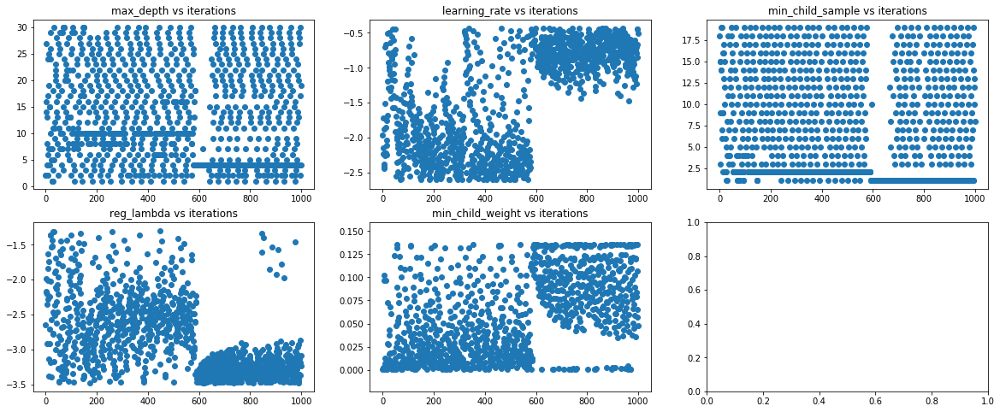

In [54]:
f, ax = plt.subplots(2, 3, figsize=(20,8))
ax = ax.reshape(-1)
ax[0].scatter(tpe_results['iteration'], tpe_results['max_depth']+1)
ax[0].set_title('max_depth vs iterations')
ax[1].scatter(tpe_results['iteration'], np.log10(np.array(tpe_results['learning_rate'].values, dtype='float')))
ax[1].set_title('learning_rate vs iterations')
ax[2].scatter(tpe_results['iteration'], tpe_results['min_child_samples']+1)
ax[2].set_title('min_child_sample vs iterations')
ax[3].scatter(tpe_results['iteration'], np.log10(np.array(tpe_results['reg_lambda'].values, dtype='float')))
ax[3].set_title('reg_lambda vs iterations')
ax[4].scatter(tpe_results['iteration'], np.log10(np.array(tpe_results['min_child_weight'].values + 1, dtype='float')))
ax[4].set_title('min_child_weight vs iterations')
# ax[5].scatter(np.log10(np.array(results_df['param_learning_rate'].values, dtype='float')), results_df['mean_fit_time'].values)
# ax[5].set_title('fit time vs learning_rate')

Text(0.5, 1.0, 'min_child_weight histogram')

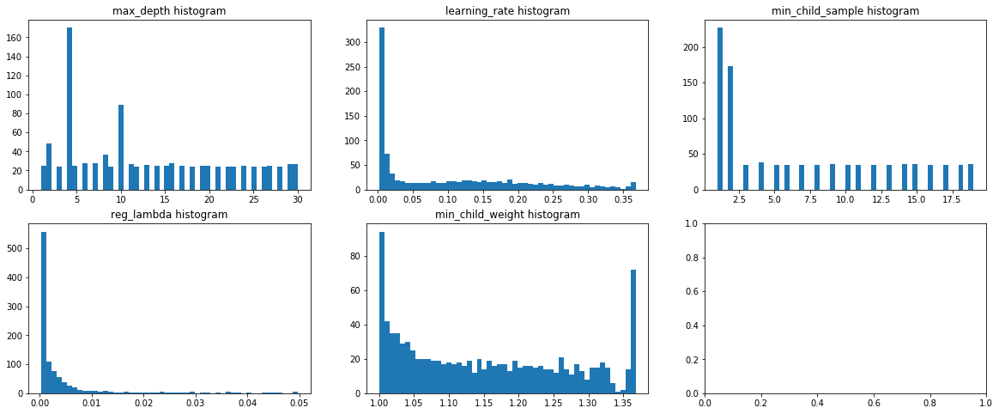

In [31]:
f, ax = plt.subplots(2, 3, figsize=(20,8))
ax = ax.reshape(-1)
ax[0].hist(tpe_results['max_depth']+1, 50)
ax[0].set_title('max_depth histogram')
ax[1].hist(tpe_results['learning_rate'], 50)
ax[1].set_title('learning_rate histogram')
ax[2].hist(tpe_results['min_child_samples']+1, 50)
ax[2].set_title('min_child_sample histogram')
ax[3].hist(tpe_results['reg_lambda'], 50)
ax[3].set_title('reg_lambda histogram')
ax[4].hist(tpe_results['min_child_weight']+1, 50)
ax[4].set_title('min_child_weight histogram')

Text(0.5, 1.0, 'min_child_weight histogram')

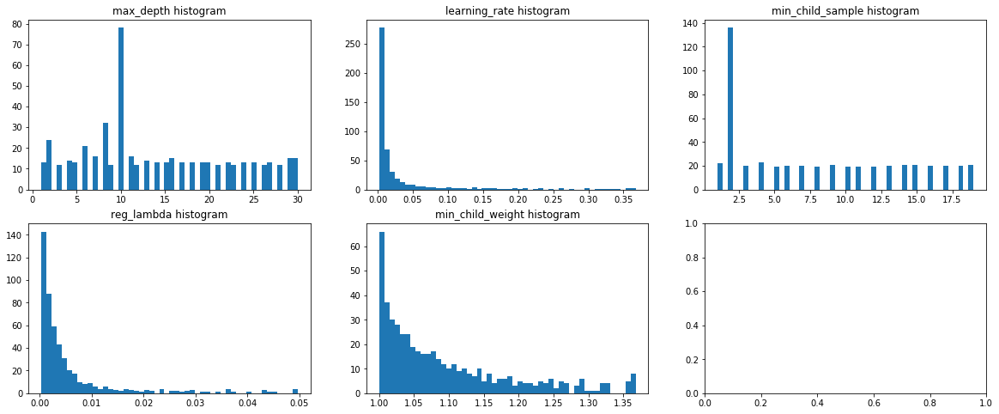

In [35]:
N = 500
f, ax = plt.subplots(2, 3, figsize=(20,8))
ax = ax.reshape(-1)
ax[0].hist(tpe_results['max_depth'][:N]+1, 50)
ax[0].set_title('max_depth histogram')
ax[1].hist(tpe_results['learning_rate'][:N], 50)
ax[1].set_title('learning_rate histogram')
ax[2].hist(tpe_results['min_child_samples'][:N]+1, 50)
ax[2].set_title('min_child_sample histogram')
ax[3].hist(tpe_results['reg_lambda'][:N], 50)
ax[3].set_title('reg_lambda histogram')
ax[4].hist(tpe_results['min_child_weight'][:N]+1, 50)
ax[4].set_title('min_child_weight histogram')

Text(0.5, 1.0, 'min_child_weight histogram')

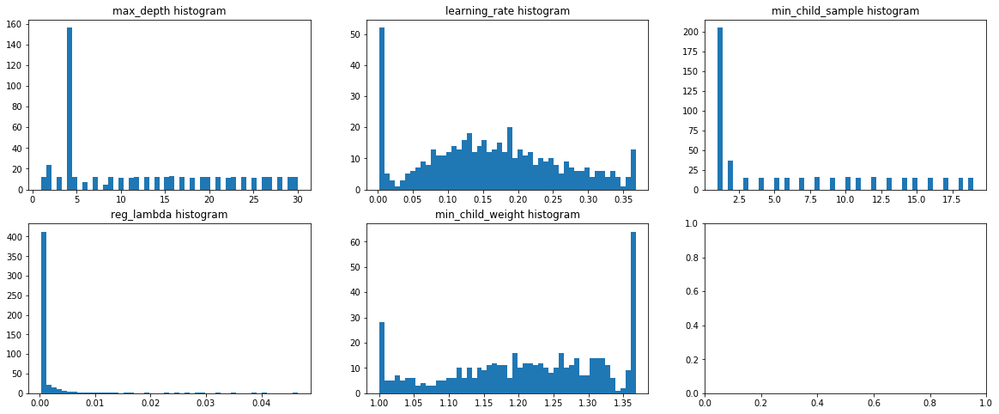

In [36]:
N = 500
f, ax = plt.subplots(2, 3, figsize=(20,8))
ax = ax.reshape(-1)
ax[0].hist(tpe_results['max_depth'][N:]+1, 50)
ax[0].set_title('max_depth histogram')
ax[1].hist(tpe_results['learning_rate'][N:], 50)
ax[1].set_title('learning_rate histogram')
ax[2].hist(tpe_results['min_child_samples'][N:]+1, 50)
ax[2].set_title('min_child_sample histogram')
ax[3].hist(tpe_results['reg_lambda'][N:], 50)
ax[3].set_title('reg_lambda histogram')
ax[4].hist(tpe_results['min_child_weight'][N:]+1, 50)
ax[4].set_title('min_child_weight histogram')

In [14]:
clf = LGBMClassifier(
        n_estimators=2000,
        **best
    )

In [16]:
fit_params={"early_stopping_rounds":100, 
            "eval_set" : [(X_val, y_val)],
            'verbose': 100,
           }

In [17]:
clf.fit(X_train, y_train, **fit_params)

Training until validation scores don't improve for 100 rounds.
[100]	valid_0's binary_logloss: 0.688871
Early stopping, best iteration is:
[29]	valid_0's binary_logloss: 0.440506


LGBMClassifier(boosting_type='gbdt', class_weight=None, colsample_bytree=1.0,
               importance_type='split', learning_rate=0.34354644754470653,
               max_depth=2, min_child_samples=2,
               min_child_weight=0.1031928806667034, min_split_gain=0.0,
               n_estimators=2000, n_jobs=-1, num_leaves=31, objective=None,
               random_state=None, reg_alpha=0.0,
               reg_lambda=0.003548269540500941, silent=True, subsample=1.0,
               subsample_for_bin=200000, subsample_freq=0)

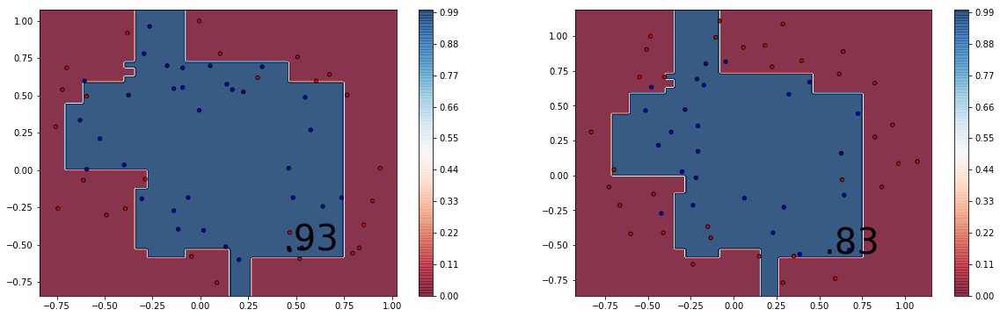

In [20]:
score_train = clf.score(X_train, y_train)
score_test = clf.score(X_val, y_val)
# Graficamos probabilidades en el plano de la combinación de todos los clasificadores
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,6))
RHelper.plot_boundaries(X_train, y_train, score_train, clf.predict,  mesh_res=200, ax=ax1, bound_line=False)
RHelper.plot_boundaries(X_val, y_val, score_test, clf.predict,  mesh_res=200, ax=ax2, bound_line=False)